In [6]:
import os
os.chdir('/Users/furuku/Documents/thesis/2020 Thesis - O_D Data ')
os.getcwd()

'/Users/furuku/Documents/thesis/2020 Thesis - O_D Data '

In [3]:
import pandas as pd
import numpy as np
import json
import networkx as nx
import seaborn as sns
from nested_dict import nested_dict
import statsmodels.api as sm
from sklearn import preprocessing
from sklearn.metrics.pairwise import cosine_similarity
from tslearn.generators import random_walks
from tslearn.clustering import TimeSeriesKMeans
from tslearn.utils import to_time_series_dataset
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from numpy import loadtxt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras.callbacks import EarlyStopping

/Users/furuku/anaconda3/lib/python3.7/site-packages/tslearn/clustering/kmeans.py:17: UserWarning: Scikit-learn <0.24 will be deprecated in a future release of tslearn
  "Scikit-learn <0.24 will be deprecated in a "
Using TensorFlow backend.


In [4]:
from elasticsearch import Elasticsearch 
from elasticsearch.helpers import streaming_bulk
from elasticsearch.helpers import scan

es=Elasticsearch([{'host':'localhost','port':9200}])
es

<Elasticsearch([{'host': 'localhost', 'port': 9200}])>

In [4]:
def make_link(each_route):
    edge_stop = pd.DataFrame(columns=['node1', 'node2', 'passenger','count'])
    overall = pd.DataFrame(columns=['node1', 'node2', 'passenger','count'])
    name = ['non_stop','Stop1','Stop2','Stop3']
    group = {}
    for tran in range(len(name)):
        
        edge_stop = pd.DataFrame(columns=['node1', 'node2', 'passenger'])
        for i in range (0,tran+1):
            add_data = each_route[tran].iloc[:, i:i+2]
#             print(add_data.columns)
            add_data['passenger'] = each_route[tran]['passenger']
            add_data['count'] = each_route[tran]['count']
            lis_node = list(add_data.columns)
            add_data = add_data.rename(columns={lis_node[0]: "node1", lis_node[1]: "node2"})
            edge_stop = edge_stop.append(add_data)
            overall = overall.append(add_data)

        if edge_stop.shape[0] != 0:


            group[name[tran]] = edge_stop.groupby(["node1", "node2"])[['passenger','count']].apply(lambda x : x.astype(int).sum()).reset_index().sort_values('passenger', ascending=False)
        else:
            group[name[tran]] = pd.DataFrame(columns=['node1', 'node2', 'passenger','count'])

    if overall.shape[0] != 0:
        overall = overall.groupby(["node1", "node2"])[['passenger','count']].apply(lambda x : x.astype(int).sum()).reset_index().sort_values('passenger', ascending=False)
    else:
        overall = pd.DataFrame(columns=['node1', 'node2', 'passenger','count'])


    return group,overall

In [5]:
def property_graph(overall):
    # ans = overall.groupby(["node1", "node2"]).sum().reset_index().sort_values('passenger', ascending=False)
    
    G=nx.from_pandas_edgelist(overall, 'node1', 'node2' ,create_using=nx.DiGraph())

    node_in = overall.groupby(["node1"])[['passenger']].apply(lambda x : x.astype(int).sum())
    node_out = overall.groupby(["node2"])[['passenger']].apply(lambda x : x.astype(int).sum())
    
    node_in = pd.Series(node_in['passenger'].values,index=node_in.index).to_dict()
    node_out = pd.Series(node_out['passenger'].values,index=node_out.index).to_dict()
    degree_in = dict(G.in_degree())
    degree_out = dict(G.out_degree()) 
    closeness = nx.closeness_centrality(G)
    betweenness = nx.betweenness_centrality(G, normalized = True) 
    eigenvector = nx.eigenvector_centrality(G)

    

    # print(G.in_degree())

    ds = [degree_in,degree_out,node_in,node_out,closeness,betweenness,eigenvector]


    return ds 

In [6]:
def union(lis1,lis2):
    set1 = set(lis1)
    set2 = set(lis2)
    
    return list(set1.union(set2))

In [7]:
def select_stop(y2017_foreign):
    non_stop = y2017_foreign[y2017_foreign['Stop1'].isnull() & y2017_foreign['Stop2'].isnull() & y2017_foreign['Stop3'].isnull() & y2017_foreign['passenger'].notnull()].sort_values('passenger', ascending=False) 
    non_stop.drop(['Stop1','Stop2','Stop3'],axis=1, inplace=True)
    
    stop1 = y2017_foreign[y2017_foreign['Stop1'].notnull() & y2017_foreign['Stop2'].isnull() & y2017_foreign['Stop3'].isnull() & y2017_foreign['passenger'].notnull()].sort_values('passenger', ascending=False) 
    stop1.drop(['Stop2','Stop3'],axis=1, inplace=True)

    stop2 = y2017_foreign[y2017_foreign['Stop1'].notnull() & y2017_foreign['Stop2'].notnull() & y2017_foreign['Stop3'].isnull() & y2017_foreign['passenger'].notnull()].sort_values('passenger', ascending=False) 
    stop2.drop(['Stop3'],axis=1, inplace=True)
    
    stop3 = y2017_foreign[y2017_foreign['Stop1'].notnull() & y2017_foreign['Stop2'].notnull() & y2017_foreign['Stop3'].notnull() & y2017_foreign['passenger'].notnull()].sort_values('passenger', ascending=False) 

    return [non_stop, stop1, stop2, stop3]

In [8]:
def sum_passenger(sin_direct):
    sin_direct['passenger'] = sin_direct.groupby(['Orig', 'Stop1','Stop2','Stop3','Dest'], dropna=False)['passenger'].transform('sum')
    tmp = sin_direct.groupby(['Orig', 'Stop1','Stop2','Stop3','Dest'], dropna=False)['passenger'].transform('count')
    sin_direct.insert(6, column='count', value=tmp)
    # print(sin_direct)
    sin_direct = sin_direct.drop_duplicates()
    sin_direct = sin_direct.sort_values('passenger', ascending=False)
    
    return sin_direct

In [9]:
# y2018 = pd.read_excel("../2020 Thesis - Thailand Schdeule 2005-2019/2018_Schedule_Daily_Extract_Report_7912.xlsx")
# y2019 = pd.read_excel("../2020 Thesis - Thailand Schdeule 2005-2019/2019_Schedule_Daily_Extract_Report_8030.xlsx")

In [7]:
country = pd.read_excel("../2020 Thesis - Thailand Schdeule 2005-2019/1.-Airport_Lookup_Country-Region.xlsx")
thai = pd.read_excel("../2020 Thesis - Thailand Schdeule 2005-2019/Thailand_Airport_Lookup.xlsx")

data_airport = country.append(thai)
region = data_airport[['Code', 'Global Region','Country Name']]

region = region.drop_duplicates()
region = region.set_index('Code')
region = region.dropna()
    

In [11]:
# lis1 = list(y2019.Orig.unique())
# lis2 = list(y2019.Dest.unique())
# lis3 = list(y2018.Orig.unique())
# lis4 = list(y2018.Dest.unique())
# tmp1 = union(lis1,lis2)
# tmp2 = union(lis3,lis4)
# arrive = union(tmp1,tmp2)
# arrive.remove('BKK')

In [12]:
# len(arrive)

In [13]:
es.ping()

True

In [14]:
query_body = {
 
}

In [15]:


index = ['y2005','y2006','y2007','y2008','y2009','y2010','y2011',
         'y2012','y2013','y2014','y2015','y2016','y2017','y2018',
         'y2019']

table = {}

for i in index:
    
    results_gen = scan(
        es,
        query=query_body,
        index=i,
    )
    
    results_gen_stop = scan(
        es,
        query=query_body,
        index=i + '_stop',
    )

    results = list(results_gen)
    results_stop = list(results_gen_stop)
    data = pd.DataFrame([i['_source'] for i in results])
    data_stop = pd.DataFrame([i['_source'] for i in results_stop])
    
    data = data.append(data_stop, ignore_index=True)
    data = data.drop(columns=['Travel Month'])
    data = sum_passenger(data)
    
    table[i] = data



 

In [16]:
index_bank = ['bank_y2005','bank_y2006','bank_y2007','bank_y2008','bank_y2009','bank_y2010','bank_y2011',
         'bank_y2012','bank_y2013','bank_y2014','bank_y2015','bank_y2016','bank_y2017','bank_y2018',
         'bank_y2019']

table_bank = {}

for i in index_bank:
    
    results_gen = scan(
        es,
        query=query_body,
        index=i,
    )
        
    results = list(results_gen)
    data = pd.DataFrame([i['_source'] for i in results])
    table_bank[i] = data

In [17]:
lis = ['Orig','Dest']
arrive = []

for idx in index_bank:
    
    for i in range(len(lis)):
        
        tmp = list(table_bank[idx][table_bank[idx][lis[i]] == 'BKK'][lis[i-1]].unique())
        
        arrive = union(arrive,tmp)


In [18]:
len(arrive)

267

In [19]:
arrive.sort()
arrive.remove('PYX-SIN')
arrive


['ADD',
 'AKL',
 'ALA',
 'AMD',
 'AMM',
 'AMS',
 'ARN',
 'ASB',
 'ATH',
 'ATQ',
 'AUH',
 'AYT',
 'BAH',
 'BBI',
 'BFV',
 'BHY',
 'BKI',
 'BLR',
 'BNE',
 'BOM',
 'BQS',
 'BRU',
 'BUD',
 'BWN',
 'CAI',
 'CAN',
 'CCU',
 'CDG',
 'CEB',
 'CEI',
 'CEK',
 'CGK',
 'CGN',
 'CGO',
 'CGP',
 'CGQ',
 'CJJ',
 'CJU',
 'CKG',
 'CMB',
 'CNX',
 'CPH',
 'CRK',
 'CSX',
 'CTS',
 'CTU',
 'CXR',
 'CZX',
 'DAC',
 'DAD',
 'DAT',
 'DEL',
 'DLC',
 'DLI',
 'DME',
 'DMK',
 'DOH',
 'DPS',
 'DSN',
 'DUS',
 'DXB',
 'DYG',
 'DYU',
 'FCO',
 'FNJ',
 'FOC',
 'FRA',
 'FUK',
 'GAU',
 'GAY',
 'GOJ',
 'GYD',
 'HAK',
 'HAN',
 'HDY',
 'HEL',
 'HFE',
 'HGH',
 'HGN',
 'HHQ',
 'HIJ',
 'HKG',
 'HKT',
 'HND',
 'HPH',
 'HRB',
 'HRI',
 'HYD',
 'ICN',
 'IKA',
 'IKT',
 'INC',
 'ISB',
 'IST',
 'IXB',
 'IXC',
 'JAI',
 'JED',
 'JFK',
 'JHB',
 'JHG',
 'JJN',
 'JNB',
 'KBP',
 'KBV',
 'KDT',
 'KEJ',
 'KGS',
 'KHH',
 'KHI',
 'KHN',
 'KHV',
 'KIX',
 'KJA',
 'KKC',
 'KMG',
 'KOP',
 'KOS',
 'KTM',
 'KUF',
 'KUL',
 'KWE',
 'KWI',
 'KWL',
 'KZN',


In [20]:
table['y2019']

,Orig,Stop1,Stop2,Stop3,Dest,passenger,count,Region_orig,country_orig,Region_dest,country_dest
672,HKG,None,None,None,BKK,1467156,174,Asia,Hong Kong,Asia,Thailand
674,BKK,None,None,None,HKG,1445880,174,Asia,Thailand,Asia,Hong Kong
2305,BKK,None,None,None,SIN,1307901,147,Asia,Thailand,Asia,Singapore
2304,SIN,None,None,None,BKK,1264592,146,Asia,Singapore,Asia,Thailand
950,HKT,None,None,None,BKK,1180106,231,Asia,Thailand,Asia,Thailand
...,...,...,...,...,...,...,...,...,...,...,...
192985,GFK,MSP,ICN,None,BKK,1,1,North America,United States,Asia,Thailand
192976,BJI,MSP,ICN,None,BKK,1,1,North America,United States,Asia,Thailand
192885,BKK,ICN,SEA,YYC,YMM,1,1,Asia,Thailand,North America,Canada
192883,BKK,ICN,SEA,SLC,CPR,1,1,Asia,Thailand,North America,United States


<AxesSubplot:>

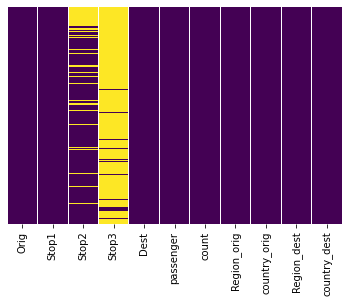

In [21]:
sns.heatmap(table['y2019'].isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [22]:
# lis1 = list(table['y2018'].Orig.unique())
# lis2 = list(table['y2018'].Dest.unique())
# arrive = union(lis1,lis2)
# arrive.remove('BKK')

In [23]:
len(arrive)

266

In [24]:
index = ['y2005','y2006','y2007','y2008','y2009','y2010','y2011',
         'y2012','y2013','y2014','y2015','y2016','y2017','y2018',
         'y2019']

property_g = {}
col = list(table['y2019'].columns)

dep_stop = nested_dict(3, int)
dep_dest = nested_dict(3, int)
sum_stop = nested_dict(3, int)

bkk_stop = nested_dict(3, int)
bkk_dest = nested_dict(3, int)
sum_stop = nested_dict(3, int)

for idx in index:

    lis = select_stop(table[idx])
    group, overall = make_link(lis)
    
    node = pd.DataFrame(property_graph(overall)).T
    node = node.rename(columns={0: "degree_in", 1: "degree_out", 2: "node_in", 3: "node_out",4:'closeness',5:'betweenness',6:'eigenvector'}).fillna(0)
    
    property_g[idx] = node
    edge_stop = pd.DataFrame(columns=['node1', 'node2', 'passenger'])
    
    for arr in arrive:
        for i in range(2,6):
#             print(arr, col[i-1],i)
            start = table[idx][(table[idx][col[i-2]] == arr)]
            bkk_stop[idx][arr][col[i-2]] = start[start[col[i-1]].notnull() & (start[col[i-1]] == 'BKK')]
            bkk_dest[idx][arr][col[i-2]] = start[~start[col[i-1]].notnull() & (start['Dest'] == 'BKK')]

            if (i-2 == 3):
                bkk_dest[idx][arr][col[i-2]] = bkk_stop[idx][arr][col[i-2]]
                bkk_stop[idx][arr][col[i-2]] = pd.DataFrame(columns=list(table[idx].columns))


#             add_data = bkk_stop[idx][arr][col[i-2]].iloc[:, i-1:i+1]
#             lis_node = list(add_data.columns)
#             add_data['passenger'] = bkk_stop[idx][arr][col[i-2]]['passenger']
#             add_data = add_data.rename(columns={lis_node[0]: "node1", lis_node[1]: "node2"})
#             edge_stop = edge_stop.append(add_data)
            
            start = table[idx][(table[idx][col[i-2]] == 'BKK')]
            dep_stop[idx][arr][col[i-2]] = start[start[col[i-1]].notnull() & (start[col[i-1]] == arr)]
            dep_dest[idx][arr][col[i-2]] = start[~start[col[i-1]].notnull() & (start['Dest'] == arr)]

            if (i-2 == 3):
                dep_dest[idx][arr][col[i-2]] = dep_stop[idx][arr][col[i-2]]
                dep_stop[idx][arr][col[i-2]] = pd.DataFrame(columns=list(table[idx].columns))

            
#             add_data = dep_stop[idx][arr][index[i-2]].iloc[:, i-1:i+1]
#             add_data['passenger'] = dep_stop[idx][arr][index[i-2]]['passenger']
#             lis_node = list(add_data.columns)
#             add_data = add_data.rename(columns={lis_node[0]: "node1", lis_node[1]: "node2"})
#             edge_stop = edge_stop.append(add_data)

In [25]:
property_g['y2010']

,degree_in,degree_out,node_in,node_out,closeness,betweenness,eigenvector
HKT,21.0,18.0,1390471.0,1330529.0,0.339696,0.001996,2.817891e-02
BKK,170.0,162.0,19843740.0,20031115.0,0.459765,0.143970,1.863694e-01
SIN,101.0,102.0,1223758.0,1252776.0,0.422239,0.055779,1.346026e-01
HKG,107.0,96.0,1116552.0,1071351.0,0.421582,0.044174,1.290365e-01
CNX,8.0,9.0,921364.0,960345.0,0.313022,0.003612,8.805213e-03
...,...,...,...,...,...,...,...
ATY,1.0,0.0,0.0,1.0,0.256422,0.000000,1.671405e-03
ALO,0.0,1.0,1.0,0.0,0.000000,0.000000,5.516303e-31
GAN,0.0,1.0,1.0,0.0,0.000000,0.000000,5.516303e-31
RLG,1.0,0.0,0.0,1.0,0.280538,0.000000,4.324262e-03


In [26]:
bkk_dest['y2015']['SIN'][col[2]]

,Orig,Stop1,Stop2,Stop3,Dest,passenger,count,Region_orig,country_orig,Region_dest,country_dest
1930,TSV,BNE,SIN,None,BKK,151,33,Australasia,Australia,Asia,Thailand
1931,HBA,MEL,SIN,None,BKK,112,29,Australasia,Australia,Asia,Thailand
1950,CNS,BNE,SIN,None,BKK,106,29,Australasia,Australia,Asia,Thailand
8992,WLG,AKL,SIN,None,BKK,87,20,Australasia,New Zealand,Asia,Thailand
17564,WLG,CHC,SIN,None,BKK,70,13,Australasia,New Zealand,Asia,Thailand
...,...,...,...,...,...,...,...,...,...,...,...
98533,MXP,FRA,SIN,None,BKK,1,1,Europe,Italy,Asia,Thailand
117095,LIN,FRA,SIN,None,BKK,1,1,Europe,Italy,Asia,Thailand
110159,BRE,CPH,SIN,None,BKK,1,1,Europe,Germany,Asia,Thailand
17574,SKG,ATH,SIN,None,BKK,1,1,Europe,Greece,Asia,Thailand


In [27]:
bkk_dest['y2005']['IXB'][col[3]]

,Orig,Stop1,Stop2,Stop3,Dest,passenger,count,Region_orig,country_orig,Region_dest,country_dest


In [28]:
by_c = ['BY_0','BY_1','BY_2','BY_0_T','BY_1_T','BY_2_T','BY_3']
beyond = nested_dict(3, int)

for idx in index:
    for arr in arrive:
        for i in range(0,4):

#             su_d = bkk_dest[idx][arr][col[i]]['passenger'].sum()
#             su_t = bkk_stop[idx][arr][col[i]]['passenger'].sum()
            
#             print(i,by_c[i],by_c[i+3],arr,col[i])

            if (i != 3):
                beyond[idx][arr][by_c[i]] = bkk_dest[idx][arr][col[i]]['passenger'].sum()
                beyond[idx][arr][by_c[i+3]] = bkk_stop[idx][arr][col[i]]['passenger'].sum()

            else:
                beyond[idx][arr][by_c[6]] = bkk_dest[idx][arr][col[i]]['passenger'].sum()

In [29]:
bkk_dest[idx]["PNH"][col[0]]

,Orig,Stop1,Stop2,Stop3,Dest,passenger,count,Region_orig,country_orig,Region_dest,country_dest
935,PNH,None,None,None,BKK,389749,169,Asia,Cambodia,Asia,Thailand


In [30]:
col = list(table['y2019'].columns)
col

['Orig',
 'Stop1',
 'Stop2',
 'Stop3',
 'Dest',
 'passenger',
 'count',
 'Region_orig',
 'country_orig',
 'Region_dest',
 'country_dest']

In [31]:
dep_stop[idx]['HKT'][col[1]]

,Orig,Stop1,Stop2,Stop3,Dest,passenger,count,Region_orig,country_orig,Region_dest,country_dest
360474,URT,BKK,HKT,None,HKG,21,3,Asia,Thailand,Asia,Hong Kong
249935,CNX,BKK,HKT,None,SIN,13,13,Asia,Thailand,Asia,Singapore
250608,KKC,BKK,HKT,None,SIN,13,13,Asia,Thailand,Asia,Singapore
250607,UBP,BKK,HKT,None,SIN,12,12,Asia,Thailand,Asia,Singapore
249936,DAD,BKK,HKT,None,SIN,10,10,Asia,Vietnam,Asia,Singapore
249937,DLI,BKK,HKT,None,SIN,6,6,Asia,Vietnam,Asia,Singapore
399700,CEI,BKK,HKT,None,UTP,5,1,Asia,Thailand,Asia,Thailand
271313,VTE,BKK,HKT,None,SIN,5,5,Asia,Laos,Asia,Singapore
250614,CNX,BKK,HKT,None,SGN,5,5,Asia,Thailand,Asia,Vietnam
271307,UTH,BKK,HKT,None,SIN,4,4,Asia,Thailand,Asia,Singapore


In [32]:
co = pd.DataFrame(columns = ['Orig', 'Stop1', 'Stop2', 'Stop3', 'Dest', 'passenger', 'count',
       'Region_orig', 'country_orig', 'Region_dest', 'country_dest'])
BH = ['BH_0','BH_1','BH_2','BH_0_T','BH_1_T','BH_2_T','BH_3']
TrueDest = nested_dict(3, int)

for idx in index:
    for i in BH:
        for arr in arrive:
            TrueDest[idx][i][arr] = co.copy()
    
TrueDest

nested_dict(<function nested_dict.implementation._nested_levels.<locals>.<lambda>()>,
            {'y2005': _recursive_dict(<function nested_dict.implementation._nested_levels.<locals>.<lambda>()>,
                             {'BH_0': _recursive_dict(int,
                                              {'ADD': Empty DataFrame
                                               Columns: [Orig, Stop1, Stop2, Stop3, Dest, passenger, count, Region_orig, country_orig, Region_dest, country_dest]
                                               Index: [],
                                               'AKL': Empty DataFrame
                                               Columns: [Orig, Stop1, Stop2, Stop3, Dest, passenger, count, Region_orig, country_orig, Region_dest, country_dest]
                                               Index: [],
                                               'ALA': Empty DataFrame
                                               Columns: [Orig, Stop1, Stop2, Stop3, Dest, pas

In [33]:
idd = 0

In [34]:
BH = ['BH_0','BH_1','BH_2','BH_0_T','BH_1_T','BH_2_T','BH_3']
# arrive = list(y2019.Dest.unique())
behind = nested_dict(3, int)

for idx in index:
    for arr in arrive:
#         print(arr)
        for inx in range(0,4):
#             print(idx,arr,inx)

            dep_stop[idx][arr][col[inx]].reset_index(inplace = True, drop = True)

            for idd ,row in dep_stop[idx][arr][col[inx]].iterrows():
        

                check = 5 - (inx+2) - row.isnull().sum()

                if inx == 0:

                    if check == 0:
                        behind[idx]['BH_0'][arr] += row['passenger']
                        if dep_stop[idx][arr][col[inx]].shape[0] != 0:
                            TrueDest[idx]['BH_0'][arr] = TrueDest[idx]['BH_0'][arr].append(dep_stop[idx][arr][col[inx]].iloc[idd]) 

                    elif check == 1:
                        behind[idx]['BH_1'][arr] += row['passenger']
                        if dep_stop[idx][arr][col[inx]].shape[0] != 0:
                            TrueDest[idx]['BH_1'][arr] = TrueDest[idx]['BH_1'][arr].append(dep_stop[idx][arr][col[inx]].iloc[idd])

                    elif check == 2:
                        behind[idx]['BH_2'][arr] += row['passenger']
                        if dep_stop[idx][arr][col[inx]].shape[0] != 0:
                            TrueDest[idx]['BH_2'][arr] = TrueDest[idx]['BH_2'][arr].append(dep_stop[idx][arr][col[inx]].iloc[idd])

                    elif check == 3:
                        behind[idx]['BH_3'][arr] += row['passenger']
                        if dep_stop[idx][arr][col[inx]].shape[0] != 0:
                            TrueDest[idx]['BH_3'][arr] = TrueDest[idx]['BH_3'][arr].append(dep_stop[idx][arr][col[inx]].iloc[idd])

                else:
                    if check == 0:
                        behind[idx]['BH_0_T'][arr] += row['passenger']
                        if dep_stop[idx][arr][col[inx]].shape[0] != 0:
                            TrueDest[idx]['BH_0_T'][arr] = TrueDest[idx]['BH_0_T'][arr].append(dep_stop[idx][arr][col[inx]].iloc[idd])

                    elif check == 1:
                        behind[idx]['BH_1_T'][arr] += row['passenger']
                        if dep_stop[idx][arr][col[inx]].shape[0] != 0:
                            TrueDest[idx]['BH_1_T'][arr] = TrueDest[idx]['BH_1_T'][arr].append(dep_stop[idx][arr][col[inx]].iloc[idd])

                    elif check == 2:
                        behind[idx]['BH_2_T'][arr] += row['passenger']
                        if dep_stop[idx][arr][col[inx]].shape[0] != 0:
                            TrueDest[idx]['BH_2_T'][arr] = TrueDest[idx]['BH_2_T'][arr].append(dep_stop[idx][arr][col[inx]].iloc[idd])

            if inx == 0:
        #         print(8)
        #         print(dep_dest['SIN'][index[inx]]['passenger'].sum())
                behind[idx]['BH_0'][arr] += dep_dest[idx][arr][col[inx]]['passenger'].sum()
                TrueDest[idx]['BH_0'][arr] = TrueDest[idx]['BH_0'][arr].append(dep_dest[idx][arr][col[inx]])


            else:
        #         print(9)
                behind[idx]['BH_0_T'][arr] += dep_dest[idx][arr][col[inx]]['passenger'].sum()
                TrueDest[idx]['BH_0_T'][arr] = TrueDest[idx]['BH_0_T'][arr].append(dep_dest[idx][arr][col[inx]])

    

In [35]:
TrueDest[idx]['BH_0_T']['SIN'].columns

# dep_stop[idx][arr][col[inx]]

Index(['Orig', 'Stop1', 'Stop2', 'Stop3', 'Dest', 'passenger', 'count',
       'Region_orig', 'country_orig', 'Region_dest', 'country_dest'],
      dtype='object')

In [36]:
TrueDestCom = nested_dict(3, int)

for idx in index:
    for arr in arrive:
        for i in BH:
            TrueDestCom[idx][i][arr] = TrueDest[idx][i][arr]['passenger'].sum()

In [37]:
pd.DataFrame()

""


In [38]:
dep_stop[idx]['SIN'][col[0]]

,Orig,Stop1,Stop2,Stop3,Dest,passenger,count,Region_orig,country_orig,Region_dest,country_dest
0,BKK,SIN,None,None,CGK,23949,42,Asia,Thailand,Asia,Indonesia
1,BKK,SIN,None,None,SUB,13172,93,Asia,Thailand,Asia,Indonesia
2,BKK,SIN,None,None,DPS,9695,63,Asia,Thailand,Asia,Indonesia
3,BKK,SIN,None,None,BNE,8452,135,Asia,Thailand,Australasia,Australia
4,BKK,SIN,None,None,MEL,8321,145,Asia,Thailand,Australasia,Australia
...,...,...,...,...,...,...,...,...,...,...,...
648,BKK,SIN,LHR,None,MAN,1,1,Asia,Thailand,Europe,United Kingdom
649,BKK,SIN,LHR,None,GLA,1,1,Asia,Thailand,Europe,United Kingdom
650,BKK,SIN,LHR,None,GVA,1,1,Asia,Thailand,Europe,Switzerland
651,BKK,SIN,KUL,None,PEN,1,1,Asia,Thailand,Asia,Malaysia


In [39]:
information = property_g.copy()

In [40]:
information

{'y2005':      degree_in  degree_out     node_in    node_out  closeness  betweenness  \
 BKK      185.0       201.0  18481269.0  18443653.0   0.446977     0.127946   
 SIN      108.0       110.0   1593360.0   1649556.0   0.410139     0.041987   
 HKG      106.0       118.0   1457883.0   1408727.0   0.405911     0.032591   
 HKT       21.0         8.0   1246277.0   1035288.0   0.341069     0.000572   
 CNX       17.0        18.0   1076157.0   1136711.0   0.315954     0.001584   
 ..         ...         ...         ...         ...        ...          ...   
 MNK        1.0         0.0         0.0         1.0   0.297287     0.000000   
 ZID        1.0         0.0         0.0         1.0   0.235087     0.000000   
 LNJ        0.0         1.0         1.0         0.0   0.000000     0.000000   
 RKT        0.0         1.0         1.0         0.0   0.000000     0.000000   
 DIU        0.0         1.0         1.0         0.0   0.000000     0.000000   
 
       eigenvector  
 BKK  1.792807e-01  

In [41]:
NodeOut = nested_dict(2, int)   
min_max_scaler = preprocessing.MinMaxScaler()
for idx in index:
    data_beyond = pd.DataFrame.from_dict(beyond[idx]).T
    data_behind = pd.DataFrame.from_dict(behind[idx]).fillna(0)
    
    
    tmp = data_behind.join(data_beyond)
    property_g[idx] = tmp.join(property_g[idx])
    property_g[idx] = property_g[idx].fillna(0)
    
    information[idx] = tmp.join(information[idx])
    information[idx] = information[idx].fillna(0)
    
#     NodeOut[idx] = property_g[idx][['node_out']] + property_g[idx][['node_in']]
    NodeOut[idx]['Out'] = pd.DataFrame(property_g[idx]['node_out'],columns = ['node_out'])
    NodeOut[idx]['OutIn'] = pd.DataFrame(property_g[idx]['node_in'] + property_g[idx]['node_out'],columns = ['node_out'])
    
    
    x = property_g[idx].values

    x_scaled = min_max_scaler.fit_transform(x)
    property_g[idx] = pd.DataFrame(x_scaled, columns = property_g[idx].columns,index=property_g[idx].index )
    
#     property_g[idx] = property_g[idx].join(data_beyond)
#     property_g[idx] = property_g[idx].join(data_behind)
    
    
    
    
    
    

In [42]:
pd.DataFrame(property_g[idx]['node_in'] + property_g[idx]['node_out'],columns = ['node_out'])
# property_g[idx][['node_out']]

,node_out
ADD,0.090259
AKL,0.110617
ALA,0.046415
AMD,0.075843
AMM,0.112416
...,...
YIW,0.003025
ZGC,0.000129
ZHA,0.000919
ZVK,0.004881


In [43]:
# property_g[idx][['BY_0',
#        'BY_0_T', 'BY_1', 'BY_1_T', 'BY_2', 'BY_2_T', 'BY_3']]

In [ ]:
# property_g[idx][['BH_1', 'BH_2', 'BH_0', 'BH_1_T', 'BH_0_T', 'BH_3', 'BH_2_T']]


In [44]:
property_g['y2005']
information['y2005']

,BH_1,BH_2,BH_0,BH_1_T,BH_2_T,BH_0_T,BH_3,BY_0,BY_0_T,BY_1,...,BY_2,BY_2_T,BY_3,degree_in,degree_out,node_in,node_out,closeness,betweenness,eigenvector
ADD,10925.0,34.0,9560,224.0,1.0,1196,0.0,10247,1495,8477,...,27,0,1,31.0,31.0,31812.0,30896.0,0.317151,5.428154e-03,0.023446
AKL,4572.0,40.0,29538,2368.0,77.0,19847,13.0,32055,19068,6899,...,68,40,3,41.0,45.0,79322.0,78940.0,0.336525,1.773115e-02,0.036776
ALA,944.0,0.0,4067,0.0,0.0,68,0.0,4584,206,706,...,15,0,0,13.0,16.0,6639.0,5955.0,0.327951,6.916504e-03,0.021290
AMM,13005.0,418.0,18072,868.0,2.0,12864,0.0,15698,13722,13815,...,338,0,0,36.0,37.0,60951.0,62565.0,0.345381,1.710641e-03,0.068902
AMS,94060.0,330.0,122648,3424.0,3.0,10506,0.0,117794,8210,98691,...,315,7,7,146.0,168.0,344919.0,351199.0,0.411147,4.399813e-02,0.174840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YTY,0.0,0.0,0,0.0,0.0,0,0.0,0,0,0,...,0,0,0,0.0,0.0,0.0,0.0,0.000000,0.000000e+00,0.000000
ZGC,0.0,0.0,0,0.0,0.0,0,0.0,0,0,0,...,0,0,0,1.0,1.0,3.0,3.0,0.229504,0.000000e+00,0.000401
ZHA,0.0,0.0,0,0.0,0.0,0,0.0,0,0,0,...,0,0,0,4.0,4.0,86.0,42.0,0.280003,5.503949e-07,0.004768
ZVK,0.0,0.0,0,0.0,0.0,0,0.0,0,0,0,...,0,0,0,0.0,0.0,0.0,0.0,0.000000,0.000000e+00,0.000000


In [45]:
ta1 = ['BY_0','BY_0_T', 'BY_1', 'BY_1_T', 'BY_2', 'BY_2_T', 'BY_3']
ta2 = ['BH_0', 'BH_0_T', 'BH_1', 'BH_1_T', 'BH_2', 'BH_2_T', 'BH_3']
for i in range(0,7):
    print(ta1[i],information['y2015'][ta1[i]].corr(information['y2015'][ta2[i]]))

    

BY_0 0.9990391918674865
BY_0_T 0.9866579823518978
BY_1 0.997251518253991
BY_1_T 0.9951582923854523
BY_2 0.995061394462563
BY_2_T 0.9771827300221502
BY_3 0.9800608723829863


In [46]:
staion = property_g['y2015'].index
test = pd.DataFrame()

for idx in index:
    
    test[idx] = property_g[idx].loc['ICN']
    
    
    
        
        
    

In [47]:
test.loc['closeness']

y2005    0.886270
y2006    0.887294
y2007    0.886999
y2008    0.916279
y2009    0.922567
y2010    0.951383
y2011    0.924545
y2012    0.928677
y2013    0.925468
y2014    0.964491
y2015    0.957073
y2016    0.954650
y2017    0.924886
y2018    0.930062
y2019    0.944998
Name: closeness, dtype: float64

<AxesSubplot:ylabel='BY_0'>

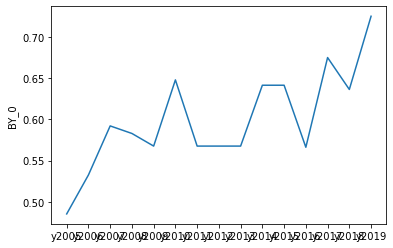

In [48]:
sns.lineplot(data=test.T, x=test.T.index, y='BY_0')

In [49]:
test.loc['BH_1']

y2005    0.089395
y2006    0.098147
y2007    0.052518
y2008    0.065977
y2009    0.113278
y2010    0.112204
y2011    0.113278
y2012    0.113278
y2013    0.113278
y2014    0.205232
y2015    0.205232
y2016    0.177705
y2017    0.165582
y2018    0.179984
y2019    0.204581
Name: BH_1, dtype: float64

In [50]:
arrive

['ADD',
 'AKL',
 'ALA',
 'AMD',
 'AMM',
 'AMS',
 'ARN',
 'ASB',
 'ATH',
 'ATQ',
 'AUH',
 'AYT',
 'BAH',
 'BBI',
 'BFV',
 'BHY',
 'BKI',
 'BLR',
 'BNE',
 'BOM',
 'BQS',
 'BRU',
 'BUD',
 'BWN',
 'CAI',
 'CAN',
 'CCU',
 'CDG',
 'CEB',
 'CEI',
 'CEK',
 'CGK',
 'CGN',
 'CGO',
 'CGP',
 'CGQ',
 'CJJ',
 'CJU',
 'CKG',
 'CMB',
 'CNX',
 'CPH',
 'CRK',
 'CSX',
 'CTS',
 'CTU',
 'CXR',
 'CZX',
 'DAC',
 'DAD',
 'DAT',
 'DEL',
 'DLC',
 'DLI',
 'DME',
 'DMK',
 'DOH',
 'DPS',
 'DSN',
 'DUS',
 'DXB',
 'DYG',
 'DYU',
 'FCO',
 'FNJ',
 'FOC',
 'FRA',
 'FUK',
 'GAU',
 'GAY',
 'GOJ',
 'GYD',
 'HAK',
 'HAN',
 'HDY',
 'HEL',
 'HFE',
 'HGH',
 'HGN',
 'HHQ',
 'HIJ',
 'HKG',
 'HKT',
 'HND',
 'HPH',
 'HRB',
 'HRI',
 'HYD',
 'ICN',
 'IKA',
 'IKT',
 'INC',
 'ISB',
 'IST',
 'IXB',
 'IXC',
 'JAI',
 'JED',
 'JFK',
 'JHB',
 'JHG',
 'JJN',
 'JNB',
 'KBP',
 'KBV',
 'KDT',
 'KEJ',
 'KGS',
 'KHH',
 'KHI',
 'KHN',
 'KHV',
 'KIX',
 'KJA',
 'KKC',
 'KMG',
 'KOP',
 'KOS',
 'KTM',
 'KUF',
 'KUL',
 'KWE',
 'KWI',
 'KWL',
 'KZN',


In [51]:
information['y2019']

,BH_1,BH_2,BH_3,BH_0,BH_1_T,BH_2_T,BH_0_T,BY_0,BY_0_T,BY_1,...,BY_2,BY_2_T,BY_3,degree_in,degree_out,node_in,node_out,closeness,betweenness,eigenvector
ADD,22326.0,1642.0,6.0,9892,17976.0,208.0,2452,13263,2135,22639,...,1336,140,13,96.0,105.0,98468.0,95125.0,0.387627,2.946635e-02,0.060763
AKL,2671.0,34.0,0.0,25588,2484.0,0.0,62890,25364,52210,2563,...,10,6,1,40.0,39.0,113602.0,123594.0,0.344557,1.342867e-02,0.026544
ALA,13755.0,1289.0,0.0,17259,473.0,0.0,2558,18367,3612,8899,...,2390,3,14,31.0,29.0,50684.0,48870.0,0.355325,4.157047e-03,0.029093
AMD,2177.0,19.0,0.0,63110,0.0,0.0,2503,62172,2934,3031,...,116,0,0,28.0,23.0,80326.0,82326.0,0.334484,7.049679e-04,0.016624
AMM,40729.0,23.0,0.0,8383,7677.0,0.0,8034,7478,4504,43310,...,45,0,0,42.0,43.0,118281.0,122798.0,0.375153,1.224603e-03,0.063826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YIW,0.0,0.0,0.0,0,0.0,0.0,0,0,0,0,...,0,0,0,6.0,10.0,3253.0,3234.0,0.300049,1.149426e-05,0.005953
ZGC,0.0,0.0,0.0,138,0.0,0.0,0,138,0,0,...,0,0,0,1.0,1.0,138.0,138.0,0.299854,0.000000e+00,0.002622
ZHA,0.0,0.0,0.0,0,0.0,0.0,0,0,0,0,...,0,0,0,5.0,6.0,1034.0,938.0,0.315357,4.496332e-07,0.007346
ZVK,0.0,0.0,0.0,5057,0.0,0.0,219,4559,232,0,...,0,0,0,1.0,3.0,5192.0,5276.0,0.299854,0.000000e+00,0.002622


In [52]:
list(property_g['y2005'].columns)

['BH_1',
 'BH_2',
 'BH_0',
 'BH_1_T',
 'BH_2_T',
 'BH_0_T',
 'BH_3',
 'BY_0',
 'BY_0_T',
 'BY_1',
 'BY_1_T',
 'BY_2',
 'BY_2_T',
 'BY_3',
 'degree_in',
 'degree_out',
 'node_in',
 'node_out',
 'closeness',
 'betweenness',
 'eigenvector']

In [53]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

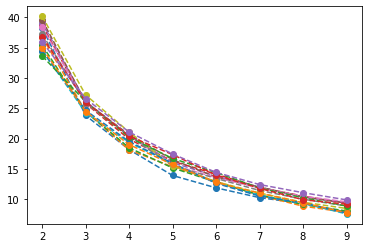

In [54]:

for idx in index:

    X = property_g[idx][['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']]

    ssd=[]
    for k in range(2, 10):
        m=KMeans(n_clusters=k)
        m.fit(X)
        ssd.append([k, m.inertia_])

    xy=np.array(ssd)

    plt.plot(xy[:, 0], xy[:, 1], linestyle='--', marker='o')

In [55]:
X = property_g['y2010'][['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']]

In [56]:
X

,BY_0,BY_0_T,BY_1,BY_1_T,BY_2,BY_2_T,BY_3,degree_out,node_out,closeness,betweenness,eigenvector
ADD,0.012501,0.001341,0.077989,0.046510,0.009392,0.006099,0.0,0.292398,0.034678,0.795074,0.163762,0.166505
AKL,0.028980,0.044238,0.011290,0.036094,0.000825,0.001089,0.0,0.204678,0.058774,0.795478,0.268723,0.116484
ALA,0.019509,0.002534,0.026722,0.020619,0.000000,0.000000,0.0,0.122807,0.022115,0.782163,0.104594,0.129026
AMM,0.015103,0.018973,0.152218,0.092615,0.003543,0.000000,0.0,0.280702,0.073650,0.848509,0.091740,0.422254
AMS,0.104962,0.013225,0.390042,0.173561,0.014731,0.005663,0.0,0.736842,0.228012,0.960135,0.640698,0.804784
...,...,...,...,...,...,...,...,...,...,...,...,...
YTY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
ZGC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
ZHA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.005848,0.000160,0.616096,0.000000,0.007219
ZVK,0.007700,0.000859,0.001102,0.000000,0.000170,0.000000,0.0,0.011696,0.005927,0.711429,0.000000,0.023057


In [57]:
property_g['y2010'].loc['SIN']

BH_1           0.380098
BH_2           0.032880
BH_0           1.000000
BH_1_T         0.014991
BH_2_T         0.008210
BH_0_T         0.260376
BH_3           0.002312
BY_0           0.990846
BY_0_T         0.339598
BY_1           0.413249
BY_1_T         0.019216
BY_2           0.034146
BY_2_T         0.002178
BY_3           0.006429
degree_in      0.615854
degree_out     0.596491
node_in        0.880103
node_out       0.941562
closeness      0.975389
betweenness    0.793295
eigenvector    0.587198
Name: SIN, dtype: float64

In [58]:
model = KMeans(n_clusters=4)
model

KMeans(n_clusters=4)

In [59]:
model.fit(X)
# model.cluster_centers_
# model.transform(X) 
model.labels_

array([0, 0, 0, 3, 3, 3, 0, 3, 3, 0, 0, 0, 3, 0, 3, 3, 0, 3, 0, 0, 0, 0,
       0, 0, 0, 1, 3, 0, 0, 3, 3, 3, 0, 3, 3, 3, 3, 0, 0, 0, 0, 0, 3, 0,
       1, 1, 0, 1, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 3, 0, 0,
       3, 0, 0, 3, 0, 0, 0, 0, 0, 3, 3, 3, 0, 0, 0, 1, 0, 0, 0, 0, 3, 0,
       0, 0, 0, 3, 0, 0, 0, 3, 1, 0, 3, 0, 0, 3, 0, 0, 0, 3, 0, 1, 3, 0,
       0, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0,
       0, 0, 2, 0, 0, 0, 2, 0, 0, 3, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2,
       0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0,
       0, 2], dtype=int32)

In [60]:
X

,BY_0,BY_0_T,BY_1,BY_1_T,BY_2,BY_2_T,BY_3,degree_out,node_out,closeness,betweenness,eigenvector
ADD,0.012501,0.001341,0.077989,0.046510,0.009392,0.006099,0.0,0.292398,0.034678,0.795074,0.163762,0.166505
AKL,0.028980,0.044238,0.011290,0.036094,0.000825,0.001089,0.0,0.204678,0.058774,0.795478,0.268723,0.116484
ALA,0.019509,0.002534,0.026722,0.020619,0.000000,0.000000,0.0,0.122807,0.022115,0.782163,0.104594,0.129026
AMM,0.015103,0.018973,0.152218,0.092615,0.003543,0.000000,0.0,0.280702,0.073650,0.848509,0.091740,0.422254
AMS,0.104962,0.013225,0.390042,0.173561,0.014731,0.005663,0.0,0.736842,0.228012,0.960135,0.640698,0.804784
...,...,...,...,...,...,...,...,...,...,...,...,...
YTY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
ZGC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
ZHA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.005848,0.000160,0.616096,0.000000,0.007219
ZVK,0.007700,0.000859,0.001102,0.000000,0.000170,0.000000,0.0,0.011696,0.005927,0.711429,0.000000,0.023057


In [61]:
model.cluster_centers_

array([[ 2.93226252e-02,  1.60644672e-02,  8.64703169e-03,
         1.96845861e-03,  1.62904987e-03,  3.52818921e-04,
         2.84608379e-05,  5.61342593e-02,  3.02795996e-02,
         6.97608481e-01,  2.33381650e-02,  6.17826479e-02],
       [ 7.54249230e-01,  3.26911550e-01,  2.50103946e-01,
         2.18997109e-02,  1.87531853e-01,  1.83238946e-02,
         1.82537769e-01,  3.88157895e-01,  7.26399800e-01,
         8.89974777e-01,  3.79106969e-01,  3.76727274e-01],
       [-2.77555756e-17,  1.04083409e-17,  2.08166817e-17,
        -6.93889390e-18,  3.46944695e-18, -1.73472348e-18,
        -2.60208521e-18,  5.65930956e-04,  2.77555756e-17,
        -2.22044605e-16,  2.77555756e-17,  4.16333634e-17],
       [ 9.29319967e-02,  7.04154510e-02,  2.13723585e-01,
         1.10304031e-01,  6.56681748e-02,  5.43983570e-02,
         9.00032144e-04,  4.58646617e-01,  1.86926618e-01,
         8.83430208e-01,  3.35007890e-01,  5.03045707e-01]])

In [62]:
out = pd.DataFrame(model.labels_, columns=['cluster'], index = X.index)
out['cluster'].value_counts()

0    192
3     35
2     31
1      8
Name: cluster, dtype: int64

In [63]:
cluster = X

In [64]:
cluster['label'] = model.labels_
# cluster2

/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [65]:
cluster_series.loc["SIN"]

NameError: name 'cluster_series' is not defined

In [ ]:
select = ['BY_0','BY_1','BY_2', 'BY_3']
fig, ax = plt.subplots(ncols=len(select), figsize=(40, 5))
for i, col in enumerate(select):
    sns.boxplot(x='label', y=col, data=cluster, ax=ax[i])

In [ ]:
select = [ 'BY_0_T','BY_1_T',  'BY_2_T']
fig, ax = plt.subplots(ncols=len(select), figsize=(40, 5))
for i, col in enumerate(select):
    sns.boxplot(x='label', y=col, data=cluster, ax=ax[i])

In [ ]:
select = ['degree_out', 'node_out',]
fig, ax = plt.subplots(ncols=len(select), figsize=(40, 5))
for i, col in enumerate(select):
    sns.boxplot(x='label', y=col, data=cluster, ax=ax[i])

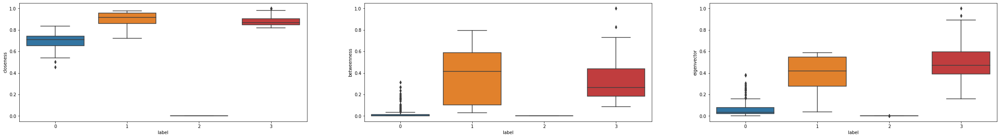

In [66]:
select = ['closeness', 'betweenness','eigenvector']
fig, ax = plt.subplots(ncols=len(select), figsize=(40, 5))
for i, col in enumerate(select):
    sns.boxplot(x='label', y=col, data=cluster, ax=ax[i])

<AxesSubplot:xlabel='cluster', ylabel='count'>

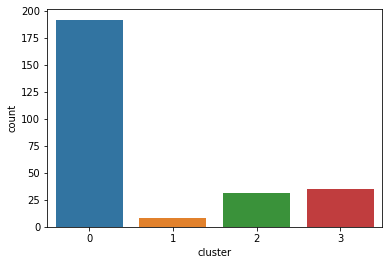

In [67]:
sns.countplot(x='cluster', data=out)

In [68]:
out.loc['SIN']

cluster    1
Name: SIN, dtype: int32

In [69]:
table = {}
for i in range(0,6):
    table[i] = out[out.cluster == i]
    table[i] = table[i].join(region)

In [70]:
table[2]

,cluster,Global Region,Country Name
BFV,2,Asia,Thailand
BQS,2,Russian Federation,Russian Federation
HHQ,2,Asia,Thailand
HRI,2,Asia,Sri Lanka
IXC,2,Asia,India
KDT,2,Asia,Thailand
KEJ,2,Russian Federation,Russian Federation
KOP,2,Asia,Thailand
KOS,2,Asia,Cambodia
LOE,2,Asia,Thailand


In [71]:
cluster.groupby('label').describe().T.loc['betweenness']

label,0,1,2,3
count,192.000000,8.000000,31.0,35.000000
mean,0.023338,0.379107,0.0,0.335008
std,0.053909,0.285813,0.0,0.226641
min,0.000000,0.028381,0.0,0.085661
25%,0.000000,0.104799,0.0,0.181959
50%,0.000180,0.415875,0.0,0.264166
75%,0.014196,0.589960,0.0,0.439619
max,0.312358,0.793295,0.0,1.000000


In [72]:
tt = dict(cluster.groupby('label').describe().T.loc['closeness'].loc['50%'])

tt = {k: v for k, v in sorted(tt.items(), key=lambda item: item[1])}

g = ['A','B','C','D']
 
i = 0
for k in list(tt):
    v = tt.pop(k)
    tt[g[i]] = v
    
    i = i+1
    
    
tt


    
    
    

{'A': 0.0,
 'B': 0.7114292206316745,
 'C': 0.8675533388750345,
 'D': 0.9145634821295865}

In [73]:
tt

{'A': 0.0,
 'B': 0.7114292206316745,
 'C': 0.8675533388750345,
 'D': 0.9145634821295865}

In [74]:
arrive

['ADD',
 'AKL',
 'ALA',
 'AMD',
 'AMM',
 'AMS',
 'ARN',
 'ASB',
 'ATH',
 'ATQ',
 'AUH',
 'AYT',
 'BAH',
 'BBI',
 'BFV',
 'BHY',
 'BKI',
 'BLR',
 'BNE',
 'BOM',
 'BQS',
 'BRU',
 'BUD',
 'BWN',
 'CAI',
 'CAN',
 'CCU',
 'CDG',
 'CEB',
 'CEI',
 'CEK',
 'CGK',
 'CGN',
 'CGO',
 'CGP',
 'CGQ',
 'CJJ',
 'CJU',
 'CKG',
 'CMB',
 'CNX',
 'CPH',
 'CRK',
 'CSX',
 'CTS',
 'CTU',
 'CXR',
 'CZX',
 'DAC',
 'DAD',
 'DAT',
 'DEL',
 'DLC',
 'DLI',
 'DME',
 'DMK',
 'DOH',
 'DPS',
 'DSN',
 'DUS',
 'DXB',
 'DYG',
 'DYU',
 'FCO',
 'FNJ',
 'FOC',
 'FRA',
 'FUK',
 'GAU',
 'GAY',
 'GOJ',
 'GYD',
 'HAK',
 'HAN',
 'HDY',
 'HEL',
 'HFE',
 'HGH',
 'HGN',
 'HHQ',
 'HIJ',
 'HKG',
 'HKT',
 'HND',
 'HPH',
 'HRB',
 'HRI',
 'HYD',
 'ICN',
 'IKA',
 'IKT',
 'INC',
 'ISB',
 'IST',
 'IXB',
 'IXC',
 'JAI',
 'JED',
 'JFK',
 'JHB',
 'JHG',
 'JJN',
 'JNB',
 'KBP',
 'KBV',
 'KDT',
 'KEJ',
 'KGS',
 'KHH',
 'KHI',
 'KHN',
 'KHV',
 'KIX',
 'KJA',
 'KKC',
 'KMG',
 'KOP',
 'KOS',
 'KTM',
 'KUF',
 'KUL',
 'KWE',
 'KWI',
 'KWL',
 'KZN',


In [75]:
value = {
    'y2005' : ['A','B','C','D'],
    'y2006' : ['A','B','C','E'],
    'y2007' : ['A','B','C','E'],
    'y2008' : ['A','B','C','E'],
    'y2009' : ['A','B','C','D'],
    'y2010' : ['A','B','C','D'],
    'y2011' : ['A','B','C','D'],
    'y2012' : ['A','B','C','E'],
    'y2013' : ['A','B','C','E'],
    'y2014' : ['A','B','C','F'],
    'y2015' : ['A','B','C','F'],
    'y2016' : ['A','B','C','F'],
    'y2017' : ['A','B','C','F'],
    'y2018' : ['A','B','C','F'],
    'y2019' : ['A','B','C','F'],
    
    
}
# value = {
#     'y2005' : ['A','B','D','F'],
#     'y2006' : ['A','B','D','H'],
#     'y2007' : ['A','B','D','H'],
#     'y2008' : ['A','B','D','H'],
#     'y2009' : ['A','B','D','F'],
#     'y2010' : ['A','B','D','F'],
#     'y2011' : ['A','B','D','F'],
#     'y2012' : ['A','B','D','H'],
#     'y2013' : ['A','B','D','H'],
#     'y2014' : ['A','B','D','J'],
#     'y2015' : ['A','B','D','J'],
#     'y2016' : ['A','B','D','J'],
#     'y2017' : ['A','B','D','J'],
#     'y2018' : ['A','B','D','J'],
#     'y2019' : ['A','B','D','J'],
    
    
# }
# value = {
#     'y2005' : ['0','1','2','5'],
#     'y2006' : ['0','1','2','3'],
#     'y2007' : ['0','1','2','3'],
#     'y2008' : ['0','1','2','3'],
#     'y2009' : ['0','1','2','5'],
#     'y2010' : ['0','1','2','5'],
#     'y2011' : ['0','1','2','5'],
#     'y2012' : ['0','1','2','3'],
#     'y2013' : ['0','1','2','3'],
#     'y2014' : ['0','1','2','4'],
#     'y2015' : ['0','1','2','4'],
#     'y2016' : ['0','1','2','4'],
#     'y2017' : ['0','1','2','4'],
#     'y2018' : ['0','1','2','4'],
#     'y2019' : ['0','1','2','4'],
    
    
# }

In [76]:
print(X.index[10:15])
print(arrive[10:15])

Index(['BLR', 'BNE', 'BOM', 'BWN', 'CAI'], dtype='object')
['AUH', 'AYT', 'BAH', 'BBI', 'BFV']


In [77]:
cluster_series = pd.DataFrame(index = X.index)
DescribeGroup = {}
TrueVal = {}

for idx in index:
    print(f"-----{idx}------")
    X = property_g[idx][['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']]
    
    model = KMeans(n_clusters=4)
    model.fit(X)
    model.cluster_centers_
    model.transform(X) 

    
    
    
    
    cluster = X
    Val = information[idx][['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']]
    cluster['label'] = model.labels_
    
    Val['label'] = cluster['label']
    
#     print(cluster.loc["SIN"]['label'], int(cluster.loc["SIN"]['label']))
#     test = int(X.loc["SIN"]['label'])
    
#     cluster_series[idx] = model.labels_
    cluster_series[idx] = cluster['label']
    
    
    
    
    
    
    
    betweenness = dict(cluster.groupby('label').describe().T.loc['closeness'].loc['75%'])
#     print(betweenness)
    betweenness = {k: v for k, v in sorted(betweenness.items(), key=lambda item: item[1])}
#     print(betweenness.keys())
    
    replace_v = value[idx]
#     print(replace_v)
    
    tmp = {}
    for inx,key in enumerate(betweenness):
        tmp[key] = replace_v[inx]
    
#     print(tmp)
    DescribeGroup[idx] = cluster.groupby('label').describe().T.rename(columns= tmp)
    TrueVal[idx] = Val.groupby('label').describe().T.rename(columns= tmp)

#     print(tmp)
#     print(cluster_series.loc['SIN'])
    
    
    
    cluster_series = cluster_series.replace({idx : tmp})
#     print(cluster_series.loc['SIN'])
#     print(cluster_series)
    

    print(cluster_series[idx].value_counts())
   
    
#     print(cluster_series[cluster_series[idx] == 'F']) 
#     lis = list(betweenness.keys())
    
#     replace_v = value[idx]
#     conds = [cluster_series.idx == lis[0]  , cluster_series.idx == lis[1],cluster_series.idx == lis[2],cluster_series.idx == lis[3]]
    
    
#     print(idx,betweenness)

# print(cluster_series.loc["SIN"])
    
    

-----y2005------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    171
C     48
A     36
D     11
Name: y2005, dtype: int64
-----y2006------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    174
C     48
A     30
E     14
Name: y2006, dtype: int64
-----y2007------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    182
C     44
A     26
E     14
Name: y2007, dtype: int64
-----y2008------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    174
C     49
A     30
E     13
Name: y2008, dtype: int64
-----y2009------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    183
C     40
A     30
D     13
Name: y2009, dtype: int64
-----y2010------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    192
C     35
A     31
D      8
Name: y2010, dtype: int64
-----y2011------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    181
C     43
A     28
D     14
Name: y2011, dtype: int64
-----y2012------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    173
C     48
A     25
E     20
Name: y2012, dtype: int64
-----y2013------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    181
C     46
A     28
E     11
Name: y2013, dtype: int64
-----y2014------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    195
C     38
A     22
F     11
Name: y2014, dtype: int64
-----y2015------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    185
C     45
A     21
F     15
Name: y2015, dtype: int64
-----y2016------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    183
C     45
A     22
F     16
Name: y2016, dtype: int64
-----y2017------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    189
C     46
F     16
A     15
Name: y2017, dtype: int64
-----y2018------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    192
C     38
A     22
F     14
Name: y2018, dtype: int64
-----y2019------


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


B    187
C     42
A     19
F     18
Name: y2019, dtype: int64


In [78]:
print(cluster_series.loc["SIN"])

y2005    D
y2006    E
y2007    E
y2008    E
y2009    D
y2010    D
y2011    D
y2012    E
y2013    E
y2014    F
y2015    F
y2016    F
y2017    F
y2018    F
y2019    F
Name: SIN, dtype: object


In [79]:
# value
fea = ['BY_0','BY_1','BY_2','BY_3','BY_0_T','BY_1_T','BY_2_T','degree_out','node_out','closeness','betweenness','eigenvector']
PlotLabel = nested_dict(3, int) 
PlotTrue = nested_dict(3, int) 

for i in fea:
    for idx in index:
        for label in value[idx]:
            if i in PlotLabel[label]:
#                 print(1)
                PlotLabel[label][i].append(DescribeGroup[idx][label].loc[i][1])
                PlotTrue[label][i].append(TrueVal[idx][label].loc[i][1])
            else:
#                 print(label,i)
                PlotLabel[label][i] =  [DescribeGroup[idx][label].loc[i][1]] 
                PlotTrue[label][i] =  [TrueVal[idx][label].loc[i][1]] 

            


In [80]:
for i in PlotLabel:
    for j in fea:
        tmp = PlotLabel[i][j]
        tmp2 = PlotTrue[i][j]
        PlotLabel[i][j] = sum(tmp) / len(tmp) 
        PlotTrue[i][j] = sum(tmp2) / len(tmp2) 

In [81]:
PlotLabel.to_dict()

{'A': {'BY_0': 4.4295462478981025e-06,
  'BY_1': 0.0,
  'BY_2': 0.0,
  'BY_3': 0.0,
  'BY_0_T': 3.2670668389838713e-06,
  'BY_1_T': 0.0,
  'BY_2_T': 0.0,
  'degree_out': 0.0007414231912431072,
  'node_out': 6.73581928174073e-09,
  'closeness': 2.4333591667414555e-06,
  'betweenness': 0.0,
  'eigenvector': 4.8994625393011775e-29},
 'B': {'BY_0': 0.021585256512869595,
  'BY_1': 0.0034875378711771827,
  'BY_2': 0.0006235786379014558,
  'BY_3': 0.00015404112580300782,
  'BY_0_T': 0.016480069071436475,
  'BY_1_T': 0.0009216213929540876,
  'BY_2_T': 0.0005294315088403627,
  'degree_out': 0.048368647164443654,
  'node_out': 0.022421632906373234,
  'closeness': 0.6860735620797396,
  'betweenness': 0.013986810861515393,
  'eigenvector': 0.05888123334307226},
 'C': {'BY_0': 0.10036569681059367,
  'BY_1': 0.09337410543392723,
  'BY_2': 0.022634323886121018,
  'BY_3': 0.014916629039363211,
  'BY_0_T': 0.09582797873021663,
  'BY_1_T': 0.049029823176360024,
  'BY_2_T': 0.021937615267134277,
  'degre

In [82]:
PlotTrue.to_dict()

{'A': {'BY_0': 4.985398453398452,
  'BY_1': 0.0,
  'BY_2': 0.0,
  'BY_3': 0.0,
  'BY_0_T': 1.1316524216524215,
  'BY_1_T': 0.0,
  'BY_2_T': 0.0,
  'degree_out': 0.1454589019105148,
  'node_out': 0.01111111111111111,
  'closeness': 1.0829542993285685e-06,
  'betweenness': 0.0,
  'eigenvector': 1.085127188153577e-29},
 'B': {'BY_0': 24972.83528360204,
  'BY_1': 1037.9430680809141,
  'BY_2': 28.711443374252855,
  'BY_3': 0.2785403502986992,
  'BY_0_T': 7370.7654151806455,
  'BY_1_T': 42.501264096812854,
  'BY_2_T': 0.476621799706869,
  'degree_out': 10.235189080909828,
  'node_out': 37296.52980865506,
  'closeness': 0.30819740907951465,
  'betweenness': 0.0010454975087688715,
  'eigenvector': 0.012610470872077216},
 'C': {'BY_0': 118244.4445858711,
  'BY_1': 23414.533169284136,
  'BY_2': 1059.2478212411154,
  'BY_3': 15.504432103414407,
  'BY_0_T': 43437.72478484756,
  'BY_1_T': 2295.3209538482124,
  'BY_2_T': 38.03276815604947,
  'degree_out': 63.561130024964804,
  'node_out': 235131.081

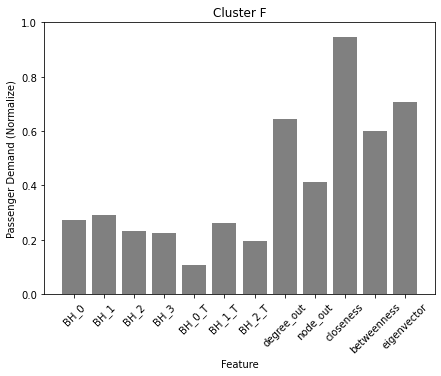

In [83]:
keys = ['BH_0','BH_1','BH_2','BH_3','BH_0_T','BH_1_T','BH_2_T','degree_out','node_out','closeness','betweenness','eigenvector']
values = PlotLabel['F'].values()

plt.figure(figsize=(7,5))
plt.title("Cluster F")
plt.xlabel("Feature")
plt.ylabel("Passenger Demand (Normalize)")
plt.bar(keys, values,color="gray")
plt.ylim(0,1)
plt.xticks(rotation=45)
plt.show()

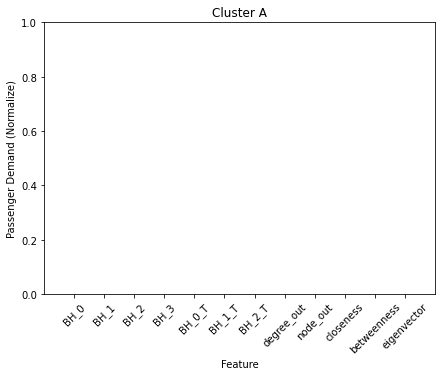

In [354]:
keys = ['BH_0','BH_1','BH_2','BH_3','BH_0_T','BH_1_T','BH_2_T','degree_out','node_out','closeness','betweenness','eigenvector']
values = PlotLabel['A'].values()

plt.figure(figsize=(7,5))
plt.title("Cluster A")
plt.xlabel("Feature")
plt.ylabel("Passenger Demand (Normalize)")
plt.bar(keys, values,color="gray")
plt.ylim(0,1)
plt.xticks(rotation=45)
plt.show()

In [85]:
PlotLabel[idx][label].keys()

dict_keys([])

In [86]:
DescribeGroup[idx][label].loc[fea]

BY_0         count    18.000000
             mean      0.241150
             std       0.311860
             min       0.000000
             25%       0.041631
                        ...    
eigenvector  min       0.518816
             25%       0.625814
             50%       0.744891
             75%       0.848551
             max       1.000000
Name: F, Length: 96, dtype: float64

In [87]:
cluster_series.loc['SIN']

y2005    D
y2006    E
y2007    E
y2008    E
y2009    D
y2010    D
y2011    D
y2012    E
y2013    E
y2014    F
y2015    F
y2016    F
y2017    F
y2018    F
y2019    F
Name: SIN, dtype: object

In [88]:
cluster_series['Timeseries'] = cluster_series.apply(''.join, axis=1)

In [89]:
cluster_series

,y2005,y2006,y2007,y2008,y2009,y2010,y2011,y2012,y2013,y2014,y2015,y2016,y2017,y2018,y2019,Timeseries
ADD,B,B,B,C,C,B,C,C,C,C,C,C,C,C,C,BBBCCBCCCCCCCCC
AKL,C,C,C,C,B,B,C,C,B,B,B,B,B,B,B,CCCCBBCCBBBBBBB
ALA,B,B,B,B,B,B,B,B,B,B,B,B,B,B,B,BBBBBBBBBBBBBBB
AMM,C,C,C,C,C,C,C,C,C,C,C,C,C,C,C,CCCCCCCCCCCCCCC
AMS,D,E,E,E,D,C,D,E,E,F,F,F,F,F,F,DEEEDCDEEFFFFFF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YTY,A,A,A,A,A,A,A,A,A,B,B,B,B,B,B,AAAAAAAAABBBBBB
ZGC,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,BAAAAAAAAAAAAAB
ZHA,B,B,B,B,B,B,B,B,B,B,B,B,B,B,B,BBBBBBBBBBBBBBB
ZVK,A,A,A,B,B,B,B,B,B,B,B,B,B,B,B,AAABBBBBBBBBBBB


In [90]:
list(cluster_series['Timeseries'])

['BBBCCBCCCCCCCCC',
 'CCCCBBCCBBBBBBB',
 'BBBBBBBBBBBBBBB',
 'CCCCCCCCCCCCCCC',
 'DEEEDCDEEFFFFFF',
 'CCCCCCCCCCCCCCC',
 'BBBBBBBBBBBBBBB',
 'CCCCCCCCCBCCCBB',
 'CEEECCDEEFFFFCC',
 'CCCCCBCCCBBBBBB',
 'BBBBBBBBBBBBBBB',
 'BBBBBBBBBBBBBBB',
 'CCCCCCCCCCCCCCC',
 'BBBBBBBBBBBBBBB',
 'CCCCCCCCCCCCCCC',
 'CCCCCCCCCCFFFFF',
 'BBBBBBBCBBBBBBC',
 'DEEEDCDEEFFFFFF',
 'BBBBBBBBBBBBBBB',
 'CCCCCBCCCCCCCCC',
 'BBBBBBBBBBBBBBB',
 'BBBBBBBBBBBBBBB',
 'BABAABABABBBBBB',
 'BBBBBBBBBBBBBBB',
 'CCCCBBCCBBCBCBB',
 'CCCCDDDCCCCCCCC',
 'DEEECCCECCCCCCC',
 'BBBBBBBBBBBCCCC',
 'CCBBBBBCBBBBBBB',
 'CCCCCCCCCCCCCCC',
 'BCCCCCCCCCCCCCC',
 'CEEECCCEEFFFFFF',
 'BBBBBBBBBBBBBBB',
 'CCCCCCCCCCCCCCC',
 'DEEEDCDEEFFFFFF',
 'CCCCCCCCCCCCCCC',
 'DEEEDCDEEFFFFFF',
 'BBBBBBBBBBBBBBB',
 'BBBBBBBBBBBBBBB',
 'BBBBBBBBBBBBBBB',
 'BCCCBBBCCBCCCCC',
 'BBBBBBBCBBBBBBB',
 'CCCCCCCECCCCCCC',
 'BBBBBBBBBBBBBBB',
 'DEEEDDDEEFFFFFF',
 'CCCCDDDCCCCCCCC',
 'BBBBBBCCCCCCCCC',
 'CEEEDDDECFFFFFF',
 'BBBBBBBBBBBBBBB',
 'ABBBBBBBBBBBBBB',


In [91]:
list(cluster_series.index)

['ADD',
 'AKL',
 'ALA',
 'AMM',
 'AMS',
 'ARN',
 'ASB',
 'ATH',
 'AUH',
 'BAH',
 'BLR',
 'BNE',
 'BOM',
 'BWN',
 'CAI',
 'CAN',
 'CCU',
 'CDG',
 'CEI',
 'CGK',
 'CGO',
 'CGP',
 'CJJ',
 'CKG',
 'CMB',
 'CNX',
 'CPH',
 'CTU',
 'DAC',
 'DEL',
 'DME',
 'DOH',
 'DPS',
 'DUS',
 'DXB',
 'FCO',
 'FRA',
 'FUK',
 'GAY',
 'HAK',
 'HAN',
 'HDY',
 'HEL',
 'HGH',
 'HKG',
 'HKT',
 'HND',
 'ICN',
 'IKA',
 'IKT',
 'ISB',
 'IST',
 'JHG',
 'JNB',
 'KBP',
 'KBV',
 'KHI',
 'KHV',
 'KIX',
 'KJA',
 'KMG',
 'KUL',
 'KWI',
 'LAX',
 'LED',
 'LHE',
 'LHR',
 'LPQ',
 'MAA',
 'MAD',
 'MCT',
 'MEL',
 'MFM',
 'MHD',
 'MLE',
 'MNL',
 'MUC',
 'MXP',
 'NBO',
 'NGO',
 'NNG',
 'NRT',
 'NST',
 'OSL',
 'OVB',
 'PBH',
 'PEK',
 'PEN',
 'PER',
 'PNH',
 'PUS',
 'PVG',
 'REP',
 'RGN',
 'RUN',
 'SGN',
 'SIN',
 'SUB',
 'SVO',
 'SVX',
 'SWA',
 'SYD',
 'SZX',
 'TAS',
 'TDX',
 'TLV',
 'TNR',
 'TPE',
 'TXL',
 'UBP',
 'URT',
 'USM',
 'UTH',
 'VIE',
 'VTE',
 'ZRH',
 'KHH',
 'AMD',
 'ATQ',
 'AYT',
 'BBI',
 'BFV',
 'BHY',
 'BKI',
 'BQS',


In [92]:
property_g['y2010'].loc['NRT']

BH_1           0.282780
BH_2           1.000000
BH_0           0.589244
BH_1_T         0.050302
BH_2_T         0.032126
BH_0_T         0.203905
BH_3           0.316462
BY_0           0.622676
BY_0_T         0.175175
BY_1           0.250828
BY_1_T         0.037114
BY_2           1.000000
BY_2_T         0.009148
BY_3           0.336226
degree_in      0.384146
degree_out     0.538012
node_in        0.644638
node_out       0.689377
closeness      0.916033
betweenness    0.420910
eigenvector    0.409308
Name: NRT, dtype: float64

In [93]:
cluster_series['y2018'].value_counts()

B    192
C     38
A     22
F     14
Name: y2018, dtype: int64

In [94]:
list(cluster_series.index)

['ADD',
 'AKL',
 'ALA',
 'AMM',
 'AMS',
 'ARN',
 'ASB',
 'ATH',
 'AUH',
 'BAH',
 'BLR',
 'BNE',
 'BOM',
 'BWN',
 'CAI',
 'CAN',
 'CCU',
 'CDG',
 'CEI',
 'CGK',
 'CGO',
 'CGP',
 'CJJ',
 'CKG',
 'CMB',
 'CNX',
 'CPH',
 'CTU',
 'DAC',
 'DEL',
 'DME',
 'DOH',
 'DPS',
 'DUS',
 'DXB',
 'FCO',
 'FRA',
 'FUK',
 'GAY',
 'HAK',
 'HAN',
 'HDY',
 'HEL',
 'HGH',
 'HKG',
 'HKT',
 'HND',
 'ICN',
 'IKA',
 'IKT',
 'ISB',
 'IST',
 'JHG',
 'JNB',
 'KBP',
 'KBV',
 'KHI',
 'KHV',
 'KIX',
 'KJA',
 'KMG',
 'KUL',
 'KWI',
 'LAX',
 'LED',
 'LHE',
 'LHR',
 'LPQ',
 'MAA',
 'MAD',
 'MCT',
 'MEL',
 'MFM',
 'MHD',
 'MLE',
 'MNL',
 'MUC',
 'MXP',
 'NBO',
 'NGO',
 'NNG',
 'NRT',
 'NST',
 'OSL',
 'OVB',
 'PBH',
 'PEK',
 'PEN',
 'PER',
 'PNH',
 'PUS',
 'PVG',
 'REP',
 'RGN',
 'RUN',
 'SGN',
 'SIN',
 'SUB',
 'SVO',
 'SVX',
 'SWA',
 'SYD',
 'SZX',
 'TAS',
 'TDX',
 'TLV',
 'TNR',
 'TPE',
 'TXL',
 'UBP',
 'URT',
 'USM',
 'UTH',
 'VIE',
 'VTE',
 'ZRH',
 'KHH',
 'AMD',
 'ATQ',
 'AYT',
 'BBI',
 'BFV',
 'BHY',
 'BKI',
 'BQS',


In [95]:
re = pd.DataFrame(index = list(cluster_series.index))

In [96]:
re =  re.join(region)
re

,Global Region,Country Name
ADD,Africa,Ethiopia
AKL,Australasia,New Zealand
ALA,Asia,Kazakhstan
AMM,Middle East,Jordan
AMS,Europe,Netherlands
...,...,...
YTY,Asia,China
ZGC,Europe,Croatia
ZHA,Asia,China
ZVK,Asia,Laos


In [97]:
re = dict(re['Global Region'].value_counts())

In [102]:
re = pd.DataFrame(index = list(cluster_series.index))
re =  re.join(region)
re = re.reset_index()
countryList = dict(re.groupby('Country Name')['index'].apply(list))

AirList = countryList.copy()

for Coun in countryList:
    for i in range(len(countryList[Coun])):
        countryList[Coun][i] = timeseriesClus.loc[countryList[Coun][i]]['cluster']
        
countryList
        

{'Argentina': [10],
 'Australia': [3, 7, 3, 1, 3],
 'Austria': [1],
 'Azerbaijan': [3],
 'Bahrain': [2],
 'Bangladesh': [3, 3],
 'Belgium': [1],
 'Bhutan': [3],
 'Brunei Darussalam': [3],
 'Cambodia': [3, 3, 8],
 'China': [5,
  3,
  3,
  7,
  3,
  3,
  3,
  7,
  3,
  5,
  5,
  3,
  7,
  3,
  3,
  3,
  3,
  8,
  3,
  8,
  3,
  3,
  3,
  3,
  3,
  8,
  3,
  3,
  3,
  3,
  3,
  8,
  3,
  8,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  8,
  3,
  7,
  8,
  10,
  3,
  3,
  3,
  3,
  8,
  3,
  3,
  3,
  8,
  3,
  8],
 'Croatia': [10],
 'Denmark': [1],
 'Egypt': [1],
 'Ethiopia': [1],
 'Finland': [1],
 'France': [4],
 'Germany': [1, 4, 1, 1, 3, 3],
 'Greece': [1, 3, 3],
 'Hong Kong': [4],
 'Hungary': [3],
 'India': [3, 1, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
 'Indonesia': [1, 3, 3, 3, 3],
 'Iran': [3, 3, 3, 3],
 'Israel': [1],
 'Italy': [1, 1],
 'Japan': [3, 1, 1, 3, 4, 3, 3, 3, 3],
 'Jordan': [1],
 'Kazakhstan': [3, 3],
 'Kenya': [1],
 'Kuwait': [3],
 'Laos': [3, 3, 3, 3],


In [103]:
len(countryList)

69

TypeError: 'numpy.ndarray' object is not callable

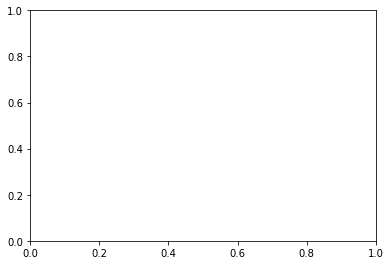

In [104]:
fig = plt.figure()

ax = fig.add_axes([0.1,0.1,0.8,0.8])
ax.pie(re.values(), labels=re.keys(), autopct='%1.1f%%', startangle=90)
ax.axis('equal') 

# ax.set_title('')

# fig.savefig('thailand_pop_pie.jpg')

In [105]:
data_airport

,Code,IATA Metro,Name,City,State,State Name,Latitude,Longitude,Country,Country Name,Global Region,WAC,Notes,Map
0,NGU,ORF,Norfolk NS (Chambers Field),Norfolk,VA,Virginia,36.937199,-76.290604,US,United States,North America,38.0,NaN,NGU
1,COZ,COZ,14 de Junio,Constanza,NaN,NaN,18.900000,-70.716698,DO,Dominican Republic,Caribbean,224.0,airport changed names from Constanza to 14 de ...,COZ
2,BUG,BUG,17 de Setembro,Benguela,NaN,NaN,-12.606400,13.405600,AO,Angola,Africa,502.0,airport changed names from Gen V Deslandes to ...,BUG
3,LAD,LAD,4 De Fevereiro,Luanda,NaN,NaN,-8.853100,13.236100,AO,Angola,Africa,502.0,NaN,LAD
4,UXM,UXM,47-Mile Mine Airport,47-Mile,AK,Alaska,61.033298,-168.133301,US,United States,North America,1.0,NaN,UXM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49,UTR,UTR,Uttaradit,Uttaradit,NaN,NaN,17.669399,100.243896,TH,Thailand,Asia,782.0,NaN,UTR
50,NBK,NBK,temporary code for Suvarnabhumi (New Bangkok Int),Bangkok,NaN,NaN,13.689000,100.741997,TH,Thailand,Asia,782.0,NaN,NBK
51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [106]:
region2 = data_airport[['Code', 'Name','Country Name','Global Region']]

region2 = region2.drop_duplicates()
region2 = region2.set_index('Code')
region2 = region2.dropna()
    

In [107]:
timeseriesClus = pd.read_csv("./timeseriesClus.csv")
timeseriesClus = timeseriesClus.set_index('index')
timeseriesClus = timeseriesClus.join(region2)
timeseriesClus = timeseriesClus.sort_values(by=['cluster'])
timeseriesClus

,label,cluster,Name,Country Name,Global Region
index,,,,,
ADD,BBBBCBCCCCCCCCC,1,Bole International,Ethiopia,Africa
DME,BCCCCCCCCCCCCCC,1,Domodedovo,Russian Federation,Russian Federation
DUS,CCCCCCCCCCCCCCC,1,Duesseldorf International,Germany,Europe
FCO,CCCCCCCCCCCCCCC,1,Fiumicino,Italy,Europe
HAN,BCCCBBBCCCCCCCC,1,Noi Bai International,Vietnam,Asia
...,...,...,...,...,...
HRI,AAAAAAAABBBAAAA,10,Mattala Rajapaksa Intl,Sri Lanka,Asia
LPG,AAAAAAAAAAAAAAA,10,La Plata,Argentina,South America
ZGC,BAAAAAAAAAAAAAB,10,Bus Station,Croatia,Europe


In [108]:
timeseriesClus.to_csv("./timeseriesClusName.csv")

In [109]:
Clus = {}
for i in range(1,11):
    Clus[i] = timeseriesClus[timeseriesClus.cluster == i]

In [110]:
Clus[10]

,label,cluster,Name,Country Name,Global Region
index,,,,,
NBK,ABAAAAAAAAAAAAA,10,temporary code for Suvarnabhumi (New Bangkok Int),Thailand,Asia
PHY,AAAAAAAAAAAAAAA,10,Phetchabun Airport,Thailand,Asia
PGM,AAAAAAAAAAAAAAA,10,Port Graham,United States,North America
WUT,AAAAAAAAAAAAAAB,10,Wutaishan,China,Asia
RKT,AAAAABABABBBBAA,10,Ras Al Khaimah Intl,United Arab Emirates,Middle East
PAE,AAAAAAAAAAAAAAB,10,Snohomish County,United States,North America
HRI,AAAAAAAABBBAAAA,10,Mattala Rajapaksa Intl,Sri Lanka,Asia
LPG,AAAAAAAAAAAAAAA,10,La Plata,Argentina,South America
ZGC,BAAAAAAAAAAAAAB,10,Bus Station,Croatia,Europe


In [111]:
re = pd.DataFrame(index = list(cluster_series.index))
re =  re.join(region)
re = re.reset_index()
countryList = dict(re.groupby('Country Name')['index'].apply(list))

AirList = countryList.copy()

for Coun in countryList:
    for i in range(len(countryList[Coun])):
#         print(Coun,len(countryList[Coun]))
        countryList[Coun][i] = timeseriesClus.loc[countryList[Coun][i]]['cluster']
        
countryList
        

{'Argentina': [10],
 'Australia': [3, 7, 3, 1, 3],
 'Austria': [1],
 'Azerbaijan': [3],
 'Bahrain': [2],
 'Bangladesh': [3, 3],
 'Belgium': [1],
 'Bhutan': [3],
 'Brunei Darussalam': [3],
 'Cambodia': [3, 3, 8],
 'China': [5,
  3,
  3,
  7,
  3,
  3,
  3,
  7,
  3,
  5,
  5,
  3,
  7,
  3,
  3,
  3,
  3,
  8,
  3,
  8,
  3,
  3,
  3,
  3,
  3,
  8,
  3,
  3,
  3,
  3,
  3,
  8,
  3,
  8,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  8,
  3,
  7,
  8,
  10,
  3,
  3,
  3,
  3,
  8,
  3,
  3,
  3,
  8,
  3,
  8],
 'Croatia': [10],
 'Denmark': [1],
 'Egypt': [1],
 'Ethiopia': [1],
 'Finland': [1],
 'France': [4],
 'Germany': [1, 4, 1, 1, 3, 3],
 'Greece': [1, 3, 3],
 'Hong Kong': [4],
 'Hungary': [3],
 'India': [3, 1, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
 'Indonesia': [1, 3, 3, 3, 3],
 'Iran': [3, 3, 3, 3],
 'Israel': [1],
 'Italy': [1, 1],
 'Japan': [3, 1, 1, 3, 4, 3, 3, 3, 3],
 'Jordan': [1],
 'Kazakhstan': [3, 3],
 'Kenya': [1],
 'Kuwait': [3],
 'Laos': [3, 3, 3, 3],


In [112]:
Clus[2]['Country Name'].value_counts()

Uzbekistan        1
Bahrain           1
South Africa      1
Sri Lanka         1
United Kingdom    1
New Zealand       1
Name: Country Name, dtype: int64

In [113]:
timeseriesClus[timeseriesClus.cluster == 2]

,label,cluster,Name,Country Name,Global Region
index,,,,,
TAS,CCCCCBCCCCCBBBB,2,Tashkent-Vostochny International,Uzbekistan,Asia
AKL,CCCCBBCBCCBBBBB,2,Auckland Intl,New Zealand,Australasia
BAH,CCCCCBCCCCBBBBB,2,Bahrain Intl,Bahrain,Middle East
LGW,CCCCBBBBCBBBBBB,2,Gatwick,United Kingdom,Europe
CMB,CCCCBBBCCCCBCBB,2,Bandaranaike Intl,Sri Lanka,Asia
JNB,CCCCCBCCCCCCBBB,2,O.R. Tambo International Airport,South Africa,Africa


In [114]:
# from sktime.distances.elastic_cython import dtw_distance


In [115]:
# fig = plt.figure()

# for arr in arrive:
#     for idx in index:

#         test[idx] = property_g[idx].loc[arr]
        
#     plt.plot(test.T.index,test.T['betweenness'])
#     plt.title('betweenness of ' + arr)
#     plt.xlabel('Year')
#     plt.ylabel('value')
#     plt.xticks(rotation = 45)
#     plt.savefig('betweenness of ' + arr)
    
#     plt.clf()
        

In [116]:
# property_g[idx].columns

In [117]:
# km = TimeSeriesKMeans(n_clusters=4, metric="dtw", max_iter=5,
# ...                           max_iter_barycenter=5,
# ...                           random_state=0).fit(X_bis)

# km.labels_

In [118]:
inp = ['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']
# inp2 = ['BY_0','BY_1','degree_out','node_out','closeness','betweenness','eigenvector']
time_series   = {}

for feature in inp:

    series = []
    index = ['y2005','y2006','y2007','y2008','y2009','y2010','y2011',
             'y2012','y2013','y2014','y2015','y2016','y2017','y2018',
             'y2019']
    for arr in arrive:
        for idx in index:
            test[idx] = property_g[idx].loc[arr]
        series.append(list(test.T[feature]))
        
    
    time_series[feature] = series    
    
        
    

In [119]:
test[idx] 

BH_1           0.000000
BH_2           0.000000
BH_0           0.000000
BH_1_T         0.000000
BH_2_T         0.000000
BH_0_T         0.000000
BH_3           0.000000
BY_0           0.000000
BY_0_T         0.000000
BY_1           0.000000
BY_1_T         0.000000
BY_2           0.000000
BY_2_T         0.000000
BY_3           0.000000
degree_in      0.020921
degree_out     0.012605
node_in        0.000070
node_out       0.000108
closeness      0.669916
betweenness    0.000008
eigenvector    0.029547
Name: y2019, dtype: float64

In [121]:
property_g

{'y2005':          BH_1      BH_2      BH_0    BH_1_T   BH_2_T    BH_0_T      BH_3  \
 ADD  0.097072  0.000638  0.007427  0.004703  0.00057  0.005965  0.000000   
 AKL  0.040624  0.000751  0.022946  0.049712  0.04390  0.098989  0.002059   
 ALA  0.008388  0.000000  0.003159  0.000000  0.00000  0.000339  0.000000   
 AMM  0.115554  0.007845  0.014039  0.018222  0.00114  0.064161  0.000000   
 AMS  0.835755  0.006193  0.095278  0.071881  0.00171  0.052400  0.000000   
 ..        ...       ...       ...       ...      ...       ...       ...   
 YTY  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
 ZGC  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
 ZHA  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
 ZVK  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
 ZYI  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
 
          BY_0    BY_0_T      BY_1  ...      BY_2    BY_2_T      

In [ ]:
# X_bis = to_time_series_dataset(time_series)
# km = TimeSeriesKMeans(n_clusters=4, metric="dtw", max_iter=5,max_iter_barycenter=5,random_state=0).fit(X_bis)

# series = pd.DataFrame(km.labels_, columns=['cluster'], index = arrive)
# table_s = {}
# for i in range(0,4):
#     table_s[i] = series[series.cluster == i]
#     table_s[i] = table_s[i].join(cluster_series)

------BY_0-------
0 0.4034741842707338 227
1 0.2666666666666667 4
2 0.3122222222222223 5
3 0.5269434960447266 30
0.41362677627284267
BY_0
------BY_0_T-------
0 0.5334046052572368 42
1 0.5198906648906648 13
2 0.0 1
3 0.3863780681875401 210
0.4146652871570151
BY_0_T
------BY_1-------
0 0.38147845372381484 244
1 0.10355555555555555 5
2 0.33999446320874893 14
3 0.08518518518518518 3
0.3707293177701753
BY_1
------BY_1_T-------
0 0.34899852462352465 16
1 0.0 1
2 0.08518518518518518 3
3 0.4022357411105535 246
0.39394557993506807
BY_1_T
------BY_2-------
0 0.44033146507243753 259
1 0.0 1
2 0.15138888888888888 4
3 0.06666666666666667 2
0.43152157271673014
BY_2
------BY_2_T-------
0 0.4439681671269225 259
1 0.05 2
2 0.15138888888888888 4
3 0.0 1
0.43493725880236267
BY_2_T
------BY_3-------
0 0.41811503244030435 251
1 0.0 1
2 0.03333333333333333 2
3 0.40487373737373744 12
0.413052724276947
BY_3
------degree_out-------
0 0.3441343096698034 37
1 0.2949733020066167 146
2 0.36271983527173834 17
3 0.1

/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


------eigenvector-------
0 0.39423998978353847 34
1 0.2733636064369964 207
2 0.0 4
3 0.3665309811952153 21
0.29205855936164693
eigenvector


<Figure size 432x288 with 0 Axes>

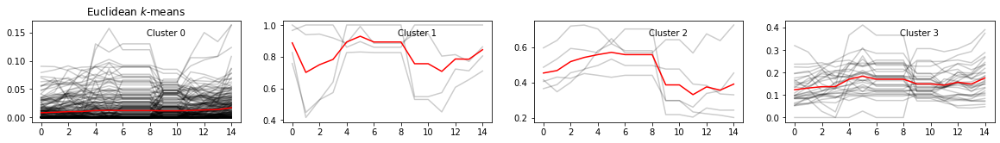

<Figure size 432x288 with 0 Axes>

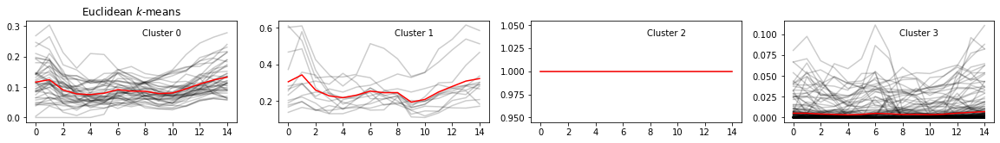

<Figure size 432x288 with 0 Axes>

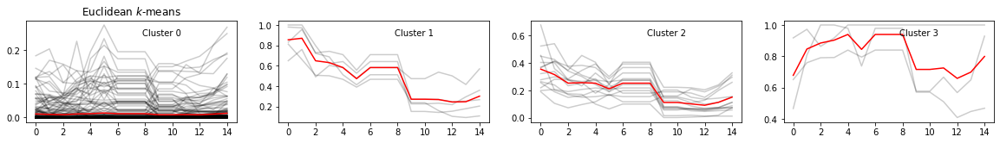

<Figure size 432x288 with 0 Axes>

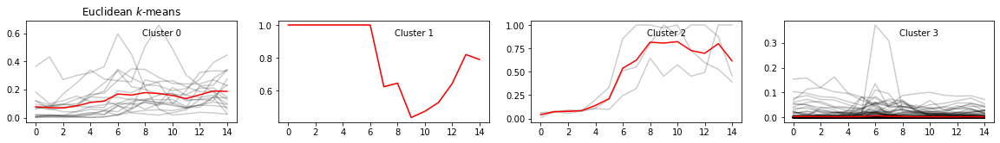

<Figure size 432x288 with 0 Axes>

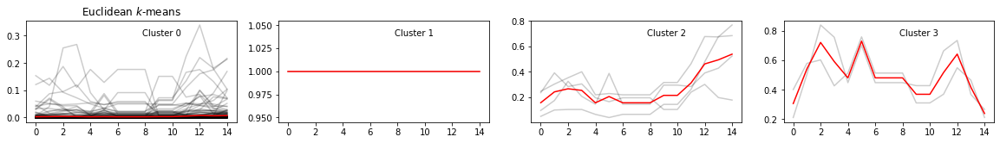

<Figure size 432x288 with 0 Axes>

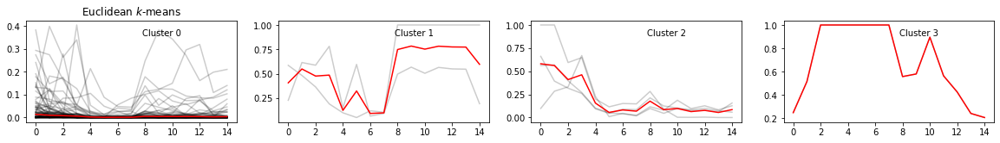

<Figure size 432x288 with 0 Axes>

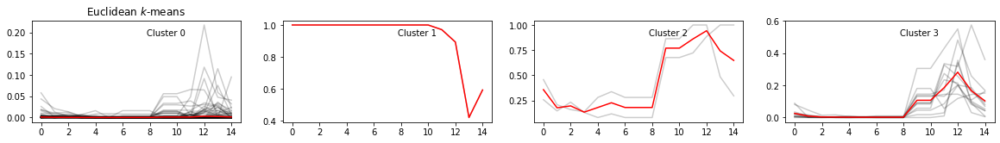

<Figure size 432x288 with 0 Axes>

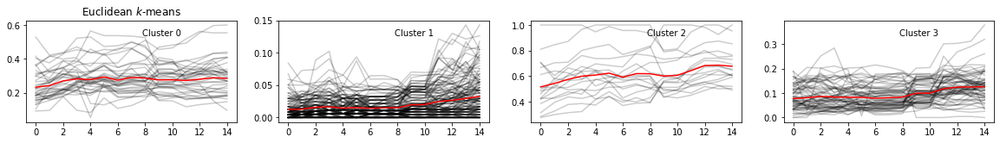

<Figure size 432x288 with 0 Axes>

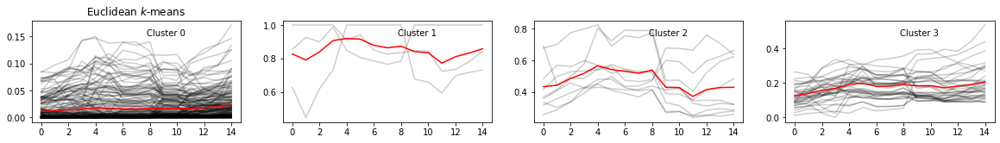

<Figure size 432x288 with 0 Axes>

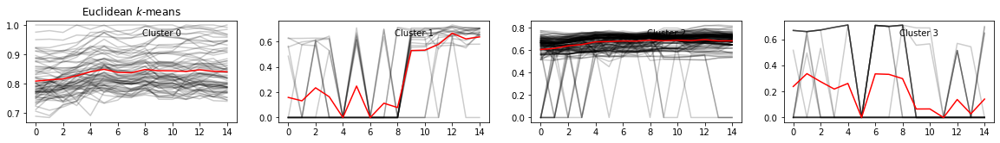

<Figure size 432x288 with 0 Axes>

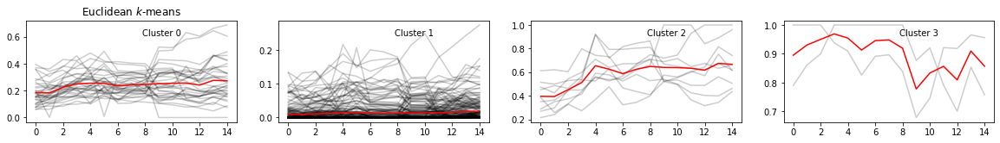

<Figure size 432x288 with 0 Axes>

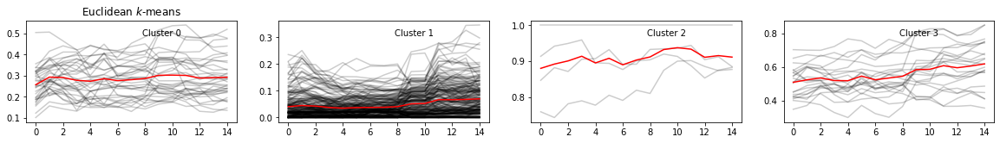

In [123]:
import stringdist
table_s = nested_dict(2, int)
for feature in inp:   
    print(f'------{feature}-------')
    
    X_bis = to_time_series_dataset(time_series[feature])
    km = TimeSeriesKMeans(n_clusters=4, max_iter=5,max_iter_barycenter=5,random_state=0).fit(X_bis)

    series = pd.DataFrame(km.labels_, columns=['cluster'], index = arrive)
    
    for i in range(0,4):
        table_s[feature][i] = series[series.cluster == i]
        table_s[feature][i] = table_s[feature][i].join(cluster_series)


    summary = 0
    for tb in range(0,4):
        overall = 0
        for idx, row in table_s[feature][tb].iterrows():
    #         print(idx,row['new'])
            div = 1
            score = 0
    #         print(table_s[tb].loc[idx::].index)
            for idx1, row1 in table_s[feature][tb].loc[idx::].iterrows():
                if (idx != idx1):
#                     print(idx1,row1['new'],stringdist.levenshtein_norm(row['new'],row1['new']))
                    div = div +1
                    score = score + stringdist.levenshtein_norm(row['Timeseries'],row1['Timeseries'])
    #         print(idx, score/div)
            overall = overall + score/div

        summary = summary + overall
        print(tb,overall / table_s[feature][tb].shape[0],table_s[feature][tb].shape[0])

    print(summary/series.shape[0])
    
    y_pred = km.fit_predict(X_bis)
    plt.figure()
    plt.figure(figsize=(20,10))
    
    print(feature)
    for yi in range(4):
        plt.subplot(4, 4, yi+1 )
        for xx in X_bis[y_pred == yi]:
            plt.plot(xx.ravel(), "k-", alpha=.2)
        plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    
        plt.text(0.55, 0.85,'Cluster %d' % (yi),
             transform=plt.gca().transAxes)
        if yi == 0:
            plt.title("Euclidean $k$-means")

    

        

In [129]:
table_s['closeness'][1]

,cluster,y2005,y2006,y2007,y2008,y2009,y2010,y2011,y2012,y2013,y2014,y2015,y2016,y2017,y2018,y2019,Timeseries
BQS,1,A,A,A,A,A,A,A,A,A,A,A,B,B,B,B,AAAAAAAAAAABBBB
CJJ,1,B,A,B,A,A,B,A,B,A,B,B,B,B,B,B,BABAABABABBBBBB
DAT,1,A,A,A,A,A,B,A,A,A,B,B,B,B,B,B,AAAAABAAABBBBBB
DSN,1,A,A,A,A,A,B,A,A,A,B,B,B,B,B,B,AAAAABAAABBBBBB
JJN,1,B,B,B,A,A,B,A,B,A,B,B,B,B,B,B,BBBAABABABBBBBB
KEJ,1,A,A,B,B,A,A,A,A,A,A,A,A,B,B,B,AABBAAAAAAAABBB
KOS,1,A,A,A,A,A,A,A,A,A,B,B,B,B,B,B,AAAAAAAAABBBBBB
LYA,1,A,B,B,A,A,B,A,A,B,B,B,B,B,B,B,ABBAABAABBBBBBB
LYI,1,B,A,A,B,A,A,A,A,A,B,B,B,B,B,B,BAABAAAAABBBBBB
MWX,1,A,A,B,B,A,A,A,A,A,A,A,B,B,B,B,AABBAAAAAAABBBB


In [ ]:
plt.figure(figsize=(20,10))
for yi in range(4):
    X_bis = to_time_series_dataset(time_series['BY_1'])
#     km = TimeSeriesKMeans(n_clusters=4, max_iter=5,max_iter_barycenter=5,random_state=0).fit(X_bis)
    plt.subplot(4, 4, yi+1 )
    for xx in X_bis[model.labels_ == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(model.cluster_centers_[yi].ravel(), "r-")
    
    plt.text(0.55, 0.85,'Cluster %d' % (yi),
        transform=plt.gca().transAxes)
    if yi == 0:
        plt.title("Euclidean $k$-means")

In [ ]:
model.labels_

In [ ]:
for xx in time_series[feature]:
    plt.plot(xx, "k-", alpha=.2)
#     plt.plot(km.cluster_centers_[yi].ravel(), "r-")

In [ ]:
# def plot_dendrogram(model, **kwargs):
#     # Create linkage matrix and then plot the dendrogram

#     # create the counts of samples under each node
#     counts = np.zeros(model.children_.shape[0])
#     n_samples = len(model.labels_)
#     for i, merge in enumerate(model.children_):
#         current_count = 0
#         for child_idx in merge:
#             if child_idx < n_samples:
#                 current_count += 1  # leaf node
#             else:
#                 current_count += counts[child_idx - n_samples]
#         counts[i] = current_count

#     linkage_matrix = np.column_stack([model.children_, model.distances_,
#                                       counts]).astype(float)

#     # Plot the corresponding dendrogram
#     dendrogram(linkage_matrix, **kwargs)


In [ ]:
# import editdistance as edist

# import numpy as np
# from sklearn.cluster import AgglomerativeClustering
# from sklearn.metrics.pairwise import pairwise_distances
# from scipy.cluster.hierarchy import dendrogram

# # Simple data (sample genome string).
# data = list(cluster_series['new'])

# # Custom distance metric and use editdistance.
# def lev_metric(x, y):
#     return int(edist.eval(data[int(x[0])], data[int(y[0])]))

# # Reshape the data.
# X = np.arange(len(data)).reshape(-1, 1)
# # print(X.shape)

# # Calculate pairwise distances with the new metric.
# m = pairwise_distances(X, X, metric=lev_metric)
# # print(m)

# # Perform agglomerative clustering.
# # The affinity is precomputed (since the distance are precalculated).
# # Use an 'average' linkage. Use any other apart from  'ward'.
# agg = AgglomerativeClustering(n_clusters=10, affinity='precomputed',
#                               linkage='average')

# # Use the distance matrix directly.
# u = agg.fit_predict(m)
# print(u)

# # plot_dendrogram(agg, truncate_mode='level', p=3)

In [ ]:
from collections import Counter
Counter(u)

In [ ]:
d = {'evaluation': data, 'cluster': u}
Edit = pd.DataFrame(d, index = cluster_series.index)


Edit[Edit['cluster'] == 2].head(30)



In [ ]:
X_bis[y_pred == yi]

In [ ]:
table_s['BY_0'][1]

In [ ]:
cluster_series
# stringdist.levenshtein_norm('abc','cba')

In [ ]:
# center = []
# for i in km.cluster_centers_[3]:
#     center.append(i[0])
    
# center

In [ ]:
score/div

In [ ]:
from collections import Counter
Counter(list(km.labels_))

In [ ]:
center = []
for i in km.cluster_centers_[2]:
    center.append(i[0])
    
for index,row in table_s[2].iterrows():
    print(index,cosine_similarity([row['list']], [center]))

In [ ]:
X_bis = to_time_series_dataset(time_series['degree_out'])

In [ ]:
km = TimeSeriesKMeans(n_clusters=4, max_iter=5,
...                       random_state=0).fit(X_bis)
y_pred = km.fit_predict(X_bis)
plt.figure()
plt.figure(figsize=(20,10))
for yi in range(4):
    plt.subplot(4, 4, yi+1 )
    for xx in X_bis[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
#     plt.xlim(0, sz)
#     plt.ylim(-4, 4)
    
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Euclidean $k$-means")

In [ ]:
# import matplotlib
# import matplotlib.pyplot as plt
# import seaborn

# staion = property_g['y2015'].index
# test = pd.DataFrame()

# fig = plt.figure()

# for arr in arrive:
#     for idx in index:

#         test[idx] = property_g[idx].loc[arr]
        
#     plt.plot(test.T.index,test.T['betweenness'])
#     plt.title('betweenness of ' + arr)
#     plt.xlabel('Year')
#     plt.ylabel('value')
#     plt.xticks(rotation = 45)
#     plt.savefig('betweenness of ' + arr)
    
#     plt.clf()
        


In [ ]:
test

In [ ]:
cosine_similarity([[1, 0, -1]], [[-1,-1, 0]])

In [ ]:
pwd

In [ ]:
import os
os.chdir('/Users/furuku/Documents/thesis/timeseries')
os.getcwd()

In [ ]:
from sklearn.feature_selection import f_regression
fstat, pval = f_regression(X,property_g['y2005']['node_in'] + property_g['y2015']['node_out'])
fstat

In [ ]:
f_value_threshold = 6  # can adjust this value 
updated_vars = []
for i in range(0,len(X.columns)-1):
    if fstat[i] >= f_value_threshold:
        updated_vars.append(X.columns[i])
updated_vars

In [ ]:
len(X.columns)

In [ ]:
results_gen = scan(
        es,
        query=query_body,
        index="bank_y2018",
    )
results = list(results_gen)
data = pd.DataFrame([i['_source'] for i in results])

In [ ]:
tmp = property_g['y2019'].copy()

In [ ]:
X = property_g['y2019'][['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']]

In [ ]:
X

In [ ]:
tmp = tmp.join(table_bank['bank_y2019'][table_bank['bank_y2019'].Orig == "BKK"]['Dest'].value_counts())
tmp = tmp.join(table_bank['bank_y2019'][table_bank['bank_y2019'].Dest == "BKK"]['Orig'].value_counts())
tmp = tmp.fillna(0)
tmp['connect'] = tmp['Orig'] + tmp['Dest']
tmp = tmp.drop(columns=['Orig', 'Dest'])

tmp

In [ ]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth=10,n_estimators=100)
model.fit(X,y)

n_features = 10

# Plot feature importance
features = X.columns
importances = model.feature_importances_
indices = np.argsort(importances)[-n_features:]  # sort top n features
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
importances

In [ ]:
# from sklearn.ensemble import RandomForestRegressor
# year = 'y2015'
# X = property_g[year][['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_in','degree_out','closeness','betweenness','eigenvector']]
# model = RandomForestRegressor(max_depth=10,n_estimators=100)
# model.fit(X,property_g[year]['node_in'] + property_g[year]['node_out'])

# n_features = 7

# # Plot feature importance
# features = X.columns
# importances = model.feature_importances_
# indices = np.argsort(importances)[-n_features:]  # sort top n features
# plt.title('Feature Importances')
# plt.barh(range(len(indices)), importances[indices], color='b', align='center')
# plt.yticks(range(len(indices)), [features[i] for i in indices])
# plt.xlabel('Relative Importance')
# plt.show()

In [ ]:
X = sm.add_constant(X, prepend=False)
model = sm.OLS(tmp['connect'], X)
results = model.fit()
print(results.summary())

In [ ]:
import numpy
import matplotlib.pyplot as plt

from tslearn.clustering import TimeSeriesKMeans
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, \
    TimeSeriesResampler

# seed = 0
# numpy.random.seed(seed)
# X_train, y_train, X_test, y_test = CachedDatasets().load_dataset("Trace")
# X_train = X_train[y_train < 4]  # Keep first 3 classes
# numpy.random.shuffle(X_train)
# # Keep only 50 time series
# X_train = TimeSeriesScalerMeanVariance().fit_transform(X_train[:50])
# # Make time series shorter
# X_train = TimeSeriesResampler(sz=40).fit_transform(X_train)
# sz = X_train.shape[1]

# Euclidean k-means
print("Euclidean k-means")
km = TimeSeriesKMeans(n_clusters=4, verbose=True, random_state=seed)
y_pred = km.fit_predict(X_bis)

plt.figure(figsize=(20,10))
for yi in range(4):
    plt.subplot(4, 4, yi+1 )
    for xx in X_bis[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
#     plt.xlim(0, sz)
#     plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Euclidean $k$-means")

# DBA-k-means
print("DBA k-means")
dba_km = TimeSeriesKMeans(n_clusters=4,
                          n_init=2,
                          metric="dtw",
                          verbose=True,
                          max_iter_barycenter=10,
                          random_state=seed)
y_pred = dba_km.fit_predict(X_bis)

for yi in range(4):
    plt.subplot(4, 4, 5 + yi)
    for xx in X_bis[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
#     plt.xlim(0, sz)
#     plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DBA $k$-means")

# Soft-DTW-k-means
print("Soft-DTW k-means")
sdtw_km = TimeSeriesKMeans(n_clusters=4,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=seed)
y_pred = sdtw_km.fit_predict(X_bis)

for yi in range(4):
    plt.subplot(4, 4, 9 + yi)
    for xx in X_bis[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
#     plt.xlim(0, sz)
#     plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Soft-DTW $k$-means")

plt.tight_layout()
plt.show()

In [ ]:

# import numpy
# import matplotlib.pyplot as plt

# from tslearn.clustering import TimeSeriesKMeans
# from tslearn.datasets import CachedDatasets
# from tslearn.preprocessing import TimeSeriesScalerMeanVariance, \
#     TimeSeriesResampler

# seed = 0
# numpy.random.seed(seed)
# X_train, y_train, X_test, y_test = CachedDatasets().load_dataset("Trace")
# X_train = X_train[y_train < 4]  # Keep first 3 classes
# numpy.random.shuffle(X_train)
# # Keep only 50 time series
# X_train = TimeSeriesScalerMeanVariance().fit_transform(X_train[:50])
# # Make time series shorter
# X_train = TimeSeriesResampler(sz=40).fit_transform(X_train)
# sz = X_train.shape[1]

# # Euclidean k-means
# print("Euclidean k-means")
# km = TimeSeriesKMeans(n_clusters=3, verbose=True, random_state=seed)
# y_pred = km.fit_predict(X_train)

# plt.figure()
# for yi in range(3):
#     plt.subplot(3, 3, yi + 1)
#     for xx in X_train[y_pred == yi]:
#         plt.plot(xx.ravel(), "k-", alpha=.2)
#     plt.plot(km.cluster_centers_[yi].ravel(), "r-")
#     plt.xlim(0, sz)
#     plt.ylim(-4, 4)
#     plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
#              transform=plt.gca().transAxes)
#     if yi == 1:
#         plt.title("Euclidean $k$-means")

# # DBA-k-means
# print("DBA k-means")
# dba_km = TimeSeriesKMeans(n_clusters=3,
#                           n_init=2,
#                           metric="dtw",
#                           verbose=True,
#                           max_iter_barycenter=10,
#                           random_state=seed)
# y_pred = dba_km.fit_predict(X_train)

# for yi in range(3):
#     plt.subplot(3, 3, 4 + yi)
#     for xx in X_train[y_pred == yi]:
#         plt.plot(xx.ravel(), "k-", alpha=.2)
#     plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
#     plt.xlim(0, sz)
#     plt.ylim(-4, 4)
#     plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
#              transform=plt.gca().transAxes)
#     if yi == 1:
#         plt.title("DBA $k$-means")

# # Soft-DTW-k-means
# print("Soft-DTW k-means")
# sdtw_km = TimeSeriesKMeans(n_clusters=3,
#                            metric="softdtw",
#                            metric_params={"gamma": .01},
#                            verbose=True,
#                            random_state=seed)
# y_pred = sdtw_km.fit_predict(X_train)

# for yi in range(3):
#     plt.subplot(3, 3, 7 + yi)
#     for xx in X_train[y_pred == yi]:
#         plt.plot(xx.ravel(), "k-", alpha=.2)
#     plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
#     plt.xlim(0, sz)
#     plt.ylim(-4, 4)
#     plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
#              transform=plt.gca().transAxes)
#     if yi == 1:
#         plt.title("Soft-DTW $k$-means")

# plt.tight_layout()
# plt.show()

In [130]:
# value = {
#     'y2005' : ['A','B','D','F'],
#     'y2006' : ['A','B','D','H'],
#     'y2007' : ['A','B','D','H'],
#     'y2008' : ['A','B','D','H'],
#     'y2009' : ['A','B','D','F'],
#     'y2010' : ['A','B','D','F'],
#     'y2011' : ['A','B','D','F'],
#     'y2012' : ['A','B','D','H'],
#     'y2013' : ['A','B','D','H'],
#     'y2014' : ['A','B','D','J'],
#     'y2015' : ['A','B','D','J'],
#     'y2016' : ['A','B','D','J'],
#     'y2017' : ['A','B','D','J'],
#     'y2018' : ['A','B','D','J'],
#     'y2019' : ['A','B','D','J'],
      
# }

year = ['y2014','y2015','y2016','y2017','y2018','y2019']

In [131]:
property_g['y2019']

,BH_1,BH_2,BH_3,BH_0,BH_1_T,BH_2_T,BH_0_T,BY_0,BY_0_T,BY_1,...,BY_2,BY_2_T,BY_3,degree_in,degree_out,node_in,node_out,closeness,betweenness,eigenvector
ADD,0.051490,0.034868,0.006749,0.006842,0.229394,0.09446,0.005428,0.009040,0.004639,0.047875,...,0.028911,0.080046,0.022147,0.401674,0.441176,0.045709,0.044550,0.838805,0.429517,0.311504
AKL,0.006160,0.000722,0.000000,0.017697,0.031699,0.00000,0.139212,0.017288,0.113431,0.005420,...,0.000216,0.003431,0.001704,0.167364,0.163866,0.052734,0.057882,0.745604,0.195743,0.136079
ALA,0.031723,0.027372,0.000000,0.011937,0.006036,0.00000,0.005662,0.012519,0.007847,0.018819,...,0.051720,0.001715,0.023850,0.129707,0.121849,0.023528,0.022887,0.768904,0.060595,0.149148
AMD,0.005021,0.000403,0.000000,0.043648,0.000000,0.00000,0.005541,0.042376,0.006374,0.006410,...,0.002510,0.000000,0.000000,0.117155,0.096639,0.037287,0.038555,0.723806,0.010276,0.085223
AMM,0.093933,0.000488,0.000000,0.005798,0.097967,0.00000,0.017784,0.005097,0.009785,0.091588,...,0.000974,0.000000,0.000000,0.175732,0.180672,0.054906,0.057510,0.811813,0.017850,0.327206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YIW,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.025105,0.042017,0.001510,0.001515,0.649291,0.000168,0.030521
ZGC,0.000000,0.000000,0.000000,0.000095,0.000000,0.00000,0.000000,0.000094,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.004184,0.004202,0.000064,0.000065,0.648869,0.000000,0.013444
ZHA,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.020921,0.025210,0.000480,0.000439,0.682417,0.000007,0.037657
ZVK,0.000000,0.000000,0.000000,0.003498,0.000000,0.00000,0.000485,0.003107,0.000504,0.000000,...,0.000000,0.000000,0.000000,0.004184,0.012605,0.002410,0.002471,0.648869,0.000000,0.013444


In [132]:
featureX = ['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_in','degree_out','closeness','betweenness','eigenvector']
predict = pd.DataFrame()
for i in year:
    tmp = cluster_series[[i]].join(NodeOut[i]['Out'])
    tmp = tmp.rename(columns={"node_out": "YOut"})
    tmp = tmp.join(NodeOut[i]['OutIn'])
    tmp = tmp.rename(columns={"node_out": "YOutIn"})
    tmp = tmp.join(property_g[i][featureX])
    tmp = tmp.reset_index()
    predict = predict.append(tmp, ignore_index=True)
    
predict = predict[(predict.T != 0).any()]   
predict['cluster'] = predict[year].fillna('').sum(1).replace('', np.nan)
predict = predict.drop(columns = year )
predict

,index,YOut,YOutIn,BY_0,BY_0_T,BY_1,BY_1_T,BY_2,BY_2_T,BY_3,degree_in,degree_out,closeness,betweenness,eigenvector,cluster
0,ADD,51797.0,105502.0,0.007151,0.002549,0.038060,0.107832,0.005856,0.044859,0.000000,0.322581,0.293860,0.807079,0.224705,0.252744,C
1,AKL,68609.0,129918.0,0.016399,0.035061,0.006230,0.040039,0.000474,0.006211,0.000000,0.198157,0.188596,0.772319,0.257016,0.137355,B
2,ALA,55706.0,114047.0,0.022589,0.007775,0.026554,0.020527,0.018547,0.008282,0.000000,0.147465,0.135965,0.768463,0.100879,0.143039,B
3,AMM,71778.0,145001.0,0.011306,0.015179,0.047301,0.096264,0.003583,0.000000,0.000000,0.225806,0.236842,0.825290,0.037526,0.386612,C
4,AMS,388879.0,776523.0,0.084437,0.027646,0.236423,0.285652,0.031869,0.053140,0.136602,0.806452,0.732456,0.970828,0.688873,0.873960,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1591,YTY,44138.0,88280.0,0.025529,0.000680,0.006410,0.000000,0.000000,0.000000,0.000000,0.054393,0.054622,0.705237,0.000127,0.060491,B
1592,ZGC,138.0,276.0,0.000094,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004184,0.004202,0.648869,0.000000,0.013444,B
1593,ZHA,938.0,1972.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020921,0.025210,0.682417,0.000007,0.037657,B
1594,ZVK,5276.0,10468.0,0.003107,0.000504,0.000000,0.000000,0.000000,0.000000,0.000000,0.004184,0.012605,0.648869,0.000000,0.013444,B


In [133]:
# predict = predict[(predict[['YOut']].T != 0).any()]  
# predict

In [134]:
predict.cluster.value_counts()

B    1131
C     254
A     121
F      90
Name: cluster, dtype: int64

In [135]:
predict[predict.cluster == 'A'].sum()

index          BFVBQSHHQKDTKEJKOPLOELPGMWXNAWNBKPAEPGMPHYPKXP...
YOut                                                           0
YOutIn                                                        49
BY_0                                                           0
BY_0_T                                                         0
BY_1                                                           0
BY_1_T                                                         0
BY_2                                                           0
BY_2_T                                                         0
BY_3                                                           0
degree_in                                                      0
degree_out                                             0.0171711
closeness                                                      0
betweenness                                                    0
eigenvector                                          4.44503e-27
cluster        AAAAAAAAAA

In [136]:
table = {}
feature = ['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']

for i in value['y2015']:
    print(i)
#     print(predict[predict['cluster'] == i])
    table[i] = predict[predict['cluster'] == i]

A
B
C
F


In [137]:
# table = {}
# feature = ['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','node_out','closeness','betweenness','eigenvector']

# for i in value['y2015']:
# #     tmp = cluster_series[['y2015']]
# #     tmp = tmp.join(NodeOut['y2015'])
#     tmp = predict[predict['cluster'] == i]
#     tmp = tmp.rename(columns={"node_out": "Y"})
#     table[i] = tmp.join(property_g['y2015'][feature])

In [138]:
predict[predict['cluster'] == 'F']

,index,YOut,YOutIn,BY_0,BY_0_T,BY_1,BY_1_T,BY_2,BY_2_T,BY_3,degree_in,degree_out,closeness,betweenness,eigenvector,cluster
4,AMS,388879.0,776523.0,0.084437,0.027646,0.236423,0.285652,0.031869,0.053140,0.136602,0.806452,0.732456,0.970828,0.688873,0.873960,F
8,AUH,667319.0,1329547.0,0.040010,0.006591,0.572366,0.966796,0.427557,0.579020,0.092820,0.382488,0.368421,0.901195,0.215443,0.515965,F
17,CDG,453301.0,915325.0,0.077819,0.136633,0.124552,0.256073,0.045175,0.381643,0.033275,0.884793,0.789474,0.982186,0.877261,0.933686,F
31,DOH,626652.0,1260161.0,0.041336,0.004724,0.578489,0.452826,0.293214,1.000000,0.180385,0.488479,0.456140,0.902958,0.272630,0.586748,F
34,DXB,1157102.0,2309893.0,0.155312,0.054372,1.000000,1.000000,0.310609,0.567288,0.145359,0.751152,0.706140,0.979841,0.720208,0.807139,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1421,PVG,936491.0,1869580.0,0.390029,0.112567,0.296428,0.007242,0.213352,0.006289,0.095400,0.694561,0.731092,0.946119,0.688684,0.679266,F
1426,SIN,1799023.0,3564167.0,0.861934,0.299980,0.358889,0.028459,0.216988,0.024014,0.042589,0.531381,0.521008,0.931962,0.618396,0.566658,F
1428,SVO,361026.0,724955.0,0.036333,0.018756,0.311414,0.146079,0.014694,0.001144,0.010221,0.585774,0.600840,0.863705,0.489334,0.569755,F
1445,ZRH,355711.0,706919.0,0.052020,0.131844,0.112709,0.445033,0.018070,0.033734,0.006814,0.610879,0.592437,0.913801,0.241583,0.765737,F


In [310]:
def create_model5(activation='linear',optimizer='Adam',X =5):
    model = Sequential()

    model.add(Dense(256,input_dim = X, activation=activation))
#     model.add(Dense(units =  , activation='linear'))

    model.add(Dense(128, activation=activation))
    model.add(Dense(64, activation=activation))

    model.add(Dense(1 ,activation=activation))

    model.compile(loss='mae', optimizer=optimizer, metrics=['accuracy'])
    
    return model

In [311]:
def create_model12(activation='linear',optimizer='Adam',X =12):
    model = Sequential()

    model.add(Dense(256,input_dim = X, activation=activation))
#     model.add(Dense(units =  , activation='linear'))

    model.add(Dense(128, activation=activation))
    model.add(Dense(64, activation=activation))

    model.add(Dense(1 ,activation=activation))

    model.compile(loss='mae', optimizer=optimizer, metrics=['accuracy'])
    
    return model

In [312]:
from keras.wrappers.scikit_learn import KerasRegressor

def TuningRandomForest(X_train, y_train,div):
    from sklearn.model_selection import RandomizedSearchCV
    from sklearn.ensemble import RandomForestRegressor

    n_estimators = [int(x) for x in np.linspace(start = 1, stop = 100, num = 100)]
    max_features = ['auto', 'sqrt']
    max_depth = [int(x) for x in np.linspace(1, 20, num = 20)]
    max_depth.append(None)
    min_samples_split = [2, 5, 10]
    min_samples_leaf = [1, 2, 4,5]
    bootstrap = [True, False]
# Create the random grid
    random_grid = {'n_estimators': n_estimators,
                   'max_features' : max_features,
                    'max_depth' : max_depth,
                    'min_samples_split' : min_samples_split,
                    'min_samples_leaf' : min_samples_leaf,
                    'bootstrap' : bootstrap  
                   }

    rf = RandomForestRegressor()
    rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring = 'r2', n_jobs = -1)
    rf_random.fit(X_train, y_train)
    y_pred = rf_random.predict(X_test)
#     from sklearn.ensemble import RandomForestRegressor
#     regressor = RandomForestRegressor(n_estimators = 6 )
#     regressor.fit(X_train, y_train)
#     y_pred = regressor.predict(X_test)
    return rf_random.best_params_ 
    

def Tuningnearon(X_train, y_train,div,X):
    
    # stop training if val_accuracy is not improved in next 7 epochs
    early_stopping_monitor = EarlyStopping(
        monitor='loss',
        patience=10, 
    #     mode='max'
    )
    
    if X == 5:

        model_CV = KerasRegressor(build_fn=create_model5, epochs = 1000, 
                               batch_size=32, verbose=1)
        
    else:
        model_CV = KerasRegressor(build_fn=create_model12, epochs = 1000, 
                               batch_size=32, verbose=1)
    
    activation = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear','swish']
    optimizer = ['Adagrad','Adadelta','RMSprop','Adam' ]
    
    param_grid = dict(activation = activation, optimizer = optimizer)
    
    grid = GridSearchCV(estimator=model_CV, param_grid=param_grid, n_jobs=-1, cv=3)
    grid_result = grid.fit(X_train, y_train)

    

    return grid_result.best_params_ 

In [189]:

def regression(X_train, y_train,div):
    lm = LinearRegression()
    lm.fit(X_train, y_train)
    y_pred = lm.predict(X_test)
#     return ([np.sqrt(metrics.mean_squared_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)]),y_pred
    return ([np.sqrt(metrics.mean_squared_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)],y_pred)
    
def RandomForest(X_train, y_train,div,param):
    from sklearn.ensemble import RandomForestRegressor
    regressor = RandomForestRegressor(n_estimators = param['n_estimators'],
                   max_features = param['max_features'],
                    max_depth = param['max_depth'],
                    min_samples_split = param['min_samples_split'],
                    min_samples_leaf =  param['min_samples_leaf'],
                    bootstrap = param['bootstrap']   )
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    return ([np.sqrt(metrics.mean_squared_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)],y_pred)
    

def nearon(X_train, y_train,div,X,param):
    
    # stop training if val_accuracy is not improved in next 7 epochs
    early_stopping_monitor = EarlyStopping(
        monitor='loss',
        patience=10, 
    #     mode='max'
    )

    model = Sequential()

    model.add(Dense(256,input_dim = X, activation=param['activation']))
#     model.add(Dense(units =  , activation='linear'))

    model.add(Dense(128, activation=param['activation']))
    model.add(Dense(64, activation=param['activation']))

    model.add(Dense(1 ,activation=param['activation']))

    model.compile(loss='mse', optimizer=param['optimizer'], metrics=['accuracy'])
    
    
    
    history = model.fit(X_train, y_train,
                        batch_size=32,epochs=1000,
#                         validation_split=0.3,
#                         callbacks=[early_stopping_monitor]
                       )

    y_pred = model.predict(X_test)
    return ([np.sqrt(metrics.mean_squared_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)],y_pred)

def svr(X_train, y_train,div):
    
    C = np.array([0.001, 0.01, 0.1, 1, 10, 100, 1000])
    epsilon = [0, 0.01,0.001,0.0001, 0.1, 0.5, 1, 2, 4, 5]
    gamma =  [1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
    space = [{'kernel': ['linear'], 'C' : C, 'gamma' : gamma , 'epsilon' : epsilon},
         {'kernel': ['rbf'], 'C' : C, 'gamma' : gamma, 'epsilon' : epsilon}]
         
    regressor = GridSearchCV(SVR(), param_grid = space, scoring = 'r2', n_jobs = -1)
#     regressor = SVR(kernel='linear', epsilon = 0.001)
    ge_results = regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    
#     print('R_Square:', format(ge_results.score(X_train, y_train)))
#     print('Best parameters:', format(ge_results.best_params_))
    return ([np.sqrt(metrics.mean_squared_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)],y_pred)
    


In [317]:
table['G0_0.15M'] = predict[(predict.YOut > 0) & (predict.YOut <= 15000)]
table['G0_0.35M'] = predict[(predict.YOut > 0) & (predict.YOut <= 35000)]
table['G0.15_0.35M'] = predict[(predict.YOut >= 15001) & (predict.YOut <= 35000)]
table['G0.35M_0.5M'] = predict[(predict.YOut > 35000) & (predict.YOut <= 500000)]
table['G0.5M'] = predict[(predict.YOut > 500000) ]
labels = ['G0_0.35M', 'G0.35M_0.5M', 'G0.5M']

In [318]:
pred = nested_dict(3, int)

In [319]:
value['y2019']

['A', 'B', 'C', 'F']

In [320]:
featureX1 = ['degree_out','degree_in','closeness','betweenness','eigenvector']
featureX2 = ['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','degree_in','closeness','betweenness','eigenvector']
ChoiceFaeture = [featureX1,featureX2]
summary = pd.DataFrame(columns = ['regression','RandomForest','nearon'])
error = {}
yTest = {}
Tuning = nested_dict(3, int)

# for label in labels:
#     X = table[label][featureX]
#     y = table[label]['YOut']
#     print(X.shape,y.shape)
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
    
#     yTest[label] = y_test
    
#     print(f'------------{label}-----------')
#     div = y_test.mean()
#     print((TuningRandomForest(X_train, y_train,div)))
#     print((Tuningnearon(X_train, y_train,div,len(featureX))))
    
    
for label in [value['y2019'],labels,['G0_0.15M','G0.15_0.35M', 'G0.35M_0.5M', 'G0.5M']]:
# for label in [['G0_0.15M','G0.15_0.35M', 'G0.35M_0.5M', 'G0.5M']]:


    
    for fea in ChoiceFaeture:
        
        for i in label:
            
            
            X = table[i][fea]
            y = table[i]['YOut']
            
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
                
            if label == value['y2019']:
            
                if len(fea) == 5:
                    Tuning['AtoD']['random']['property'] = (TuningRandomForest(X_train, y_train,div))
                    Tuning['AtoD']['nn']['property'] =(Tuningnearon(X_train, y_train,div,len(fea)))
                else:
                    Tuning['AtoD']['random']['all'] = (TuningRandomForest(X_train, y_train,div))
                    Tuning['AtoD']['nn']['all'] =(Tuningnearon(X_train, y_train,div,len(fea)))
                    
            if label == labels:
                if len(fea) == 5:
                    Tuning['3Range']['random']['property'] = (TuningRandomForest(X_train, y_train,div))
                    Tuning['3Range']['nn']['property'] =(Tuningnearon(X_train, y_train,div,len(fea)))
                else:
                    Tuning['3Range']['random']['all'] = (TuningRandomForest(X_train, y_train,div))
                    Tuning['3Range']['nn']['all'] =(Tuningnearon(X_train, y_train,div,len(fea)))
                    
            elif label == ['G0_0.15M','G0.15_0.35M', 'G0.35M_0.5M', 'G0.5M'] :
                if len(fea) == 5:
                    Tuning['4Range']['random']['property'] = (TuningRandomForest(X_train, y_train,div))
                    Tuning['4Range']['nn']['property'] =(Tuningnearon(X_train, y_train,div,len(fea)))
                else:
                    Tuning['4Range']['random']['all'] = (TuningRandomForest(X_train, y_train,div))
                    Tuning['4Range']['nn']['all'] =(Tuningnearon(X_train, y_train,div,len(fea)))
                    
            else:
                print("ESUSSS")
                
                        
                    
            
            
    
#     x,pred1 = (regression(X_train, y_train,div))
#     y,pred2 = (RandomForest(X_train, y_train,div))
#     z,pred3 = (nearon(X_train, y_train,div, len(featureX)))
#     a,pred4 = (svr(X_train, y_train,div))
#     pred[label]['pred1'] = pred1
#     pred[label]['pred2'] = pred2
#     pred[label]['pred3'] = pred3
#     pred[label]['pred4'] = pred4
#     insertRow = pd.DataFrame([[x,y,z,a]], index = [label], columns = ['regression','RandomForest','nearon','svr'])
#     error[label] = y_test.mean()
    
#     summary = pd.concat([insertRow, summary])
    
    
    
    




Epoch 1/1000
3/3 [==============================] - 1s 3ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 2/1000
3/3 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 3/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 4/1000
3/3 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 5/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 6/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 7/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 8/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 9/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 10/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+0

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 160/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 161/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 162/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 163/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 164/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 165/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 166/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 167/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 168/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.000

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 316/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 317/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 318/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 319/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 320/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 321/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 322/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 323/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 324/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.000

3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 472/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 473/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 474/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 475/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 476/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 477/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 478/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 479/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 480/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.000

3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 628/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 629/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 630/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 631/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 632/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 633/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 634/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 635/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 636/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.000

3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 784/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 785/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 786/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 787/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 788/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 789/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 790/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 791/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 792/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.000

3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 940/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 941/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 942/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 943/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 944/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 945/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 946/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 947/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 948/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.000

25/25 [==============================] - 0s 805us/step - loss: 32463.9170 - accuracy: 0.0016
Epoch 94/1000
25/25 [==============================] - 0s 890us/step - loss: 34751.9998 - accuracy: 0.0011
Epoch 95/1000
25/25 [==============================] - 0s 789us/step - loss: 35570.1007 - accuracy: 0.0038
Epoch 96/1000
25/25 [==============================] - 0s 1ms/step - loss: 38307.8178 - accuracy: 0.0056
Epoch 97/1000
25/25 [==============================] - 0s 810us/step - loss: 37880.2477 - accuracy: 5.0844e-04
Epoch 98/1000
25/25 [==============================] - 0s 965us/step - loss: 37641.9850 - accuracy: 0.0029
Epoch 99/1000
25/25 [==============================] - 0s 792us/step - loss: 33284.3738 - accuracy: 0.0023
Epoch 100/1000
25/25 [==============================] - 0s 812us/step - loss: 33841.0961 - accuracy: 0.0020
Epoch 101/1000
25/25 [==============================] - 0s 859us/step - loss: 31982.5646 - accuracy: 0.0027
Epoch 102/1000
25/25 [=========================

25/25 [==============================] - 0s 859us/step - loss: 37218.3646 - accuracy: 9.5886e-04
Epoch 244/1000
25/25 [==============================] - 0s 866us/step - loss: 34030.5680 - accuracy: 0.0043
Epoch 245/1000
25/25 [==============================] - 0s 809us/step - loss: 37087.2096 - accuracy: 0.0018
Epoch 246/1000
25/25 [==============================] - 0s 881us/step - loss: 34938.3335 - accuracy: 0.0014
Epoch 247/1000
25/25 [==============================] - 0s 787us/step - loss: 35213.6964 - accuracy: 0.0026
Epoch 248/1000
25/25 [==============================] - 0s 1ms/step - loss: 37937.2105 - accuracy: 0.0015
Epoch 249/1000
25/25 [==============================] - 0s 823us/step - loss: 37424.7364 - accuracy: 0.0022
Epoch 250/1000
25/25 [==============================] - 0s 920us/step - loss: 32019.2704 - accuracy: 0.0015
Epoch 251/1000
25/25 [==============================] - 0s 769us/step - loss: 38658.3259 - accuracy: 0.0031
Epoch 252/1000
25/25 [===================

25/25 [==============================] - 0s 883us/step - loss: 35222.4714 - accuracy: 0.0025
Epoch 394/1000
25/25 [==============================] - 0s 844us/step - loss: 33395.2802 - accuracy: 0.0016
Epoch 395/1000
25/25 [==============================] - 0s 874us/step - loss: 31525.1934 - accuracy: 5.1104e-04
Epoch 396/1000
25/25 [==============================] - 0s 828us/step - loss: 33687.2481 - accuracy: 0.0028
Epoch 397/1000
25/25 [==============================] - 0s 841us/step - loss: 34752.9141 - accuracy: 0.0015
Epoch 398/1000
25/25 [==============================] - 0s 843us/step - loss: 33489.9890 - accuracy: 6.2577e-04
Epoch 399/1000
25/25 [==============================] - 0s 875us/step - loss: 34434.7683 - accuracy: 0.0013
Epoch 400/1000
25/25 [==============================] - 0s 860us/step - loss: 36745.4287 - accuracy: 6.2291e-04
Epoch 401/1000
25/25 [==============================] - 0s 863us/step - loss: 29646.5025 - accuracy: 0.0049
Epoch 402/1000
25/25 [=========

25/25 [==============================] - 0s 954us/step - loss: 34351.7069 - accuracy: 0.0030
Epoch 544/1000
25/25 [==============================] - 0s 851us/step - loss: 30821.6973 - accuracy: 0.0016
Epoch 545/1000
25/25 [==============================] - 0s 897us/step - loss: 31448.5400 - accuracy: 0.0020
Epoch 546/1000
25/25 [==============================] - 0s 929us/step - loss: 37066.8685 - accuracy: 0.0041
Epoch 547/1000
25/25 [==============================] - 0s 859us/step - loss: 36865.9147 - accuracy: 0.0036
Epoch 548/1000
25/25 [==============================] - 0s 829us/step - loss: 36282.5311 - accuracy: 0.0016
Epoch 549/1000
25/25 [==============================] - 0s 876us/step - loss: 32799.4247 - accuracy: 0.0031
Epoch 550/1000
25/25 [==============================] - 0s 840us/step - loss: 31498.2453 - accuracy: 0.0012
Epoch 551/1000
25/25 [==============================] - 0s 873us/step - loss: 34265.0875 - accuracy: 0.0017
Epoch 552/1000
25/25 [=====================

25/25 [==============================] - 0s 861us/step - loss: 31992.6468 - accuracy: 0.0017
Epoch 694/1000
25/25 [==============================] - 0s 834us/step - loss: 32131.6223 - accuracy: 0.0013
Epoch 695/1000
25/25 [==============================] - 0s 866us/step - loss: 33007.9046 - accuracy: 0.0021
Epoch 696/1000
25/25 [==============================] - 0s 821us/step - loss: 35120.7136 - accuracy: 0.0044
Epoch 697/1000
25/25 [==============================] - 0s 833us/step - loss: 34608.8125 - accuracy: 0.0016
Epoch 698/1000
25/25 [==============================] - 0s 814us/step - loss: 36737.5722 - accuracy: 0.0037
Epoch 699/1000
25/25 [==============================] - 0s 904us/step - loss: 35313.9778 - accuracy: 0.0018
Epoch 700/1000
25/25 [==============================] - 0s 826us/step - loss: 37747.2562 - accuracy: 4.6880e-04
Epoch 701/1000
25/25 [==============================] - 0s 818us/step - loss: 36043.1032 - accuracy: 0.0027
Epoch 702/1000
25/25 [=================

25/25 [==============================] - 0s 838us/step - loss: 33011.3561 - accuracy: 0.0042
Epoch 844/1000
25/25 [==============================] - 0s 914us/step - loss: 31063.5056 - accuracy: 0.0029
Epoch 845/1000
25/25 [==============================] - 0s 835us/step - loss: 33852.1146 - accuracy: 0.0018
Epoch 846/1000
25/25 [==============================] - 0s 876us/step - loss: 33529.5408 - accuracy: 7.4626e-04
Epoch 847/1000
25/25 [==============================] - 0s 823us/step - loss: 33652.3671 - accuracy: 0.0023
Epoch 848/1000
25/25 [==============================] - 0s 847us/step - loss: 34735.9279 - accuracy: 0.0052
Epoch 849/1000
25/25 [==============================] - 0s 855us/step - loss: 34400.7300 - accuracy: 0.0016
Epoch 850/1000
25/25 [==============================] - 0s 865us/step - loss: 37910.2757 - accuracy: 0.0030
Epoch 851/1000
25/25 [==============================] - 0s 837us/step - loss: 36778.7594 - accuracy: 0.0024
Epoch 852/1000
25/25 [=================

25/25 [==============================] - 0s 904us/step - loss: 35739.9890 - accuracy: 0.0048
Epoch 994/1000
25/25 [==============================] - 0s 879us/step - loss: 36869.7498 - accuracy: 0.0020
Epoch 995/1000
25/25 [==============================] - 0s 841us/step - loss: 33597.4266 - accuracy: 0.0063
Epoch 996/1000
25/25 [==============================] - 0s 804us/step - loss: 34320.1967 - accuracy: 0.0018
Epoch 997/1000
25/25 [==============================] - 0s 857us/step - loss: 30846.1051 - accuracy: 0.0017
Epoch 998/1000
25/25 [==============================] - 0s 793us/step - loss: 33495.0733 - accuracy: 0.0018
Epoch 999/1000
25/25 [==============================] - 0s 913us/step - loss: 30431.4997 - accuracy: 0.0012
Epoch 1000/1000
25/25 [==============================] - 0s 786us/step - loss: 33682.4495 - accuracy: 4.0870e-04
ESUSSS
Epoch 1/1000
6/6 [==============================] - 1s 2ms/step - loss: 323493.4196 - accuracy: 0.0000e+00
Epoch 2/1000
6/6 [==============

6/6 [==============================] - 0s 945us/step - loss: 282232.0938 - accuracy: 0.0000e+00
Epoch 144/1000
6/6 [==============================] - 0s 960us/step - loss: 306064.4866 - accuracy: 0.0000e+00
Epoch 145/1000
6/6 [==============================] - 0s 1ms/step - loss: 287514.5312 - accuracy: 0.0000e+00
Epoch 146/1000
6/6 [==============================] - 0s 1ms/step - loss: 276457.2634 - accuracy: 0.0000e+00
Epoch 147/1000
6/6 [==============================] - 0s 1ms/step - loss: 298498.4464 - accuracy: 0.0000e+00
Epoch 148/1000
6/6 [==============================] - 0s 1ms/step - loss: 275030.2188 - accuracy: 0.0000e+00
Epoch 149/1000
6/6 [==============================] - 0s 1ms/step - loss: 282929.2009 - accuracy: 0.0000e+00
Epoch 150/1000
6/6 [==============================] - 0s 963us/step - loss: 305794.0938 - accuracy: 0.0000e+00
Epoch 151/1000
6/6 [==============================] - 0s 946us/step - loss: 295944.0134 - accuracy: 0.0000e+00
Epoch 152/1000
6/6 [======

6/6 [==============================] - 0s 979us/step - loss: 283280.9107 - accuracy: 0.0000e+00
Epoch 292/1000
6/6 [==============================] - 0s 1ms/step - loss: 302351.2277 - accuracy: 0.0000e+00
Epoch 293/1000
6/6 [==============================] - 0s 1ms/step - loss: 279155.0446 - accuracy: 0.0000e+00
Epoch 294/1000
6/6 [==============================] - 0s 1ms/step - loss: 289524.2366 - accuracy: 0.0000e+00
Epoch 295/1000
6/6 [==============================] - 0s 1ms/step - loss: 253085.4040 - accuracy: 0.0000e+00
Epoch 296/1000
6/6 [==============================] - 0s 1ms/step - loss: 297199.8080 - accuracy: 0.0000e+00
Epoch 297/1000
6/6 [==============================] - 0s 1ms/step - loss: 292287.3571 - accuracy: 0.0000e+00
Epoch 298/1000
6/6 [==============================] - 0s 1ms/step - loss: 295383.3527 - accuracy: 0.0000e+00
Epoch 299/1000
6/6 [==============================] - 0s 1ms/step - loss: 307809.0804 - accuracy: 0.0000e+00
Epoch 300/1000
6/6 [============

Epoch 441/1000
6/6 [==============================] - 0s 957us/step - loss: 266525.4174 - accuracy: 0.0000e+00
Epoch 442/1000
6/6 [==============================] - 0s 1ms/step - loss: 287554.4688 - accuracy: 0.0000e+00
Epoch 443/1000
6/6 [==============================] - 0s 1ms/step - loss: 293504.6473 - accuracy: 0.0000e+00
Epoch 444/1000
6/6 [==============================] - 0s 974us/step - loss: 278721.4911 - accuracy: 0.0000e+00
Epoch 445/1000
6/6 [==============================] - 0s 1ms/step - loss: 276162.7455 - accuracy: 0.0000e+00
Epoch 446/1000
6/6 [==============================] - 0s 962us/step - loss: 270324.2366 - accuracy: 0.0000e+00
Epoch 447/1000
6/6 [==============================] - 0s 988us/step - loss: 285167.9821 - accuracy: 0.0000e+00
Epoch 448/1000
6/6 [==============================] - 0s 953us/step - loss: 307740.0357 - accuracy: 0.0000e+00
Epoch 449/1000
6/6 [==============================] - 0s 1ms/step - loss: 287829.4821 - accuracy: 0.0000e+00
Epoch 450

6/6 [==============================] - 0s 1ms/step - loss: 292812.0134 - accuracy: 0.0000e+00
Epoch 590/1000
6/6 [==============================] - 0s 1ms/step - loss: 273128.7768 - accuracy: 0.0000e+00
Epoch 591/1000
6/6 [==============================] - 0s 1ms/step - loss: 313260.0357 - accuracy: 0.0000e+00
Epoch 592/1000
6/6 [==============================] - 0s 995us/step - loss: 265447.3906 - accuracy: 0.0000e+00
Epoch 593/1000
6/6 [==============================] - 0s 1ms/step - loss: 297822.5223 - accuracy: 0.0000e+00
Epoch 594/1000
6/6 [==============================] - 0s 1ms/step - loss: 282205.1205 - accuracy: 0.0000e+00
Epoch 595/1000
6/6 [==============================] - 0s 1ms/step - loss: 272273.7991 - accuracy: 0.0000e+00
Epoch 596/1000
6/6 [==============================] - 0s 1ms/step - loss: 289451.8839 - accuracy: 0.0000e+00
Epoch 597/1000
6/6 [==============================] - 0s 1ms/step - loss: 295790.5759 - accuracy: 0.0000e+00
Epoch 598/1000
6/6 [============

Epoch 738/1000
6/6 [==============================] - 0s 959us/step - loss: 304310.5402 - accuracy: 0.0000e+00
Epoch 739/1000
6/6 [==============================] - 0s 992us/step - loss: 290857.6518 - accuracy: 0.0000e+00
Epoch 740/1000
6/6 [==============================] - 0s 1ms/step - loss: 288963.7009 - accuracy: 0.0000e+00
Epoch 741/1000
6/6 [==============================] - 0s 977us/step - loss: 278911.3661 - accuracy: 0.0000e+00
Epoch 742/1000
6/6 [==============================] - 0s 1ms/step - loss: 291544.2991 - accuracy: 0.0000e+00
Epoch 743/1000
6/6 [==============================] - 0s 1ms/step - loss: 300049.1652 - accuracy: 0.0000e+00
Epoch 744/1000
6/6 [==============================] - 0s 1ms/step - loss: 297619.1339 - accuracy: 0.0000e+00
Epoch 745/1000
6/6 [==============================] - 0s 1ms/step - loss: 296030.4375 - accuracy: 0.0000e+00
Epoch 746/1000
6/6 [==============================] - 0s 1ms/step - loss: 282557.2277 - accuracy: 0.0000e+00
Epoch 747/100

Epoch 887/1000
6/6 [==============================] - 0s 1ms/step - loss: 287946.9107 - accuracy: 0.0000e+00
Epoch 888/1000
6/6 [==============================] - 0s 1ms/step - loss: 280680.6429 - accuracy: 0.0000e+00
Epoch 889/1000
6/6 [==============================] - 0s 1ms/step - loss: 297901.5982 - accuracy: 0.0000e+00
Epoch 890/1000
6/6 [==============================] - 0s 998us/step - loss: 290416.9911 - accuracy: 0.0000e+00
Epoch 891/1000
6/6 [==============================] - 0s 949us/step - loss: 281324.6161 - accuracy: 0.0000e+00
Epoch 892/1000
6/6 [==============================] - 0s 1ms/step - loss: 275674.1004 - accuracy: 0.0000e+00
Epoch 893/1000
6/6 [==============================] - 0s 1ms/step - loss: 280792.0804 - accuracy: 0.0000e+00
Epoch 894/1000
6/6 [==============================] - 0s 1ms/step - loss: 290633.7679 - accuracy: 0.0000e+00
Epoch 895/1000
6/6 [==============================] - 0s 1ms/step - loss: 285169.9286 - accuracy: 0.0000e+00
Epoch 896/1000


2/2 [==============================] - 0s 2ms/step - loss: 785661.6250 - accuracy: 0.0000e+00
Epoch 37/1000
2/2 [==============================] - 0s 2ms/step - loss: 783607.6667 - accuracy: 0.0000e+00
Epoch 38/1000
2/2 [==============================] - 0s 2ms/step - loss: 809922.0625 - accuracy: 0.0000e+00
Epoch 39/1000
2/2 [==============================] - 0s 2ms/step - loss: 790794.8542 - accuracy: 0.0000e+00
Epoch 40/1000
2/2 [==============================] - 0s 2ms/step - loss: 785567.7083 - accuracy: 0.0000e+00
Epoch 41/1000
2/2 [==============================] - 0s 2ms/step - loss: 786151.9583 - accuracy: 0.0000e+00
Epoch 42/1000
2/2 [==============================] - 0s 3ms/step - loss: 745384.7292 - accuracy: 0.0000e+00
Epoch 43/1000
2/2 [==============================] - 0s 2ms/step - loss: 749879.3333 - accuracy: 0.0000e+00
Epoch 44/1000
2/2 [==============================] - 0s 2ms/step - loss: 782552.4583 - accuracy: 0.0000e+00
Epoch 45/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 438926.6250 - accuracy: 0.0000e+00
Epoch 187/1000
2/2 [==============================] - 0s 2ms/step - loss: 399304.4583 - accuracy: 0.0000e+00
Epoch 188/1000
2/2 [==============================] - 0s 2ms/step - loss: 411802.2396 - accuracy: 0.0000e+00
Epoch 189/1000
2/2 [==============================] - 0s 3ms/step - loss: 428959.9375 - accuracy: 0.0000e+00
Epoch 190/1000
2/2 [==============================] - 0s 2ms/step - loss: 389913.5833 - accuracy: 0.0000e+00
Epoch 191/1000
2/2 [==============================] - 0s 2ms/step - loss: 412799.8333 - accuracy: 0.0000e+00
Epoch 192/1000
2/2 [==============================] - 0s 2ms/step - loss: 419100.8854 - accuracy: 0.0000e+00
Epoch 193/1000
2/2 [==============================] - 0s 2ms/step - loss: 402471.0104 - accuracy: 0.0000e+00
Epoch 194/1000
2/2 [==============================] - 0s 2ms/step - loss: 435674.3958 - accuracy: 0.0000e+00
Epoch 195/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 368937.9583 - accuracy: 0.0000e+00
Epoch 337/1000
2/2 [==============================] - 0s 2ms/step - loss: 401798.2083 - accuracy: 0.0000e+00
Epoch 338/1000
2/2 [==============================] - 0s 2ms/step - loss: 411972.5000 - accuracy: 0.0000e+00
Epoch 339/1000
2/2 [==============================] - 0s 2ms/step - loss: 438890.5000 - accuracy: 0.0000e+00
Epoch 340/1000
2/2 [==============================] - 0s 3ms/step - loss: 432694.0000 - accuracy: 0.0000e+00
Epoch 341/1000
2/2 [==============================] - 0s 2ms/step - loss: 414621.9375 - accuracy: 0.0000e+00
Epoch 342/1000
2/2 [==============================] - 0s 2ms/step - loss: 413202.4479 - accuracy: 0.0000e+00
Epoch 343/1000
2/2 [==============================] - 0s 2ms/step - loss: 401094.9062 - accuracy: 0.0000e+00
Epoch 344/1000
2/2 [==============================] - 0s 2ms/step - loss: 399037.8542 - accuracy: 0.0000e+00
Epoch 345/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 405110.5104 - accuracy: 0.0000e+00
Epoch 486/1000
2/2 [==============================] - 0s 5ms/step - loss: 415638.6042 - accuracy: 0.0000e+00
Epoch 487/1000
2/2 [==============================] - 0s 4ms/step - loss: 427410.0938 - accuracy: 0.0000e+00
Epoch 488/1000
2/2 [==============================] - 0s 3ms/step - loss: 391285.8438 - accuracy: 0.0000e+00
Epoch 489/1000
2/2 [==============================] - 0s 3ms/step - loss: 402735.6458 - accuracy: 0.0000e+00
Epoch 490/1000
2/2 [==============================] - 0s 3ms/step - loss: 394731.3646 - accuracy: 0.0000e+00
Epoch 491/1000
2/2 [==============================] - 0s 6ms/step - loss: 406228.0000 - accuracy: 0.0000e+00
Epoch 492/1000
2/2 [==============================] - 0s 3ms/step - loss: 398360.0000 - accuracy: 0.0000e+00
Epoch 493/1000
2/2 [==============================] - 0s 4ms/step - loss: 391314.0000 - accuracy: 0.0000e+00
Epoch 494/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 368869.5000 - accuracy: 0.0000e+00
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 322990.7812 - accuracy: 0.0000e+00
Epoch 637/1000
2/2 [==============================] - 0s 2ms/step - loss: 356579.1042 - accuracy: 0.0000e+00
Epoch 638/1000
2/2 [==============================] - 0s 2ms/step - loss: 344246.3333 - accuracy: 0.0000e+00
Epoch 639/1000
2/2 [==============================] - 0s 2ms/step - loss: 350177.9271 - accuracy: 0.0000e+00
Epoch 640/1000
2/2 [==============================] - 0s 2ms/step - loss: 348345.7917 - accuracy: 0.0000e+00
Epoch 641/1000
2/2 [==============================] - 0s 3ms/step - loss: 355644.6562 - accuracy: 0.0000e+00
Epoch 642/1000
2/2 [==============================] - 0s 2ms/step - loss: 327932.5208 - accuracy: 0.0000e+00
Epoch 643/1000
2/2 [==============================] - 0s 2ms/step - loss: 339915.1771 - accuracy: 0.0000e+00
Epoch 644/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 320450.3021 - accuracy: 0.0000e+00
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 328294.4375 - accuracy: 0.0000e+00
Epoch 787/1000
2/2 [==============================] - 0s 2ms/step - loss: 325115.3125 - accuracy: 0.0000e+00
Epoch 788/1000
2/2 [==============================] - 0s 2ms/step - loss: 327743.8542 - accuracy: 0.0000e+00
Epoch 789/1000
2/2 [==============================] - 0s 2ms/step - loss: 322608.4583 - accuracy: 0.0000e+00
Epoch 790/1000
2/2 [==============================] - 0s 2ms/step - loss: 334351.5417 - accuracy: 0.0000e+00
Epoch 791/1000
2/2 [==============================] - 0s 3ms/step - loss: 309281.8958 - accuracy: 0.0000e+00
Epoch 792/1000
2/2 [==============================] - 0s 2ms/step - loss: 325388.5625 - accuracy: 0.0000e+00
Epoch 793/1000
2/2 [==============================] - 0s 3ms/step - loss: 316263.4167 - accuracy: 0.0000e+00
Epoch 794/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 325239.7292 - accuracy: 0.0000e+00
Epoch 936/1000
2/2 [==============================] - 0s 3ms/step - loss: 333269.6562 - accuracy: 0.0000e+00
Epoch 937/1000
2/2 [==============================] - 0s 2ms/step - loss: 322870.7708 - accuracy: 0.0000e+00
Epoch 938/1000
2/2 [==============================] - 0s 2ms/step - loss: 285831.4375 - accuracy: 0.0000e+00
Epoch 939/1000
2/2 [==============================] - 0s 3ms/step - loss: 293747.6042 - accuracy: 0.0000e+00
Epoch 940/1000
2/2 [==============================] - 0s 3ms/step - loss: 304410.3646 - accuracy: 0.0000e+00
Epoch 941/1000
2/2 [==============================] - 0s 3ms/step - loss: 361099.8021 - accuracy: 0.0000e+00
Epoch 942/1000
2/2 [==============================] - 0s 3ms/step - loss: 323040.1667 - accuracy: 0.0000e+00
Epoch 943/1000
2/2 [==============================] - 0s 3ms/step - loss: 333605.4167 - accuracy: 0.0000e+00
Epoch 944/1000
2/2 [==============

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 90/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 91/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 92/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 93/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 94/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 95/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 96/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 97/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 98/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - a

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 169/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 170/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 171/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 172/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 173/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 174/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 175/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 176/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 177/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.000

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 325/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 326/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 327/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 328/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 329/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 330/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 331/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 332/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 333/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.000

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 481/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 482/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 483/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 484/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 485/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 486/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 487/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 488/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 489/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.000

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 637/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 638/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 639/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 640/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 641/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 642/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 643/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 644/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 645/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.000

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 793/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 794/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 795/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 796/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 797/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 798/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 799/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 800/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 801/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.000

3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 949/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 950/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 951/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 952/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 953/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 954/1000
3/3 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 955/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 956/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 957/1000
3/3 [==============================] - 0s 2ms/step - loss: 0.000

25/25 [==============================] - 0s 898us/step - loss: 28769.3859 - accuracy: 0.0000e+00
Epoch 27/1000
25/25 [==============================] - 0s 954us/step - loss: 28198.9295 - accuracy: 0.0000e+00
Epoch 28/1000
25/25 [==============================] - 0s 890us/step - loss: 29849.6421 - accuracy: 0.0000e+00
Epoch 29/1000
25/25 [==============================] - 0s 931us/step - loss: 28883.9331 - accuracy: 0.0024
Epoch 30/1000
25/25 [==============================] - 0s 915us/step - loss: 28283.8588 - accuracy: 1.4733e-04
Epoch 31/1000
25/25 [==============================] - 0s 1ms/step - loss: 29948.2513 - accuracy: 0.0041
Epoch 32/1000
25/25 [==============================] - 0s 880us/step - loss: 26317.1236 - accuracy: 0.0015
Epoch 33/1000
25/25 [==============================] - 0s 923us/step - loss: 26815.8543 - accuracy: 0.0017
Epoch 34/1000
25/25 [==============================] - 0s 916us/step - loss: 27778.6478 - accuracy: 2.5422e-04
Epoch 35/1000
25/25 [============

25/25 [==============================] - 0s 990us/step - loss: 6187.9971 - accuracy: 9.0162e-04
Epoch 179/1000
25/25 [==============================] - 0s 1ms/step - loss: 5751.1639 - accuracy: 0.0029
Epoch 180/1000
25/25 [==============================] - 0s 944us/step - loss: 6754.7413 - accuracy: 0.0019
Epoch 181/1000
25/25 [==============================] - 0s 992us/step - loss: 5596.4620 - accuracy: 5.9883e-04
Epoch 182/1000
25/25 [==============================] - 0s 948us/step - loss: 5934.8827 - accuracy: 0.0026
Epoch 183/1000
25/25 [==============================] - 0s 904us/step - loss: 6130.8313 - accuracy: 6.8300e-04
Epoch 184/1000
25/25 [==============================] - 0s 833us/step - loss: 5830.4404 - accuracy: 2.9683e-04
Epoch 185/1000
25/25 [==============================] - 0s 878us/step - loss: 6272.2246 - accuracy: 0.0050
Epoch 186/1000
25/25 [==============================] - 0s 838us/step - loss: 5912.4582 - accuracy: 0.0044
Epoch 187/1000
25/25 [================

25/25 [==============================] - 0s 860us/step - loss: 6270.2077 - accuracy: 0.0041
Epoch 331/1000
25/25 [==============================] - 0s 896us/step - loss: 6011.8510 - accuracy: 0.0035
Epoch 332/1000
25/25 [==============================] - 0s 868us/step - loss: 6179.2021 - accuracy: 0.0028
Epoch 333/1000
25/25 [==============================] - 0s 958us/step - loss: 5901.0982 - accuracy: 0.0016
Epoch 334/1000
25/25 [==============================] - 0s 875us/step - loss: 5776.0540 - accuracy: 0.0049
Epoch 335/1000
25/25 [==============================] - 0s 950us/step - loss: 6194.5888 - accuracy: 0.0033
Epoch 336/1000
25/25 [==============================] - 0s 857us/step - loss: 6152.6916 - accuracy: 0.0011
Epoch 337/1000
25/25 [==============================] - 0s 991us/step - loss: 5806.8337 - accuracy: 0.0021
Epoch 338/1000
25/25 [==============================] - 0s 851us/step - loss: 6087.5439 - accuracy: 0.0022
Epoch 339/1000
25/25 [==============================

25/25 [==============================] - 0s 923us/step - loss: 5949.7663 - accuracy: 9.2712e-04
Epoch 483/1000
25/25 [==============================] - 0s 924us/step - loss: 6296.5325 - accuracy: 0.0031
Epoch 484/1000
25/25 [==============================] - 0s 879us/step - loss: 6008.9492 - accuracy: 0.0038
Epoch 485/1000
25/25 [==============================] - 0s 930us/step - loss: 6191.7817 - accuracy: 0.0026
Epoch 486/1000
25/25 [==============================] - 0s 937us/step - loss: 6084.6009 - accuracy: 7.9473e-04
Epoch 487/1000
25/25 [==============================] - 0s 919us/step - loss: 6174.3964 - accuracy: 0.0025
Epoch 488/1000
25/25 [==============================] - 0s 903us/step - loss: 6135.5523 - accuracy: 8.2650e-04
Epoch 489/1000
25/25 [==============================] - 0s 944us/step - loss: 5631.2366 - accuracy: 7.1961e-04
Epoch 490/1000
25/25 [==============================] - 0s 895us/step - loss: 6031.2929 - accuracy: 7.7187e-04
Epoch 491/1000
25/25 [==========

25/25 [==============================] - 0s 896us/step - loss: 6202.5648 - accuracy: 0.0020
Epoch 635/1000
25/25 [==============================] - 0s 862us/step - loss: 5764.6503 - accuracy: 0.0030
Epoch 636/1000
25/25 [==============================] - 0s 888us/step - loss: 6604.4525 - accuracy: 0.0052
Epoch 637/1000
25/25 [==============================] - 0s 877us/step - loss: 6426.0066 - accuracy: 0.0027
Epoch 638/1000
25/25 [==============================] - 0s 890us/step - loss: 5649.8458 - accuracy: 0.0052
Epoch 639/1000
25/25 [==============================] - 0s 915us/step - loss: 5870.9268 - accuracy: 0.0018
Epoch 640/1000
25/25 [==============================] - 0s 865us/step - loss: 6309.6935 - accuracy: 0.0051
Epoch 641/1000
25/25 [==============================] - 0s 906us/step - loss: 5616.3965 - accuracy: 0.0048
Epoch 642/1000
25/25 [==============================] - 0s 903us/step - loss: 6094.3418 - accuracy: 0.0036
Epoch 643/1000
25/25 [==============================

Epoch 786/1000
25/25 [==============================] - 0s 910us/step - loss: 6317.8556 - accuracy: 0.0031
Epoch 787/1000
25/25 [==============================] - 0s 889us/step - loss: 5907.9500 - accuracy: 0.0036
Epoch 788/1000
25/25 [==============================] - 0s 921us/step - loss: 6422.9362 - accuracy: 0.0055
Epoch 789/1000
25/25 [==============================] - 0s 946us/step - loss: 5959.1048 - accuracy: 0.0026
Epoch 790/1000
25/25 [==============================] - 0s 906us/step - loss: 5771.4319 - accuracy: 0.0028
Epoch 791/1000
25/25 [==============================] - 0s 885us/step - loss: 5786.3069 - accuracy: 0.0023
Epoch 792/1000
25/25 [==============================] - 0s 900us/step - loss: 5600.2514 - accuracy: 0.0030
Epoch 793/1000
25/25 [==============================] - 0s 895us/step - loss: 6178.3544 - accuracy: 0.0019
Epoch 794/1000
25/25 [==============================] - 0s 912us/step - loss: 6164.9895 - accuracy: 0.0014
Epoch 795/1000
25/25 [===============

25/25 [==============================] - 0s 935us/step - loss: 6149.5522 - accuracy: 0.0011
Epoch 940/1000
25/25 [==============================] - 0s 944us/step - loss: 5472.1619 - accuracy: 0.0021
Epoch 941/1000
25/25 [==============================] - 0s 907us/step - loss: 5454.3141 - accuracy: 0.0018
Epoch 942/1000
25/25 [==============================] - 0s 934us/step - loss: 5532.1074 - accuracy: 0.0017
Epoch 943/1000
25/25 [==============================] - 0s 897us/step - loss: 5867.5711 - accuracy: 0.0035
Epoch 944/1000
25/25 [==============================] - 0s 939us/step - loss: 5665.2148 - accuracy: 0.0023
Epoch 945/1000
25/25 [==============================] - 0s 905us/step - loss: 5927.5863 - accuracy: 0.0049
Epoch 946/1000
25/25 [==============================] - 0s 1ms/step - loss: 5814.1102 - accuracy: 0.0033
Epoch 947/1000
25/25 [==============================] - 0s 915us/step - loss: 6041.6565 - accuracy: 8.2650e-04
Epoch 948/1000
25/25 [============================

6/6 [==============================] - 0s 1ms/step - loss: 257486.2545 - accuracy: 0.0000e+00
Epoch 16/1000
6/6 [==============================] - 0s 2ms/step - loss: 288998.2321 - accuracy: 0.0000e+00
Epoch 17/1000
6/6 [==============================] - 0s 2ms/step - loss: 306749.2321 - accuracy: 0.0000e+00
Epoch 18/1000
6/6 [==============================] - 0s 2ms/step - loss: 293932.2143 - accuracy: 0.0000e+00
Epoch 19/1000
6/6 [==============================] - 0s 2ms/step - loss: 297635.3348 - accuracy: 0.0000e+00
Epoch 20/1000
6/6 [==============================] - 0s 2ms/step - loss: 296564.1473 - accuracy: 0.0000e+00
Epoch 21/1000
6/6 [==============================] - 0s 2ms/step - loss: 267935.1920 - accuracy: 0.0000e+00
Epoch 22/1000
6/6 [==============================] - 0s 2ms/step - loss: 284292.6473 - accuracy: 0.0000e+00
Epoch 23/1000
6/6 [==============================] - 0s 2ms/step - loss: 272816.8906 - accuracy: 0.0000e+00
Epoch 24/1000
6/6 [=======================

Epoch 91/1000
6/6 [==============================] - 0s 1ms/step - loss: 280507.3482 - accuracy: 0.0000e+00
Epoch 92/1000
6/6 [==============================] - 0s 1ms/step - loss: 280428.1384 - accuracy: 0.0000e+00
Epoch 93/1000
6/6 [==============================] - 0s 2ms/step - loss: 287203.7679 - accuracy: 0.0000e+00
Epoch 94/1000
6/6 [==============================] - 0s 1ms/step - loss: 300137.0312 - accuracy: 0.0000e+00
Epoch 95/1000
6/6 [==============================] - 0s 1ms/step - loss: 284164.0089 - accuracy: 0.0000e+00
Epoch 96/1000
6/6 [==============================] - 0s 1ms/step - loss: 290393.9643 - accuracy: 0.0000e+00
Epoch 97/1000
6/6 [==============================] - 0s 1ms/step - loss: 287863.1384 - accuracy: 0.0000e+00
Epoch 98/1000
6/6 [==============================] - 0s 2ms/step - loss: 282753.3638 - accuracy: 0.0000e+00
Epoch 99/1000
6/6 [==============================] - 0s 1ms/step - loss: 273415.7612 - accuracy: 0.0000e+00
Epoch 100/1000
6/6 [========

6/6 [==============================] - 0s 1ms/step - loss: 272600.2388 - accuracy: 0.0000e+00
Epoch 242/1000
6/6 [==============================] - 0s 1ms/step - loss: 291867.9286 - accuracy: 0.0000e+00
Epoch 243/1000
6/6 [==============================] - 0s 987us/step - loss: 296423.2545 - accuracy: 0.0000e+00
Epoch 244/1000
6/6 [==============================] - 0s 937us/step - loss: 290215.1518 - accuracy: 0.0000e+00
Epoch 245/1000
6/6 [==============================] - 0s 925us/step - loss: 288926.7634 - accuracy: 0.0000e+00
Epoch 246/1000
6/6 [==============================] - 0s 1ms/step - loss: 291041.5491 - accuracy: 0.0000e+00
Epoch 247/1000
6/6 [==============================] - 0s 1ms/step - loss: 280576.2812 - accuracy: 0.0000e+00
Epoch 248/1000
6/6 [==============================] - 0s 1ms/step - loss: 286339.1250 - accuracy: 0.0000e+00
Epoch 249/1000
6/6 [==============================] - 0s 1ms/step - loss: 273885.7277 - accuracy: 0.0000e+00
Epoch 250/1000
6/6 [========

6/6 [==============================] - 0s 1ms/step - loss: 249986.6920 - accuracy: 0.0000e+00
Epoch 317/1000
6/6 [==============================] - 0s 974us/step - loss: 290004.9107 - accuracy: 0.0000e+00
Epoch 318/1000
6/6 [==============================] - 0s 908us/step - loss: 303109.8795 - accuracy: 0.0000e+00
Epoch 319/1000
6/6 [==============================] - 0s 1ms/step - loss: 285389.7121 - accuracy: 0.0000e+00
Epoch 320/1000
6/6 [==============================] - 0s 2ms/step - loss: 279724.5379 - accuracy: 0.0000e+00
Epoch 321/1000
6/6 [==============================] - 0s 1ms/step - loss: 274714.7812 - accuracy: 0.0000e+00
Epoch 322/1000
6/6 [==============================] - 0s 1ms/step - loss: 287286.7232 - accuracy: 0.0000e+00
Epoch 323/1000
6/6 [==============================] - 0s 1ms/step - loss: 293974.1830 - accuracy: 0.0000e+00
Epoch 324/1000
6/6 [==============================] - 0s 1ms/step - loss: 266668.1094 - accuracy: 0.0000e+00
Epoch 325/1000
6/6 [==========

6/6 [==============================] - 0s 1ms/step - loss: 282030.4643 - accuracy: 0.0000e+00
Epoch 467/1000
6/6 [==============================] - 0s 1ms/step - loss: 287141.3571 - accuracy: 0.0000e+00
Epoch 468/1000
6/6 [==============================] - 0s 1ms/step - loss: 284972.1786 - accuracy: 0.0000e+00
Epoch 469/1000
6/6 [==============================] - 0s 1ms/step - loss: 297666.2366 - accuracy: 0.0000e+00
Epoch 470/1000
6/6 [==============================] - 0s 1ms/step - loss: 296425.1205 - accuracy: 0.0000e+00
Epoch 471/1000
6/6 [==============================] - 0s 1ms/step - loss: 276925.2589 - accuracy: 0.0000e+00
Epoch 472/1000
6/6 [==============================] - 0s 1ms/step - loss: 295746.4509 - accuracy: 0.0000e+00
Epoch 473/1000
6/6 [==============================] - 0s 1ms/step - loss: 324484.6786 - accuracy: 0.0000e+00
Epoch 474/1000
6/6 [==============================] - 0s 1ms/step - loss: 276565.6473 - accuracy: 0.0000e+00
Epoch 475/1000
6/6 [==============

6/6 [==============================] - 0s 2ms/step - loss: 295163.7679 - accuracy: 0.0000e+00
Epoch 617/1000
6/6 [==============================] - 0s 1ms/step - loss: 280028.8929 - accuracy: 0.0000e+00
Epoch 618/1000
6/6 [==============================] - 0s 1ms/step - loss: 280754.8170 - accuracy: 0.0000e+00
Epoch 619/1000
6/6 [==============================] - 0s 1ms/step - loss: 298744.9464 - accuracy: 0.0000e+00
Epoch 620/1000
6/6 [==============================] - 0s 2ms/step - loss: 284785.9754 - accuracy: 0.0000e+00
Epoch 621/1000
6/6 [==============================] - 0s 1ms/step - loss: 280653.5491 - accuracy: 0.0000e+00
Epoch 622/1000
6/6 [==============================] - 0s 1ms/step - loss: 269614.7612 - accuracy: 0.0000e+00
Epoch 623/1000
6/6 [==============================] - 0s 1ms/step - loss: 284637.2366 - accuracy: 0.0000e+00
Epoch 624/1000
6/6 [==============================] - 0s 1ms/step - loss: 286390.7812 - accuracy: 0.0000e+00
Epoch 625/1000
6/6 [==============

6/6 [==============================] - 0s 1ms/step - loss: 277525.3192 - accuracy: 0.0000e+00
Epoch 767/1000
6/6 [==============================] - 0s 2ms/step - loss: 298953.4911 - accuracy: 0.0000e+00
Epoch 768/1000
6/6 [==============================] - 0s 1ms/step - loss: 280286.5312 - accuracy: 0.0000e+00
Epoch 769/1000
6/6 [==============================] - 0s 1ms/step - loss: 288955.4598 - accuracy: 0.0000e+00
Epoch 770/1000
6/6 [==============================] - 0s 1ms/step - loss: 296863.8661 - accuracy: 0.0000e+00
Epoch 771/1000
6/6 [==============================] - 0s 1ms/step - loss: 295591.5312 - accuracy: 0.0000e+00
Epoch 772/1000
6/6 [==============================] - 0s 2ms/step - loss: 275926.3304 - accuracy: 0.0000e+00
Epoch 773/1000
6/6 [==============================] - 0s 1ms/step - loss: 276369.2232 - accuracy: 0.0000e+00
Epoch 774/1000
6/6 [==============================] - 0s 1ms/step - loss: 279702.1741 - accuracy: 0.0000e+00
Epoch 775/1000
6/6 [==============

6/6 [==============================] - 0s 1ms/step - loss: 284938.4866 - accuracy: 0.0000e+00
Epoch 917/1000
6/6 [==============================] - 0s 1ms/step - loss: 293631.2188 - accuracy: 0.0000e+00
Epoch 918/1000
6/6 [==============================] - 0s 1ms/step - loss: 277156.5446 - accuracy: 0.0000e+00
Epoch 919/1000
6/6 [==============================] - 0s 1ms/step - loss: 302797.7679 - accuracy: 0.0000e+00
Epoch 920/1000
6/6 [==============================] - 0s 1ms/step - loss: 270936.5402 - accuracy: 0.0000e+00
Epoch 921/1000
6/6 [==============================] - 0s 1ms/step - loss: 288389.1786 - accuracy: 0.0000e+00
Epoch 922/1000
6/6 [==============================] - 0s 1ms/step - loss: 288811.2768 - accuracy: 0.0000e+00
Epoch 923/1000
6/6 [==============================] - 0s 1ms/step - loss: 270362.1741 - accuracy: 0.0000e+00
Epoch 924/1000
6/6 [==============================] - 0s 1ms/step - loss: 297831.8036 - accuracy: 0.0000e+00
Epoch 925/1000
6/6 [==============

2/2 [==============================] - 0s 2ms/step - loss: 743863.9167 - accuracy: 0.0000e+00
Epoch 67/1000
2/2 [==============================] - 0s 2ms/step - loss: 753773.3125 - accuracy: 0.0000e+00
Epoch 68/1000
2/2 [==============================] - 0s 2ms/step - loss: 707009.1250 - accuracy: 0.0000e+00
Epoch 69/1000
2/2 [==============================] - 0s 2ms/step - loss: 775610.5417 - accuracy: 0.0000e+00
Epoch 70/1000
2/2 [==============================] - 0s 2ms/step - loss: 734579.6250 - accuracy: 0.0000e+00
Epoch 71/1000
2/2 [==============================] - 0s 2ms/step - loss: 697364.7083 - accuracy: 0.0000e+00
Epoch 72/1000
2/2 [==============================] - 0s 2ms/step - loss: 735378.3333 - accuracy: 0.0000e+00
Epoch 73/1000
2/2 [==============================] - 0s 1ms/step - loss: 717786.3542 - accuracy: 0.0000e+00
Epoch 74/1000
2/2 [==============================] - 0s 2ms/step - loss: 746322.9167 - accuracy: 0.0000e+00
Epoch 75/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 301254.0729 - accuracy: 0.0000e+00
Epoch 217/1000
2/2 [==============================] - 0s 2ms/step - loss: 276779.2552 - accuracy: 0.0000e+00
Epoch 218/1000
2/2 [==============================] - 0s 2ms/step - loss: 283131.2500 - accuracy: 0.0000e+00
Epoch 219/1000
2/2 [==============================] - 0s 2ms/step - loss: 273009.2708 - accuracy: 0.0000e+00
Epoch 220/1000
2/2 [==============================] - 0s 2ms/step - loss: 261469.0312 - accuracy: 0.0000e+00
Epoch 221/1000
2/2 [==============================] - 0s 3ms/step - loss: 276826.0417 - accuracy: 0.0000e+00
Epoch 222/1000
2/2 [==============================] - 0s 3ms/step - loss: 279915.1667 - accuracy: 0.0000e+00
Epoch 223/1000
2/2 [==============================] - 0s 3ms/step - loss: 302270.0938 - accuracy: 0.0000e+00
Epoch 224/1000
2/2 [==============================] - 0s 2ms/step - loss: 263352.8854 - accuracy: 0.0000e+00
Epoch 225/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 189298.3125 - accuracy: 0.0000e+00
Epoch 367/1000
2/2 [==============================] - 0s 2ms/step - loss: 197818.4688 - accuracy: 0.0000e+00
Epoch 368/1000
2/2 [==============================] - 0s 3ms/step - loss: 192185.4688 - accuracy: 0.0000e+00
Epoch 369/1000
2/2 [==============================] - 0s 3ms/step - loss: 198633.4479 - accuracy: 0.0000e+00
Epoch 370/1000
2/2 [==============================] - 0s 2ms/step - loss: 193952.1719 - accuracy: 0.0000e+00
Epoch 371/1000
2/2 [==============================] - 0s 2ms/step - loss: 195522.3906 - accuracy: 0.0000e+00
Epoch 372/1000
2/2 [==============================] - 0s 2ms/step - loss: 190634.7760 - accuracy: 0.0000e+00
Epoch 373/1000
2/2 [==============================] - 0s 2ms/step - loss: 195878.7292 - accuracy: 0.0000e+00
Epoch 374/1000
2/2 [==============================] - 0s 3ms/step - loss: 188778.4167 - accuracy: 0.0000e+00
Epoch 375/1000
2/2 [==============

2/2 [==============================] - 0s 6ms/step - loss: 101119.5990 - accuracy: 0.0000e+00
Epoch 517/1000
2/2 [==============================] - 0s 3ms/step - loss: 96597.5417 - accuracy: 0.0000e+00
Epoch 518/1000
2/2 [==============================] - 0s 2ms/step - loss: 97179.1458 - accuracy: 0.0000e+00
Epoch 519/1000
2/2 [==============================] - 0s 2ms/step - loss: 98064.0469 - accuracy: 0.0000e+00
Epoch 520/1000
2/2 [==============================] - 0s 2ms/step - loss: 92686.9688 - accuracy: 0.0000e+00
Epoch 521/1000
2/2 [==============================] - 0s 2ms/step - loss: 97066.3333 - accuracy: 0.0000e+00
Epoch 522/1000
2/2 [==============================] - 0s 2ms/step - loss: 99598.4792 - accuracy: 0.0000e+00
Epoch 523/1000
2/2 [==============================] - 0s 2ms/step - loss: 91991.2552 - accuracy: 0.0000e+00
Epoch 524/1000
2/2 [==============================] - 0s 3ms/step - loss: 98233.3464 - accuracy: 0.0000e+00
Epoch 525/1000
2/2 [======================

2/2 [==============================] - 0s 3ms/step - loss: 64898.5117 - accuracy: 0.0000e+00
Epoch 667/1000
2/2 [==============================] - 0s 3ms/step - loss: 67846.1927 - accuracy: 0.0000e+00
Epoch 668/1000
2/2 [==============================] - 0s 3ms/step - loss: 67343.1745 - accuracy: 0.0000e+00
Epoch 669/1000
2/2 [==============================] - 0s 3ms/step - loss: 65509.5208 - accuracy: 0.0000e+00
Epoch 670/1000
2/2 [==============================] - 0s 3ms/step - loss: 64703.2695 - accuracy: 0.0000e+00
Epoch 671/1000
2/2 [==============================] - 0s 2ms/step - loss: 65749.3828 - accuracy: 0.0000e+00
Epoch 672/1000
2/2 [==============================] - 0s 3ms/step - loss: 64078.3776 - accuracy: 0.0000e+00
Epoch 673/1000
2/2 [==============================] - 0s 2ms/step - loss: 62796.4154 - accuracy: 0.0000e+00
Epoch 674/1000
2/2 [==============================] - 0s 2ms/step - loss: 64581.3659 - accuracy: 0.0000e+00
Epoch 675/1000
2/2 [=======================

Epoch 742/1000
2/2 [==============================] - 0s 4ms/step - loss: 60114.3789 - accuracy: 0.0000e+00
Epoch 743/1000
2/2 [==============================] - 0s 7ms/step - loss: 62578.0781 - accuracy: 0.0000e+00
Epoch 744/1000
2/2 [==============================] - 0s 6ms/step - loss: 63668.9714 - accuracy: 0.0000e+00
Epoch 745/1000
2/2 [==============================] - 0s 5ms/step - loss: 61018.8047 - accuracy: 0.0000e+00
Epoch 746/1000
2/2 [==============================] - 0s 15ms/step - loss: 59429.1198 - accuracy: 0.0000e+00
Epoch 747/1000
2/2 [==============================] - 0s 5ms/step - loss: 64450.9557 - accuracy: 0.0000e+00
Epoch 748/1000
2/2 [==============================] - 0s 12ms/step - loss: 60049.5859 - accuracy: 0.0000e+00
Epoch 749/1000
2/2 [==============================] - 0s 3ms/step - loss: 60791.9206 - accuracy: 0.0000e+00
Epoch 750/1000
2/2 [==============================] - 0s 15ms/step - loss: 61684.8867 - accuracy: 0.0000e+00
Epoch 751/1000
2/2 [=====

Epoch 893/1000
2/2 [==============================] - 0s 3ms/step - loss: 54517.3490 - accuracy: 0.0000e+00
Epoch 894/1000
2/2 [==============================] - 0s 4ms/step - loss: 58424.3932 - accuracy: 0.0000e+00
Epoch 895/1000
2/2 [==============================] - 0s 2ms/step - loss: 55315.2109 - accuracy: 0.0000e+00
Epoch 896/1000
2/2 [==============================] - 0s 3ms/step - loss: 59613.1979 - accuracy: 0.0000e+00
Epoch 897/1000
2/2 [==============================] - 0s 3ms/step - loss: 58639.5260 - accuracy: 0.0000e+00
Epoch 898/1000
2/2 [==============================] - 0s 4ms/step - loss: 58157.2799 - accuracy: 0.0000e+00
Epoch 899/1000
2/2 [==============================] - 0s 3ms/step - loss: 58706.6224 - accuracy: 0.0000e+00
Epoch 900/1000
2/2 [==============================] - 0s 3ms/step - loss: 56692.5885 - accuracy: 0.0000e+00
Epoch 901/1000
2/2 [==============================] - 0s 2ms/step - loss: 55987.0990 - accuracy: 0.0000e+00
Epoch 902/1000
2/2 [========

17/17 [==============================] - 0s 2ms/step - loss: 6653.8907 - accuracy: 0.0014
Epoch 46/1000
17/17 [==============================] - 0s 2ms/step - loss: 6649.6577 - accuracy: 6.9797e-04
Epoch 47/1000
17/17 [==============================] - 0s 2ms/step - loss: 6462.9387 - accuracy: 8.4265e-04
Epoch 48/1000
17/17 [==============================] - 0s 2ms/step - loss: 6143.6341 - accuracy: 0.0018
Epoch 49/1000
17/17 [==============================] - 0s 1ms/step - loss: 6515.3357 - accuracy: 0.0025
Epoch 50/1000
17/17 [==============================] - 0s 2ms/step - loss: 6414.7788 - accuracy: 3.2468e-04
Epoch 51/1000
17/17 [==============================] - 0s 1ms/step - loss: 6811.3148 - accuracy: 0.0016
Epoch 52/1000
17/17 [==============================] - 0s 2ms/step - loss: 6499.7438 - accuracy: 0.0012
Epoch 53/1000
17/17 [==============================] - 0s 1ms/step - loss: 6881.3071 - accuracy: 0.0021
Epoch 54/1000
17/17 [==============================] - 0s 1ms/step

17/17 [==============================] - 0s 1ms/step - loss: 4928.6454 - accuracy: 0.0035
Epoch 199/1000
17/17 [==============================] - 0s 1ms/step - loss: 4833.9350 - accuracy: 0.0021
Epoch 200/1000
17/17 [==============================] - 0s 1ms/step - loss: 5111.6191 - accuracy: 0.0000e+00
Epoch 201/1000
17/17 [==============================] - 0s 1ms/step - loss: 4580.1776 - accuracy: 0.0014
Epoch 202/1000
17/17 [==============================] - 0s 1ms/step - loss: 5414.1878 - accuracy: 0.0021
Epoch 203/1000
17/17 [==============================] - 0s 2ms/step - loss: 5258.4789 - accuracy: 0.0000e+00
Epoch 204/1000
17/17 [==============================] - 0s 1ms/step - loss: 5036.0207 - accuracy: 0.0010
Epoch 205/1000
17/17 [==============================] - 0s 1ms/step - loss: 5121.5167 - accuracy: 0.0010
Epoch 206/1000
17/17 [==============================] - 0s 1ms/step - loss: 4771.9343 - accuracy: 0.0025
Epoch 207/1000
17/17 [==============================] - 0s 1ms

17/17 [==============================] - 0s 977us/step - loss: 4629.1051 - accuracy: 0.0043
Epoch 352/1000
17/17 [==============================] - 0s 1ms/step - loss: 4787.2752 - accuracy: 0.0014
Epoch 353/1000
17/17 [==============================] - 0s 1ms/step - loss: 4769.8217 - accuracy: 0.0014
Epoch 354/1000
17/17 [==============================] - 0s 1ms/step - loss: 4863.2769 - accuracy: 8.4265e-04
Epoch 355/1000
17/17 [==============================] - 0s 980us/step - loss: 4458.5574 - accuracy: 0.0025
Epoch 356/1000
17/17 [==============================] - 0s 1ms/step - loss: 4777.1826 - accuracy: 0.0061
Epoch 357/1000
17/17 [==============================] - 0s 1ms/step - loss: 4927.8077 - accuracy: 3.2468e-04
Epoch 358/1000
17/17 [==============================] - 0s 1ms/step - loss: 4732.1129 - accuracy: 0.0012
Epoch 359/1000
17/17 [==============================] - 0s 1ms/step - loss: 5107.8075 - accuracy: 0.0035
Epoch 360/1000
17/17 [==============================] - 0s

17/17 [==============================] - 0s 998us/step - loss: 5115.8935 - accuracy: 0.0000e+00
Epoch 504/1000
17/17 [==============================] - 0s 930us/step - loss: 4842.1736 - accuracy: 5.6443e-04
Epoch 505/1000
17/17 [==============================] - 0s 963us/step - loss: 4642.2355 - accuracy: 0.0035
Epoch 506/1000
17/17 [==============================] - 0s 944us/step - loss: 4690.6414 - accuracy: 4.4042e-04
Epoch 507/1000
17/17 [==============================] - 0s 947us/step - loss: 4738.7374 - accuracy: 0.0010
Epoch 508/1000
17/17 [==============================] - 0s 990us/step - loss: 4748.0113 - accuracy: 0.0018
Epoch 509/1000
17/17 [==============================] - 0s 940us/step - loss: 4504.1595 - accuracy: 0.0014
Epoch 510/1000
17/17 [==============================] - 0s 944us/step - loss: 4575.9362 - accuracy: 0.0043
Epoch 511/1000
17/17 [==============================] - 0s 993us/step - loss: 4886.2302 - accuracy: 5.6443e-04
Epoch 512/1000
17/17 [==============

17/17 [==============================] - 0s 1ms/step - loss: 5157.9711 - accuracy: 0.0014
Epoch 654/1000
17/17 [==============================] - 0s 1ms/step - loss: 4541.5980 - accuracy: 0.0025
Epoch 655/1000
17/17 [==============================] - 0s 967us/step - loss: 4515.3275 - accuracy: 0.0018
Epoch 656/1000
17/17 [==============================] - 0s 989us/step - loss: 4761.2885 - accuracy: 0.0000e+00
Epoch 657/1000
17/17 [==============================] - 0s 1ms/step - loss: 4554.1612 - accuracy: 0.0010
Epoch 658/1000
17/17 [==============================] - 0s 992us/step - loss: 4597.5478 - accuracy: 0.0000e+00
Epoch 659/1000
17/17 [==============================] - 0s 978us/step - loss: 4876.9582 - accuracy: 0.0018
Epoch 660/1000
17/17 [==============================] - 0s 975us/step - loss: 4813.2719 - accuracy: 0.0043
Epoch 661/1000
17/17 [==============================] - 0s 992us/step - loss: 4723.4524 - accuracy: 4.4042e-04
Epoch 662/1000
17/17 [========================

17/17 [==============================] - 0s 1ms/step - loss: 4552.2102 - accuracy: 0.0012
Epoch 806/1000
17/17 [==============================] - 0s 1ms/step - loss: 4480.0813 - accuracy: 0.0021
Epoch 807/1000
17/17 [==============================] - 0s 1ms/step - loss: 4900.7878 - accuracy: 0.0025
Epoch 808/1000
17/17 [==============================] - 0s 925us/step - loss: 4646.5112 - accuracy: 0.0012
Epoch 809/1000
17/17 [==============================] - 0s 1ms/step - loss: 4424.0272 - accuracy: 4.4042e-04
Epoch 810/1000
17/17 [==============================] - 0s 1ms/step - loss: 4375.7354 - accuracy: 8.4265e-04
Epoch 811/1000
17/17 [==============================] - 0s 1ms/step - loss: 4454.2715 - accuracy: 3.2468e-04
Epoch 812/1000
17/17 [==============================] - 0s 1ms/step - loss: 4416.1639 - accuracy: 0.0014
Epoch 813/1000
17/17 [==============================] - 0s 942us/step - loss: 4344.9693 - accuracy: 0.0025
Epoch 814/1000
17/17 [==============================] 

17/17 [==============================] - 0s 1ms/step - loss: 4186.5951 - accuracy: 4.4042e-04
Epoch 958/1000
17/17 [==============================] - 0s 1ms/step - loss: 4659.2780 - accuracy: 0.0016
Epoch 959/1000
17/17 [==============================] - 0s 1ms/step - loss: 5096.6019 - accuracy: 0.0010
Epoch 960/1000
17/17 [==============================] - 0s 1ms/step - loss: 4825.6693 - accuracy: 0.0025
Epoch 961/1000
17/17 [==============================] - 0s 1ms/step - loss: 4580.9411 - accuracy: 0.0010
Epoch 962/1000
17/17 [==============================] - 0s 1ms/step - loss: 4866.7316 - accuracy: 0.0018
Epoch 963/1000
17/17 [==============================] - 0s 2ms/step - loss: 4544.0959 - accuracy: 4.4042e-04
Epoch 964/1000
17/17 [==============================] - 0s 1ms/step - loss: 4826.0929 - accuracy: 0.0014
Epoch 965/1000
17/17 [==============================] - 0s 1ms/step - loss: 4576.3094 - accuracy: 0.0029
Epoch 966/1000
17/17 [==============================] - 0s 2ms

14/14 [==============================] - 0s 1ms/step - loss: 77632.4937 - accuracy: 0.0000e+00
Epoch 34/1000
14/14 [==============================] - 0s 873us/step - loss: 83063.8661 - accuracy: 0.0000e+00
Epoch 35/1000
14/14 [==============================] - 0s 870us/step - loss: 72963.8424 - accuracy: 0.0000e+00
Epoch 36/1000
14/14 [==============================] - 0s 1ms/step - loss: 82017.9307 - accuracy: 0.0000e+00
Epoch 37/1000
14/14 [==============================] - 0s 983us/step - loss: 79220.0271 - accuracy: 0.0000e+00
Epoch 38/1000
14/14 [==============================] - 0s 917us/step - loss: 81756.7240 - accuracy: 0.0000e+00
Epoch 39/1000
14/14 [==============================] - 0s 1ms/step - loss: 84650.7526 - accuracy: 0.0000e+00
Epoch 40/1000
14/14 [==============================] - 0s 980us/step - loss: 79975.2427 - accuracy: 0.0000e+00
Epoch 41/1000
14/14 [==============================] - 0s 871us/step - loss: 78517.3479 - accuracy: 0.0000e+00
Epoch 42/1000
14/14 [

14/14 [==============================] - 0s 843us/step - loss: 73708.2664 - accuracy: 0.0000e+00
Epoch 181/1000
14/14 [==============================] - 0s 867us/step - loss: 72562.7292 - accuracy: 0.0000e+00
Epoch 182/1000
14/14 [==============================] - 0s 866us/step - loss: 73940.6984 - accuracy: 0.0000e+00
Epoch 183/1000
14/14 [==============================] - 0s 888us/step - loss: 68196.0120 - accuracy: 0.0000e+00
Epoch 184/1000
14/14 [==============================] - 0s 942us/step - loss: 75860.1073 - accuracy: 0.0000e+00
Epoch 185/1000
14/14 [==============================] - 0s 999us/step - loss: 73941.6354 - accuracy: 0.0000e+00
Epoch 186/1000
14/14 [==============================] - 0s 963us/step - loss: 74535.7047 - accuracy: 0.0000e+00
Epoch 187/1000
14/14 [==============================] - 0s 873us/step - loss: 79529.0755 - accuracy: 0.0000e+00
Epoch 188/1000
14/14 [==============================] - 0s 895us/step - loss: 77767.2635 - accuracy: 0.0000e+00
Epoch 1

14/14 [==============================] - 0s 808us/step - loss: 72827.0594 - accuracy: 0.0000e+00
Epoch 327/1000
14/14 [==============================] - 0s 752us/step - loss: 76619.8458 - accuracy: 0.0000e+00
Epoch 328/1000
14/14 [==============================] - 0s 756us/step - loss: 77484.9443 - accuracy: 0.0000e+00
Epoch 329/1000
14/14 [==============================] - 0s 910us/step - loss: 75802.7651 - accuracy: 0.0000e+00
Epoch 330/1000
14/14 [==============================] - 0s 934us/step - loss: 77870.4318 - accuracy: 0.0000e+00
Epoch 331/1000
14/14 [==============================] - 0s 901us/step - loss: 69898.0141 - accuracy: 0.0000e+00
Epoch 332/1000
14/14 [==============================] - 0s 986us/step - loss: 77235.7495 - accuracy: 0.0000e+00
Epoch 333/1000
14/14 [==============================] - 0s 970us/step - loss: 69980.2628 - accuracy: 0.0000e+00
Epoch 334/1000
14/14 [==============================] - 0s 764us/step - loss: 72805.9021 - accuracy: 0.0000e+00
Epoch 3

14/14 [==============================] - 0s 836us/step - loss: 70894.9826 - accuracy: 0.0000e+00
Epoch 473/1000
14/14 [==============================] - 0s 758us/step - loss: 79201.0880 - accuracy: 0.0000e+00
Epoch 474/1000
14/14 [==============================] - 0s 772us/step - loss: 72571.5672 - accuracy: 0.0000e+00
Epoch 475/1000
14/14 [==============================] - 0s 795us/step - loss: 76104.4922 - accuracy: 0.0000e+00
Epoch 476/1000
14/14 [==============================] - 0s 800us/step - loss: 74932.6273 - accuracy: 0.0000e+00
Epoch 477/1000
14/14 [==============================] - 0s 750us/step - loss: 73376.8029 - accuracy: 0.0000e+00
Epoch 478/1000
14/14 [==============================] - 0s 863us/step - loss: 69030.4240 - accuracy: 0.0000e+00
Epoch 479/1000
14/14 [==============================] - 0s 822us/step - loss: 74250.7474 - accuracy: 0.0000e+00
Epoch 480/1000
14/14 [==============================] - 0s 921us/step - loss: 75338.7651 - accuracy: 0.0000e+00
Epoch 4

14/14 [==============================] - 0s 759us/step - loss: 74093.7490 - accuracy: 0.0000e+00
Epoch 619/1000
14/14 [==============================] - 0s 747us/step - loss: 72436.8526 - accuracy: 0.0000e+00
Epoch 620/1000
14/14 [==============================] - 0s 873us/step - loss: 81575.8781 - accuracy: 0.0000e+00
Epoch 621/1000
14/14 [==============================] - 0s 890us/step - loss: 71874.9365 - accuracy: 0.0000e+00
Epoch 622/1000
14/14 [==============================] - 0s 789us/step - loss: 75793.8005 - accuracy: 0.0000e+00
Epoch 623/1000
14/14 [==============================] - 0s 754us/step - loss: 75111.3641 - accuracy: 0.0000e+00
Epoch 624/1000
14/14 [==============================] - 0s 835us/step - loss: 69334.1352 - accuracy: 0.0000e+00
Epoch 625/1000
14/14 [==============================] - 0s 762us/step - loss: 75184.2620 - accuracy: 0.0000e+00
Epoch 626/1000
14/14 [==============================] - 0s 744us/step - loss: 74649.1896 - accuracy: 0.0000e+00
Epoch 6

14/14 [==============================] - 0s 775us/step - loss: 78532.4484 - accuracy: 0.0000e+00
Epoch 765/1000
14/14 [==============================] - 0s 780us/step - loss: 76242.1849 - accuracy: 0.0000e+00
Epoch 766/1000
14/14 [==============================] - 0s 819us/step - loss: 73970.9852 - accuracy: 0.0000e+00
Epoch 767/1000
14/14 [==============================] - 0s 794us/step - loss: 68537.1591 - accuracy: 0.0000e+00
Epoch 768/1000
14/14 [==============================] - 0s 765us/step - loss: 72185.7422 - accuracy: 0.0000e+00
Epoch 769/1000
14/14 [==============================] - 0s 784us/step - loss: 74563.9859 - accuracy: 0.0000e+00
Epoch 770/1000
14/14 [==============================] - 0s 846us/step - loss: 73543.8266 - accuracy: 0.0000e+00
Epoch 771/1000
14/14 [==============================] - 0s 778us/step - loss: 71657.0643 - accuracy: 0.0000e+00
Epoch 772/1000
14/14 [==============================] - 0s 763us/step - loss: 66957.2578 - accuracy: 0.0000e+00
Epoch 7

14/14 [==============================] - 0s 841us/step - loss: 74527.7565 - accuracy: 0.0000e+00
Epoch 911/1000
14/14 [==============================] - 0s 768us/step - loss: 70469.8323 - accuracy: 0.0000e+00
Epoch 912/1000
14/14 [==============================] - 0s 846us/step - loss: 76029.3953 - accuracy: 0.0000e+00
Epoch 913/1000
14/14 [==============================] - 0s 819us/step - loss: 72284.2792 - accuracy: 0.0000e+00
Epoch 914/1000
14/14 [==============================] - 0s 771us/step - loss: 73123.2599 - accuracy: 0.0000e+00
Epoch 915/1000
14/14 [==============================] - 0s 774us/step - loss: 72868.7594 - accuracy: 0.0000e+00
Epoch 916/1000
14/14 [==============================] - 0s 916us/step - loss: 70946.4086 - accuracy: 0.0000e+00
Epoch 917/1000
14/14 [==============================] - 0s 814us/step - loss: 74372.3911 - accuracy: 0.0000e+00
Epoch 918/1000
14/14 [==============================] - 0s 772us/step - loss: 74900.1789 - accuracy: 0.0000e+00
Epoch 9

3/3 [==============================] - 0s 1ms/step - loss: 835144.9844 - accuracy: 0.0000e+00
Epoch 59/1000
3/3 [==============================] - 0s 2ms/step - loss: 799169.3594 - accuracy: 0.0000e+00
Epoch 60/1000
3/3 [==============================] - 0s 2ms/step - loss: 784937.9844 - accuracy: 0.0000e+00
Epoch 61/1000
3/3 [==============================] - 0s 2ms/step - loss: 791339.9844 - accuracy: 0.0000e+00
Epoch 62/1000
3/3 [==============================] - 0s 2ms/step - loss: 753709.0312 - accuracy: 0.0000e+00
Epoch 63/1000
3/3 [==============================] - 0s 1ms/step - loss: 767281.2031 - accuracy: 0.0000e+00
Epoch 64/1000
3/3 [==============================] - 0s 2ms/step - loss: 774604.3750 - accuracy: 0.0000e+00
Epoch 65/1000
3/3 [==============================] - 0s 1ms/step - loss: 753718.6250 - accuracy: 0.0000e+00
Epoch 66/1000
3/3 [==============================] - 0s 1ms/step - loss: 735774.8750 - accuracy: 0.0000e+00
Epoch 67/1000
3/3 [=======================

3/3 [==============================] - 0s 1ms/step - loss: 312572.6602 - accuracy: 0.0000e+00
Epoch 209/1000
3/3 [==============================] - 0s 2ms/step - loss: 317608.8750 - accuracy: 0.0000e+00
Epoch 210/1000
3/3 [==============================] - 0s 2ms/step - loss: 358949.5000 - accuracy: 0.0000e+00
Epoch 211/1000
3/3 [==============================] - 0s 1ms/step - loss: 342503.4609 - accuracy: 0.0000e+00
Epoch 212/1000
3/3 [==============================] - 0s 2ms/step - loss: 333612.8828 - accuracy: 0.0000e+00
Epoch 213/1000
3/3 [==============================] - 0s 2ms/step - loss: 337211.3047 - accuracy: 0.0000e+00
Epoch 214/1000
3/3 [==============================] - 0s 2ms/step - loss: 339360.5000 - accuracy: 0.0000e+00
Epoch 215/1000
3/3 [==============================] - 0s 2ms/step - loss: 335381.5625 - accuracy: 0.0000e+00
Epoch 216/1000
3/3 [==============================] - 0s 2ms/step - loss: 323835.5703 - accuracy: 0.0000e+00
Epoch 217/1000
3/3 [==============

3/3 [==============================] - 0s 2ms/step - loss: 308256.0156 - accuracy: 0.0000e+00
Epoch 359/1000
3/3 [==============================] - 0s 2ms/step - loss: 324085.4453 - accuracy: 0.0000e+00
Epoch 360/1000
3/3 [==============================] - 0s 2ms/step - loss: 308965.1680 - accuracy: 0.0000e+00
Epoch 361/1000
3/3 [==============================] - 0s 1ms/step - loss: 317304.3594 - accuracy: 0.0000e+00
Epoch 362/1000
3/3 [==============================] - 0s 2ms/step - loss: 317846.6484 - accuracy: 0.0000e+00
Epoch 363/1000
3/3 [==============================] - 0s 2ms/step - loss: 336362.6094 - accuracy: 0.0000e+00
Epoch 364/1000
3/3 [==============================] - 0s 2ms/step - loss: 334877.8672 - accuracy: 0.0000e+00
Epoch 365/1000
3/3 [==============================] - 0s 2ms/step - loss: 335714.1094 - accuracy: 0.0000e+00
Epoch 366/1000
3/3 [==============================] - 0s 2ms/step - loss: 326745.9141 - accuracy: 0.0000e+00
Epoch 367/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 299350.6094 - accuracy: 0.0000e+00
Epoch 509/1000
3/3 [==============================] - 0s 1ms/step - loss: 306542.2031 - accuracy: 0.0000e+00
Epoch 510/1000
3/3 [==============================] - 0s 1ms/step - loss: 326155.0078 - accuracy: 0.0000e+00
Epoch 511/1000
3/3 [==============================] - 0s 1ms/step - loss: 300588.2891 - accuracy: 0.0000e+00
Epoch 512/1000
3/3 [==============================] - 0s 1ms/step - loss: 293787.2031 - accuracy: 0.0000e+00
Epoch 513/1000
3/3 [==============================] - 0s 1ms/step - loss: 322095.1172 - accuracy: 0.0000e+00
Epoch 514/1000
3/3 [==============================] - 0s 2ms/step - loss: 328848.5938 - accuracy: 0.0000e+00
Epoch 515/1000
3/3 [==============================] - 0s 2ms/step - loss: 321369.0312 - accuracy: 0.0000e+00
Epoch 516/1000
3/3 [==============================] - 0s 2ms/step - loss: 293079.5977 - accuracy: 0.0000e+00
Epoch 517/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 306520.4688 - accuracy: 0.0000e+00
Epoch 659/1000
3/3 [==============================] - 0s 1ms/step - loss: 303961.5547 - accuracy: 0.0000e+00
Epoch 660/1000
3/3 [==============================] - 0s 1ms/step - loss: 306010.6484 - accuracy: 0.0000e+00
Epoch 661/1000
3/3 [==============================] - 0s 1ms/step - loss: 299146.6797 - accuracy: 0.0000e+00
Epoch 662/1000
3/3 [==============================] - 0s 1ms/step - loss: 279967.9883 - accuracy: 0.0000e+00
Epoch 663/1000
3/3 [==============================] - 0s 1ms/step - loss: 300716.4922 - accuracy: 0.0000e+00
Epoch 664/1000
3/3 [==============================] - 0s 1ms/step - loss: 299452.8242 - accuracy: 0.0000e+00
Epoch 665/1000
3/3 [==============================] - 0s 2ms/step - loss: 312981.8359 - accuracy: 0.0000e+00
Epoch 666/1000
3/3 [==============================] - 0s 1ms/step - loss: 314467.4609 - accuracy: 0.0000e+00
Epoch 667/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 306535.5234 - accuracy: 0.0000e+00
Epoch 809/1000
3/3 [==============================] - 0s 1ms/step - loss: 292527.9531 - accuracy: 0.0000e+00
Epoch 810/1000
3/3 [==============================] - 0s 1ms/step - loss: 293386.4492 - accuracy: 0.0000e+00
Epoch 811/1000
3/3 [==============================] - 0s 1ms/step - loss: 315933.1250 - accuracy: 0.0000e+00
Epoch 812/1000
3/3 [==============================] - 0s 1ms/step - loss: 302601.1719 - accuracy: 0.0000e+00
Epoch 813/1000
3/3 [==============================] - 0s 1ms/step - loss: 324996.2578 - accuracy: 0.0000e+00
Epoch 814/1000
3/3 [==============================] - 0s 1ms/step - loss: 320489.4297 - accuracy: 0.0000e+00
Epoch 815/1000
3/3 [==============================] - 0s 1ms/step - loss: 293025.7500 - accuracy: 0.0000e+00
Epoch 816/1000
3/3 [==============================] - 0s 1ms/step - loss: 311985.2188 - accuracy: 0.0000e+00
Epoch 817/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 297328.7188 - accuracy: 0.0000e+00
Epoch 959/1000
3/3 [==============================] - 0s 1ms/step - loss: 329128.6328 - accuracy: 0.0000e+00
Epoch 960/1000
3/3 [==============================] - 0s 1ms/step - loss: 308167.0078 - accuracy: 0.0000e+00
Epoch 961/1000
3/3 [==============================] - 0s 1ms/step - loss: 305648.5234 - accuracy: 0.0000e+00
Epoch 962/1000
3/3 [==============================] - 0s 1ms/step - loss: 331118.4375 - accuracy: 0.0000e+00
Epoch 963/1000
3/3 [==============================] - 0s 2ms/step - loss: 292921.5625 - accuracy: 0.0000e+00
Epoch 964/1000
3/3 [==============================] - 0s 1ms/step - loss: 322364.2344 - accuracy: 0.0000e+00
Epoch 965/1000
3/3 [==============================] - 0s 1ms/step - loss: 298738.9688 - accuracy: 0.0000e+00
Epoch 966/1000
3/3 [==============================] - 0s 1ms/step - loss: 314387.6641 - accuracy: 0.0000e+00
Epoch 967/1000
3/3 [==============

17/17 [==============================] - 0s 836us/step - loss: 6185.2039 - accuracy: 0.0012
Epoch 35/1000
17/17 [==============================] - 0s 812us/step - loss: 6163.7785 - accuracy: 5.6443e-04
Epoch 36/1000
17/17 [==============================] - 0s 977us/step - loss: 6058.3390 - accuracy: 6.9797e-04
Epoch 37/1000
17/17 [==============================] - 0s 993us/step - loss: 6591.9946 - accuracy: 0.0029
Epoch 38/1000
17/17 [==============================] - 0s 799us/step - loss: 5884.0326 - accuracy: 3.2468e-04
Epoch 39/1000
17/17 [==============================] - 0s 879us/step - loss: 6006.5859 - accuracy: 0.0018
Epoch 40/1000
17/17 [==============================] - 0s 823us/step - loss: 5912.8903 - accuracy: 5.6443e-04
Epoch 41/1000
17/17 [==============================] - 0s 839us/step - loss: 6109.1323 - accuracy: 0.0016
Epoch 42/1000
17/17 [==============================] - 0s 828us/step - loss: 5626.2901 - accuracy: 0.0010
Epoch 43/1000
17/17 [=======================

Epoch 183/1000
17/17 [==============================] - 0s 790us/step - loss: 3984.6514 - accuracy: 0.0000e+00
Epoch 184/1000
17/17 [==============================] - 0s 784us/step - loss: 4258.3742 - accuracy: 0.0000e+00
Epoch 185/1000
17/17 [==============================] - 0s 940us/step - loss: 4313.8420 - accuracy: 0.0000e+00
Epoch 186/1000
17/17 [==============================] - 0s 786us/step - loss: 3994.6594 - accuracy: 0.0000e+00
Epoch 187/1000
17/17 [==============================] - 0s 791us/step - loss: 4018.4824 - accuracy: 0.0000e+00
Epoch 188/1000
17/17 [==============================] - 0s 827us/step - loss: 3883.5932 - accuracy: 0.0000e+00
Epoch 189/1000
17/17 [==============================] - 0s 793us/step - loss: 4065.2678 - accuracy: 0.0000e+00
Epoch 190/1000
17/17 [==============================] - 0s 790us/step - loss: 4332.7997 - accuracy: 0.0000e+00
Epoch 191/1000
17/17 [==============================] - 0s 801us/step - loss: 4099.2511 - accuracy: 0.0000e+00
E

Epoch 330/1000
17/17 [==============================] - 0s 796us/step - loss: 2370.7664 - accuracy: 0.0000e+00
Epoch 331/1000
17/17 [==============================] - 0s 840us/step - loss: 2590.4698 - accuracy: 0.0000e+00
Epoch 332/1000
17/17 [==============================] - 0s 892us/step - loss: 2740.8000 - accuracy: 0.0000e+00
Epoch 333/1000
17/17 [==============================] - 0s 777us/step - loss: 2241.3500 - accuracy: 0.0000e+00
Epoch 334/1000
17/17 [==============================] - 0s 790us/step - loss: 2249.6481 - accuracy: 0.0000e+00
Epoch 335/1000
17/17 [==============================] - 0s 800us/step - loss: 2605.9870 - accuracy: 0.0000e+00
Epoch 336/1000
17/17 [==============================] - 0s 794us/step - loss: 2569.6953 - accuracy: 0.0000e+00
Epoch 337/1000
17/17 [==============================] - 0s 841us/step - loss: 2604.9631 - accuracy: 0.0000e+00
Epoch 338/1000
17/17 [==============================] - 0s 828us/step - loss: 2520.8801 - accuracy: 0.0000e+00
E

17/17 [==============================] - 0s 945us/step - loss: 2345.6515 - accuracy: 0.0000e+00
Epoch 478/1000
17/17 [==============================] - 0s 1ms/step - loss: 2445.4810 - accuracy: 0.0000e+00
Epoch 479/1000
17/17 [==============================] - 0s 1ms/step - loss: 2414.5120 - accuracy: 0.0000e+00
Epoch 480/1000
17/17 [==============================] - 0s 827us/step - loss: 2412.8801 - accuracy: 0.0000e+00
Epoch 481/1000
17/17 [==============================] - 0s 1ms/step - loss: 2243.8807 - accuracy: 0.0000e+00
Epoch 482/1000
17/17 [==============================] - 0s 860us/step - loss: 2328.3472 - accuracy: 0.0000e+00
Epoch 483/1000
17/17 [==============================] - 0s 846us/step - loss: 2636.8316 - accuracy: 0.0000e+00
Epoch 484/1000
17/17 [==============================] - 0s 1ms/step - loss: 2299.1466 - accuracy: 0.0000e+00
Epoch 485/1000
17/17 [==============================] - 0s 826us/step - loss: 2390.9284 - accuracy: 0.0000e+00
Epoch 486/1000
17/17 [==

Epoch 625/1000
17/17 [==============================] - 0s 807us/step - loss: 2204.7217 - accuracy: 0.0000e+00
Epoch 626/1000
17/17 [==============================] - 0s 786us/step - loss: 2523.1869 - accuracy: 0.0000e+00
Epoch 627/1000
17/17 [==============================] - 0s 781us/step - loss: 2422.9783 - accuracy: 0.0000e+00
Epoch 628/1000
17/17 [==============================] - 0s 793us/step - loss: 2291.0429 - accuracy: 0.0000e+00
Epoch 629/1000
17/17 [==============================] - 0s 787us/step - loss: 2456.7538 - accuracy: 0.0000e+00
Epoch 630/1000
17/17 [==============================] - 0s 787us/step - loss: 2198.0970 - accuracy: 0.0000e+00
Epoch 631/1000
17/17 [==============================] - 0s 817us/step - loss: 2351.4664 - accuracy: 0.0000e+00
Epoch 632/1000
17/17 [==============================] - 0s 798us/step - loss: 2458.4715 - accuracy: 0.0000e+00
Epoch 633/1000
17/17 [==============================] - 0s 790us/step - loss: 2413.9068 - accuracy: 0.0000e+00
E

17/17 [==============================] - 0s 783us/step - loss: 2125.3966 - accuracy: 0.0000e+00
Epoch 773/1000
17/17 [==============================] - 0s 825us/step - loss: 2390.0273 - accuracy: 0.0000e+00
Epoch 774/1000
17/17 [==============================] - 0s 822us/step - loss: 2371.0457 - accuracy: 0.0000e+00
Epoch 775/1000
17/17 [==============================] - 0s 773us/step - loss: 2474.5914 - accuracy: 0.0000e+00
Epoch 776/1000
17/17 [==============================] - 0s 804us/step - loss: 2421.8431 - accuracy: 0.0000e+00
Epoch 777/1000
17/17 [==============================] - 0s 793us/step - loss: 2320.2314 - accuracy: 0.0000e+00
Epoch 778/1000
17/17 [==============================] - 0s 835us/step - loss: 2400.4700 - accuracy: 0.0000e+00
Epoch 779/1000
17/17 [==============================] - 0s 828us/step - loss: 2464.6920 - accuracy: 0.0000e+00
Epoch 780/1000
17/17 [==============================] - 0s 939us/step - loss: 2372.8155 - accuracy: 0.0000e+00
Epoch 781/1000
1

17/17 [==============================] - 0s 843us/step - loss: 2143.1717 - accuracy: 0.0000e+00
Epoch 921/1000
17/17 [==============================] - 0s 782us/step - loss: 2357.0919 - accuracy: 0.0000e+00
Epoch 922/1000
17/17 [==============================] - 0s 792us/step - loss: 2288.0064 - accuracy: 0.0029
Epoch 923/1000
17/17 [==============================] - 0s 842us/step - loss: 2290.5211 - accuracy: 5.6443e-04
Epoch 924/1000
17/17 [==============================] - 0s 783us/step - loss: 2301.7739 - accuracy: 0.0000e+00
Epoch 925/1000
17/17 [==============================] - 0s 777us/step - loss: 2537.3069 - accuracy: 0.0000e+00
Epoch 926/1000
17/17 [==============================] - 0s 927us/step - loss: 2387.8099 - accuracy: 0.0000e+00
Epoch 927/1000
17/17 [==============================] - 0s 923us/step - loss: 2307.4246 - accuracy: 0.0000e+00
Epoch 928/1000
17/17 [==============================] - 0s 793us/step - loss: 2553.0581 - accuracy: 0.0000e+00
Epoch 929/1000
17/17

14/14 [==============================] - 0s 799us/step - loss: 156241.0208 - accuracy: 0.0000e+00
Epoch 68/1000
14/14 [==============================] - 0s 840us/step - loss: 164398.9031 - accuracy: 0.0000e+00
Epoch 69/1000
14/14 [==============================] - 0s 878us/step - loss: 165955.1156 - accuracy: 0.0000e+00
Epoch 70/1000
14/14 [==============================] - 0s 842us/step - loss: 158224.9240 - accuracy: 0.0000e+00
Epoch 71/1000
14/14 [==============================] - 0s 806us/step - loss: 153453.7469 - accuracy: 0.0000e+00
Epoch 72/1000
14/14 [==============================] - 0s 1ms/step - loss: 159664.3531 - accuracy: 0.0000e+00
Epoch 73/1000
14/14 [==============================] - 0s 802us/step - loss: 163046.8833 - accuracy: 0.0000e+00
Epoch 74/1000
14/14 [==============================] - 0s 807us/step - loss: 155190.4385 - accuracy: 0.0000e+00
Epoch 75/1000
14/14 [==============================] - 0s 805us/step - loss: 154421.6479 - accuracy: 0.0000e+00
Epoch 76

Epoch 140/1000
14/14 [==============================] - 0s 808us/step - loss: 158265.2062 - accuracy: 0.0000e+00
Epoch 141/1000
14/14 [==============================] - 0s 820us/step - loss: 159793.4427 - accuracy: 0.0000e+00
Epoch 142/1000
14/14 [==============================] - 0s 963us/step - loss: 156469.9042 - accuracy: 0.0000e+00
Epoch 143/1000
14/14 [==============================] - 0s 812us/step - loss: 151185.7083 - accuracy: 0.0000e+00
Epoch 144/1000
14/14 [==============================] - 0s 798us/step - loss: 156351.0677 - accuracy: 0.0000e+00
Epoch 145/1000
14/14 [==============================] - 0s 824us/step - loss: 146758.0635 - accuracy: 0.0000e+00
Epoch 146/1000
14/14 [==============================] - 0s 842us/step - loss: 159725.0250 - accuracy: 0.0000e+00
Epoch 147/1000
14/14 [==============================] - 0s 809us/step - loss: 158923.3937 - accuracy: 0.0000e+00
Epoch 148/1000
14/14 [==============================] - 0s 808us/step - loss: 162055.7094 - accu

14/14 [==============================] - 0s 836us/step - loss: 153919.2719 - accuracy: 0.0000e+00
Epoch 285/1000
14/14 [==============================] - 0s 822us/step - loss: 163729.0750 - accuracy: 0.0000e+00
Epoch 286/1000
14/14 [==============================] - 0s 854us/step - loss: 150853.8802 - accuracy: 0.0000e+00
Epoch 287/1000
14/14 [==============================] - 0s 865us/step - loss: 161456.0938 - accuracy: 0.0000e+00
Epoch 288/1000
14/14 [==============================] - 0s 836us/step - loss: 154144.7406 - accuracy: 0.0000e+00
Epoch 289/1000
14/14 [==============================] - 0s 871us/step - loss: 154247.6698 - accuracy: 0.0000e+00
Epoch 290/1000
14/14 [==============================] - 0s 878us/step - loss: 155632.3490 - accuracy: 0.0000e+00
Epoch 291/1000
14/14 [==============================] - 0s 1ms/step - loss: 149523.3635 - accuracy: 0.0000e+00
Epoch 292/1000
14/14 [==============================] - 0s 814us/step - loss: 154112.7083 - accuracy: 0.0000e+00


14/14 [==============================] - 0s 817us/step - loss: 153676.6156 - accuracy: 0.0000e+00
Epoch 429/1000
14/14 [==============================] - 0s 807us/step - loss: 157360.3604 - accuracy: 0.0000e+00
Epoch 430/1000
14/14 [==============================] - 0s 791us/step - loss: 160909.9823 - accuracy: 0.0000e+00
Epoch 431/1000
14/14 [==============================] - 0s 838us/step - loss: 161676.3302 - accuracy: 0.0000e+00
Epoch 432/1000
14/14 [==============================] - 0s 874us/step - loss: 153581.4604 - accuracy: 0.0000e+00
Epoch 433/1000
14/14 [==============================] - 0s 797us/step - loss: 158956.8625 - accuracy: 0.0000e+00
Epoch 434/1000
14/14 [==============================] - 0s 810us/step - loss: 155348.8542 - accuracy: 0.0000e+00
Epoch 435/1000
14/14 [==============================] - 0s 845us/step - loss: 158574.7010 - accuracy: 0.0000e+00
Epoch 436/1000
14/14 [==============================] - 0s 846us/step - loss: 149749.9969 - accuracy: 0.0000e+0

14/14 [==============================] - 0s 835us/step - loss: 155940.4781 - accuracy: 0.0000e+00
Epoch 573/1000
14/14 [==============================] - 0s 840us/step - loss: 159784.5167 - accuracy: 0.0000e+00
Epoch 574/1000
14/14 [==============================] - 0s 804us/step - loss: 156579.6625 - accuracy: 0.0000e+00
Epoch 575/1000
14/14 [==============================] - 0s 805us/step - loss: 152324.3656 - accuracy: 0.0000e+00
Epoch 576/1000
14/14 [==============================] - 0s 856us/step - loss: 162652.8521 - accuracy: 0.0000e+00
Epoch 577/1000
14/14 [==============================] - 0s 901us/step - loss: 160375.4688 - accuracy: 0.0000e+00
Epoch 578/1000
14/14 [==============================] - 0s 803us/step - loss: 157759.2281 - accuracy: 0.0000e+00
Epoch 579/1000
14/14 [==============================] - 0s 812us/step - loss: 152882.7427 - accuracy: 0.0000e+00
Epoch 580/1000
14/14 [==============================] - 0s 821us/step - loss: 161211.4198 - accuracy: 0.0000e+0

14/14 [==============================] - 0s 915us/step - loss: 153104.0906 - accuracy: 0.0000e+00
Epoch 717/1000
14/14 [==============================] - 0s 791us/step - loss: 160236.6000 - accuracy: 0.0000e+00
Epoch 718/1000
14/14 [==============================] - 0s 800us/step - loss: 154692.7812 - accuracy: 0.0000e+00
Epoch 719/1000
14/14 [==============================] - 0s 846us/step - loss: 156890.3208 - accuracy: 0.0000e+00
Epoch 720/1000
14/14 [==============================] - 0s 885us/step - loss: 164522.6448 - accuracy: 0.0000e+00
Epoch 721/1000
14/14 [==============================] - 0s 850us/step - loss: 157696.4531 - accuracy: 0.0000e+00
Epoch 722/1000
14/14 [==============================] - 0s 861us/step - loss: 162675.3573 - accuracy: 0.0000e+00
Epoch 723/1000
14/14 [==============================] - 0s 850us/step - loss: 154943.3823 - accuracy: 0.0000e+00
Epoch 724/1000
14/14 [==============================] - 0s 825us/step - loss: 151452.5594 - accuracy: 0.0000e+0

14/14 [==============================] - 0s 862us/step - loss: 164905.4625 - accuracy: 0.0000e+00
Epoch 861/1000
14/14 [==============================] - 0s 876us/step - loss: 156981.6406 - accuracy: 0.0000e+00
Epoch 862/1000
14/14 [==============================] - 0s 823us/step - loss: 152637.5240 - accuracy: 0.0000e+00
Epoch 863/1000
14/14 [==============================] - 0s 866us/step - loss: 154993.5219 - accuracy: 0.0000e+00
Epoch 864/1000
14/14 [==============================] - 0s 822us/step - loss: 165903.6990 - accuracy: 0.0000e+00
Epoch 865/1000
14/14 [==============================] - 0s 804us/step - loss: 166872.9188 - accuracy: 0.0000e+00
Epoch 866/1000
14/14 [==============================] - 0s 825us/step - loss: 158845.3719 - accuracy: 0.0000e+00
Epoch 867/1000
14/14 [==============================] - 0s 826us/step - loss: 145325.0646 - accuracy: 0.0000e+00
Epoch 868/1000
14/14 [==============================] - 0s 797us/step - loss: 162323.5354 - accuracy: 0.0000e+0

3/3 [==============================] - 0s 1ms/step - loss: 909703.6250 - accuracy: 0.0000e+00
Epoch 6/1000
3/3 [==============================] - 0s 2ms/step - loss: 910099.1719 - accuracy: 0.0000e+00
Epoch 7/1000
3/3 [==============================] - 0s 2ms/step - loss: 920847.2812 - accuracy: 0.0000e+00
Epoch 8/1000
3/3 [==============================] - 0s 1ms/step - loss: 961330.8750 - accuracy: 0.0000e+00
Epoch 9/1000
3/3 [==============================] - 0s 1ms/step - loss: 929050.7656 - accuracy: 0.0000e+00
Epoch 10/1000
3/3 [==============================] - 0s 1ms/step - loss: 941385.3125 - accuracy: 0.0000e+00
Epoch 11/1000
3/3 [==============================] - 0s 1ms/step - loss: 927579.1250 - accuracy: 0.0000e+00
Epoch 12/1000
3/3 [==============================] - 0s 1ms/step - loss: 915085.4688 - accuracy: 0.0000e+00
Epoch 13/1000
3/3 [==============================] - 0s 1ms/step - loss: 937199.6875 - accuracy: 0.0000e+00
Epoch 14/1000
3/3 [===========================

3/3 [==============================] - 0s 1ms/step - loss: 852929.8438 - accuracy: 0.0000e+00
Epoch 82/1000
3/3 [==============================] - 0s 1ms/step - loss: 851323.8750 - accuracy: 0.0000e+00
Epoch 83/1000
3/3 [==============================] - 0s 1ms/step - loss: 842780.8125 - accuracy: 0.0000e+00
Epoch 84/1000
3/3 [==============================] - 0s 1ms/step - loss: 829510.9688 - accuracy: 0.0000e+00
Epoch 85/1000
3/3 [==============================] - 0s 1ms/step - loss: 828071.8281 - accuracy: 0.0000e+00
Epoch 86/1000
3/3 [==============================] - 0s 2ms/step - loss: 832302.6094 - accuracy: 0.0000e+00
Epoch 87/1000
3/3 [==============================] - 0s 2ms/step - loss: 832178.3125 - accuracy: 0.0000e+00
Epoch 88/1000
3/3 [==============================] - 0s 2ms/step - loss: 827505.0781 - accuracy: 0.0000e+00
Epoch 89/1000
3/3 [==============================] - 0s 1ms/step - loss: 820987.5312 - accuracy: 0.0000e+00
Epoch 90/1000
3/3 [=======================

3/3 [==============================] - 0s 1ms/step - loss: 241953.6562 - accuracy: 0.0000e+00
Epoch 232/1000
3/3 [==============================] - 0s 1ms/step - loss: 235295.7188 - accuracy: 0.0000e+00
Epoch 233/1000
3/3 [==============================] - 0s 1ms/step - loss: 251915.0156 - accuracy: 0.0000e+00
Epoch 234/1000
3/3 [==============================] - 0s 1ms/step - loss: 234881.5000 - accuracy: 0.0000e+00
Epoch 235/1000
3/3 [==============================] - 0s 1ms/step - loss: 223695.4961 - accuracy: 0.0000e+00
Epoch 236/1000
3/3 [==============================] - 0s 1ms/step - loss: 220708.7930 - accuracy: 0.0000e+00
Epoch 237/1000
3/3 [==============================] - 0s 1ms/step - loss: 229506.4961 - accuracy: 0.0000e+00
Epoch 238/1000
3/3 [==============================] - 0s 1ms/step - loss: 224383.9922 - accuracy: 0.0000e+00
Epoch 239/1000
3/3 [==============================] - 0s 1ms/step - loss: 240959.7383 - accuracy: 0.0000e+00
Epoch 240/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 100905.3418 - accuracy: 0.0000e+00
Epoch 382/1000
3/3 [==============================] - 0s 1ms/step - loss: 106868.1016 - accuracy: 0.0000e+00
Epoch 383/1000
3/3 [==============================] - 0s 1ms/step - loss: 102932.1055 - accuracy: 0.0000e+00
Epoch 384/1000
3/3 [==============================] - 0s 1ms/step - loss: 110680.9863 - accuracy: 0.0000e+00
Epoch 385/1000
3/3 [==============================] - 0s 1ms/step - loss: 104511.3359 - accuracy: 0.0000e+00
Epoch 386/1000
3/3 [==============================] - 0s 2ms/step - loss: 106469.5254 - accuracy: 0.0000e+00
Epoch 387/1000
3/3 [==============================] - 0s 1ms/step - loss: 108962.8086 - accuracy: 0.0000e+00
Epoch 388/1000
3/3 [==============================] - 0s 2ms/step - loss: 91268.8965 - accuracy: 0.0000e+00
Epoch 389/1000
3/3 [==============================] - 0s 1ms/step - loss: 100655.2207 - accuracy: 0.0000e+00
Epoch 390/1000
3/3 [===============

Epoch 532/1000
3/3 [==============================] - 0s 1ms/step - loss: 72141.1758 - accuracy: 0.0000e+00
Epoch 533/1000
3/3 [==============================] - 0s 1ms/step - loss: 78791.2578 - accuracy: 0.0000e+00
Epoch 534/1000
3/3 [==============================] - 0s 2ms/step - loss: 74055.4258 - accuracy: 0.0000e+00
Epoch 535/1000
3/3 [==============================] - 0s 2ms/step - loss: 77161.0918 - accuracy: 0.0000e+00
Epoch 536/1000
3/3 [==============================] - 0s 2ms/step - loss: 77224.8145 - accuracy: 0.0000e+00
Epoch 537/1000
3/3 [==============================] - 0s 1ms/step - loss: 70572.5449 - accuracy: 0.0000e+00
Epoch 538/1000
3/3 [==============================] - 0s 1ms/step - loss: 74286.3008 - accuracy: 0.0000e+00
Epoch 539/1000
3/3 [==============================] - 0s 1ms/step - loss: 77097.0176 - accuracy: 0.0000e+00
Epoch 540/1000
3/3 [==============================] - 0s 1ms/step - loss: 78134.2012 - accuracy: 0.0000e+00
Epoch 541/1000
3/3 [========

Epoch 683/1000
3/3 [==============================] - 0s 1ms/step - loss: 70777.2344 - accuracy: 0.0000e+00
Epoch 684/1000
3/3 [==============================] - 0s 1ms/step - loss: 73697.3809 - accuracy: 0.0000e+00
Epoch 685/1000
3/3 [==============================] - 0s 2ms/step - loss: 71817.7969 - accuracy: 0.0000e+00
Epoch 686/1000
3/3 [==============================] - 0s 3ms/step - loss: 74886.2695 - accuracy: 0.0000e+00
Epoch 687/1000
3/3 [==============================] - 0s 2ms/step - loss: 75812.4668 - accuracy: 0.0000e+00
Epoch 688/1000
3/3 [==============================] - 0s 1ms/step - loss: 72789.8418 - accuracy: 0.0000e+00
Epoch 689/1000
3/3 [==============================] - 0s 2ms/step - loss: 70806.4766 - accuracy: 0.0000e+00
Epoch 690/1000
3/3 [==============================] - 0s 1ms/step - loss: 68019.7227 - accuracy: 0.0000e+00
Epoch 691/1000
3/3 [==============================] - 0s 2ms/step - loss: 70960.6484 - accuracy: 0.0000e+00
Epoch 692/1000
3/3 [========

Epoch 834/1000
3/3 [==============================] - 0s 1ms/step - loss: 69209.3018 - accuracy: 0.0000e+00
Epoch 835/1000
3/3 [==============================] - 0s 2ms/step - loss: 71893.4941 - accuracy: 0.0000e+00
Epoch 836/1000
3/3 [==============================] - 0s 2ms/step - loss: 75474.3008 - accuracy: 0.0000e+00
Epoch 837/1000
3/3 [==============================] - 0s 2ms/step - loss: 72183.7559 - accuracy: 0.0000e+00
Epoch 838/1000
3/3 [==============================] - 0s 2ms/step - loss: 67399.5928 - accuracy: 0.0000e+00
Epoch 839/1000
3/3 [==============================] - 0s 2ms/step - loss: 69528.6992 - accuracy: 0.0000e+00
Epoch 840/1000
3/3 [==============================] - 0s 2ms/step - loss: 71642.0332 - accuracy: 0.0000e+00
Epoch 841/1000
3/3 [==============================] - 0s 1ms/step - loss: 68583.5312 - accuracy: 0.0000e+00
Epoch 842/1000
3/3 [==============================] - 0s 2ms/step - loss: 69562.0352 - accuracy: 0.0000e+00
Epoch 843/1000
3/3 [========

Epoch 985/1000
3/3 [==============================] - 0s 1ms/step - loss: 73387.9160 - accuracy: 0.0000e+00
Epoch 986/1000
3/3 [==============================] - 0s 1ms/step - loss: 70761.2891 - accuracy: 0.0000e+00
Epoch 987/1000
3/3 [==============================] - 0s 1ms/step - loss: 68609.1738 - accuracy: 0.0000e+00
Epoch 988/1000
3/3 [==============================] - 0s 2ms/step - loss: 71231.5840 - accuracy: 0.0000e+00
Epoch 989/1000
3/3 [==============================] - 0s 2ms/step - loss: 65359.4590 - accuracy: 0.0000e+00
Epoch 990/1000
3/3 [==============================] - 0s 1ms/step - loss: 64201.9199 - accuracy: 0.0000e+00
Epoch 991/1000
3/3 [==============================] - 0s 1ms/step - loss: 71372.9297 - accuracy: 0.0000e+00
Epoch 992/1000
3/3 [==============================] - 0s 1ms/step - loss: 69477.6738 - accuracy: 0.0000e+00
Epoch 993/1000
3/3 [==============================] - 0s 1ms/step - loss: 76092.7617 - accuracy: 0.0000e+00
Epoch 994/1000
3/3 [========

13/13 [==============================] - 0s 851us/step - loss: 2165.0424 - accuracy: 0.0088
Epoch 140/1000
13/13 [==============================] - 0s 921us/step - loss: 2411.9463 - accuracy: 0.0108
Epoch 141/1000
13/13 [==============================] - 0s 855us/step - loss: 2444.9054 - accuracy: 0.0144
Epoch 142/1000
13/13 [==============================] - 0s 887us/step - loss: 2284.1254 - accuracy: 0.0135
Epoch 143/1000
13/13 [==============================] - 0s 915us/step - loss: 2218.5984 - accuracy: 0.0063
Epoch 144/1000
13/13 [==============================] - 0s 1ms/step - loss: 2357.5412 - accuracy: 0.0103
Epoch 145/1000
13/13 [==============================] - 0s 901us/step - loss: 2443.0840 - accuracy: 0.0089
Epoch 146/1000
13/13 [==============================] - 0s 1ms/step - loss: 2454.8180 - accuracy: 0.0065
Epoch 147/1000
13/13 [==============================] - 0s 1ms/step - loss: 2459.8304 - accuracy: 0.0035
Epoch 148/1000
13/13 [==============================] - 0s

13/13 [==============================] - 0s 926us/step - loss: 2382.8504 - accuracy: 0.0086
Epoch 292/1000
13/13 [==============================] - 0s 868us/step - loss: 2289.9873 - accuracy: 0.0162
Epoch 293/1000
13/13 [==============================] - 0s 898us/step - loss: 2280.2980 - accuracy: 0.0070
Epoch 294/1000
13/13 [==============================] - 0s 873us/step - loss: 2433.9765 - accuracy: 0.0032
Epoch 295/1000
13/13 [==============================] - 0s 874us/step - loss: 2331.8785 - accuracy: 0.0075
Epoch 296/1000
13/13 [==============================] - 0s 914us/step - loss: 2194.5032 - accuracy: 0.0034
Epoch 297/1000
13/13 [==============================] - 0s 899us/step - loss: 2402.5036 - accuracy: 0.0080
Epoch 298/1000
13/13 [==============================] - 0s 906us/step - loss: 2305.6766 - accuracy: 0.0080
Epoch 299/1000
13/13 [==============================] - 0s 894us/step - loss: 2161.8752 - accuracy: 0.0084
Epoch 300/1000
13/13 [==============================

13/13 [==============================] - 0s 905us/step - loss: 2157.5066 - accuracy: 0.0028
Epoch 444/1000
13/13 [==============================] - 0s 888us/step - loss: 2140.7084 - accuracy: 0.0058
Epoch 445/1000
13/13 [==============================] - 0s 857us/step - loss: 2162.2067 - accuracy: 0.0116
Epoch 446/1000
13/13 [==============================] - 0s 843us/step - loss: 2011.2474 - accuracy: 0.0098
Epoch 447/1000
13/13 [==============================] - 0s 903us/step - loss: 2170.4045 - accuracy: 0.0042
Epoch 448/1000
13/13 [==============================] - 0s 880us/step - loss: 2243.8120 - accuracy: 0.0100
Epoch 449/1000
13/13 [==============================] - 0s 863us/step - loss: 2252.8278 - accuracy: 0.0051
Epoch 450/1000
13/13 [==============================] - 0s 854us/step - loss: 2155.8204 - accuracy: 0.0072
Epoch 451/1000
13/13 [==============================] - 0s 893us/step - loss: 2100.4412 - accuracy: 0.0046
Epoch 452/1000
13/13 [==============================

13/13 [==============================] - 0s 868us/step - loss: 2291.4065 - accuracy: 0.0177
Epoch 596/1000
13/13 [==============================] - 0s 898us/step - loss: 2339.4225 - accuracy: 5.3275e-04
Epoch 597/1000
13/13 [==============================] - 0s 852us/step - loss: 2220.5759 - accuracy: 0.0022
Epoch 598/1000
13/13 [==============================] - 0s 891us/step - loss: 2145.9995 - accuracy: 0.0050
Epoch 599/1000
13/13 [==============================] - 0s 878us/step - loss: 2139.3140 - accuracy: 0.0044
Epoch 600/1000
13/13 [==============================] - 0s 861us/step - loss: 2460.8771 - accuracy: 0.0053
Epoch 601/1000
13/13 [==============================] - 0s 837us/step - loss: 2103.0776 - accuracy: 0.0015
Epoch 602/1000
13/13 [==============================] - 0s 889us/step - loss: 2308.1460 - accuracy: 5.3275e-04
Epoch 603/1000
13/13 [==============================] - 0s 866us/step - loss: 2352.5834 - accuracy: 0.0018
Epoch 604/1000
13/13 [======================

13/13 [==============================] - 0s 949us/step - loss: 2264.4844 - accuracy: 0.0065
Epoch 748/1000
13/13 [==============================] - 0s 867us/step - loss: 2373.8507 - accuracy: 0.0087
Epoch 749/1000
13/13 [==============================] - 0s 1ms/step - loss: 2322.1933 - accuracy: 0.0031
Epoch 750/1000
13/13 [==============================] - 0s 909us/step - loss: 2210.1782 - accuracy: 0.0039
Epoch 751/1000
13/13 [==============================] - 0s 1ms/step - loss: 2265.2300 - accuracy: 0.0065
Epoch 752/1000
13/13 [==============================] - 0s 864us/step - loss: 2373.9231 - accuracy: 0.0059
Epoch 753/1000
13/13 [==============================] - 0s 854us/step - loss: 2287.9499 - accuracy: 0.0043
Epoch 754/1000
13/13 [==============================] - 0s 902us/step - loss: 2234.3575 - accuracy: 0.0045
Epoch 755/1000
13/13 [==============================] - 0s 899us/step - loss: 2267.8487 - accuracy: 0.0097
Epoch 756/1000
13/13 [==============================] - 

13/13 [==============================] - 0s 838us/step - loss: 2175.3785 - accuracy: 0.0055
Epoch 900/1000
13/13 [==============================] - 0s 853us/step - loss: 2266.5384 - accuracy: 0.0106
Epoch 901/1000
13/13 [==============================] - 0s 910us/step - loss: 2352.3143 - accuracy: 0.0024
Epoch 902/1000
13/13 [==============================] - 0s 910us/step - loss: 2090.0151 - accuracy: 0.0047
Epoch 903/1000
13/13 [==============================] - 0s 854us/step - loss: 2219.8335 - accuracy: 0.0026
Epoch 904/1000
13/13 [==============================] - 0s 839us/step - loss: 2396.7841 - accuracy: 0.0103
Epoch 905/1000
13/13 [==============================] - 0s 899us/step - loss: 2198.3032 - accuracy: 0.0024
Epoch 906/1000
13/13 [==============================] - 0s 876us/step - loss: 2313.9706 - accuracy: 0.0000e+00
Epoch 907/1000
13/13 [==============================] - 0s 901us/step - loss: 2372.5835 - accuracy: 0.0000e+00
Epoch 908/1000
13/13 [======================

Epoch 52/1000
4/4 [==============================] - 0s 1ms/step - loss: 4429.5009 - accuracy: 0.0000e+00
Epoch 53/1000
4/4 [==============================] - 0s 1ms/step - loss: 4386.6088 - accuracy: 0.0000e+00
Epoch 54/1000
4/4 [==============================] - 0s 2ms/step - loss: 4281.4946 - accuracy: 0.0000e+00
Epoch 55/1000
4/4 [==============================] - 0s 1ms/step - loss: 4394.9232 - accuracy: 0.0000e+00
Epoch 56/1000
4/4 [==============================] - 0s 1ms/step - loss: 4347.6568 - accuracy: 0.0000e+00
Epoch 57/1000
4/4 [==============================] - 0s 1ms/step - loss: 4226.4208 - accuracy: 0.0000e+00
Epoch 58/1000
4/4 [==============================] - 0s 1ms/step - loss: 4512.6643 - accuracy: 0.0000e+00
Epoch 59/1000
4/4 [==============================] - 0s 1ms/step - loss: 4516.5454 - accuracy: 0.0000e+00
Epoch 60/1000
4/4 [==============================] - 0s 1ms/step - loss: 4344.2084 - accuracy: 0.0000e+00
Epoch 61/1000
4/4 [===========================

Epoch 129/1000
4/4 [==============================] - 0s 1ms/step - loss: 4310.7550 - accuracy: 0.0000e+00
Epoch 130/1000
4/4 [==============================] - 0s 2ms/step - loss: 4332.6080 - accuracy: 0.0000e+00
Epoch 131/1000
4/4 [==============================] - 0s 1ms/step - loss: 4402.7622 - accuracy: 0.0000e+00
Epoch 132/1000
4/4 [==============================] - 0s 1ms/step - loss: 4155.5004 - accuracy: 0.0000e+00
Epoch 133/1000
4/4 [==============================] - 0s 2ms/step - loss: 4240.6229 - accuracy: 0.0000e+00
Epoch 134/1000
4/4 [==============================] - 0s 1ms/step - loss: 4297.4397 - accuracy: 0.0000e+00
Epoch 135/1000
4/4 [==============================] - 0s 1ms/step - loss: 4242.7630 - accuracy: 0.0000e+00
Epoch 136/1000
4/4 [==============================] - 0s 1ms/step - loss: 4338.1416 - accuracy: 0.0000e+00
Epoch 137/1000
4/4 [==============================] - 0s 1ms/step - loss: 4341.8370 - accuracy: 0.0000e+00
Epoch 138/1000
4/4 [=================

4/4 [==============================] - 0s 1ms/step - loss: 4346.4935 - accuracy: 0.0000e+00
Epoch 282/1000
4/4 [==============================] - 0s 1ms/step - loss: 4160.7614 - accuracy: 0.0000e+00
Epoch 283/1000
4/4 [==============================] - 0s 977us/step - loss: 4147.4854 - accuracy: 0.0000e+00
Epoch 284/1000
4/4 [==============================] - 0s 989us/step - loss: 4150.6251 - accuracy: 0.0000e+00
Epoch 285/1000
4/4 [==============================] - 0s 1ms/step - loss: 4182.3591 - accuracy: 0.0000e+00
Epoch 286/1000
4/4 [==============================] - 0s 1ms/step - loss: 4228.8212 - accuracy: 0.0000e+00
Epoch 287/1000
4/4 [==============================] - 0s 1ms/step - loss: 4313.7242 - accuracy: 0.0000e+00
Epoch 288/1000
4/4 [==============================] - 0s 1ms/step - loss: 4211.8697 - accuracy: 0.0000e+00
Epoch 289/1000
4/4 [==============================] - 0s 1ms/step - loss: 4243.7916 - accuracy: 0.0000e+00
Epoch 290/1000
4/4 [============================

4/4 [==============================] - 0s 1ms/step - loss: 4189.5810 - accuracy: 0.0000e+00
Epoch 434/1000
4/4 [==============================] - 0s 1ms/step - loss: 4187.7525 - accuracy: 0.0000e+00
Epoch 435/1000
4/4 [==============================] - 0s 1ms/step - loss: 4158.1737 - accuracy: 0.0000e+00
Epoch 436/1000
4/4 [==============================] - 0s 1ms/step - loss: 4158.3134 - accuracy: 0.0000e+00
Epoch 437/1000
4/4 [==============================] - 0s 1ms/step - loss: 4240.2964 - accuracy: 0.0000e+00
Epoch 438/1000
4/4 [==============================] - 0s 1ms/step - loss: 4020.2058 - accuracy: 0.0000e+00
Epoch 439/1000
4/4 [==============================] - 0s 1ms/step - loss: 4032.2055 - accuracy: 0.0000e+00
Epoch 440/1000
4/4 [==============================] - 0s 1ms/step - loss: 4125.0909 - accuracy: 0.0000e+00
Epoch 441/1000
4/4 [==============================] - 0s 1ms/step - loss: 4121.1089 - accuracy: 0.0000e+00
Epoch 442/1000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 4096.0680 - accuracy: 0.0000e+00
Epoch 586/1000
4/4 [==============================] - 0s 1ms/step - loss: 4098.0037 - accuracy: 0.0000e+00
Epoch 587/1000
4/4 [==============================] - 0s 1ms/step - loss: 4075.5916 - accuracy: 0.0000e+00
Epoch 588/1000
4/4 [==============================] - 0s 1ms/step - loss: 4058.6708 - accuracy: 0.0000e+00
Epoch 589/1000
4/4 [==============================] - 0s 1ms/step - loss: 4164.8625 - accuracy: 0.0000e+00
Epoch 590/1000
4/4 [==============================] - 0s 1ms/step - loss: 3963.5752 - accuracy: 0.0000e+00
Epoch 591/1000
4/4 [==============================] - 0s 1ms/step - loss: 3961.0789 - accuracy: 0.0000e+00
Epoch 592/1000
4/4 [==============================] - 0s 1ms/step - loss: 4136.3782 - accuracy: 0.0000e+00
Epoch 593/1000
4/4 [==============================] - 0s 1ms/step - loss: 4156.8781 - accuracy: 0.0000e+00
Epoch 594/1000
4/4 [==============================] 

4/4 [==============================] - 0s 2ms/step - loss: 4186.5382 - accuracy: 0.0000e+00
Epoch 738/1000
4/4 [==============================] - 0s 1ms/step - loss: 4061.2470 - accuracy: 0.0000e+00
Epoch 739/1000
4/4 [==============================] - 0s 1ms/step - loss: 4239.0812 - accuracy: 0.0000e+00
Epoch 740/1000
4/4 [==============================] - 0s 2ms/step - loss: 4045.8913 - accuracy: 0.0000e+00
Epoch 741/1000
4/4 [==============================] - 0s 1ms/step - loss: 4084.2567 - accuracy: 0.0000e+00
Epoch 742/1000
4/4 [==============================] - 0s 1ms/step - loss: 4252.3785 - accuracy: 0.0000e+00
Epoch 743/1000
4/4 [==============================] - 0s 1ms/step - loss: 3954.5839 - accuracy: 0.0000e+00
Epoch 744/1000
4/4 [==============================] - 0s 1ms/step - loss: 4087.9324 - accuracy: 0.0000e+00
Epoch 745/1000
4/4 [==============================] - 0s 1ms/step - loss: 3991.3063 - accuracy: 0.0000e+00
Epoch 746/1000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 4238.9255 - accuracy: 0.0000e+00
Epoch 890/1000
4/4 [==============================] - 0s 1ms/step - loss: 4031.1864 - accuracy: 0.0000e+00
Epoch 891/1000
4/4 [==============================] - 0s 1ms/step - loss: 4156.5606 - accuracy: 0.0000e+00
Epoch 892/1000
4/4 [==============================] - 0s 1ms/step - loss: 4258.6012 - accuracy: 0.0000e+00
Epoch 893/1000
4/4 [==============================] - 0s 1ms/step - loss: 4109.1603 - accuracy: 0.0000e+00
Epoch 894/1000
4/4 [==============================] - 0s 1ms/step - loss: 4082.8317 - accuracy: 0.0000e+00
Epoch 895/1000
4/4 [==============================] - 0s 1ms/step - loss: 3896.7409 - accuracy: 0.0000e+00
Epoch 896/1000
4/4 [==============================] - 0s 1ms/step - loss: 3864.8056 - accuracy: 0.0000e+00
Epoch 897/1000
4/4 [==============================] - 0s 1ms/step - loss: 3865.3173 - accuracy: 0.0000e+00
Epoch 898/1000
4/4 [==============================] 

14/14 [==============================] - 0s 760us/step - loss: 77069.0609 - accuracy: 0.0000e+00
Epoch 41/1000
14/14 [==============================] - 0s 827us/step - loss: 76346.6307 - accuracy: 0.0000e+00
Epoch 42/1000
14/14 [==============================] - 0s 877us/step - loss: 80316.2688 - accuracy: 0.0000e+00
Epoch 43/1000
14/14 [==============================] - 0s 834us/step - loss: 81145.2302 - accuracy: 0.0000e+00
Epoch 44/1000
14/14 [==============================] - 0s 764us/step - loss: 81849.8885 - accuracy: 0.0000e+00
Epoch 45/1000
14/14 [==============================] - 0s 781us/step - loss: 74830.1458 - accuracy: 0.0000e+00
Epoch 46/1000
14/14 [==============================] - 0s 807us/step - loss: 81410.9661 - accuracy: 0.0000e+00
Epoch 47/1000
14/14 [==============================] - 0s 766us/step - loss: 77637.6823 - accuracy: 0.0000e+00
Epoch 48/1000
14/14 [==============================] - 0s 776us/step - loss: 82145.3682 - accuracy: 0.0000e+00
Epoch 49/1000
1

14/14 [==============================] - 0s 821us/step - loss: 74832.9062 - accuracy: 0.0000e+00
Epoch 187/1000
14/14 [==============================] - 0s 759us/step - loss: 72428.1076 - accuracy: 0.0000e+00
Epoch 188/1000
14/14 [==============================] - 0s 770us/step - loss: 74614.6427 - accuracy: 0.0000e+00
Epoch 189/1000
14/14 [==============================] - 0s 826us/step - loss: 72365.8289 - accuracy: 0.0000e+00
Epoch 190/1000
14/14 [==============================] - 0s 831us/step - loss: 72088.1503 - accuracy: 0.0000e+00
Epoch 191/1000
14/14 [==============================] - 0s 820us/step - loss: 76156.8557 - accuracy: 0.0000e+00
Epoch 192/1000
14/14 [==============================] - 0s 778us/step - loss: 76077.1135 - accuracy: 0.0000e+00
Epoch 193/1000
14/14 [==============================] - 0s 775us/step - loss: 75143.9630 - accuracy: 0.0000e+00
Epoch 194/1000
14/14 [==============================] - 0s 779us/step - loss: 75546.8656 - accuracy: 0.0000e+00
Epoch 1

14/14 [==============================] - 0s 843us/step - loss: 68572.7440 - accuracy: 0.0000e+00
Epoch 333/1000
14/14 [==============================] - 0s 789us/step - loss: 73954.7297 - accuracy: 0.0000e+00
Epoch 334/1000
14/14 [==============================] - 0s 768us/step - loss: 70472.1745 - accuracy: 0.0000e+00
Epoch 335/1000
14/14 [==============================] - 0s 779us/step - loss: 69447.2135 - accuracy: 0.0000e+00
Epoch 336/1000
14/14 [==============================] - 0s 792us/step - loss: 77355.6417 - accuracy: 0.0000e+00
Epoch 337/1000
14/14 [==============================] - 0s 793us/step - loss: 72600.6367 - accuracy: 0.0000e+00
Epoch 338/1000
14/14 [==============================] - 0s 765us/step - loss: 78264.7328 - accuracy: 0.0000e+00
Epoch 339/1000
14/14 [==============================] - 0s 765us/step - loss: 72173.2849 - accuracy: 0.0000e+00
Epoch 340/1000
14/14 [==============================] - 0s 808us/step - loss: 73858.3615 - accuracy: 0.0000e+00
Epoch 3

14/14 [==============================] - 0s 760us/step - loss: 72038.3464 - accuracy: 0.0000e+00
Epoch 479/1000
14/14 [==============================] - 0s 755us/step - loss: 73128.3354 - accuracy: 0.0000e+00
Epoch 480/1000
14/14 [==============================] - 0s 805us/step - loss: 79179.2156 - accuracy: 0.0000e+00
Epoch 481/1000
14/14 [==============================] - 0s 774us/step - loss: 74564.3047 - accuracy: 0.0000e+00
Epoch 482/1000
14/14 [==============================] - 0s 754us/step - loss: 75108.9948 - accuracy: 0.0000e+00
Epoch 483/1000
14/14 [==============================] - 0s 799us/step - loss: 71357.4654 - accuracy: 0.0000e+00
Epoch 484/1000
14/14 [==============================] - 0s 954us/step - loss: 66927.8747 - accuracy: 0.0000e+00
Epoch 485/1000
14/14 [==============================] - 0s 804us/step - loss: 76095.5979 - accuracy: 0.0000e+00
Epoch 486/1000
14/14 [==============================] - 0s 741us/step - loss: 75746.9349 - accuracy: 0.0000e+00
Epoch 4

14/14 [==============================] - 0s 768us/step - loss: 78373.9219 - accuracy: 0.0000e+00
Epoch 625/1000
14/14 [==============================] - 0s 810us/step - loss: 72526.9443 - accuracy: 0.0000e+00
Epoch 626/1000
14/14 [==============================] - 0s 827us/step - loss: 72382.2734 - accuracy: 0.0000e+00
Epoch 627/1000
14/14 [==============================] - 0s 884us/step - loss: 75539.3750 - accuracy: 0.0000e+00
Epoch 628/1000
14/14 [==============================] - 0s 752us/step - loss: 75889.8536 - accuracy: 0.0000e+00
Epoch 629/1000
14/14 [==============================] - 0s 760us/step - loss: 68559.7924 - accuracy: 0.0000e+00
Epoch 630/1000
14/14 [==============================] - 0s 878us/step - loss: 73613.8531 - accuracy: 0.0000e+00
Epoch 631/1000
14/14 [==============================] - 0s 797us/step - loss: 78021.1604 - accuracy: 0.0000e+00
Epoch 632/1000
14/14 [==============================] - 0s 798us/step - loss: 73947.4276 - accuracy: 0.0000e+00
Epoch 6

14/14 [==============================] - 0s 878us/step - loss: 71307.9523 - accuracy: 0.0000e+00
Epoch 771/1000
14/14 [==============================] - 0s 874us/step - loss: 76393.0771 - accuracy: 0.0000e+00
Epoch 772/1000
14/14 [==============================] - 0s 851us/step - loss: 75249.2526 - accuracy: 0.0000e+00
Epoch 773/1000
14/14 [==============================] - 0s 882us/step - loss: 70496.9596 - accuracy: 0.0000e+00
Epoch 774/1000
14/14 [==============================] - 0s 865us/step - loss: 70129.8846 - accuracy: 0.0000e+00
Epoch 775/1000
14/14 [==============================] - 0s 792us/step - loss: 75001.2094 - accuracy: 0.0000e+00
Epoch 776/1000
14/14 [==============================] - 0s 774us/step - loss: 74845.3667 - accuracy: 0.0000e+00
Epoch 777/1000
14/14 [==============================] - 0s 777us/step - loss: 68121.5565 - accuracy: 0.0000e+00
Epoch 778/1000
14/14 [==============================] - 0s 812us/step - loss: 74747.4990 - accuracy: 0.0000e+00
Epoch 7

14/14 [==============================] - 0s 842us/step - loss: 77666.1547 - accuracy: 0.0000e+00
Epoch 917/1000
14/14 [==============================] - 0s 813us/step - loss: 70312.7383 - accuracy: 0.0000e+00
Epoch 918/1000
14/14 [==============================] - 0s 832us/step - loss: 65707.1438 - accuracy: 0.0000e+00
Epoch 919/1000
14/14 [==============================] - 0s 901us/step - loss: 72429.6750 - accuracy: 0.0000e+00
Epoch 920/1000
14/14 [==============================] - 0s 791us/step - loss: 75693.0641 - accuracy: 0.0000e+00
Epoch 921/1000
14/14 [==============================] - 0s 798us/step - loss: 69331.2477 - accuracy: 0.0000e+00
Epoch 922/1000
14/14 [==============================] - 0s 870us/step - loss: 74561.6516 - accuracy: 0.0000e+00
Epoch 923/1000
14/14 [==============================] - 0s 890us/step - loss: 72651.3641 - accuracy: 0.0000e+00
Epoch 924/1000
14/14 [==============================] - 0s 805us/step - loss: 67390.4120 - accuracy: 0.0000e+00
Epoch 9

3/3 [==============================] - 0s 1ms/step - loss: 779949.4688 - accuracy: 0.0000e+00
Epoch 65/1000
3/3 [==============================] - 0s 2ms/step - loss: 759939.3594 - accuracy: 0.0000e+00
Epoch 66/1000
3/3 [==============================] - 0s 1ms/step - loss: 733454.2812 - accuracy: 0.0000e+00
Epoch 67/1000
3/3 [==============================] - 0s 1ms/step - loss: 723634.8906 - accuracy: 0.0000e+00
Epoch 68/1000
3/3 [==============================] - 0s 1ms/step - loss: 728065.3906 - accuracy: 0.0000e+00
Epoch 69/1000
3/3 [==============================] - 0s 1ms/step - loss: 695476.2500 - accuracy: 0.0000e+00
Epoch 70/1000
3/3 [==============================] - 0s 1ms/step - loss: 692174.4531 - accuracy: 0.0000e+00
Epoch 71/1000
3/3 [==============================] - 0s 1ms/step - loss: 679204.9531 - accuracy: 0.0000e+00
Epoch 72/1000
3/3 [==============================] - 0s 1ms/step - loss: 624678.7656 - accuracy: 0.0000e+00
Epoch 73/1000
3/3 [=======================

3/3 [==============================] - 0s 1ms/step - loss: 338821.7266 - accuracy: 0.0000e+00
Epoch 215/1000
3/3 [==============================] - 0s 1ms/step - loss: 354303.9453 - accuracy: 0.0000e+00
Epoch 216/1000
3/3 [==============================] - 0s 1ms/step - loss: 343371.3750 - accuracy: 0.0000e+00
Epoch 217/1000
3/3 [==============================] - 0s 1ms/step - loss: 369020.0938 - accuracy: 0.0000e+00
Epoch 218/1000
3/3 [==============================] - 0s 1ms/step - loss: 334649.7109 - accuracy: 0.0000e+00
Epoch 219/1000
3/3 [==============================] - 0s 1ms/step - loss: 339150.2266 - accuracy: 0.0000e+00
Epoch 220/1000
3/3 [==============================] - 0s 1ms/step - loss: 328611.9453 - accuracy: 0.0000e+00
Epoch 221/1000
3/3 [==============================] - 0s 2ms/step - loss: 320408.2109 - accuracy: 0.0000e+00
Epoch 222/1000
3/3 [==============================] - 0s 1ms/step - loss: 330227.2031 - accuracy: 0.0000e+00
Epoch 223/1000
3/3 [==============

3/3 [==============================] - 0s 2ms/step - loss: 326111.2109 - accuracy: 0.0000e+00
Epoch 365/1000
3/3 [==============================] - 0s 2ms/step - loss: 329706.5391 - accuracy: 0.0000e+00
Epoch 366/1000
3/3 [==============================] - 0s 1ms/step - loss: 301251.0859 - accuracy: 0.0000e+00
Epoch 367/1000
3/3 [==============================] - 0s 2ms/step - loss: 344455.3672 - accuracy: 0.0000e+00
Epoch 368/1000
3/3 [==============================] - 0s 2ms/step - loss: 332653.7891 - accuracy: 0.0000e+00
Epoch 369/1000
3/3 [==============================] - 0s 1ms/step - loss: 325476.9688 - accuracy: 0.0000e+00
Epoch 370/1000
3/3 [==============================] - 0s 1ms/step - loss: 315601.3203 - accuracy: 0.0000e+00
Epoch 371/1000
3/3 [==============================] - 0s 1ms/step - loss: 313945.7422 - accuracy: 0.0000e+00
Epoch 372/1000
3/3 [==============================] - 0s 1ms/step - loss: 316757.7578 - accuracy: 0.0000e+00
Epoch 373/1000
3/3 [==============

3/3 [==============================] - 0s 2ms/step - loss: 308400.7891 - accuracy: 0.0000e+00
Epoch 515/1000
3/3 [==============================] - 0s 2ms/step - loss: 335062.9688 - accuracy: 0.0000e+00
Epoch 516/1000
3/3 [==============================] - 0s 1ms/step - loss: 320617.3750 - accuracy: 0.0000e+00
Epoch 517/1000
3/3 [==============================] - 0s 1ms/step - loss: 317436.6875 - accuracy: 0.0000e+00
Epoch 518/1000
3/3 [==============================] - 0s 2ms/step - loss: 326117.8281 - accuracy: 0.0000e+00
Epoch 519/1000
3/3 [==============================] - 0s 2ms/step - loss: 312103.2734 - accuracy: 0.0000e+00
Epoch 520/1000
3/3 [==============================] - 0s 1ms/step - loss: 301901.8594 - accuracy: 0.0000e+00
Epoch 521/1000
3/3 [==============================] - 0s 2ms/step - loss: 311287.9453 - accuracy: 0.0000e+00
Epoch 522/1000
3/3 [==============================] - 0s 2ms/step - loss: 322577.8906 - accuracy: 0.0000e+00
Epoch 523/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 329090.9609 - accuracy: 0.0000e+00
Epoch 665/1000
3/3 [==============================] - 0s 1ms/step - loss: 291260.9102 - accuracy: 0.0000e+00
Epoch 666/1000
3/3 [==============================] - 0s 1ms/step - loss: 322442.3984 - accuracy: 0.0000e+00
Epoch 667/1000
3/3 [==============================] - 0s 1ms/step - loss: 316280.7188 - accuracy: 0.0000e+00
Epoch 668/1000
3/3 [==============================] - 0s 2ms/step - loss: 272306.7148 - accuracy: 0.0000e+00
Epoch 669/1000
3/3 [==============================] - 0s 2ms/step - loss: 290617.0195 - accuracy: 0.0000e+00
Epoch 670/1000
3/3 [==============================] - 0s 1ms/step - loss: 339991.9297 - accuracy: 0.0000e+00
Epoch 671/1000
3/3 [==============================] - 0s 1ms/step - loss: 325981.2500 - accuracy: 0.0000e+00
Epoch 672/1000
3/3 [==============================] - 0s 1ms/step - loss: 300873.9688 - accuracy: 0.0000e+00
Epoch 673/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 297720.1875 - accuracy: 0.0000e+00
Epoch 815/1000
3/3 [==============================] - 0s 2ms/step - loss: 315736.5625 - accuracy: 0.0000e+00
Epoch 816/1000
3/3 [==============================] - 0s 2ms/step - loss: 318477.9844 - accuracy: 0.0000e+00
Epoch 817/1000
3/3 [==============================] - 0s 1ms/step - loss: 303961.2031 - accuracy: 0.0000e+00
Epoch 818/1000
3/3 [==============================] - 0s 1ms/step - loss: 306679.1641 - accuracy: 0.0000e+00
Epoch 819/1000
3/3 [==============================] - 0s 1ms/step - loss: 279997.8203 - accuracy: 0.0000e+00
Epoch 820/1000
3/3 [==============================] - 0s 1ms/step - loss: 319465.3672 - accuracy: 0.0000e+00
Epoch 821/1000
3/3 [==============================] - 0s 1ms/step - loss: 329926.3594 - accuracy: 0.0000e+00
Epoch 822/1000
3/3 [==============================] - 0s 1ms/step - loss: 346443.1562 - accuracy: 0.0000e+00
Epoch 823/1000
3/3 [==============

3/3 [==============================] - 0s 1ms/step - loss: 319075.9844 - accuracy: 0.0000e+00
Epoch 965/1000
3/3 [==============================] - 0s 1ms/step - loss: 323177.7500 - accuracy: 0.0000e+00
Epoch 966/1000
3/3 [==============================] - 0s 1ms/step - loss: 314270.5078 - accuracy: 0.0000e+00
Epoch 967/1000
3/3 [==============================] - 0s 1ms/step - loss: 279256.1797 - accuracy: 0.0000e+00
Epoch 968/1000
3/3 [==============================] - 0s 1ms/step - loss: 304554.2109 - accuracy: 0.0000e+00
Epoch 969/1000
3/3 [==============================] - 0s 2ms/step - loss: 323854.2422 - accuracy: 0.0000e+00
Epoch 970/1000
3/3 [==============================] - 0s 2ms/step - loss: 320793.2422 - accuracy: 0.0000e+00
Epoch 971/1000
3/3 [==============================] - 0s 2ms/step - loss: 306731.5625 - accuracy: 0.0000e+00
Epoch 972/1000
3/3 [==============================] - 0s 1ms/step - loss: 345610.7734 - accuracy: 0.0000e+00
Epoch 973/1000
3/3 [==============

13/13 [==============================] - 0s 813us/step - loss: 2290.8683 - accuracy: 0.0000e+00
Epoch 116/1000
13/13 [==============================] - 0s 824us/step - loss: 2144.2666 - accuracy: 0.0000e+00
Epoch 117/1000
13/13 [==============================] - 0s 914us/step - loss: 2324.4526 - accuracy: 0.0000e+00
Epoch 118/1000
13/13 [==============================] - 0s 944us/step - loss: 2379.5586 - accuracy: 0.0000e+00
Epoch 119/1000
13/13 [==============================] - 0s 835us/step - loss: 2261.1023 - accuracy: 0.0000e+00
Epoch 120/1000
13/13 [==============================] - 0s 809us/step - loss: 2210.4669 - accuracy: 0.0000e+00
Epoch 121/1000
13/13 [==============================] - 0s 917us/step - loss: 2429.1469 - accuracy: 0.0000e+00
Epoch 122/1000
13/13 [==============================] - 0s 865us/step - loss: 2281.7236 - accuracy: 0.0000e+00
Epoch 123/1000
13/13 [==============================] - 0s 811us/step - loss: 2258.6432 - accuracy: 0.0000e+00
Epoch 124/1000
1

Epoch 189/1000
13/13 [==============================] - 0s 791us/step - loss: 2051.1819 - accuracy: 0.0000e+00
Epoch 190/1000
13/13 [==============================] - 0s 895us/step - loss: 2084.4214 - accuracy: 0.0000e+00
Epoch 191/1000
13/13 [==============================] - 0s 861us/step - loss: 2081.1225 - accuracy: 0.0000e+00
Epoch 192/1000
13/13 [==============================] - 0s 813us/step - loss: 2163.0048 - accuracy: 0.0000e+00
Epoch 193/1000
13/13 [==============================] - 0s 815us/step - loss: 2030.5938 - accuracy: 0.0000e+00
Epoch 194/1000
13/13 [==============================] - 0s 834us/step - loss: 2238.5906 - accuracy: 0.0000e+00
Epoch 195/1000
13/13 [==============================] - 0s 892us/step - loss: 2261.5146 - accuracy: 0.0000e+00
Epoch 196/1000
13/13 [==============================] - 0s 865us/step - loss: 2214.0480 - accuracy: 0.0000e+00
Epoch 197/1000
13/13 [==============================] - 0s 809us/step - loss: 2068.1855 - accuracy: 0.0000e+00
E

Epoch 336/1000
13/13 [==============================] - 0s 807us/step - loss: 1816.6893 - accuracy: 0.0000e+00
Epoch 337/1000
13/13 [==============================] - 0s 851us/step - loss: 1698.7690 - accuracy: 0.0000e+00
Epoch 338/1000
13/13 [==============================] - 0s 927us/step - loss: 1711.9231 - accuracy: 0.0000e+00
Epoch 339/1000
13/13 [==============================] - 0s 853us/step - loss: 1841.7784 - accuracy: 0.0000e+00
Epoch 340/1000
13/13 [==============================] - 0s 811us/step - loss: 1758.7201 - accuracy: 0.0000e+00
Epoch 341/1000
13/13 [==============================] - 0s 856us/step - loss: 1775.9892 - accuracy: 0.0000e+00
Epoch 342/1000
13/13 [==============================] - 0s 871us/step - loss: 1791.3404 - accuracy: 0.0000e+00
Epoch 343/1000
13/13 [==============================] - 0s 792us/step - loss: 1789.6085 - accuracy: 0.0000e+00
Epoch 344/1000
13/13 [==============================] - 0s 857us/step - loss: 1882.6325 - accuracy: 0.0000e+00
E

Epoch 483/1000
13/13 [==============================] - 0s 829us/step - loss: 1422.1434 - accuracy: 0.0000e+00
Epoch 484/1000
13/13 [==============================] - 0s 855us/step - loss: 1522.3454 - accuracy: 0.0000e+00
Epoch 485/1000
13/13 [==============================] - 0s 1ms/step - loss: 1568.1190 - accuracy: 0.0000e+00
Epoch 486/1000
13/13 [==============================] - 0s 870us/step - loss: 1526.6903 - accuracy: 0.0000e+00
Epoch 487/1000
13/13 [==============================] - 0s 827us/step - loss: 1612.9008 - accuracy: 0.0000e+00
Epoch 488/1000
13/13 [==============================] - 0s 820us/step - loss: 1566.9284 - accuracy: 0.0000e+00
Epoch 489/1000
13/13 [==============================] - 0s 815us/step - loss: 1575.2833 - accuracy: 0.0000e+00
Epoch 490/1000
13/13 [==============================] - 0s 829us/step - loss: 1612.2786 - accuracy: 0.0000e+00
Epoch 491/1000
13/13 [==============================] - 0s 952us/step - loss: 1531.8342 - accuracy: 0.0000e+00
Epo

Epoch 630/1000
13/13 [==============================] - 0s 814us/step - loss: 1515.8160 - accuracy: 0.0000e+00
Epoch 631/1000
13/13 [==============================] - 0s 796us/step - loss: 1711.1102 - accuracy: 0.0000e+00
Epoch 632/1000
13/13 [==============================] - 0s 977us/step - loss: 1479.2415 - accuracy: 0.0000e+00
Epoch 633/1000
13/13 [==============================] - 0s 807us/step - loss: 1497.6527 - accuracy: 0.0000e+00
Epoch 634/1000
13/13 [==============================] - 0s 883us/step - loss: 1590.7706 - accuracy: 0.0000e+00
Epoch 635/1000
13/13 [==============================] - 0s 818us/step - loss: 1533.0509 - accuracy: 0.0000e+00
Epoch 636/1000
13/13 [==============================] - 0s 826us/step - loss: 1617.7127 - accuracy: 0.0000e+00
Epoch 637/1000
13/13 [==============================] - 0s 829us/step - loss: 1573.8496 - accuracy: 0.0000e+00
Epoch 638/1000
13/13 [==============================] - 0s 842us/step - loss: 1580.2705 - accuracy: 0.0000e+00
E

13/13 [==============================] - 0s 848us/step - loss: 1497.1734 - accuracy: 0.0000e+00
Epoch 778/1000
13/13 [==============================] - 0s 830us/step - loss: 1371.2363 - accuracy: 0.0000e+00
Epoch 779/1000
13/13 [==============================] - 0s 790us/step - loss: 1505.5472 - accuracy: 0.0000e+00
Epoch 780/1000
13/13 [==============================] - 0s 954us/step - loss: 1489.6610 - accuracy: 0.0000e+00
Epoch 781/1000
13/13 [==============================] - 0s 816us/step - loss: 1529.5608 - accuracy: 0.0000e+00
Epoch 782/1000
13/13 [==============================] - 0s 854us/step - loss: 1521.0894 - accuracy: 0.0000e+00
Epoch 783/1000
13/13 [==============================] - 0s 800us/step - loss: 1363.6535 - accuracy: 0.0000e+00
Epoch 784/1000
13/13 [==============================] - 0s 809us/step - loss: 1424.6757 - accuracy: 0.0026
Epoch 785/1000
13/13 [==============================] - 0s 827us/step - loss: 1499.1286 - accuracy: 0.0000e+00
Epoch 786/1000
13/13

13/13 [==============================] - 0s 1ms/step - loss: 1421.5843 - accuracy: 0.0000e+00
Epoch 926/1000
13/13 [==============================] - 0s 917us/step - loss: 1471.3722 - accuracy: 0.0073
Epoch 927/1000
13/13 [==============================] - 0s 984us/step - loss: 1417.9262 - accuracy: 0.0000e+00
Epoch 928/1000
13/13 [==============================] - 0s 1ms/step - loss: 1520.8914 - accuracy: 0.0000e+00
Epoch 929/1000
13/13 [==============================] - 0s 933us/step - loss: 1436.1278 - accuracy: 0.0012
Epoch 930/1000
13/13 [==============================] - 0s 873us/step - loss: 1477.1847 - accuracy: 0.0000e+00
Epoch 931/1000
13/13 [==============================] - 0s 936us/step - loss: 1363.7080 - accuracy: 0.0000e+00
Epoch 932/1000
13/13 [==============================] - 0s 1ms/step - loss: 1413.5342 - accuracy: 0.0000e+00
Epoch 933/1000
13/13 [==============================] - 0s 950us/step - loss: 1329.6873 - accuracy: 0.0000e+00
Epoch 934/1000
13/13 [========

4/4 [==============================] - 0s 2ms/step - loss: 4403.3448 - accuracy: 0.0000e+00
Epoch 77/1000
4/4 [==============================] - 0s 2ms/step - loss: 4212.9216 - accuracy: 0.0000e+00
Epoch 78/1000
4/4 [==============================] - 0s 2ms/step - loss: 4385.9813 - accuracy: 0.0000e+00
Epoch 79/1000
4/4 [==============================] - 0s 2ms/step - loss: 4319.8077 - accuracy: 0.0000e+00
Epoch 80/1000
4/4 [==============================] - 0s 1ms/step - loss: 4175.3066 - accuracy: 0.0000e+00
Epoch 81/1000
4/4 [==============================] - 0s 2ms/step - loss: 4278.3558 - accuracy: 0.0000e+00
Epoch 82/1000
4/4 [==============================] - 0s 1ms/step - loss: 4256.6926 - accuracy: 0.0000e+00
Epoch 83/1000
4/4 [==============================] - 0s 2ms/step - loss: 4231.6073 - accuracy: 0.0000e+00
Epoch 84/1000
4/4 [==============================] - 0s 1ms/step - loss: 4154.0007 - accuracy: 0.0000e+00
Epoch 85/1000
4/4 [==============================] - 0s 1ms/

4/4 [==============================] - 0s 2ms/step - loss: 4118.8070 - accuracy: 0.0000e+00
Epoch 229/1000
4/4 [==============================] - 0s 1ms/step - loss: 3984.9382 - accuracy: 0.0000e+00
Epoch 230/1000
4/4 [==============================] - 0s 2ms/step - loss: 3890.2644 - accuracy: 0.0000e+00
Epoch 231/1000
4/4 [==============================] - 0s 1ms/step - loss: 4213.1891 - accuracy: 0.0000e+00
Epoch 232/1000
4/4 [==============================] - 0s 1ms/step - loss: 4134.2306 - accuracy: 0.0000e+00
Epoch 233/1000
4/4 [==============================] - 0s 1ms/step - loss: 4180.6719 - accuracy: 0.0000e+00
Epoch 234/1000
4/4 [==============================] - 0s 1ms/step - loss: 3959.7536 - accuracy: 0.0000e+00
Epoch 235/1000
4/4 [==============================] - 0s 2ms/step - loss: 4264.4135 - accuracy: 0.0000e+00
Epoch 236/1000
4/4 [==============================] - 0s 3ms/step - loss: 3875.4905 - accuracy: 0.0000e+00
Epoch 237/1000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 3976.3651 - accuracy: 0.0000e+00
Epoch 381/1000
4/4 [==============================] - 0s 1ms/step - loss: 3753.3549 - accuracy: 0.0000e+00
Epoch 382/1000
4/4 [==============================] - 0s 2ms/step - loss: 3911.6820 - accuracy: 0.0000e+00
Epoch 383/1000
4/4 [==============================] - 0s 1ms/step - loss: 3842.5380 - accuracy: 0.0000e+00
Epoch 384/1000
4/4 [==============================] - 0s 2ms/step - loss: 3718.6060 - accuracy: 0.0000e+00
Epoch 385/1000
4/4 [==============================] - 0s 2ms/step - loss: 3938.5354 - accuracy: 0.0000e+00
Epoch 386/1000
4/4 [==============================] - 0s 2ms/step - loss: 4046.3500 - accuracy: 0.0000e+00
Epoch 387/1000
4/4 [==============================] - 0s 1ms/step - loss: 3884.1930 - accuracy: 0.0000e+00
Epoch 388/1000
4/4 [==============================] - 0s 1ms/step - loss: 3759.2373 - accuracy: 0.0000e+00
Epoch 389/1000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 3741.1277 - accuracy: 0.0000e+00
Epoch 533/1000
4/4 [==============================] - 0s 1ms/step - loss: 3652.5250 - accuracy: 0.0000e+00
Epoch 534/1000
4/4 [==============================] - 0s 2ms/step - loss: 3740.7498 - accuracy: 0.0000e+00
Epoch 535/1000
4/4 [==============================] - 0s 2ms/step - loss: 3524.6237 - accuracy: 0.0000e+00
Epoch 536/1000
4/4 [==============================] - 0s 2ms/step - loss: 3746.9538 - accuracy: 0.0000e+00
Epoch 537/1000
4/4 [==============================] - 0s 1ms/step - loss: 3896.8747 - accuracy: 0.0000e+00
Epoch 538/1000
4/4 [==============================] - 0s 3ms/step - loss: 3589.8832 - accuracy: 0.0000e+00
Epoch 539/1000
4/4 [==============================] - 0s 3ms/step - loss: 3622.2038 - accuracy: 0.0000e+00
Epoch 540/1000
4/4 [==============================] - 0s 2ms/step - loss: 3615.7521 - accuracy: 0.0000e+00
Epoch 541/1000
4/4 [==============================] 

4/4 [==============================] - 0s 2ms/step - loss: 3532.6431 - accuracy: 0.0000e+00
Epoch 685/1000
4/4 [==============================] - 0s 2ms/step - loss: 3350.9946 - accuracy: 0.0000e+00
Epoch 686/1000
4/4 [==============================] - 0s 2ms/step - loss: 3446.6333 - accuracy: 0.0000e+00
Epoch 687/1000
4/4 [==============================] - 0s 2ms/step - loss: 3641.1107 - accuracy: 0.0000e+00
Epoch 688/1000
4/4 [==============================] - 0s 5ms/step - loss: 3622.8583 - accuracy: 0.0000e+00
Epoch 689/1000
4/4 [==============================] - 0s 2ms/step - loss: 3401.1674 - accuracy: 0.0000e+00
Epoch 690/1000
4/4 [==============================] - 0s 3ms/step - loss: 3504.4848 - accuracy: 0.0000e+00
Epoch 691/1000
4/4 [==============================] - 0s 2ms/step - loss: 3588.4347 - accuracy: 0.0000e+00
Epoch 692/1000
4/4 [==============================] - 0s 3ms/step - loss: 3444.5765 - accuracy: 0.0000e+00
Epoch 693/1000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 3161.2134 - accuracy: 0.0000e+00
Epoch 837/1000
4/4 [==============================] - 0s 1ms/step - loss: 3256.1459 - accuracy: 0.0000e+00
Epoch 838/1000
4/4 [==============================] - 0s 1ms/step - loss: 3300.1879 - accuracy: 0.0000e+00
Epoch 839/1000
4/4 [==============================] - 0s 1ms/step - loss: 3222.1496 - accuracy: 0.0000e+00
Epoch 840/1000
4/4 [==============================] - 0s 2ms/step - loss: 3180.1097 - accuracy: 0.0000e+00
Epoch 841/1000
4/4 [==============================] - 0s 2ms/step - loss: 3268.3485 - accuracy: 0.0000e+00
Epoch 842/1000
4/4 [==============================] - 0s 2ms/step - loss: 3222.7783 - accuracy: 0.0000e+00
Epoch 843/1000
4/4 [==============================] - 0s 2ms/step - loss: 3346.9567 - accuracy: 0.0000e+00
Epoch 844/1000
4/4 [==============================] - 0s 2ms/step - loss: 3262.2951 - accuracy: 0.0000e+00
Epoch 845/1000
4/4 [==============================] 

4/4 [==============================] - 0s 2ms/step - loss: 3135.9702 - accuracy: 0.0000e+00
Epoch 989/1000
4/4 [==============================] - 0s 2ms/step - loss: 3206.4740 - accuracy: 0.0000e+00
Epoch 990/1000
4/4 [==============================] - 0s 2ms/step - loss: 3047.1653 - accuracy: 0.0000e+00
Epoch 991/1000
4/4 [==============================] - 0s 2ms/step - loss: 3257.0788 - accuracy: 0.0000e+00
Epoch 992/1000
4/4 [==============================] - 0s 2ms/step - loss: 3251.2594 - accuracy: 0.0000e+00
Epoch 993/1000
4/4 [==============================] - 0s 2ms/step - loss: 3203.5141 - accuracy: 0.0000e+00
Epoch 994/1000
4/4 [==============================] - 0s 2ms/step - loss: 3133.6551 - accuracy: 0.0000e+00
Epoch 995/1000
4/4 [==============================] - 0s 2ms/step - loss: 3183.4070 - accuracy: 0.0000e+00
Epoch 996/1000
4/4 [==============================] - 0s 3ms/step - loss: 3149.3489 - accuracy: 0.0000e+00
Epoch 997/1000
4/4 [==============================] 

14/14 [==============================] - 0s 915us/step - loss: 18302.2212 - accuracy: 0.0000e+00
Epoch 138/1000
14/14 [==============================] - 0s 940us/step - loss: 19492.9253 - accuracy: 0.0000e+00
Epoch 139/1000
14/14 [==============================] - 0s 919us/step - loss: 17569.9983 - accuracy: 0.0000e+00
Epoch 140/1000
14/14 [==============================] - 0s 950us/step - loss: 17274.9754 - accuracy: 0.0000e+00
Epoch 141/1000
14/14 [==============================] - 0s 946us/step - loss: 17931.7272 - accuracy: 0.0000e+00
Epoch 142/1000
14/14 [==============================] - 0s 972us/step - loss: 18738.0599 - accuracy: 0.0000e+00
Epoch 143/1000
14/14 [==============================] - 0s 998us/step - loss: 18838.8699 - accuracy: 0.0000e+00
Epoch 144/1000
14/14 [==============================] - 0s 982us/step - loss: 20422.3775 - accuracy: 0.0000e+00
Epoch 145/1000
14/14 [==============================] - 0s 905us/step - loss: 18230.3606 - accuracy: 0.0000e+00
Epoch 1

14/14 [==============================] - 0s 949us/step - loss: 15844.2324 - accuracy: 0.0000e+00
Epoch 284/1000
14/14 [==============================] - 0s 915us/step - loss: 17017.1999 - accuracy: 0.0000e+00
Epoch 285/1000
14/14 [==============================] - 0s 972us/step - loss: 17070.2511 - accuracy: 0.0000e+00
Epoch 286/1000
14/14 [==============================] - 0s 1ms/step - loss: 16904.7168 - accuracy: 0.0000e+00
Epoch 287/1000
14/14 [==============================] - 0s 1ms/step - loss: 17404.7671 - accuracy: 0.0000e+00
Epoch 288/1000
14/14 [==============================] - 0s 1ms/step - loss: 16870.1572 - accuracy: 0.0000e+00
Epoch 289/1000
14/14 [==============================] - 0s 961us/step - loss: 17806.8311 - accuracy: 0.0000e+00
Epoch 290/1000
14/14 [==============================] - 0s 980us/step - loss: 16045.4685 - accuracy: 0.0000e+00
Epoch 291/1000
14/14 [==============================] - 0s 915us/step - loss: 16974.7097 - accuracy: 0.0000e+00
Epoch 292/100

14/14 [==============================] - 0s 991us/step - loss: 17351.8405 - accuracy: 0.0000e+00
Epoch 430/1000
14/14 [==============================] - 0s 923us/step - loss: 18202.0363 - accuracy: 0.0000e+00
Epoch 431/1000
14/14 [==============================] - 0s 944us/step - loss: 16999.2521 - accuracy: 0.0000e+00
Epoch 432/1000
14/14 [==============================] - 0s 1ms/step - loss: 16535.7947 - accuracy: 0.0000e+00
Epoch 433/1000
14/14 [==============================] - 0s 965us/step - loss: 17092.1590 - accuracy: 0.0000e+00
Epoch 434/1000
14/14 [==============================] - 0s 1ms/step - loss: 16458.9341 - accuracy: 0.0000e+00
Epoch 435/1000
14/14 [==============================] - 0s 996us/step - loss: 17447.4434 - accuracy: 0.0000e+00
Epoch 436/1000
14/14 [==============================] - 0s 998us/step - loss: 16734.3941 - accuracy: 0.0000e+00
Epoch 437/1000
14/14 [==============================] - 0s 989us/step - loss: 15883.2884 - accuracy: 0.0000e+00
Epoch 438/1

Epoch 503/1000
14/14 [==============================] - 0s 969us/step - loss: 15619.1382 - accuracy: 0.0000e+00
Epoch 504/1000
14/14 [==============================] - 0s 995us/step - loss: 16877.7257 - accuracy: 0.0000e+00
Epoch 505/1000
14/14 [==============================] - 0s 1ms/step - loss: 17524.3710 - accuracy: 0.0000e+00
Epoch 506/1000
14/14 [==============================] - 0s 1ms/step - loss: 16666.8722 - accuracy: 0.0000e+00
Epoch 507/1000
14/14 [==============================] - 0s 978us/step - loss: 17285.9424 - accuracy: 0.0000e+00
Epoch 508/1000
14/14 [==============================] - 0s 980us/step - loss: 16979.4239 - accuracy: 0.0000e+00
Epoch 509/1000
14/14 [==============================] - 0s 1ms/step - loss: 16510.0398 - accuracy: 0.0000e+00
Epoch 510/1000
14/14 [==============================] - 0s 985us/step - loss: 17200.1590 - accuracy: 0.0000e+00
Epoch 511/1000
14/14 [==============================] - 0s 967us/step - loss: 16046.5805 - accuracy: 0.0000e+0

Epoch 577/1000
14/14 [==============================] - 0s 1ms/step - loss: 18017.1680 - accuracy: 0.0000e+00
Epoch 578/1000
14/14 [==============================] - 0s 1ms/step - loss: 17212.9185 - accuracy: 0.0000e+00
Epoch 579/1000
14/14 [==============================] - 0s 1ms/step - loss: 16611.3913 - accuracy: 0.0000e+00
Epoch 580/1000
14/14 [==============================] - 0s 1ms/step - loss: 16845.9176 - accuracy: 0.0000e+00
Epoch 581/1000
14/14 [==============================] - 0s 1ms/step - loss: 17949.6355 - accuracy: 0.0000e+00
Epoch 582/1000
14/14 [==============================] - 0s 1ms/step - loss: 17280.2773 - accuracy: 0.0000e+00
Epoch 583/1000
14/14 [==============================] - 0s 970us/step - loss: 17162.8827 - accuracy: 0.0000e+00
Epoch 584/1000
14/14 [==============================] - 0s 965us/step - loss: 16908.2185 - accuracy: 0.0000e+00
Epoch 585/1000
14/14 [==============================] - 0s 1ms/step - loss: 16702.7818 - accuracy: 0.0000e+00
Epoch 

14/14 [==============================] - 0s 1ms/step - loss: 17289.5818 - accuracy: 0.0000e+00
Epoch 652/1000
14/14 [==============================] - 0s 996us/step - loss: 15963.2606 - accuracy: 0.0000e+00
Epoch 653/1000
14/14 [==============================] - 0s 1ms/step - loss: 17836.7255 - accuracy: 0.0000e+00
Epoch 654/1000
14/14 [==============================] - 0s 1ms/step - loss: 16877.4792 - accuracy: 0.0000e+00
Epoch 655/1000
14/14 [==============================] - 0s 947us/step - loss: 16566.3598 - accuracy: 0.0000e+00
Epoch 656/1000
14/14 [==============================] - 0s 992us/step - loss: 16710.7200 - accuracy: 0.0000e+00
Epoch 657/1000
14/14 [==============================] - 0s 988us/step - loss: 17549.9064 - accuracy: 0.0000e+00
Epoch 658/1000
14/14 [==============================] - 0s 998us/step - loss: 17406.0612 - accuracy: 0.0000e+00
Epoch 659/1000
14/14 [==============================] - 0s 1ms/step - loss: 17181.2356 - accuracy: 0.0000e+00
Epoch 660/1000


14/14 [==============================] - 0s 1ms/step - loss: 16962.5671 - accuracy: 0.0000e+00
Epoch 726/1000
14/14 [==============================] - 0s 1ms/step - loss: 16884.1027 - accuracy: 0.0000e+00
Epoch 727/1000
14/14 [==============================] - 0s 975us/step - loss: 16020.2309 - accuracy: 0.0000e+00
Epoch 728/1000
14/14 [==============================] - 0s 937us/step - loss: 16824.5281 - accuracy: 0.0000e+00
Epoch 729/1000
14/14 [==============================] - 0s 970us/step - loss: 17081.7180 - accuracy: 0.0000e+00
Epoch 730/1000
14/14 [==============================] - 0s 947us/step - loss: 15976.0445 - accuracy: 0.0000e+00
Epoch 731/1000
14/14 [==============================] - 0s 986us/step - loss: 15930.7891 - accuracy: 0.0000e+00
Epoch 732/1000
14/14 [==============================] - 0s 927us/step - loss: 16344.1501 - accuracy: 0.0000e+00
Epoch 733/1000
14/14 [==============================] - 0s 981us/step - loss: 17182.0056 - accuracy: 0.0000e+00
Epoch 734/1

14/14 [==============================] - 0s 973us/step - loss: 17098.0460 - accuracy: 0.0000e+00
Epoch 872/1000
14/14 [==============================] - 0s 1ms/step - loss: 17502.6490 - accuracy: 0.0000e+00
Epoch 873/1000
14/14 [==============================] - 0s 982us/step - loss: 17002.0929 - accuracy: 0.0000e+00
Epoch 874/1000
14/14 [==============================] - 0s 1ms/step - loss: 16714.9452 - accuracy: 0.0000e+00
Epoch 875/1000
14/14 [==============================] - 0s 1ms/step - loss: 17066.8475 - accuracy: 0.0000e+00
Epoch 876/1000
14/14 [==============================] - 0s 980us/step - loss: 18151.2905 - accuracy: 0.0000e+00
Epoch 877/1000
14/14 [==============================] - 0s 1000us/step - loss: 15898.8207 - accuracy: 0.0000e+00
Epoch 878/1000
14/14 [==============================] - 0s 1ms/step - loss: 16645.2477 - accuracy: 0.0000e+00
Epoch 879/1000
14/14 [==============================] - 0s 985us/step - loss: 16792.5322 - accuracy: 0.0000e+00
Epoch 880/1000

3/3 [==============================] - 0s 1ms/step - loss: 926552.4375 - accuracy: 0.0000e+00
Epoch 19/1000
3/3 [==============================] - 0s 2ms/step - loss: 926775.3125 - accuracy: 0.0000e+00
Epoch 20/1000
3/3 [==============================] - 0s 2ms/step - loss: 939084.6250 - accuracy: 0.0000e+00
Epoch 21/1000
3/3 [==============================] - 0s 1ms/step - loss: 952243.1719 - accuracy: 0.0000e+00
Epoch 22/1000
3/3 [==============================] - 0s 1ms/step - loss: 884978.7344 - accuracy: 0.0000e+00
Epoch 23/1000
3/3 [==============================] - 0s 1ms/step - loss: 915615.2969 - accuracy: 0.0000e+00
Epoch 24/1000
3/3 [==============================] - 0s 2ms/step - loss: 945025.3438 - accuracy: 0.0000e+00
Epoch 25/1000
3/3 [==============================] - 0s 1ms/step - loss: 925684.5156 - accuracy: 0.0000e+00
Epoch 26/1000
3/3 [==============================] - 0s 2ms/step - loss: 934790.5156 - accuracy: 0.0000e+00
Epoch 27/1000
3/3 [=======================

Epoch 94/1000
3/3 [==============================] - 0s 2ms/step - loss: 300607.3281 - accuracy: 0.0000e+00
Epoch 95/1000
3/3 [==============================] - 0s 1ms/step - loss: 295773.3906 - accuracy: 0.0000e+00
Epoch 96/1000
3/3 [==============================] - 0s 1ms/step - loss: 318228.0625 - accuracy: 0.0000e+00
Epoch 97/1000
3/3 [==============================] - 0s 1ms/step - loss: 308360.4297 - accuracy: 0.0000e+00
Epoch 98/1000
3/3 [==============================] - 0s 2ms/step - loss: 291827.7656 - accuracy: 0.0000e+00
Epoch 99/1000
3/3 [==============================] - 0s 2ms/step - loss: 288508.1016 - accuracy: 0.0000e+00
Epoch 100/1000
3/3 [==============================] - 0s 1ms/step - loss: 299061.7109 - accuracy: 0.0000e+00
Epoch 101/1000
3/3 [==============================] - 0s 2ms/step - loss: 331381.9062 - accuracy: 0.0000e+00
Epoch 102/1000
3/3 [==============================] - 0s 2ms/step - loss: 316181.2812 - accuracy: 0.0000e+00
Epoch 103/1000
3/3 [=====

3/3 [==============================] - 0s 1ms/step - loss: 226799.7266 - accuracy: 0.0000e+00
Epoch 245/1000
3/3 [==============================] - 0s 1ms/step - loss: 217642.9531 - accuracy: 0.0000e+00
Epoch 246/1000
3/3 [==============================] - 0s 2ms/step - loss: 218366.2422 - accuracy: 0.0000e+00
Epoch 247/1000
3/3 [==============================] - 0s 2ms/step - loss: 214818.6211 - accuracy: 0.0000e+00
Epoch 248/1000
3/3 [==============================] - 0s 2ms/step - loss: 211687.1250 - accuracy: 0.0000e+00
Epoch 249/1000
3/3 [==============================] - 0s 2ms/step - loss: 214454.0273 - accuracy: 0.0000e+00
Epoch 250/1000
3/3 [==============================] - 0s 2ms/step - loss: 214742.0586 - accuracy: 0.0000e+00
Epoch 251/1000
3/3 [==============================] - 0s 1ms/step - loss: 225074.2812 - accuracy: 0.0000e+00
Epoch 252/1000
3/3 [==============================] - 0s 1ms/step - loss: 205975.5625 - accuracy: 0.0000e+00
Epoch 253/1000
3/3 [==============

3/3 [==============================] - 0s 2ms/step - loss: 111043.6582 - accuracy: 0.0000e+00
Epoch 395/1000
3/3 [==============================] - 0s 1ms/step - loss: 110626.1758 - accuracy: 0.0000e+00
Epoch 396/1000
3/3 [==============================] - 0s 1ms/step - loss: 117042.7031 - accuracy: 0.0000e+00
Epoch 397/1000
3/3 [==============================] - 0s 1ms/step - loss: 117297.6426 - accuracy: 0.0000e+00
Epoch 398/1000
3/3 [==============================] - 0s 2ms/step - loss: 124978.2344 - accuracy: 0.0000e+00
Epoch 399/1000
3/3 [==============================] - 0s 2ms/step - loss: 119842.7246 - accuracy: 0.0000e+00
Epoch 400/1000
3/3 [==============================] - 0s 2ms/step - loss: 110906.5352 - accuracy: 0.0000e+00
Epoch 401/1000
3/3 [==============================] - 0s 2ms/step - loss: 108600.6719 - accuracy: 0.0000e+00
Epoch 402/1000
3/3 [==============================] - 0s 2ms/step - loss: 108930.3164 - accuracy: 0.0000e+00
Epoch 403/1000
3/3 [==============

Epoch 545/1000
3/3 [==============================] - 0s 1ms/step - loss: 75946.2480 - accuracy: 0.0000e+00
Epoch 546/1000
3/3 [==============================] - 0s 1ms/step - loss: 76977.3770 - accuracy: 0.0000e+00
Epoch 547/1000
3/3 [==============================] - 0s 1ms/step - loss: 78131.8926 - accuracy: 0.0000e+00
Epoch 548/1000
3/3 [==============================] - 0s 1ms/step - loss: 77362.0098 - accuracy: 0.0000e+00
Epoch 549/1000
3/3 [==============================] - 0s 2ms/step - loss: 69664.8770 - accuracy: 0.0000e+00
Epoch 550/1000
3/3 [==============================] - 0s 1ms/step - loss: 72648.8047 - accuracy: 0.0000e+00
Epoch 551/1000
3/3 [==============================] - 0s 1ms/step - loss: 75098.6777 - accuracy: 0.0000e+00
Epoch 552/1000
3/3 [==============================] - 0s 2ms/step - loss: 70749.1074 - accuracy: 0.0000e+00
Epoch 553/1000
3/3 [==============================] - 0s 2ms/step - loss: 71056.4717 - accuracy: 0.0000e+00
Epoch 554/1000
3/3 [========

Epoch 696/1000
3/3 [==============================] - 0s 2ms/step - loss: 68131.2363 - accuracy: 0.0000e+00
Epoch 697/1000
3/3 [==============================] - 0s 1ms/step - loss: 73331.9453 - accuracy: 0.0000e+00
Epoch 698/1000
3/3 [==============================] - 0s 1ms/step - loss: 68610.2520 - accuracy: 0.0000e+00
Epoch 699/1000
3/3 [==============================] - 0s 1ms/step - loss: 65413.5762 - accuracy: 0.0000e+00
Epoch 700/1000
3/3 [==============================] - 0s 1ms/step - loss: 71993.6719 - accuracy: 0.0000e+00
Epoch 701/1000
3/3 [==============================] - 0s 1ms/step - loss: 71879.0215 - accuracy: 0.0000e+00
Epoch 702/1000
3/3 [==============================] - 0s 1ms/step - loss: 69461.0117 - accuracy: 0.0000e+00
Epoch 703/1000
3/3 [==============================] - 0s 1ms/step - loss: 69731.9375 - accuracy: 0.0000e+00
Epoch 704/1000
3/3 [==============================] - 0s 1ms/step - loss: 70766.7676 - accuracy: 0.0000e+00
Epoch 705/1000
3/3 [========

Epoch 847/1000
3/3 [==============================] - 0s 1ms/step - loss: 68504.4453 - accuracy: 0.0000e+00
Epoch 848/1000
3/3 [==============================] - 0s 1ms/step - loss: 67477.0342 - accuracy: 0.0000e+00
Epoch 849/1000
3/3 [==============================] - 0s 2ms/step - loss: 69450.3105 - accuracy: 0.0000e+00
Epoch 850/1000
3/3 [==============================] - 0s 1ms/step - loss: 69033.9766 - accuracy: 0.0000e+00
Epoch 851/1000
3/3 [==============================] - 0s 1ms/step - loss: 73614.5117 - accuracy: 0.0000e+00
Epoch 852/1000
3/3 [==============================] - 0s 2ms/step - loss: 66202.8604 - accuracy: 0.0000e+00
Epoch 853/1000
3/3 [==============================] - 0s 1ms/step - loss: 66205.9902 - accuracy: 0.0000e+00
Epoch 854/1000
3/3 [==============================] - 0s 1ms/step - loss: 71510.6113 - accuracy: 0.0000e+00
Epoch 855/1000
3/3 [==============================] - 0s 2ms/step - loss: 70469.8906 - accuracy: 0.0000e+00
Epoch 856/1000
3/3 [========

Epoch 998/1000
3/3 [==============================] - 0s 2ms/step - loss: 70844.1973 - accuracy: 0.0000e+00
Epoch 999/1000
3/3 [==============================] - 0s 1ms/step - loss: 72868.9336 - accuracy: 0.0000e+00
Epoch 1000/1000
3/3 [==============================] - 0s 1ms/step - loss: 71914.2246 - accuracy: 0.0000e+00


In [321]:
Tuning

nested_dict(<function nested_dict.implementation._nested_levels.<locals>.<lambda>()>,
            {'AtoD': _recursive_dict(<function nested_dict.implementation._nested_levels.<locals>.<lambda>()>,
                             {'random': _recursive_dict(int,
                                              {'property': {'n_estimators': 42,
                                                'min_samples_split': 5,
                                                'min_samples_leaf': 1,
                                                'max_features': 'auto',
                                                'max_depth': 11,
                                                'bootstrap': True},
                                               'all': {'n_estimators': 55,
                                                'min_samples_split': 5,
                                                'min_samples_leaf': 2,
                                                'max_features': 'auto',
                        

In [331]:
summary = nested_dict(2, int)
yTest = nested_dict(4, int)
pred = nested_dict(4, int)

for label in [value['y2019'],labels,['G0_0.15M','G0.15_0.35M', 'G0.35M_0.5M', 'G0.5M']]:
    
    
    for fea in ChoiceFaeture:
        
        tmp = pd.DataFrame(columns = ['regression','RandomForest','nearon'])
  
        
        for i in label:
            print(label,fea,i)
            
            X = table[i][fea]
            y = table[i]['YOut']
            
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
            
            yTest[i] = y_test
            
            
            div = y_test.mean()
                
            if label == value['y2019']:
            
                if len(fea) == 5:
                    a,pred1 = (regression(X_train, y_train,div))
                    b,pred2 = (RandomForest(X_train, y_train,div,Tuning['AtoD']['random']['property']))
                    c,pred3 =(nearon(X_train, y_train,div,len(fea),Tuning['AtoD']['nn']['property']))
                    
                    insertRow = pd.DataFrame([[a,b,c]], index = [i], columns = ['regression','RandomForest','nearon'])
                    tmp = pd.concat([insertRow, tmp])
                    
#                     tmp = tmp[~tmp.index.duplicated(keep='first')]
                    
                    pred['AtoD']['property']['ln'][i] = pred1
                    pred['AtoD']['property']['rd'][i] = pred2
                    pred['AtoD']['property']['nn'][i] = pred3

                    summary['AtoD']['property'] = tmp
                    
                    
                else:
                    a,pred1 = (regression(X_train, y_train,div))
                    b,pred2 = (RandomForest(X_train, y_train,div,Tuning['AtoD']['random']['all']))
                    c,pred3 =(nearon(X_train, y_train,div,len(fea),Tuning['AtoD']['nn']['all']))
                    
                    insertRow = pd.DataFrame([[a,b,c]], index = [i], columns = ['regression','RandomForest','nearon'])
                    tmp = pd.concat([insertRow, tmp])
                    
#                     tmp = tmp[~tmp.index.duplicated(keep='first')]
                    pred['AtoD']['all']['ln'][i] = pred1
                    pred['AtoD']['all']['rd'][i] = pred2
                    pred['AtoD']['all']['nn'][i] = pred3
                
                    
                    summary['AtoD']['all'] = tmp
                    
                    
            if label == labels:
                if len(fea) == 5:
                    a,pred1 = (regression(X_train, y_train,div))
                    b,pred2 = (RandomForest(X_train, y_train,div,Tuning['3Range']['random']['property']))
                    c,pred3 =(nearon(X_train, y_train,div,len(fea),Tuning['3Range']['nn']['property']))
                    
                    insertRow = pd.DataFrame([[a,b,c]], index = [i], columns = ['regression','RandomForest','nearon'])
                    tmp = pd.concat([insertRow, tmp])
                    
#                     tmp = tmp[~tmp.index.duplicated(keep='first')]
                    pred['3Range']['property']['ln'][i] = pred1
                    pred['3Range']['property']['rd'][i] = pred2
                    pred['3Range']['property']['nn'][i] = pred3
                    
                    
                    summary['3Range']['property'] = tmp
                    
                else:
                    a,pred1 = (regression(X_train, y_train,div))
                    b,pred2 = (RandomForest(X_train, y_train,div,Tuning['3Range']['random']['all']))
                    c,pred3 =(nearon(X_train, y_train,div,len(fea),Tuning['3Range']['nn']['all']))
                    
                    insertRow = pd.DataFrame([[a,b,c]], index = [i], columns = ['regression','RandomForest','nearon'])
                    tmp = pd.concat([insertRow, tmp])
                    
#                     tmp = tmp[~tmp.index.duplicated(keep='first')]
                    pred['3Range']['all']['ln'][i] = pred1
                    pred['3Range']['all']['rd'][i] = pred2
                    pred['3Range']['all']['nn'][i] = pred3
                    
                    
                    summary['3Range']['all'] = tmp
                    
            elif label == ['G0_0.15M','G0.15_0.35M', 'G0.35M_0.5M', 'G0.5M'] :
                if len(fea) == 5:
                    a,pred1 = (regression(X_train, y_train,div))
                    b,pred2 = (RandomForest(X_train, y_train,div,Tuning['3Range']['random']['property']))
                    c,pred3 =(nearon(X_train, y_train,div,len(fea),Tuning['3Range']['nn']['property']))
                    
                    insertRow = pd.DataFrame([[a,b,c]], index = [i], columns = ['regression','RandomForest','nearon'])
                    tmp = pd.concat([insertRow, tmp])
                    
#                     tmp = tmp[~tmp.index.duplicated(keep='first')]

                    pred['4Range']['property']['ln'][i] = pred1
                    pred['4Range']['property']['rd'][i] = pred2
                    pred['4Range']['property']['nn'][i] = pred3
                    
                    
                    summary['4Range']['property'] = tmp
                    
                else:
                    a,pred1 = (regression(X_train, y_train,div))
                    b,pred2 = (RandomForest(X_train, y_train,div,Tuning['4Range']['random']['all']))
                    c,pred3 =(nearon(X_train, y_train,div,len(fea),Tuning['4Range']['nn']['all']))
                    
                    insertRow = pd.DataFrame([[a,b,c]], index = [i], columns = ['regression','RandomForest','nearon'])
                    tmp = pd.concat([insertRow, tmp])
                    
                    pred['4Range']['all']['ln'][i] = pred1
                    pred['4Range']['all']['rd'][i] = pred2
                    pred['4Range']['all']['nn'][i] = pred3
                    
#                     tmp = tmp[~tmp.index.duplicated(keep='first')]
                    
                    
                    summary['4Range']['all'] = tmp
            else:
                print("ESUSSS")
                
            

['A', 'B', 'C', 'F'] ['degree_out', 'degree_in', 'closeness', 'betweenness', 'eigenvector'] A


/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in double_scalars
  
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in double_scalars


Epoch 1/1000
3/3 [==============================] - 1s 4ms/step - loss: 6.5103e-04 - accuracy: 1.0000
Epoch 2/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.9386e-04 - accuracy: 1.0000
Epoch 3/1000
3/3 [==============================] - 0s 2ms/step - loss: 9.8272e-05 - accuracy: 1.0000
Epoch 4/1000
3/3 [==============================] - 0s 1ms/step - loss: 3.3221e-04 - accuracy: 1.0000
Epoch 5/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.7213e-05 - accuracy: 1.0000
Epoch 6/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.1795e-04 - accuracy: 1.0000
Epoch 7/1000
3/3 [==============================] - 0s 1ms/step - loss: 3.1896e-05 - accuracy: 1.0000
Epoch 8/1000
3/3 [==============================] - 0s 1ms/step - loss: 2.8835e-05 - accuracy: 1.0000
Epoch 9/1000
3/3 [==============================] - 0s 1ms/step - loss: 4.5837e-05 - accuracy: 1.0000
Epoch 10/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.5254e-0

3/3 [==============================] - 0s 2ms/step - loss: 3.0564e-11 - accuracy: 1.0000
Epoch 160/1000
3/3 [==============================] - 0s 1ms/step - loss: 5.6819e-11 - accuracy: 1.0000
Epoch 161/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.8046e-11 - accuracy: 1.0000
Epoch 162/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.5431e-11 - accuracy: 1.0000
Epoch 163/1000
3/3 [==============================] - 0s 1ms/step - loss: 3.6499e-11 - accuracy: 1.0000
Epoch 164/1000
3/3 [==============================] - 0s 1ms/step - loss: 4.2565e-11 - accuracy: 1.0000
Epoch 165/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.1598e-11 - accuracy: 1.0000
Epoch 166/1000
3/3 [==============================] - 0s 1ms/step - loss: 4.0020e-11 - accuracy: 1.0000
Epoch 167/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.1093e-11 - accuracy: 1.0000
Epoch 168/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.387

3/3 [==============================] - 0s 1ms/step - loss: 3.1878e-13 - accuracy: 1.0000
Epoch 316/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.6415e-13 - accuracy: 1.0000
Epoch 317/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.1044e-13 - accuracy: 1.0000
Epoch 318/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.5619e-13 - accuracy: 1.0000
Epoch 319/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.8107e-13 - accuracy: 1.0000
Epoch 320/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.8695e-13 - accuracy: 1.0000
Epoch 321/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.3677e-13 - accuracy: 1.0000
Epoch 322/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.3083e-13 - accuracy: 1.0000
Epoch 323/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.3645e-13 - accuracy: 1.0000
Epoch 324/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.362

3/3 [==============================] - 0s 3ms/step - loss: 9.1573e-16 - accuracy: 1.0000
Epoch 472/1000
3/3 [==============================] - 0s 2ms/step - loss: 8.9559e-16 - accuracy: 1.0000
Epoch 473/1000
3/3 [==============================] - 0s 2ms/step - loss: 8.1181e-16 - accuracy: 1.0000
Epoch 474/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.8819e-16 - accuracy: 1.0000
Epoch 475/1000
3/3 [==============================] - 0s 2ms/step - loss: 7.8935e-16 - accuracy: 1.0000
Epoch 476/1000
3/3 [==============================] - 0s 2ms/step - loss: 8.0927e-16 - accuracy: 1.0000
Epoch 477/1000
3/3 [==============================] - 0s 1ms/step - loss: 7.8498e-16 - accuracy: 1.0000
Epoch 478/1000
3/3 [==============================] - 0s 2ms/step - loss: 5.8205e-16 - accuracy: 1.0000
Epoch 479/1000
3/3 [==============================] - 0s 1ms/step - loss: 8.4233e-16 - accuracy: 1.0000
Epoch 480/1000
3/3 [==============================] - 0s 1ms/step - loss: 6.605

3/3 [==============================] - 0s 2ms/step - loss: 7.7601e-17 - accuracy: 1.0000
Epoch 628/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.1019e-16 - accuracy: 1.0000
Epoch 629/1000
3/3 [==============================] - 0s 1ms/step - loss: 7.0033e-17 - accuracy: 1.0000
Epoch 630/1000
3/3 [==============================] - 0s 1ms/step - loss: 7.3807e-17 - accuracy: 1.0000
Epoch 631/1000
3/3 [==============================] - 0s 1ms/step - loss: 7.7856e-17 - accuracy: 1.0000
Epoch 632/1000
3/3 [==============================] - 0s 1ms/step - loss: 6.5772e-17 - accuracy: 1.0000
Epoch 633/1000
3/3 [==============================] - 0s 1ms/step - loss: 6.8765e-17 - accuracy: 1.0000
Epoch 634/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.5199e-17 - accuracy: 1.0000
Epoch 635/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.4680e-17 - accuracy: 1.0000
Epoch 636/1000
3/3 [==============================] - 0s 1ms/step - loss: 5.542

3/3 [==============================] - 0s 2ms/step - loss: 2.2474e-17 - accuracy: 1.0000
Epoch 784/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.6447e-17 - accuracy: 1.0000
Epoch 785/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.3792e-17 - accuracy: 1.0000
Epoch 786/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.8736e-17 - accuracy: 1.0000
Epoch 787/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.2299e-17 - accuracy: 1.0000
Epoch 788/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.4663e-17 - accuracy: 1.0000
Epoch 789/1000
3/3 [==============================] - 0s 2ms/step - loss: 8.8917e-18 - accuracy: 1.0000
Epoch 790/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.8989e-17 - accuracy: 1.0000
Epoch 791/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.8782e-17 - accuracy: 1.0000
Epoch 792/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.221

3/3 [==============================] - 0s 1ms/step - loss: 1.8604e-17 - accuracy: 1.0000
Epoch 940/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.8063e-17 - accuracy: 1.0000
Epoch 941/1000
3/3 [==============================] - 0s 1ms/step - loss: 2.2912e-17 - accuracy: 1.0000
Epoch 942/1000
3/3 [==============================] - 0s 1ms/step - loss: 6.9784e-18 - accuracy: 1.0000
Epoch 943/1000
3/3 [==============================] - 0s 2ms/step - loss: 5.1610e-18 - accuracy: 1.0000
Epoch 944/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.0219e-17 - accuracy: 1.0000
Epoch 945/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.1718e-17 - accuracy: 1.0000
Epoch 946/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.9610e-17 - accuracy: 1.0000
Epoch 947/1000
3/3 [==============================] - 0s 1ms/step - loss: 6.9838e-18 - accuracy: 1.0000
Epoch 948/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.001

/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: divide by zero encountered in double_scalars



['A', 'B', 'C', 'F'] ['degree_out', 'degree_in', 'closeness', 'betweenness', 'eigenvector'] B
Epoch 1/1000
25/25 [==============================] - 1s 1ms/step - loss: 8483720881.2308 - accuracy: 0.0024 
Epoch 2/1000
25/25 [==============================] - 0s 1ms/step - loss: 9015967035.0769 - accuracy: 0.0014 
Epoch 3/1000
25/25 [==============================] - 0s 1ms/step - loss: 8979933577.8462 - accuracy: 0.0031 
Epoch 4/1000
25/25 [==============================] - 0s 1ms/step - loss: 8324567374.7692 - accuracy: 9.8175e-04
Epoch 5/1000
25/25 [==============================] - 0s 986us/step - loss: 9020142434.4615 - accuracy: 0.0015
Epoch 6/1000
25/25 [==============================] - 0s 992us/step - loss: 7523274692.9231 - accuracy: 0.0019
Epoch 7/1000
25/25 [==============================] - 0s 901us/step - loss: 8464119581.5385 - accuracy: 0.0023
Epoch 8/1000
25/25 [==============================] - 0s 887us/step - loss: 5774155480.6154 - accuracy: 0.0025
Epoch 9/1000
25/25

25/25 [==============================] - 0s 852us/step - loss: 5400644913.2308 - accuracy: 5.1104e-04
Epoch 146/1000
25/25 [==============================] - 0s 878us/step - loss: 6085175217.2308 - accuracy: 0.0024
Epoch 147/1000
25/25 [==============================] - 0s 974us/step - loss: 5848875579.0769 - accuracy: 0.0063
Epoch 148/1000
25/25 [==============================] - 0s 865us/step - loss: 6654678705.2308 - accuracy: 0.0012
Epoch 149/1000
25/25 [==============================] - 0s 845us/step - loss: 5888661661.5385 - accuracy: 5.9883e-04
Epoch 150/1000
25/25 [==============================] - 0s 909us/step - loss: 5460921954.4615 - accuracy: 0.0032
Epoch 151/1000
25/25 [==============================] - 0s 865us/step - loss: 6400293828.9231 - accuracy: 0.0012
Epoch 152/1000
25/25 [==============================] - 0s 904us/step - loss: 6015443259.0769 - accuracy: 0.0011
Epoch 153/1000
25/25 [==============================] - 0s 888us/step - loss: 6164662715.0769 - accurac

25/25 [==============================] - 0s 869us/step - loss: 5404976659.6923 - accuracy: 0.0022
Epoch 290/1000
25/25 [==============================] - 0s 976us/step - loss: 5254658569.8462 - accuracy: 0.0053
Epoch 291/1000
25/25 [==============================] - 0s 950us/step - loss: 7404476297.8462 - accuracy: 0.0011
Epoch 292/1000
25/25 [==============================] - 0s 879us/step - loss: 4846861696.0000 - accuracy: 0.0019
Epoch 293/1000
25/25 [==============================] - 0s 848us/step - loss: 4724652189.5385 - accuracy: 0.0031
Epoch 294/1000
25/25 [==============================] - 0s 853us/step - loss: 5206646724.9231 - accuracy: 0.0081
Epoch 295/1000
25/25 [==============================] - 0s 857us/step - loss: 6252111300.9231 - accuracy: 0.0018
Epoch 296/1000
25/25 [==============================] - 0s 924us/step - loss: 6736436027.0769 - accuracy: 0.0017
Epoch 297/1000
25/25 [==============================] - 0s 983us/step - loss: 6429040364.3077 - accuracy: 0.002

25/25 [==============================] - 0s 891us/step - loss: 4530232802.4615 - accuracy: 0.0023
Epoch 362/1000
25/25 [==============================] - 0s 912us/step - loss: 5123675145.8462 - accuracy: 0.0013
Epoch 363/1000
25/25 [==============================] - 0s 888us/step - loss: 6258618958.7692 - accuracy: 0.0015
Epoch 364/1000
25/25 [==============================] - 0s 894us/step - loss: 4558999335.3846 - accuracy: 0.0054
Epoch 365/1000
25/25 [==============================] - 0s 923us/step - loss: 5784176354.4615 - accuracy: 0.0037
Epoch 366/1000
25/25 [==============================] - 0s 854us/step - loss: 5511364726.1538 - accuracy: 0.0030
Epoch 367/1000
25/25 [==============================] - 0s 875us/step - loss: 5814048196.9231 - accuracy: 0.0020
Epoch 368/1000
25/25 [==============================] - 0s 862us/step - loss: 6832148913.2308 - accuracy: 0.0029
Epoch 369/1000
25/25 [==============================] - 0s 957us/step - loss: 4754808580.9231 - accuracy: 0.002

25/25 [==============================] - 0s 1ms/step - loss: 6105862774.1538 - accuracy: 0.0051
Epoch 506/1000
25/25 [==============================] - 0s 1ms/step - loss: 9097943906.4615 - accuracy: 0.0021 
Epoch 507/1000
25/25 [==============================] - 0s 953us/step - loss: 6039976802.4615 - accuracy: 0.0060
Epoch 508/1000
25/25 [==============================] - 0s 879us/step - loss: 6818968497.2308 - accuracy: 5.7113e-04
Epoch 509/1000
25/25 [==============================] - 0s 955us/step - loss: 5310278882.4615 - accuracy: 0.0011
Epoch 510/1000
25/25 [==============================] - 0s 911us/step - loss: 5933167990.1538 - accuracy: 0.0046
Epoch 511/1000
25/25 [==============================] - 0s 888us/step - loss: 5335054552.6154 - accuracy: 0.0075
Epoch 512/1000
25/25 [==============================] - 0s 899us/step - loss: 4887822523.0769 - accuracy: 0.0018
Epoch 513/1000
25/25 [==============================] - 0s 891us/step - loss: 6024151817.8462 - accuracy: 0.00

25/25 [==============================] - 0s 967us/step - loss: 5083992093.5385 - accuracy: 0.0024
Epoch 650/1000
25/25 [==============================] - 0s 931us/step - loss: 6532161713.2308 - accuracy: 0.0022
Epoch 651/1000
25/25 [==============================] - 0s 964us/step - loss: 5721945403.0769 - accuracy: 0.0017
Epoch 652/1000
25/25 [==============================] - 0s 1ms/step - loss: 4466198636.3077 - accuracy: 0.0012
Epoch 653/1000
25/25 [==============================] - 0s 907us/step - loss: 6147160792.6154 - accuracy: 8.1338e-04
Epoch 654/1000
25/25 [==============================] - 0s 899us/step - loss: 5353940179.6923 - accuracy: 0.0049
Epoch 655/1000
25/25 [==============================] - 0s 1ms/step - loss: 7059161403.0769 - accuracy: 2.5422e-04
Epoch 656/1000
25/25 [==============================] - 0s 879us/step - loss: 4002402244.9231 - accuracy: 0.0017
Epoch 657/1000
25/25 [==============================] - 0s 1ms/step - loss: 5898320640.0000 - accuracy: 0.0

Epoch 791/1000
25/25 [==============================] - 0s 931us/step - loss: 4831771633.2308 - accuracy: 0.0000e+00
Epoch 792/1000
25/25 [==============================] - 0s 972us/step - loss: 5745748893.5385 - accuracy: 0.0000e+00
Epoch 793/1000
25/25 [==============================] - 0s 890us/step - loss: 5540186171.0769 - accuracy: 0.0015
Epoch 794/1000
25/25 [==============================] - 0s 941us/step - loss: 5152901691.0769 - accuracy: 0.0000e+00
Epoch 795/1000
25/25 [==============================] - 0s 886us/step - loss: 5232063133.5385 - accuracy: 0.0000e+00
Epoch 796/1000
25/25 [==============================] - 0s 931us/step - loss: 4843283776.0000 - accuracy: 1.9959e-04
Epoch 797/1000
25/25 [==============================] - 0s 894us/step - loss: 5095000477.5385 - accuracy: 0.0000e+00
Epoch 798/1000
25/25 [==============================] - 0s 909us/step - loss: 5247693410.4615 - accuracy: 0.0000e+00
Epoch 799/1000
25/25 [==============================] - 0s 884us/ste

25/25 [==============================] - 0s 2ms/step - loss: 4805626692.9231 - accuracy: 0.0000e+00
Epoch 931/1000
25/25 [==============================] - 0s 2ms/step - loss: 6968066520.6154 - accuracy: 0.0000e+00
Epoch 932/1000
25/25 [==============================] - 0s 2ms/step - loss: 5312557430.1538 - accuracy: 0.0000e+00
Epoch 933/1000
25/25 [==============================] - 0s 1ms/step - loss: 5840325927.3846 - accuracy: 0.0000e+00
Epoch 934/1000
25/25 [==============================] - 0s 1ms/step - loss: 5972417260.3077 - accuracy: 0.0000e+00
Epoch 935/1000
25/25 [==============================] - 0s 1ms/step - loss: 4581153787.0769 - accuracy: 0.0000e+00
Epoch 936/1000
25/25 [==============================] - 0s 1ms/step - loss: 7440940937.8462 - accuracy: 0.0000e+00
Epoch 937/1000
25/25 [==============================] - 0s 1ms/step - loss: 7816542464.0000 - accuracy: 0.0000e+00
Epoch 938/1000
25/25 [==============================] - 0s 1ms/step - loss: 5917851273.8462 - a

Epoch 1/1000
6/6 [==============================] - 1s 2ms/step - loss: 137992608621.7143 - accuracy: 0.0000e+00
Epoch 2/1000
6/6 [==============================] - 0s 1ms/step - loss: 175550899346.2857 - accuracy: 0.0000e+00
Epoch 3/1000
6/6 [==============================] - 0s 1ms/step - loss: 132762049389.7143 - accuracy: 0.0000e+00
Epoch 4/1000
6/6 [==============================] - 0s 2ms/step - loss: 151924195328.0000 - accuracy: 0.0000e+00
Epoch 5/1000
6/6 [==============================] - 0s 1ms/step - loss: 135731436397.7143 - accuracy: 0.0000e+00
Epoch 6/1000
6/6 [==============================] - 0s 1ms/step - loss: 162373339428.5714 - accuracy: 0.0000e+00
Epoch 7/1000
6/6 [==============================] - 0s 1ms/step - loss: 139648913993.1429 - accuracy: 0.0000e+00
Epoch 8/1000
6/6 [==============================] - 0s 1ms/step - loss: 186047051483.4286 - accuracy: 0.0000e+00
Epoch 9/1000
6/6 [==============================] - 0s 1ms/step - loss: 123831134500.5714 - accu

6/6 [==============================] - 0s 1ms/step - loss: 87411919140.5714 - accuracy: 0.0000e+00
Epoch 146/1000
6/6 [==============================] - 0s 1ms/step - loss: 69693163227.4286 - accuracy: 0.0000e+00
Epoch 147/1000
6/6 [==============================] - 0s 1ms/step - loss: 57618838089.1429 - accuracy: 0.0000e+00
Epoch 148/1000
6/6 [==============================] - 0s 1ms/step - loss: 62519314139.4286 - accuracy: 0.0000e+00
Epoch 149/1000
6/6 [==============================] - 0s 1ms/step - loss: 70509323995.4286 - accuracy: 0.0000e+00
Epoch 150/1000
6/6 [==============================] - 0s 1ms/step - loss: 77997999250.2857 - accuracy: 0.0000e+00
Epoch 151/1000
6/6 [==============================] - 0s 2ms/step - loss: 87507379346.2857 - accuracy: 0.0000e+00
Epoch 152/1000
6/6 [==============================] - 0s 2ms/step - loss: 68171213092.5714 - accuracy: 0.0000e+00
Epoch 153/1000
6/6 [==============================] - 0s 1ms/step - loss: 55301170907.4286 - accuracy: 

Epoch 217/1000
6/6 [==============================] - 0s 1ms/step - loss: 72225051209.1429 - accuracy: 0.0000e+00
Epoch 218/1000
6/6 [==============================] - 0s 1ms/step - loss: 69938276059.4286 - accuracy: 0.0000e+00
Epoch 219/1000
6/6 [==============================] - 0s 1ms/step - loss: 80453186706.2857 - accuracy: 0.0000e+00
Epoch 220/1000
6/6 [==============================] - 0s 1ms/step - loss: 73925805202.2857 - accuracy: 0.0000e+00
Epoch 221/1000
6/6 [==============================] - 0s 1ms/step - loss: 64449361042.2857 - accuracy: 0.0000e+00
Epoch 222/1000
6/6 [==============================] - 0s 1ms/step - loss: 58704493421.7143 - accuracy: 0.0000e+00
Epoch 223/1000
6/6 [==============================] - 0s 1ms/step - loss: 55219522413.7143 - accuracy: 0.0000e+00
Epoch 224/1000
6/6 [==============================] - 0s 1ms/step - loss: 49896285915.4286 - accuracy: 0.0000e+00
Epoch 225/1000
6/6 [==============================] - 0s 1ms/step - loss: 58478176256.00

Epoch 360/1000
6/6 [==============================] - 0s 1ms/step - loss: 61063635529.1429 - accuracy: 0.0000e+00
Epoch 361/1000
6/6 [==============================] - 0s 1ms/step - loss: 64622709028.5714 - accuracy: 0.0000e+00
Epoch 362/1000
6/6 [==============================] - 0s 1ms/step - loss: 61875992868.5714 - accuracy: 0.0000e+00
Epoch 363/1000
6/6 [==============================] - 0s 1ms/step - loss: 68995900562.2857 - accuracy: 0.0000e+00
Epoch 364/1000
6/6 [==============================] - 0s 1ms/step - loss: 52254322688.0000 - accuracy: 0.0000e+00
Epoch 365/1000
6/6 [==============================] - 0s 1ms/step - loss: 58268929462.8571 - accuracy: 0.0000e+00
Epoch 366/1000
6/6 [==============================] - 0s 1ms/step - loss: 50810808027.4286 - accuracy: 0.0000e+00
Epoch 367/1000
6/6 [==============================] - 0s 1ms/step - loss: 56579251053.7143 - accuracy: 0.0000e+00
Epoch 368/1000
6/6 [==============================] - 0s 1ms/step - loss: 70971217627.42

6/6 [==============================] - 0s 1ms/step - loss: 59926921801.1429 - accuracy: 0.0000e+00
Epoch 503/1000
6/6 [==============================] - 0s 1ms/step - loss: 53326640274.2857 - accuracy: 0.0000e+00
Epoch 504/1000
6/6 [==============================] - 0s 1ms/step - loss: 54129966518.8571 - accuracy: 0.0000e+00
Epoch 505/1000
6/6 [==============================] - 0s 1ms/step - loss: 77817690989.7143 - accuracy: 0.0000e+00
Epoch 506/1000
6/6 [==============================] - 0s 1ms/step - loss: 63426007040.0000 - accuracy: 0.0000e+00
Epoch 507/1000
6/6 [==============================] - 0s 1ms/step - loss: 64181554029.7143 - accuracy: 0.0000e+00
Epoch 508/1000
6/6 [==============================] - 0s 1ms/step - loss: 64163621156.5714 - accuracy: 0.0000e+00
Epoch 509/1000
6/6 [==============================] - 0s 1ms/step - loss: 74643637394.2857 - accuracy: 0.0000e+00
Epoch 510/1000
6/6 [==============================] - 0s 1ms/step - loss: 65678016512.0000 - accuracy: 

Epoch 574/1000
6/6 [==============================] - 0s 3ms/step - loss: 60743550683.4286 - accuracy: 0.0000e+00
Epoch 575/1000
6/6 [==============================] - 0s 2ms/step - loss: 55496653092.5714 - accuracy: 0.0000e+00
Epoch 576/1000
6/6 [==============================] - 0s 2ms/step - loss: 73179542089.1429 - accuracy: 0.0000e+00
Epoch 577/1000
6/6 [==============================] - 0s 2ms/step - loss: 62488176932.5714 - accuracy: 0.0000e+00
Epoch 578/1000
6/6 [==============================] - 0s 2ms/step - loss: 69128955611.4286 - accuracy: 0.0000e+00
Epoch 579/1000
6/6 [==============================] - 0s 1ms/step - loss: 64920875593.1429 - accuracy: 0.0000e+00
Epoch 580/1000
6/6 [==============================] - 0s 1ms/step - loss: 53805859986.2857 - accuracy: 0.0000e+00
Epoch 581/1000
6/6 [==============================] - 0s 1ms/step - loss: 65688142994.2857 - accuracy: 0.0000e+00
Epoch 582/1000
6/6 [==============================] - 0s 1ms/step - loss: 75574739529.14

Epoch 717/1000
6/6 [==============================] - 0s 1ms/step - loss: 76168631442.2857 - accuracy: 0.0000e+00
Epoch 718/1000
6/6 [==============================] - 0s 1ms/step - loss: 54759711305.1429 - accuracy: 0.0000e+00
Epoch 719/1000
6/6 [==============================] - 0s 1ms/step - loss: 64116950162.2857 - accuracy: 0.0000e+00
Epoch 720/1000
6/6 [==============================] - 0s 1ms/step - loss: 60346293101.7143 - accuracy: 0.0000e+00
Epoch 721/1000
6/6 [==============================] - 0s 1ms/step - loss: 51905781174.8571 - accuracy: 0.0000e+00
Epoch 722/1000
6/6 [==============================] - 0s 1ms/step - loss: 65170547858.2857 - accuracy: 0.0000e+00
Epoch 723/1000
6/6 [==============================] - 0s 1ms/step - loss: 68817865581.7143 - accuracy: 0.0000e+00
Epoch 724/1000
6/6 [==============================] - 0s 1ms/step - loss: 82962379922.2857 - accuracy: 0.0000e+00
Epoch 725/1000
6/6 [==============================] - 0s 1ms/step - loss: 65406568155.42

Epoch 860/1000
6/6 [==============================] - 0s 1ms/step - loss: 67039408713.1429 - accuracy: 0.0000e+00
Epoch 861/1000
6/6 [==============================] - 0s 1ms/step - loss: 72568166692.5714 - accuracy: 0.0000e+00
Epoch 862/1000
6/6 [==============================] - 0s 1ms/step - loss: 62004362093.7143 - accuracy: 0.0000e+00
Epoch 863/1000
6/6 [==============================] - 0s 1ms/step - loss: 64247703259.4286 - accuracy: 0.0000e+00
Epoch 864/1000
6/6 [==============================] - 0s 1ms/step - loss: 55172616192.0000 - accuracy: 0.0000e+00
Epoch 865/1000
6/6 [==============================] - 0s 1ms/step - loss: 53437795766.8571 - accuracy: 0.0000e+00
Epoch 866/1000
6/6 [==============================] - 0s 2ms/step - loss: 76969909101.7143 - accuracy: 0.0000e+00
Epoch 867/1000
6/6 [==============================] - 0s 1ms/step - loss: 65974604361.1429 - accuracy: 0.0000e+00
Epoch 868/1000
6/6 [==============================] - 0s 1ms/step - loss: 52832692224.00

2/2 [==============================] - 0s 2ms/step - loss: 895719003477.3334 - accuracy: 0.0000e+00
Epoch 3/1000
2/2 [==============================] - 0s 3ms/step - loss: 818693974698.6666 - accuracy: 0.0000e+00
Epoch 4/1000
2/2 [==============================] - 0s 2ms/step - loss: 895681342122.6666 - accuracy: 0.0000e+00
Epoch 5/1000
2/2 [==============================] - 0s 3ms/step - loss: 1022819958784.0000 - accuracy: 0.0000e+00
Epoch 6/1000
2/2 [==============================] - 0s 2ms/step - loss: 994532873557.3334 - accuracy: 0.0000e+00
Epoch 7/1000
2/2 [==============================] - 0s 2ms/step - loss: 865775889066.6666 - accuracy: 0.0000e+00
Epoch 8/1000
2/2 [==============================] - 0s 2ms/step - loss: 936534780586.6666 - accuracy: 0.0000e+00
Epoch 9/1000
2/2 [==============================] - 0s 2ms/step - loss: 1039362643285.3334 - accuracy: 0.0000e+00
Epoch 10/1000
2/2 [==============================] - 0s 2ms/step - loss: 945502333610.6666 - accuracy: 0.00

2/2 [==============================] - 0s 2ms/step - loss: 902276055040.0000 - accuracy: 0.0000e+00
Epoch 75/1000
2/2 [==============================] - 0s 2ms/step - loss: 800827397461.3334 - accuracy: 0.0000e+00
Epoch 76/1000
2/2 [==============================] - 0s 2ms/step - loss: 829090736810.6666 - accuracy: 0.0000e+00
Epoch 77/1000
2/2 [==============================] - 0s 4ms/step - loss: 761934708736.0000 - accuracy: 0.0000e+00
Epoch 78/1000
2/2 [==============================] - 0s 3ms/step - loss: 874975286613.3334 - accuracy: 0.0000e+00
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 780948428117.3334 - accuracy: 0.0000e+00
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 752571798869.3334 - accuracy: 0.0000e+00
Epoch 81/1000
2/2 [==============================] - 0s 3ms/step - loss: 770524337493.3334 - accuracy: 0.0000e+00
Epoch 82/1000
2/2 [==============================] - 0s 3ms/step - loss: 778746331136.0000 - accuracy:

2/2 [==============================] - 0s 2ms/step - loss: 288183937706.6667 - accuracy: 0.0000e+00
Epoch 217/1000
2/2 [==============================] - 0s 2ms/step - loss: 328352202752.0000 - accuracy: 0.0000e+00
Epoch 218/1000
2/2 [==============================] - 0s 2ms/step - loss: 332422174037.3333 - accuracy: 0.0000e+00
Epoch 219/1000
2/2 [==============================] - 0s 2ms/step - loss: 315113843370.6667 - accuracy: 0.0000e+00
Epoch 220/1000
2/2 [==============================] - 0s 2ms/step - loss: 323829039104.0000 - accuracy: 0.0000e+00
Epoch 221/1000
2/2 [==============================] - 0s 2ms/step - loss: 281675153408.0000 - accuracy: 0.0000e+00
Epoch 222/1000
2/2 [==============================] - 0s 2ms/step - loss: 286492060330.6667 - accuracy: 0.0000e+00
Epoch 223/1000
2/2 [==============================] - 0s 2ms/step - loss: 311386494293.3333 - accuracy: 0.0000e+00
Epoch 224/1000
2/2 [==============================] - 0s 2ms/step - loss: 315183158613.3333 - a

2/2 [==============================] - 0s 3ms/step - loss: 319645898069.3333 - accuracy: 0.0000e+00
Epoch 359/1000
2/2 [==============================] - 0s 2ms/step - loss: 301694986922.6667 - accuracy: 0.0000e+00
Epoch 360/1000
2/2 [==============================] - 0s 2ms/step - loss: 299190080853.3333 - accuracy: 0.0000e+00
Epoch 361/1000
2/2 [==============================] - 0s 3ms/step - loss: 270795560277.3333 - accuracy: 0.0000e+00
Epoch 362/1000
2/2 [==============================] - 0s 2ms/step - loss: 303153774592.0000 - accuracy: 0.0000e+00
Epoch 363/1000
2/2 [==============================] - 0s 2ms/step - loss: 330944413696.0000 - accuracy: 0.0000e+00
Epoch 364/1000
2/2 [==============================] - 0s 2ms/step - loss: 314539169109.3333 - accuracy: 0.0000e+00
Epoch 365/1000
2/2 [==============================] - 0s 2ms/step - loss: 320692202154.6667 - accuracy: 0.0000e+00
Epoch 366/1000
2/2 [==============================] - 0s 2ms/step - loss: 294584767829.3333 - a

2/2 [==============================] - 0s 2ms/step - loss: 274182919509.3333 - accuracy: 0.0000e+00
Epoch 501/1000
2/2 [==============================] - 0s 2ms/step - loss: 257691697152.0000 - accuracy: 0.0000e+00
Epoch 502/1000
2/2 [==============================] - 0s 2ms/step - loss: 319611404288.0000 - accuracy: 0.0000e+00
Epoch 503/1000
2/2 [==============================] - 0s 2ms/step - loss: 295211674282.6667 - accuracy: 0.0000e+00
Epoch 504/1000
2/2 [==============================] - 0s 3ms/step - loss: 308000631466.6667 - accuracy: 0.0000e+00
Epoch 505/1000
2/2 [==============================] - 0s 2ms/step - loss: 282308209322.6667 - accuracy: 0.0000e+00
Epoch 506/1000
2/2 [==============================] - 0s 2ms/step - loss: 292192834901.3333 - accuracy: 0.0000e+00
Epoch 507/1000
2/2 [==============================] - 0s 2ms/step - loss: 254091493376.0000 - accuracy: 0.0000e+00
Epoch 508/1000
2/2 [==============================] - 0s 3ms/step - loss: 296116944896.0000 - a

2/2 [==============================] - 0s 2ms/step - loss: 260470778538.6667 - accuracy: 0.0000e+00
Epoch 643/1000
2/2 [==============================] - 0s 3ms/step - loss: 238275155285.3333 - accuracy: 0.0000e+00
Epoch 644/1000
2/2 [==============================] - 0s 2ms/step - loss: 253613299029.3333 - accuracy: 0.0000e+00
Epoch 645/1000
2/2 [==============================] - 0s 3ms/step - loss: 287633735680.0000 - accuracy: 0.0000e+00
Epoch 646/1000
2/2 [==============================] - 0s 3ms/step - loss: 297976223061.3333 - accuracy: 0.0000e+00
Epoch 647/1000
2/2 [==============================] - 0s 2ms/step - loss: 275379825322.6667 - accuracy: 0.0000e+00
Epoch 648/1000
2/2 [==============================] - 0s 3ms/step - loss: 251246908757.3333 - accuracy: 0.0000e+00
Epoch 649/1000
2/2 [==============================] - 0s 3ms/step - loss: 295512855893.3333 - accuracy: 0.0000e+00
Epoch 650/1000
2/2 [==============================] - 0s 3ms/step - loss: 310451240960.0000 - a

2/2 [==============================] - 0s 2ms/step - loss: 256694921898.6667 - accuracy: 0.0000e+00
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 270414435669.3333 - accuracy: 0.0000e+00
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 261573596501.3333 - accuracy: 0.0000e+00
Epoch 787/1000
2/2 [==============================] - 0s 2ms/step - loss: 300709194410.6667 - accuracy: 0.0000e+00
Epoch 788/1000
2/2 [==============================] - 0s 2ms/step - loss: 290758623232.0000 - accuracy: 0.0000e+00
Epoch 789/1000
2/2 [==============================] - 0s 2ms/step - loss: 297830929749.3333 - accuracy: 0.0000e+00
Epoch 790/1000
2/2 [==============================] - 0s 4ms/step - loss: 240254260565.3333 - accuracy: 0.0000e+00
Epoch 791/1000
2/2 [==============================] - 0s 3ms/step - loss: 268135858176.0000 - accuracy: 0.0000e+00
Epoch 792/1000
2/2 [==============================] - 0s 2ms/step - loss: 243539891541.3333 - a

2/2 [==============================] - 0s 2ms/step - loss: 234129675605.3333 - accuracy: 0.0000e+00
Epoch 927/1000
2/2 [==============================] - 0s 2ms/step - loss: 252486276437.3333 - accuracy: 0.0000e+00
Epoch 928/1000
2/2 [==============================] - 0s 2ms/step - loss: 260385822037.3333 - accuracy: 0.0000e+00
Epoch 929/1000
2/2 [==============================] - 0s 3ms/step - loss: 267387295061.3333 - accuracy: 0.0000e+00
Epoch 930/1000
2/2 [==============================] - 0s 3ms/step - loss: 229076975616.0000 - accuracy: 0.0000e+00
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 226888389973.3333 - accuracy: 0.0000e+00
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 254100875946.6667 - accuracy: 0.0000e+00
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 251182940160.0000 - accuracy: 0.0000e+00
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 214570762240.0000 - a

/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in double_scalars
  
/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in double_scalars


Epoch 1/1000
3/3 [==============================] - 1s 2ms/step - loss: 2.0702e-04 - accuracy: 1.0000
Epoch 2/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.1398e-04 - accuracy: 1.0000
Epoch 3/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.6974e-04 - accuracy: 1.0000
Epoch 4/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.7138e-05 - accuracy: 1.0000
Epoch 5/1000
3/3 [==============================] - 0s 2ms/step - loss: 7.4404e-05 - accuracy: 1.0000
Epoch 6/1000
3/3 [==============================] - 0s 2ms/step - loss: 8.0661e-06 - accuracy: 1.0000
Epoch 7/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.7452e-05 - accuracy: 1.0000
Epoch 8/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.0588e-06 - accuracy: 1.0000
Epoch 9/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.9717e-05 - accuracy: 1.0000
Epoch 10/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.9882e-0

Epoch 159/1000
3/3 [==============================] - 0s 1ms/step - loss: 3.0190e-12 - accuracy: 1.0000
Epoch 160/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.2766e-12 - accuracy: 1.0000
Epoch 161/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.1052e-12 - accuracy: 1.0000
Epoch 162/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.8804e-12 - accuracy: 1.0000
Epoch 163/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.8801e-12 - accuracy: 1.0000
Epoch 164/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.6347e-12 - accuracy: 1.0000
Epoch 165/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.0803e-12 - accuracy: 1.0000
Epoch 166/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.2037e-12 - accuracy: 1.0000
Epoch 167/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.8570e-12 - accuracy: 1.0000
Epoch 168/1000
3/3 [==============================] - 0s 2ms/ste

3/3 [==============================] - 0s 2ms/step - loss: 4.4601e-16 - accuracy: 1.0000
Epoch 316/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.1680e-16 - accuracy: 1.0000
Epoch 317/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.1144e-16 - accuracy: 1.0000
Epoch 318/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.2228e-16 - accuracy: 1.0000
Epoch 319/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.3345e-16 - accuracy: 1.0000
Epoch 320/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.0013e-16 - accuracy: 1.0000
Epoch 321/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.2125e-16 - accuracy: 1.0000
Epoch 322/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.0238e-16 - accuracy: 1.0000
Epoch 323/1000
3/3 [==============================] - 0s 3ms/step - loss: 3.5728e-16 - accuracy: 1.0000
Epoch 324/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.916

3/3 [==============================] - 0s 2ms/step - loss: 4.3110e-17 - accuracy: 1.0000
Epoch 472/1000
3/3 [==============================] - 0s 2ms/step - loss: 5.1701e-17 - accuracy: 1.0000
Epoch 473/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.9871e-17 - accuracy: 1.0000
Epoch 474/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.5267e-17 - accuracy: 1.0000
Epoch 475/1000
3/3 [==============================] - 0s 2ms/step - loss: 3.9339e-17 - accuracy: 1.0000
Epoch 476/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.0862e-17 - accuracy: 1.0000
Epoch 477/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.6369e-17 - accuracy: 1.0000
Epoch 478/1000
3/3 [==============================] - 0s 1ms/step - loss: 2.3399e-17 - accuracy: 1.0000
Epoch 479/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.4922e-17 - accuracy: 1.0000
Epoch 480/1000
3/3 [==============================] - 0s 1ms/step - loss: 7.690

3/3 [==============================] - 0s 3ms/step - loss: 9.2132e-18 - accuracy: 1.0000
Epoch 628/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.9479e-18 - accuracy: 1.0000
Epoch 629/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.2588e-18 - accuracy: 1.0000
Epoch 630/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.1182e-18 - accuracy: 1.0000
Epoch 631/1000
3/3 [==============================] - 0s 2ms/step - loss: 5.4582e-18 - accuracy: 1.0000
Epoch 632/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.4275e-18 - accuracy: 1.0000
Epoch 633/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.8583e-18 - accuracy: 1.0000
Epoch 634/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.1002e-18 - accuracy: 1.0000
Epoch 635/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.9490e-18 - accuracy: 1.0000
Epoch 636/1000
3/3 [==============================] - 0s 2ms/step - loss: 6.603

3/3 [==============================] - 0s 2ms/step - loss: 3.6138e-18 - accuracy: 1.0000
Epoch 784/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.8493e-18 - accuracy: 1.0000
Epoch 785/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.0264e-18 - accuracy: 1.0000
Epoch 786/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.7071e-18 - accuracy: 1.0000
Epoch 787/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.4273e-18 - accuracy: 1.0000
Epoch 788/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.7942e-18 - accuracy: 1.0000
Epoch 789/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.6649e-18 - accuracy: 1.0000
Epoch 790/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.7389e-18 - accuracy: 1.0000
Epoch 791/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.0658e-18 - accuracy: 1.0000
Epoch 792/1000
3/3 [==============================] - 0s 1ms/step - loss: 1.071

3/3 [==============================] - 0s 2ms/step - loss: 1.5713e-18 - accuracy: 1.0000
Epoch 940/1000
3/3 [==============================] - 0s 2ms/step - loss: 5.2507e-18 - accuracy: 1.0000
Epoch 941/1000
3/3 [==============================] - 0s 2ms/step - loss: 2.5954e-17 - accuracy: 1.0000
Epoch 942/1000
3/3 [==============================] - 0s 2ms/step - loss: 5.4990e-18 - accuracy: 1.0000
Epoch 943/1000
3/3 [==============================] - 0s 2ms/step - loss: 4.9323e-17 - accuracy: 1.0000
Epoch 944/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.8937e-17 - accuracy: 1.0000
Epoch 945/1000
3/3 [==============================] - 0s 2ms/step - loss: 1.4716e-18 - accuracy: 1.0000
Epoch 946/1000
3/3 [==============================] - 0s 3ms/step - loss: 9.2735e-18 - accuracy: 1.0000
Epoch 947/1000
3/3 [==============================] - 0s 2ms/step - loss: 7.9313e-18 - accuracy: 1.0000
Epoch 948/1000
3/3 [==============================] - 0s 2ms/step - loss: 9.345

/Users/furuku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: divide by zero encountered in double_scalars


Epoch 1/1000
25/25 [==============================] - 1s 1ms/step - loss: 11023698668.3077 - accuracy: 0.0013 
Epoch 2/1000
25/25 [==============================] - 0s 856us/step - loss: 7305933292.3077 - accuracy: 0.0020
Epoch 3/1000
25/25 [==============================] - 0s 871us/step - loss: 9403443140.9231 - accuracy: 0.0025
Epoch 4/1000
25/25 [==============================] - 0s 941us/step - loss: 7229910016.0000 - accuracy: 3.4691e-04
Epoch 5/1000
25/25 [==============================] - 0s 1ms/step - loss: 5631920243.6923 - accuracy: 0.0030
Epoch 6/1000
25/25 [==============================] - 0s 871us/step - loss: 8304189282.4615 - accuracy: 0.0041
Epoch 7/1000
25/25 [==============================] - 0s 867us/step - loss: 5900762968.6154 - accuracy: 0.0015
Epoch 8/1000
25/25 [==============================] - 0s 919us/step - loss: 5061648590.7692 - accuracy: 8.7486e-04
Epoch 9/1000
25/25 [==============================] - 0s 887us/step - loss: 6038811908.9231 - accuracy: 0.

25/25 [==============================] - 0s 1ms/step - loss: 147695671.0769 - accuracy: 0.0014
Epoch 145/1000
25/25 [==============================] - 0s 940us/step - loss: 168184947.6923 - accuracy: 0.0000e+00
Epoch 146/1000
25/25 [==============================] - 0s 1ms/step - loss: 168361673.8462 - accuracy: 0.0000e+00
Epoch 147/1000
25/25 [==============================] - 0s 1ms/step - loss: 142178740.9231 - accuracy: 0.0000e+00
Epoch 148/1000
25/25 [==============================] - 0s 1ms/step - loss: 155178469.5385 - accuracy: 7.2753e-04
Epoch 149/1000
25/25 [==============================] - 0s 1ms/step - loss: 145834451.0769 - accuracy: 0.0000e+00
Epoch 150/1000
25/25 [==============================] - 0s 1ms/step - loss: 150607009.2308 - accuracy: 0.0000e+00
Epoch 151/1000
25/25 [==============================] - 0s 1ms/step - loss: 122287974.1538 - accuracy: 0.0000e+00
Epoch 152/1000
25/25 [==============================] - 0s 1ms/step - loss: 120963362.4615 - accuracy: 0.

25/25 [==============================] - 0s 805us/step - loss: 135711167.0769 - accuracy: 0.0039
Epoch 289/1000
25/25 [==============================] - 0s 806us/step - loss: 135161670.4615 - accuracy: 0.0018
Epoch 290/1000
25/25 [==============================] - 0s 813us/step - loss: 120724990.1538 - accuracy: 0.0068
Epoch 291/1000
25/25 [==============================] - 0s 803us/step - loss: 167883134.7692 - accuracy: 0.0017
Epoch 292/1000
25/25 [==============================] - 0s 897us/step - loss: 146508236.3077 - accuracy: 7.5580e-04
Epoch 293/1000
25/25 [==============================] - 0s 798us/step - loss: 168889699.6923 - accuracy: 0.0010
Epoch 294/1000
25/25 [==============================] - 0s 851us/step - loss: 147076784.6154 - accuracy: 0.0015
Epoch 295/1000
25/25 [==============================] - 0s 801us/step - loss: 154710647.3846 - accuracy: 0.0011
Epoch 296/1000
25/25 [==============================] - 0s 842us/step - loss: 163223977.8462 - accuracy: 0.0015
Epo

25/25 [==============================] - 0s 813us/step - loss: 131182130.7692 - accuracy: 5.1104e-04
Epoch 433/1000
25/25 [==============================] - 0s 840us/step - loss: 115966864.3077 - accuracy: 0.0014
Epoch 434/1000
25/25 [==============================] - 0s 798us/step - loss: 134933801.5385 - accuracy: 0.0016
Epoch 435/1000
25/25 [==============================] - 0s 824us/step - loss: 115415277.8462 - accuracy: 0.0011
Epoch 436/1000
25/25 [==============================] - 0s 867us/step - loss: 123988744.6154 - accuracy: 0.0024
Epoch 437/1000
25/25 [==============================] - 0s 812us/step - loss: 134113312.6154 - accuracy: 0.0047
Epoch 438/1000
25/25 [==============================] - 0s 816us/step - loss: 131538241.8462 - accuracy: 0.0020
Epoch 439/1000
25/25 [==============================] - 0s 780us/step - loss: 136755921.8462 - accuracy: 0.0019
Epoch 440/1000
25/25 [==============================] - 0s 794us/step - loss: 143293952.3077 - accuracy: 0.0011
Epo

25/25 [==============================] - 0s 1ms/step - loss: 135658252.9231 - accuracy: 0.0034
Epoch 578/1000
25/25 [==============================] - 0s 860us/step - loss: 141838729.2308 - accuracy: 0.0016
Epoch 579/1000
25/25 [==============================] - 0s 843us/step - loss: 157041101.5385 - accuracy: 0.0029
Epoch 580/1000
25/25 [==============================] - 0s 866us/step - loss: 149484151.2308 - accuracy: 0.0026
Epoch 581/1000
25/25 [==============================] - 0s 898us/step - loss: 148543079.0769 - accuracy: 0.0026
Epoch 582/1000
25/25 [==============================] - 0s 943us/step - loss: 128100057.2308 - accuracy: 0.0022
Epoch 583/1000
25/25 [==============================] - 0s 966us/step - loss: 125856231.6923 - accuracy: 0.0017
Epoch 584/1000
25/25 [==============================] - 0s 1ms/step - loss: 136556544.6154 - accuracy: 0.0023
Epoch 585/1000
25/25 [==============================] - 0s 1ms/step - loss: 165462304.6154 - accuracy: 6.6953e-04
Epoch 586

25/25 [==============================] - 0s 1ms/step - loss: 157984875.6923 - accuracy: 4.6880e-04
Epoch 724/1000
25/25 [==============================] - 0s 991us/step - loss: 127054237.5385 - accuracy: 0.0010
Epoch 725/1000
25/25 [==============================] - 0s 1ms/step - loss: 143338616.9231 - accuracy: 0.0065
Epoch 726/1000
25/25 [==============================] - 0s 1ms/step - loss: 140228354.4615 - accuracy: 0.0048
Epoch 727/1000
25/25 [==============================] - 0s 1ms/step - loss: 164987538.4615 - accuracy: 0.0053
Epoch 728/1000
25/25 [==============================] - 0s 996us/step - loss: 150526860.3077 - accuracy: 0.0030
Epoch 729/1000
25/25 [==============================] - 0s 1ms/step - loss: 133221320.6154 - accuracy: 0.0018
Epoch 730/1000
25/25 [==============================] - 0s 967us/step - loss: 115752807.8462 - accuracy: 0.0025
Epoch 731/1000
25/25 [==============================] - 0s 1ms/step - loss: 168345286.4615 - accuracy: 0.0017
Epoch 732/1000


25/25 [==============================] - 0s 929us/step - loss: 148766807.3846 - accuracy: 8.2478e-04
Epoch 870/1000
25/25 [==============================] - 0s 866us/step - loss: 143889513.5385 - accuracy: 0.0013
Epoch 871/1000
25/25 [==============================] - 0s 846us/step - loss: 111742360.9231 - accuracy: 5.6567e-04
Epoch 872/1000
25/25 [==============================] - 0s 865us/step - loss: 124037649.2308 - accuracy: 0.0018
Epoch 873/1000
25/25 [==============================] - 0s 830us/step - loss: 150373930.7692 - accuracy: 0.0039
Epoch 874/1000
25/25 [==============================] - 0s 815us/step - loss: 147658821.5385 - accuracy: 0.0014
Epoch 875/1000
25/25 [==============================] - 0s 819us/step - loss: 140248093.8462 - accuracy: 0.0025
Epoch 876/1000
25/25 [==============================] - 0s 862us/step - loss: 123429348.4615 - accuracy: 0.0018
Epoch 877/1000
25/25 [==============================] - 0s 844us/step - loss: 149925635.6923 - accuracy: 0.0029

6/6 [==============================] - 0s 1ms/step - loss: 158224491666.2857 - accuracy: 0.0000e+00
Epoch 8/1000
6/6 [==============================] - 0s 2ms/step - loss: 138467629933.7143 - accuracy: 0.0000e+00
Epoch 9/1000
6/6 [==============================] - 0s 1ms/step - loss: 143552337627.4286 - accuracy: 0.0000e+00
Epoch 10/1000
6/6 [==============================] - 0s 1ms/step - loss: 164117348352.0000 - accuracy: 0.0000e+00
Epoch 11/1000
6/6 [==============================] - 0s 1ms/step - loss: 123690670957.7143 - accuracy: 0.0000e+00
Epoch 12/1000
6/6 [==============================] - 0s 2ms/step - loss: 161658197723.4286 - accuracy: 0.0000e+00
Epoch 13/1000
6/6 [==============================] - 0s 2ms/step - loss: 156406991140.5714 - accuracy: 0.0000e+00
Epoch 14/1000
6/6 [==============================] - 0s 2ms/step - loss: 144582617380.5714 - accuracy: 0.0000e+00
Epoch 15/1000
6/6 [==============================] - 0s 2ms/step - loss: 164122347812.5714 - accuracy: 0

6/6 [==============================] - 0s 2ms/step - loss: 6672513097.1429 - accuracy: 0.0000e+00
Epoch 152/1000
6/6 [==============================] - 0s 2ms/step - loss: 6194374070.8571 - accuracy: 0.0000e+00
Epoch 153/1000
6/6 [==============================] - 0s 2ms/step - loss: 7257189814.8571 - accuracy: 0.0000e+00
Epoch 154/1000
6/6 [==============================] - 0s 2ms/step - loss: 7084493677.7143 - accuracy: 0.0000e+00
Epoch 155/1000
6/6 [==============================] - 0s 2ms/step - loss: 7331998866.2857 - accuracy: 0.0000e+00
Epoch 156/1000
6/6 [==============================] - 0s 2ms/step - loss: 6476370797.7143 - accuracy: 0.0000e+00
Epoch 157/1000
6/6 [==============================] - 0s 2ms/step - loss: 6160912310.8571 - accuracy: 0.0000e+00
Epoch 158/1000
6/6 [==============================] - 0s 2ms/step - loss: 5287574235.4286 - accuracy: 0.0000e+00
Epoch 159/1000
6/6 [==============================] - 0s 2ms/step - loss: 6349134409.1429 - accuracy: 0.0000e+0

6/6 [==============================] - 0s 1ms/step - loss: 2012868187.4286 - accuracy: 0.0000e+00
Epoch 296/1000
6/6 [==============================] - 0s 1ms/step - loss: 1814512000.0000 - accuracy: 0.0000e+00
Epoch 297/1000
6/6 [==============================] - 0s 1ms/step - loss: 1918933778.2857 - accuracy: 0.0000e+00
Epoch 298/1000
6/6 [==============================] - 0s 1ms/step - loss: 2026327881.1429 - accuracy: 0.0000e+00
Epoch 299/1000
6/6 [==============================] - 0s 1ms/step - loss: 2039240228.5714 - accuracy: 0.0000e+00
Epoch 300/1000
6/6 [==============================] - 0s 1ms/step - loss: 1880024722.2857 - accuracy: 0.0000e+00
Epoch 301/1000
6/6 [==============================] - 0s 1ms/step - loss: 2043799734.8571 - accuracy: 0.0000e+00
Epoch 302/1000
6/6 [==============================] - 0s 1ms/step - loss: 2088394953.1429 - accuracy: 0.0000e+00
Epoch 303/1000
6/6 [==============================] - 0s 1ms/step - loss: 1821082660.5714 - accuracy: 0.0000e+0

6/6 [==============================] - 0s 1ms/step - loss: 1438687049.1429 - accuracy: 0.0000e+00
Epoch 440/1000
6/6 [==============================] - 0s 2ms/step - loss: 1481063990.8571 - accuracy: 0.0000e+00
Epoch 441/1000
6/6 [==============================] - 0s 1ms/step - loss: 1485336064.0000 - accuracy: 0.0000e+00
Epoch 442/1000
6/6 [==============================] - 0s 1ms/step - loss: 1454493403.4286 - accuracy: 0.0000e+00
Epoch 443/1000
6/6 [==============================] - 0s 1ms/step - loss: 1393981842.2857 - accuracy: 0.0000e+00
Epoch 444/1000
6/6 [==============================] - 0s 1ms/step - loss: 1458043318.8571 - accuracy: 0.0000e+00
Epoch 445/1000
6/6 [==============================] - 0s 1ms/step - loss: 1397137636.5714 - accuracy: 0.0000e+00
Epoch 446/1000
6/6 [==============================] - 0s 1ms/step - loss: 1478435858.2857 - accuracy: 0.0000e+00
Epoch 447/1000
6/6 [==============================] - 0s 1ms/step - loss: 1794838784.0000 - accuracy: 0.0000e+0

6/6 [==============================] - 0s 1ms/step - loss: 1507855360.0000 - accuracy: 0.0000e+00
Epoch 584/1000
6/6 [==============================] - 0s 1ms/step - loss: 1279135104.0000 - accuracy: 0.0000e+00
Epoch 585/1000
6/6 [==============================] - 0s 1ms/step - loss: 1455704941.7143 - accuracy: 0.0000e+00
Epoch 586/1000
6/6 [==============================] - 0s 1ms/step - loss: 1376345124.5714 - accuracy: 0.0000e+00
Epoch 587/1000
6/6 [==============================] - 0s 1ms/step - loss: 1477543954.2857 - accuracy: 0.0000e+00
Epoch 588/1000
6/6 [==============================] - 0s 1ms/step - loss: 1259992704.0000 - accuracy: 0.0000e+00
Epoch 589/1000
6/6 [==============================] - 0s 1ms/step - loss: 1349450806.8571 - accuracy: 0.0000e+00
Epoch 590/1000
6/6 [==============================] - 0s 1ms/step - loss: 1472439369.1429 - accuracy: 0.0000e+00
Epoch 591/1000
6/6 [==============================] - 0s 1ms/step - loss: 1361275977.1429 - accuracy: 0.0000e+0

6/6 [==============================] - 0s 953us/step - loss: 1452445348.5714 - accuracy: 0.0000e+00
Epoch 728/1000
6/6 [==============================] - 0s 917us/step - loss: 1341940333.7143 - accuracy: 0.0000e+00
Epoch 729/1000
6/6 [==============================] - 0s 977us/step - loss: 1198786688.0000 - accuracy: 0.0000e+00
Epoch 730/1000
6/6 [==============================] - 0s 1ms/step - loss: 1456318390.8571 - accuracy: 0.0000e+00
Epoch 731/1000
6/6 [==============================] - 0s 1ms/step - loss: 1272179913.1429 - accuracy: 0.0000e+00
Epoch 732/1000
6/6 [==============================] - 0s 1ms/step - loss: 1346951680.0000 - accuracy: 0.0000e+00
Epoch 733/1000
6/6 [==============================] - 0s 947us/step - loss: 1296181266.2857 - accuracy: 0.0000e+00
Epoch 734/1000
6/6 [==============================] - 0s 953us/step - loss: 1301520877.7143 - accuracy: 0.0000e+00
Epoch 735/1000
6/6 [==============================] - 0s 980us/step - loss: 1390433481.1429 - accurac

6/6 [==============================] - 0s 997us/step - loss: 1453859108.5714 - accuracy: 0.0000e+00
Epoch 800/1000
6/6 [==============================] - 0s 989us/step - loss: 1321072621.7143 - accuracy: 0.0000e+00
Epoch 801/1000
6/6 [==============================] - 0s 998us/step - loss: 1431662921.1429 - accuracy: 0.0000e+00
Epoch 802/1000
6/6 [==============================] - 0s 1ms/step - loss: 1437819721.1429 - accuracy: 0.0000e+00
Epoch 803/1000
6/6 [==============================] - 0s 1ms/step - loss: 1273728768.0000 - accuracy: 0.0000e+00
Epoch 804/1000
6/6 [==============================] - 0s 1000us/step - loss: 1227441773.7143 - accuracy: 0.0000e+00
Epoch 805/1000
6/6 [==============================] - 0s 943us/step - loss: 1335854811.4286 - accuracy: 0.0000e+00
Epoch 806/1000
6/6 [==============================] - 0s 951us/step - loss: 1317872201.1429 - accuracy: 0.0000e+00
Epoch 807/1000
6/6 [==============================] - 0s 1ms/step - loss: 1272287433.1429 - accura

6/6 [==============================] - 0s 1ms/step - loss: 1193925184.0000 - accuracy: 0.0000e+00
Epoch 944/1000
6/6 [==============================] - 0s 1ms/step - loss: 1448795392.0000 - accuracy: 0.0000e+00
Epoch 945/1000
6/6 [==============================] - 0s 1ms/step - loss: 1277640466.2857 - accuracy: 0.0000e+00
Epoch 946/1000
6/6 [==============================] - 0s 1ms/step - loss: 1363838299.4286 - accuracy: 0.0000e+00
Epoch 947/1000
6/6 [==============================] - 0s 1ms/step - loss: 1293423286.8571 - accuracy: 0.0000e+00
Epoch 948/1000
6/6 [==============================] - 0s 1ms/step - loss: 1318882304.0000 - accuracy: 0.0000e+00
Epoch 949/1000
6/6 [==============================] - 0s 1ms/step - loss: 1207528566.8571 - accuracy: 0.0000e+00
Epoch 950/1000
6/6 [==============================] - 0s 1ms/step - loss: 1253028461.7143 - accuracy: 0.0000e+00
Epoch 951/1000
6/6 [==============================] - 0s 1ms/step - loss: 1195075401.1429 - accuracy: 0.0000e+0

2/2 [==============================] - 0s 2ms/step - loss: 680632625834.6666 - accuracy: 0.0000e+00
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 659412964693.3334 - accuracy: 0.0000e+00
Epoch 87/1000
2/2 [==============================] - 0s 2ms/step - loss: 688449301162.6666 - accuracy: 0.0000e+00
Epoch 88/1000
2/2 [==============================] - 0s 2ms/step - loss: 647053180928.0000 - accuracy: 0.0000e+00
Epoch 89/1000
2/2 [==============================] - 0s 3ms/step - loss: 632092273322.6666 - accuracy: 0.0000e+00
Epoch 90/1000
2/2 [==============================] - 0s 2ms/step - loss: 601494039210.6666 - accuracy: 0.0000e+00
Epoch 91/1000
2/2 [==============================] - 0s 2ms/step - loss: 593456551253.3334 - accuracy: 0.0000e+00
Epoch 92/1000
2/2 [==============================] - 0s 2ms/step - loss: 654030427477.3334 - accuracy: 0.0000e+00
Epoch 93/1000
2/2 [==============================] - 0s 3ms/step - loss: 604321961301.3334 - accuracy:

2/2 [==============================] - 0s 3ms/step - loss: 172320544085.3333 - accuracy: 0.0000e+00
Epoch 228/1000
2/2 [==============================] - 0s 2ms/step - loss: 173896510122.6667 - accuracy: 0.0000e+00
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 182317197994.6667 - accuracy: 0.0000e+00
Epoch 230/1000
2/2 [==============================] - 0s 3ms/step - loss: 158332376405.3333 - accuracy: 0.0000e+00
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 144625587541.3333 - accuracy: 0.0000e+00
Epoch 232/1000
2/2 [==============================] - 0s 3ms/step - loss: 170824728576.0000 - accuracy: 0.0000e+00
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 172137502037.3333 - accuracy: 0.0000e+00
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 151107671381.3333 - accuracy: 0.0000e+00
Epoch 235/1000
2/2 [==============================] - 0s 3ms/step - loss: 153043861504.0000 - a

2/2 [==============================] - 0s 3ms/step - loss: 99808414378.6667 - accuracy: 0.0000e+00
Epoch 370/1000
2/2 [==============================] - 0s 3ms/step - loss: 101517617834.6667 - accuracy: 0.0000e+00
Epoch 371/1000
2/2 [==============================] - 0s 3ms/step - loss: 99534943573.3333 - accuracy: 0.0000e+00
Epoch 372/1000
2/2 [==============================] - 0s 2ms/step - loss: 89520229034.6667 - accuracy: 0.0000e+00
Epoch 373/1000
2/2 [==============================] - 0s 2ms/step - loss: 90438221824.0000 - accuracy: 0.0000e+00
Epoch 374/1000
2/2 [==============================] - 0s 2ms/step - loss: 91213048490.6667 - accuracy: 0.0000e+00
Epoch 375/1000
2/2 [==============================] - 0s 2ms/step - loss: 96052636330.6667 - accuracy: 0.0000e+00
Epoch 376/1000
2/2 [==============================] - 0s 2ms/step - loss: 100693606400.0000 - accuracy: 0.0000e+00
Epoch 377/1000
2/2 [==============================] - 0s 2ms/step - loss: 83889777322.6667 - accuracy

Epoch 441/1000
2/2 [==============================] - 0s 2ms/step - loss: 58473108821.3333 - accuracy: 0.0000e+00
Epoch 442/1000
2/2 [==============================] - 0s 2ms/step - loss: 74678474069.3333 - accuracy: 0.0000e+00
Epoch 443/1000
2/2 [==============================] - 0s 2ms/step - loss: 68599316480.0000 - accuracy: 0.0000e+00
Epoch 444/1000
2/2 [==============================] - 0s 2ms/step - loss: 66235861674.6667 - accuracy: 0.0000e+00
Epoch 445/1000
2/2 [==============================] - 0s 2ms/step - loss: 57476636672.0000 - accuracy: 0.0000e+00
Epoch 446/1000
2/2 [==============================] - 0s 2ms/step - loss: 60164389546.6667 - accuracy: 0.0000e+00
Epoch 447/1000
2/2 [==============================] - 0s 2ms/step - loss: 56865579008.0000 - accuracy: 0.0000e+00
Epoch 448/1000
2/2 [==============================] - 0s 2ms/step - loss: 68971823104.0000 - accuracy: 0.0000e+00
Epoch 449/1000
2/2 [==============================] - 0s 2ms/step - loss: 60477794986.66

Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 31372526933.3333 - accuracy: 0.0000e+00
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 30047458645.3333 - accuracy: 0.0000e+00
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 26938142037.3333 - accuracy: 0.0000e+00
Epoch 587/1000
2/2 [==============================] - 0s 3ms/step - loss: 30651654144.0000 - accuracy: 0.0000e+00
Epoch 588/1000
2/2 [==============================] - 0s 3ms/step - loss: 30578940586.6667 - accuracy: 0.0000e+00
Epoch 589/1000
2/2 [==============================] - 0s 3ms/step - loss: 30910556842.6667 - accuracy: 0.0000e+00
Epoch 590/1000
2/2 [==============================] - 0s 2ms/step - loss: 27438862336.0000 - accuracy: 0.0000e+00
Epoch 591/1000
2/2 [==============================] - 0s 2ms/step - loss: 27873142784.0000 - accuracy: 0.0000e+00
Epoch 592/1000
2/2 [==============================] - 0s 3ms/step - loss: 30066259285.33

Epoch 727/1000
2/2 [==============================] - 0s 2ms/step - loss: 9393540778.6667 - accuracy: 0.0000e+00
Epoch 728/1000
2/2 [==============================] - 0s 2ms/step - loss: 11307707733.3333 - accuracy: 0.0000e+00
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 12346202453.3333 - accuracy: 0.0000e+00
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 10411337045.3333 - accuracy: 0.0000e+00
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 11083220992.0000 - accuracy: 0.0000e+00
Epoch 732/1000
2/2 [==============================] - 0s 1ms/step - loss: 12517336405.3333 - accuracy: 0.0000e+00
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 11412047189.3333 - accuracy: 0.0000e+00
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 9291839488.0000 - accuracy: 0.0000e+00
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 10043219626.6667

2/2 [==============================] - 0s 2ms/step - loss: 7128632490.6667 - accuracy: 0.0000e+00
Epoch 872/1000
2/2 [==============================] - 0s 2ms/step - loss: 6945939114.6667 - accuracy: 0.0000e+00
Epoch 873/1000
2/2 [==============================] - 0s 2ms/step - loss: 6781810688.0000 - accuracy: 0.0000e+00
Epoch 874/1000
2/2 [==============================] - 0s 3ms/step - loss: 7184080042.6667 - accuracy: 0.0000e+00
Epoch 875/1000
2/2 [==============================] - 0s 2ms/step - loss: 6573248170.6667 - accuracy: 0.0000e+00
Epoch 876/1000
2/2 [==============================] - 0s 2ms/step - loss: 7117903360.0000 - accuracy: 0.0000e+00
Epoch 877/1000
2/2 [==============================] - 0s 2ms/step - loss: 6886560085.3333 - accuracy: 0.0000e+00
Epoch 878/1000
2/2 [==============================] - 0s 2ms/step - loss: 6940668928.0000 - accuracy: 0.0000e+00
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 6799245312.0000 - accuracy: 0.0000e+0

17/17 [==============================] - 0s 995us/step - loss: 73155325.1111 - accuracy: 3.2468e-04
Epoch 15/1000
17/17 [==============================] - 0s 1ms/step - loss: 71604620.4444 - accuracy: 0.0021
Epoch 16/1000
17/17 [==============================] - 0s 1ms/step - loss: 69839366.2222 - accuracy: 0.0025
Epoch 17/1000
17/17 [==============================] - 0s 952us/step - loss: 70410693.5556 - accuracy: 4.4042e-04
Epoch 18/1000
17/17 [==============================] - 0s 919us/step - loss: 74375634.2222 - accuracy: 0.0012
Epoch 19/1000
17/17 [==============================] - 0s 923us/step - loss: 72743716.2222 - accuracy: 4.4042e-04
Epoch 20/1000
17/17 [==============================] - 0s 903us/step - loss: 72416055.5556 - accuracy: 0.0035
Epoch 21/1000
17/17 [==============================] - 0s 913us/step - loss: 69418907.1111 - accuracy: 0.0035
Epoch 22/1000
17/17 [==============================] - 0s 902us/step - loss: 70376938.6667 - accuracy: 8.4265e-04
Epoch 23/100

17/17 [==============================] - 0s 1ms/step - loss: 50136992.6667 - accuracy: 0.0016
Epoch 161/1000
17/17 [==============================] - 0s 1ms/step - loss: 56827230.2222 - accuracy: 0.0043
Epoch 162/1000
17/17 [==============================] - 0s 1ms/step - loss: 48097419.3333 - accuracy: 5.6443e-04
Epoch 163/1000
17/17 [==============================] - 0s 936us/step - loss: 54133358.0000 - accuracy: 0.0021
Epoch 164/1000
17/17 [==============================] - 0s 885us/step - loss: 51084266.0000 - accuracy: 0.0043
Epoch 165/1000
17/17 [==============================] - 0s 992us/step - loss: 48964635.5556 - accuracy: 6.9797e-04
Epoch 166/1000
17/17 [==============================] - 0s 1ms/step - loss: 53441406.2222 - accuracy: 4.4042e-04
Epoch 167/1000
17/17 [==============================] - 0s 974us/step - loss: 50391253.5556 - accuracy: 0.0021
Epoch 168/1000
17/17 [==============================] - 0s 990us/step - loss: 53890450.4444 - accuracy: 0.0012
Epoch 169/10

17/17 [==============================] - 0s 948us/step - loss: 46885878.3333 - accuracy: 0.0021
Epoch 307/1000
17/17 [==============================] - 0s 1ms/step - loss: 51296129.5556 - accuracy: 0.0061
Epoch 308/1000
17/17 [==============================] - 0s 979us/step - loss: 45925535.5556 - accuracy: 6.9797e-04
Epoch 309/1000
17/17 [==============================] - 0s 1ms/step - loss: 54205942.2222 - accuracy: 5.6443e-04
Epoch 310/1000
17/17 [==============================] - 0s 1ms/step - loss: 49293875.3333 - accuracy: 3.2468e-04
Epoch 311/1000
17/17 [==============================] - 0s 823us/step - loss: 53975289.3333 - accuracy: 0.0025
Epoch 312/1000
17/17 [==============================] - 0s 821us/step - loss: 48178600.4444 - accuracy: 0.0025
Epoch 313/1000
17/17 [==============================] - 0s 871us/step - loss: 49427829.5556 - accuracy: 0.0016
Epoch 314/1000
17/17 [==============================] - 0s 805us/step - loss: 49841561.3333 - accuracy: 0.0014
Epoch 315/

17/17 [==============================] - 0s 1ms/step - loss: 51851605.3333 - accuracy: 0.0000e+00
Epoch 453/1000
17/17 [==============================] - 0s 1ms/step - loss: 52790449.1111 - accuracy: 0.0000e+00
Epoch 454/1000
17/17 [==============================] - 0s 1ms/step - loss: 51426926.2222 - accuracy: 0.0000e+00
Epoch 455/1000
17/17 [==============================] - 0s 1ms/step - loss: 42549638.5556 - accuracy: 0.0000e+00
Epoch 456/1000
17/17 [==============================] - 0s 1ms/step - loss: 45377312.4444 - accuracy: 0.0000e+00
Epoch 457/1000
17/17 [==============================] - 0s 994us/step - loss: 50065291.5556 - accuracy: 6.9797e-04
Epoch 458/1000
17/17 [==============================] - 0s 1ms/step - loss: 54913522.4444 - accuracy: 0.0010
Epoch 459/1000
17/17 [==============================] - 0s 1ms/step - loss: 52345196.2222 - accuracy: 0.0000e+00
Epoch 460/1000
17/17 [==============================] - 0s 1ms/step - loss: 50691880.0000 - accuracy: 0.0000e+00


17/17 [==============================] - 0s 777us/step - loss: 52896429.5556 - accuracy: 0.0000e+00
Epoch 596/1000
17/17 [==============================] - 0s 821us/step - loss: 51002371.7778 - accuracy: 8.4265e-04
Epoch 597/1000
17/17 [==============================] - 0s 825us/step - loss: 49345340.4444 - accuracy: 0.0000e+00
Epoch 598/1000
17/17 [==============================] - 0s 806us/step - loss: 53372489.5556 - accuracy: 0.0000e+00
Epoch 599/1000
17/17 [==============================] - 0s 778us/step - loss: 52031207.5556 - accuracy: 0.0000e+00
Epoch 600/1000
17/17 [==============================] - 0s 822us/step - loss: 50058358.0000 - accuracy: 0.0000e+00
Epoch 601/1000
17/17 [==============================] - 0s 786us/step - loss: 46364353.3333 - accuracy: 0.0000e+00
Epoch 602/1000
17/17 [==============================] - 0s 796us/step - loss: 50227767.3333 - accuracy: 0.0000e+00
Epoch 603/1000
17/17 [==============================] - 0s 863us/step - loss: 50238152.4444 - a

17/17 [==============================] - 0s 798us/step - loss: 48622022.0000 - accuracy: 0.0000e+00
Epoch 738/1000
17/17 [==============================] - 0s 827us/step - loss: 46418949.0000 - accuracy: 0.0000e+00
Epoch 739/1000
17/17 [==============================] - 0s 836us/step - loss: 46265946.8889 - accuracy: 0.0000e+00
Epoch 740/1000
17/17 [==============================] - 0s 789us/step - loss: 53417733.5556 - accuracy: 0.0000e+00
Epoch 741/1000
17/17 [==============================] - 0s 785us/step - loss: 48238272.4444 - accuracy: 0.0000e+00
Epoch 742/1000
17/17 [==============================] - 0s 808us/step - loss: 49070169.3333 - accuracy: 0.0000e+00
Epoch 743/1000
17/17 [==============================] - 0s 849us/step - loss: 49081034.6667 - accuracy: 0.0000e+00
Epoch 744/1000
17/17 [==============================] - 0s 794us/step - loss: 54940523.7778 - accuracy: 0.0000e+00
Epoch 745/1000
17/17 [==============================] - 0s 806us/step - loss: 47142724.6667 - a

17/17 [==============================] - 0s 786us/step - loss: 47213787.8889 - accuracy: 0.0000e+00
Epoch 880/1000
17/17 [==============================] - 0s 801us/step - loss: 45811116.3333 - accuracy: 0.0000e+00
Epoch 881/1000
17/17 [==============================] - 0s 794us/step - loss: 52294790.6667 - accuracy: 0.0000e+00
Epoch 882/1000
17/17 [==============================] - 0s 821us/step - loss: 54440730.0000 - accuracy: 0.0000e+00
Epoch 883/1000
17/17 [==============================] - 0s 802us/step - loss: 51539322.0000 - accuracy: 0.0000e+00
Epoch 884/1000
17/17 [==============================] - 0s 803us/step - loss: 50713471.7778 - accuracy: 0.0000e+00
Epoch 885/1000
17/17 [==============================] - 0s 906us/step - loss: 45863982.8889 - accuracy: 0.0000e+00
Epoch 886/1000
17/17 [==============================] - 0s 1ms/step - loss: 52311913.7778 - accuracy: 0.0000e+00
Epoch 887/1000
17/17 [==============================] - 0s 837us/step - loss: 47314910.4444 - acc

14/14 [==============================] - 0s 863us/step - loss: 11845421943.4667 - accuracy: 0.0000e+00
Epoch 21/1000
14/14 [==============================] - 0s 1ms/step - loss: 12056002901.3333 - accuracy: 0.0000e+00
Epoch 22/1000
14/14 [==============================] - 0s 795us/step - loss: 11071726694.4000 - accuracy: 0.0000e+00
Epoch 23/1000
14/14 [==============================] - 0s 788us/step - loss: 12352092091.7333 - accuracy: 0.0000e+00
Epoch 24/1000
14/14 [==============================] - 0s 812us/step - loss: 11062193493.3333 - accuracy: 0.0000e+00
Epoch 25/1000
14/14 [==============================] - 0s 820us/step - loss: 10685201408.0000 - accuracy: 0.0000e+00
Epoch 26/1000
14/14 [==============================] - 0s 772us/step - loss: 13809158348.8000 - accuracy: 0.0000e+00
Epoch 27/1000
14/14 [==============================] - 0s 830us/step - loss: 12710489702.4000 - accuracy: 0.0000e+00
Epoch 28/1000
14/14 [==============================] - 0s 811us/step - loss: 124

14/14 [==============================] - 0s 896us/step - loss: 10789215095.4667 - accuracy: 0.0000e+00
Epoch 160/1000
14/14 [==============================] - 0s 833us/step - loss: 11512735744.0000 - accuracy: 0.0000e+00
Epoch 161/1000
14/14 [==============================] - 0s 804us/step - loss: 10037678011.7333 - accuracy: 0.0000e+00
Epoch 162/1000
14/14 [==============================] - 0s 889us/step - loss: 10272369732.2667 - accuracy: 0.0000e+00
Epoch 163/1000
14/14 [==============================] - 0s 882us/step - loss: 9087448951.4667 - accuracy: 0.0000e+00
Epoch 164/1000
14/14 [==============================] - 0s 799us/step - loss: 10590601147.7333 - accuracy: 0.0000e+00
Epoch 165/1000
14/14 [==============================] - 0s 802us/step - loss: 11910594355.2000 - accuracy: 0.0000e+00
Epoch 166/1000
14/14 [==============================] - 0s 899us/step - loss: 10598826325.3333 - accuracy: 0.0000e+00
Epoch 167/1000
14/14 [==============================] - 0s 815us/step - 

14/14 [==============================] - 0s 779us/step - loss: 11458322636.8000 - accuracy: 0.0000e+00
Epoch 298/1000
14/14 [==============================] - 0s 807us/step - loss: 12086307430.4000 - accuracy: 0.0000e+00
Epoch 299/1000
14/14 [==============================] - 0s 803us/step - loss: 10349633331.2000 - accuracy: 0.0000e+00
Epoch 300/1000
14/14 [==============================] - 0s 791us/step - loss: 10542519296.0000 - accuracy: 0.0000e+00
Epoch 301/1000
14/14 [==============================] - 0s 796us/step - loss: 11788258030.9333 - accuracy: 0.0000e+00
Epoch 302/1000
14/14 [==============================] - 0s 849us/step - loss: 10411831227.7333 - accuracy: 0.0000e+00
Epoch 303/1000
14/14 [==============================] - 0s 875us/step - loss: 10855759052.8000 - accuracy: 0.0000e+00
Epoch 304/1000
14/14 [==============================] - 0s 814us/step - loss: 11008675498.6667 - accuracy: 0.0000e+00
Epoch 305/1000
14/14 [==============================] - 0s 840us/step -

14/14 [==============================] - 0s 874us/step - loss: 10360307575.4667 - accuracy: 0.0000e+00
Epoch 436/1000
14/14 [==============================] - 0s 825us/step - loss: 9511545719.4667 - accuracy: 0.0000e+00
Epoch 437/1000
14/14 [==============================] - 0s 849us/step - loss: 10892663671.4667 - accuracy: 0.0000e+00
Epoch 438/1000
14/14 [==============================] - 0s 877us/step - loss: 9271359419.7333 - accuracy: 0.0000e+00
Epoch 439/1000
14/14 [==============================] - 0s 863us/step - loss: 10503856332.8000 - accuracy: 0.0000e+00
Epoch 440/1000
14/14 [==============================] - 0s 867us/step - loss: 10362265122.1333 - accuracy: 0.0000e+00
Epoch 441/1000
14/14 [==============================] - 0s 842us/step - loss: 10853245815.4667 - accuracy: 0.0000e+00
Epoch 442/1000
14/14 [==============================] - 0s 925us/step - loss: 10993780258.1333 - accuracy: 0.0000e+00
Epoch 443/1000
14/14 [==============================] - 0s 830us/step - l

14/14 [==============================] - 0s 815us/step - loss: 11290993390.9333 - accuracy: 0.0000e+00
Epoch 574/1000
14/14 [==============================] - 0s 864us/step - loss: 10306947276.8000 - accuracy: 0.0000e+00
Epoch 575/1000
14/14 [==============================] - 0s 842us/step - loss: 9502374434.1333 - accuracy: 0.0000e+00
Epoch 576/1000
14/14 [==============================] - 0s 825us/step - loss: 10329107251.2000 - accuracy: 0.0000e+00
Epoch 577/1000
14/14 [==============================] - 0s 837us/step - loss: 10655258828.8000 - accuracy: 0.0000e+00
Epoch 578/1000
14/14 [==============================] - 0s 898us/step - loss: 11017271364.2667 - accuracy: 0.0000e+00
Epoch 579/1000
14/14 [==============================] - 0s 945us/step - loss: 10822643780.2667 - accuracy: 0.0000e+00
Epoch 580/1000
14/14 [==============================] - 0s 882us/step - loss: 9532301312.0000 - accuracy: 0.0000e+00
Epoch 581/1000
14/14 [==============================] - 0s 850us/step - l

14/14 [==============================] - 0s 1ms/step - loss: 9723844539.7333 - accuracy: 0.0000e+00
Epoch 713/1000
14/14 [==============================] - 0s 1ms/step - loss: 11295653341.8667 - accuracy: 0.0000e+00
Epoch 714/1000
14/14 [==============================] - 0s 944us/step - loss: 11196094464.0000 - accuracy: 0.0000e+00
Epoch 715/1000
14/14 [==============================] - 0s 1ms/step - loss: 10746083396.2667 - accuracy: 0.0000e+00
Epoch 716/1000
14/14 [==============================] - 0s 963us/step - loss: 9787190613.3333 - accuracy: 0.0000e+00
Epoch 717/1000
14/14 [==============================] - 0s 1ms/step - loss: 8854580974.9333 - accuracy: 0.0000e+00
Epoch 718/1000
14/14 [==============================] - 0s 1ms/step - loss: 10915496686.9333 - accuracy: 0.0000e+00
Epoch 719/1000
14/14 [==============================] - 0s 1000us/step - loss: 12669766929.0667 - accuracy: 0.0000e+00
Epoch 720/1000
14/14 [==============================] - 0s 993us/step - loss: 95237

14/14 [==============================] - 0s 856us/step - loss: 10577918225.0667 - accuracy: 0.0000e+00
Epoch 853/1000
14/14 [==============================] - 0s 810us/step - loss: 8843477435.7333 - accuracy: 0.0000e+00
Epoch 854/1000
14/14 [==============================] - 0s 967us/step - loss: 10057943620.2667 - accuracy: 0.0000e+00
Epoch 855/1000
14/14 [==============================] - 0s 847us/step - loss: 11581015995.7333 - accuracy: 0.0000e+00
Epoch 856/1000
14/14 [==============================] - 0s 854us/step - loss: 10394966084.2667 - accuracy: 0.0000e+00
Epoch 857/1000
14/14 [==============================] - 0s 798us/step - loss: 10491948919.4667 - accuracy: 0.0000e+00
Epoch 858/1000
14/14 [==============================] - 0s 797us/step - loss: 10515975031.4667 - accuracy: 0.0000e+00
Epoch 859/1000
14/14 [==============================] - 0s 830us/step - loss: 10999102532.2667 - accuracy: 0.0000e+00
Epoch 860/1000
14/14 [==============================] - 0s 795us/step - 

14/14 [==============================] - 0s 932us/step - loss: 9294402525.8667 - accuracy: 0.0000e+00
Epoch 991/1000
14/14 [==============================] - 0s 901us/step - loss: 9983006583.4667 - accuracy: 0.0000e+00
Epoch 992/1000
14/14 [==============================] - 0s 930us/step - loss: 10470002278.4000 - accuracy: 0.0000e+00
Epoch 993/1000
14/14 [==============================] - 0s 1ms/step - loss: 10722109030.4000 - accuracy: 0.0000e+00
Epoch 994/1000
14/14 [==============================] - 0s 886us/step - loss: 10711198310.4000 - accuracy: 0.0000e+00
Epoch 995/1000
14/14 [==============================] - 0s 849us/step - loss: 11597824955.7333 - accuracy: 0.0000e+00
Epoch 996/1000
14/14 [==============================] - 0s 842us/step - loss: 10096585113.6000 - accuracy: 0.0000e+00
Epoch 997/1000
14/14 [==============================] - 0s 975us/step - loss: 9966532676.2667 - accuracy: 0.0000e+00
Epoch 998/1000
14/14 [==============================] - 0s 869us/step - loss

3/3 [==============================] - 0s 2ms/step - loss: 223921664000.0000 - accuracy: 0.0000e+00
Epoch 132/1000
3/3 [==============================] - 0s 1ms/step - loss: 216104480768.0000 - accuracy: 0.0000e+00
Epoch 133/1000
3/3 [==============================] - 0s 1ms/step - loss: 240386215936.0000 - accuracy: 0.0000e+00
Epoch 134/1000
3/3 [==============================] - 0s 1ms/step - loss: 237215809536.0000 - accuracy: 0.0000e+00
Epoch 135/1000
3/3 [==============================] - 0s 1ms/step - loss: 235000860672.0000 - accuracy: 0.0000e+00
Epoch 136/1000
3/3 [==============================] - 0s 1ms/step - loss: 261165105152.0000 - accuracy: 0.0000e+00
Epoch 137/1000
3/3 [==============================] - 0s 1ms/step - loss: 250442571776.0000 - accuracy: 0.0000e+00
Epoch 138/1000
3/3 [==============================] - 0s 1ms/step - loss: 218293796864.0000 - accuracy: 0.0000e+00
Epoch 139/1000
3/3 [==============================] - 0s 2ms/step - loss: 236015124480.0000 - a

3/3 [==============================] - 0s 1ms/step - loss: 189865971712.0000 - accuracy: 0.0000e+00
Epoch 274/1000
3/3 [==============================] - 0s 1ms/step - loss: 211167551488.0000 - accuracy: 0.0000e+00
Epoch 275/1000
3/3 [==============================] - 0s 1ms/step - loss: 232230641664.0000 - accuracy: 0.0000e+00
Epoch 276/1000
3/3 [==============================] - 0s 1ms/step - loss: 196839153664.0000 - accuracy: 0.0000e+00
Epoch 277/1000
3/3 [==============================] - 0s 1ms/step - loss: 218820476928.0000 - accuracy: 0.0000e+00
Epoch 278/1000
3/3 [==============================] - 0s 1ms/step - loss: 210574815232.0000 - accuracy: 0.0000e+00
Epoch 279/1000
3/3 [==============================] - 0s 1ms/step - loss: 189514076160.0000 - accuracy: 0.0000e+00
Epoch 280/1000
3/3 [==============================] - 0s 1ms/step - loss: 204920844288.0000 - accuracy: 0.0000e+00
Epoch 281/1000
3/3 [==============================] - 0s 1ms/step - loss: 203689705472.0000 - a

3/3 [==============================] - 0s 1ms/step - loss: 178622177280.0000 - accuracy: 0.0000e+00
Epoch 416/1000
3/3 [==============================] - 0s 2ms/step - loss: 195852472320.0000 - accuracy: 0.0000e+00
Epoch 417/1000
3/3 [==============================] - 0s 1ms/step - loss: 222252929024.0000 - accuracy: 0.0000e+00
Epoch 418/1000
3/3 [==============================] - 0s 1ms/step - loss: 205823692800.0000 - accuracy: 0.0000e+00
Epoch 419/1000
3/3 [==============================] - 0s 2ms/step - loss: 187954028544.0000 - accuracy: 0.0000e+00
Epoch 420/1000
3/3 [==============================] - 0s 1ms/step - loss: 197186183168.0000 - accuracy: 0.0000e+00
Epoch 421/1000
3/3 [==============================] - 0s 1ms/step - loss: 204791590912.0000 - accuracy: 0.0000e+00
Epoch 422/1000
3/3 [==============================] - 0s 1ms/step - loss: 192338448384.0000 - accuracy: 0.0000e+00
Epoch 423/1000
3/3 [==============================] - 0s 1ms/step - loss: 202116243456.0000 - a

3/3 [==============================] - 0s 1ms/step - loss: 191173521408.0000 - accuracy: 0.0000e+00
Epoch 558/1000
3/3 [==============================] - 0s 1ms/step - loss: 200630849536.0000 - accuracy: 0.0000e+00
Epoch 559/1000
3/3 [==============================] - 0s 1ms/step - loss: 178811850752.0000 - accuracy: 0.0000e+00
Epoch 560/1000
3/3 [==============================] - 0s 1ms/step - loss: 196735623168.0000 - accuracy: 0.0000e+00
Epoch 561/1000
3/3 [==============================] - 0s 1ms/step - loss: 178477436928.0000 - accuracy: 0.0000e+00
Epoch 562/1000
3/3 [==============================] - 0s 1ms/step - loss: 184321376256.0000 - accuracy: 0.0000e+00
Epoch 563/1000
3/3 [==============================] - 0s 1ms/step - loss: 200851804160.0000 - accuracy: 0.0000e+00
Epoch 564/1000
3/3 [==============================] - 0s 1ms/step - loss: 196614733824.0000 - accuracy: 0.0000e+00
Epoch 565/1000
3/3 [==============================] - 0s 1ms/step - loss: 196930379776.0000 - a

3/3 [==============================] - 0s 1ms/step - loss: 176901070848.0000 - accuracy: 0.0000e+00
Epoch 700/1000
3/3 [==============================] - 0s 1ms/step - loss: 181479620608.0000 - accuracy: 0.0000e+00
Epoch 701/1000
3/3 [==============================] - 0s 1ms/step - loss: 183311638528.0000 - accuracy: 0.0000e+00
Epoch 702/1000
3/3 [==============================] - 0s 1ms/step - loss: 183850319872.0000 - accuracy: 0.0000e+00
Epoch 703/1000
3/3 [==============================] - 0s 1ms/step - loss: 171736592384.0000 - accuracy: 0.0000e+00
Epoch 704/1000
3/3 [==============================] - 0s 1ms/step - loss: 179323654144.0000 - accuracy: 0.0000e+00
Epoch 705/1000
3/3 [==============================] - 0s 1ms/step - loss: 171823919104.0000 - accuracy: 0.0000e+00
Epoch 706/1000
3/3 [==============================] - 0s 1ms/step - loss: 178633662464.0000 - accuracy: 0.0000e+00
Epoch 707/1000
3/3 [==============================] - 0s 1ms/step - loss: 195724677120.0000 - a

3/3 [==============================] - 0s 1ms/step - loss: 188761894912.0000 - accuracy: 0.0000e+00
Epoch 842/1000
3/3 [==============================] - 0s 1ms/step - loss: 159240417280.0000 - accuracy: 0.0000e+00
Epoch 843/1000
3/3 [==============================] - 0s 1ms/step - loss: 178437840896.0000 - accuracy: 0.0000e+00
Epoch 844/1000
3/3 [==============================] - 0s 1ms/step - loss: 190547562496.0000 - accuracy: 0.0000e+00
Epoch 845/1000
3/3 [==============================] - 0s 1ms/step - loss: 159686158336.0000 - accuracy: 0.0000e+00
Epoch 846/1000
3/3 [==============================] - 0s 1ms/step - loss: 158537488384.0000 - accuracy: 0.0000e+00
Epoch 847/1000
3/3 [==============================] - 0s 1ms/step - loss: 188018794496.0000 - accuracy: 0.0000e+00
Epoch 848/1000
3/3 [==============================] - 0s 1ms/step - loss: 194035937280.0000 - accuracy: 0.0000e+00
Epoch 849/1000
3/3 [==============================] - 0s 1ms/step - loss: 190091837440.0000 - a

3/3 [==============================] - 0s 1ms/step - loss: 198299627520.0000 - accuracy: 0.0000e+00
Epoch 984/1000
3/3 [==============================] - 0s 2ms/step - loss: 191095451648.0000 - accuracy: 0.0000e+00
Epoch 985/1000
3/3 [==============================] - 0s 1ms/step - loss: 184307146752.0000 - accuracy: 0.0000e+00
Epoch 986/1000
3/3 [==============================] - 0s 1ms/step - loss: 174503895040.0000 - accuracy: 0.0000e+00
Epoch 987/1000
3/3 [==============================] - 0s 1ms/step - loss: 191131504640.0000 - accuracy: 0.0000e+00
Epoch 988/1000
3/3 [==============================] - 0s 2ms/step - loss: 172839550976.0000 - accuracy: 0.0000e+00
Epoch 989/1000
3/3 [==============================] - 0s 1ms/step - loss: 160453974016.0000 - accuracy: 0.0000e+00
Epoch 990/1000
3/3 [==============================] - 0s 1ms/step - loss: 182253039616.0000 - accuracy: 0.0000e+00
Epoch 991/1000
3/3 [==============================] - 0s 1ms/step - loss: 168870518784.0000 - a

17/17 [==============================] - 0s 850us/step - loss: 36894418.1111 - accuracy: 4.4042e-04
Epoch 128/1000
17/17 [==============================] - 0s 966us/step - loss: 38193656.6667 - accuracy: 0.0043
Epoch 129/1000
17/17 [==============================] - 0s 862us/step - loss: 41636924.0000 - accuracy: 0.0029
Epoch 130/1000
17/17 [==============================] - 0s 914us/step - loss: 42808914.8889 - accuracy: 0.0000e+00
Epoch 131/1000
17/17 [==============================] - 0s 900us/step - loss: 39170296.6667 - accuracy: 8.4265e-04
Epoch 132/1000
17/17 [==============================] - 0s 849us/step - loss: 37119886.0000 - accuracy: 0.0000e+00
Epoch 133/1000
17/17 [==============================] - 0s 923us/step - loss: 40663328.0000 - accuracy: 0.0000e+00
Epoch 134/1000
17/17 [==============================] - 0s 931us/step - loss: 38405138.6667 - accuracy: 0.0000e+00
Epoch 135/1000
17/17 [==============================] - 0s 849us/step - loss: 32446313.2222 - accuracy:

17/17 [==============================] - 0s 888us/step - loss: 13415059.3889 - accuracy: 0.0021
Epoch 271/1000
17/17 [==============================] - 0s 853us/step - loss: 13860033.3889 - accuracy: 5.6443e-04
Epoch 272/1000
17/17 [==============================] - 0s 868us/step - loss: 14443948.0556 - accuracy: 6.9797e-04
Epoch 273/1000
17/17 [==============================] - 0s 875us/step - loss: 12896269.8333 - accuracy: 3.2468e-04
Epoch 274/1000
17/17 [==============================] - 0s 848us/step - loss: 14861938.6667 - accuracy: 0.0010
Epoch 275/1000
17/17 [==============================] - 0s 871us/step - loss: 16531676.0000 - accuracy: 0.0018
Epoch 276/1000
17/17 [==============================] - 0s 894us/step - loss: 12386761.0556 - accuracy: 0.0021
Epoch 277/1000
17/17 [==============================] - 0s 859us/step - loss: 13190788.0000 - accuracy: 8.4265e-04
Epoch 278/1000
17/17 [==============================] - 0s 864us/step - loss: 12255951.2222 - accuracy: 0.0021


Epoch 344/1000
17/17 [==============================] - 0s 1ms/step - loss: 13645585.3889 - accuracy: 0.0012
Epoch 345/1000
17/17 [==============================] - 0s 1ms/step - loss: 13683746.1667 - accuracy: 0.0025
Epoch 346/1000
17/17 [==============================] - 0s 1ms/step - loss: 13744822.7222 - accuracy: 4.4042e-04
Epoch 347/1000
17/17 [==============================] - 0s 1ms/step - loss: 12267650.3333 - accuracy: 0.0021
Epoch 348/1000
17/17 [==============================] - 0s 1ms/step - loss: 14087506.6111 - accuracy: 5.6443e-04
Epoch 349/1000
17/17 [==============================] - 0s 1ms/step - loss: 12694330.0833 - accuracy: 0.0016
Epoch 350/1000
17/17 [==============================] - 0s 1ms/step - loss: 11225811.0000 - accuracy: 0.0021
Epoch 351/1000
17/17 [==============================] - 0s 1ms/step - loss: 12878124.1111 - accuracy: 3.2468e-04
Epoch 352/1000
17/17 [==============================] - 0s 989us/step - loss: 14578035.0000 - accuracy: 0.0035
Epoch

17/17 [==============================] - 0s 1ms/step - loss: 13825294.1667 - accuracy: 0.0035
Epoch 493/1000
17/17 [==============================] - 0s 1ms/step - loss: 12177166.3333 - accuracy: 0.0016
Epoch 494/1000
17/17 [==============================] - 0s 1ms/step - loss: 12252618.1111 - accuracy: 0.0010
Epoch 495/1000
17/17 [==============================] - 0s 1ms/step - loss: 11994944.5000 - accuracy: 0.0014
Epoch 496/1000
17/17 [==============================] - 0s 1ms/step - loss: 11281670.1667 - accuracy: 5.6443e-04
Epoch 497/1000
17/17 [==============================] - 0s 1ms/step - loss: 13937510.1667 - accuracy: 0.0029
Epoch 498/1000
17/17 [==============================] - 0s 1ms/step - loss: 12600111.7778 - accuracy: 0.0021
Epoch 499/1000
17/17 [==============================] - 0s 1ms/step - loss: 10854167.2500 - accuracy: 0.0061
Epoch 500/1000
17/17 [==============================] - 0s 1ms/step - loss: 13791445.6111 - accuracy: 6.9797e-04
Epoch 501/1000
17/17 [====

17/17 [==============================] - 0s 1ms/step - loss: 15734470.0556 - accuracy: 0.0035
Epoch 641/1000
17/17 [==============================] - 0s 1ms/step - loss: 12695886.9444 - accuracy: 0.0043
Epoch 642/1000
17/17 [==============================] - 0s 1ms/step - loss: 12451187.0556 - accuracy: 0.0021
Epoch 643/1000
17/17 [==============================] - 0s 1ms/step - loss: 14015686.5000 - accuracy: 0.0043
Epoch 644/1000
17/17 [==============================] - 0s 1ms/step - loss: 11921195.8056 - accuracy: 5.6443e-04
Epoch 645/1000
17/17 [==============================] - 0s 1ms/step - loss: 12856669.9444 - accuracy: 4.4042e-04
Epoch 646/1000
17/17 [==============================] - 0s 1ms/step - loss: 12932411.7222 - accuracy: 0.0029
Epoch 647/1000
17/17 [==============================] - 0s 1ms/step - loss: 13409646.3333 - accuracy: 0.0018
Epoch 648/1000
17/17 [==============================] - 0s 1ms/step - loss: 11206867.7778 - accuracy: 0.0014
Epoch 649/1000
17/17 [====

17/17 [==============================] - 0s 891us/step - loss: 11834423.1667 - accuracy: 0.0016
Epoch 789/1000
17/17 [==============================] - 0s 925us/step - loss: 12491237.7778 - accuracy: 0.0025
Epoch 790/1000
17/17 [==============================] - 0s 969us/step - loss: 11832447.7778 - accuracy: 0.0043
Epoch 791/1000
17/17 [==============================] - 0s 901us/step - loss: 14208470.3333 - accuracy: 0.0035
Epoch 792/1000
17/17 [==============================] - 0s 922us/step - loss: 12286861.0556 - accuracy: 0.0012
Epoch 793/1000
17/17 [==============================] - 0s 921us/step - loss: 13803172.7222 - accuracy: 0.0012
Epoch 794/1000
17/17 [==============================] - 0s 924us/step - loss: 12079372.4444 - accuracy: 8.4265e-04
Epoch 795/1000
17/17 [==============================] - 0s 946us/step - loss: 11055468.4444 - accuracy: 6.9797e-04
Epoch 796/1000
17/17 [==============================] - 0s 909us/step - loss: 12412304.2778 - accuracy: 0.0025
Epoch 79

17/17 [==============================] - 0s 881us/step - loss: 14001450.7222 - accuracy: 0.0021
Epoch 934/1000
17/17 [==============================] - 0s 898us/step - loss: 12496341.9444 - accuracy: 0.0029
Epoch 935/1000
17/17 [==============================] - 0s 883us/step - loss: 13098180.9444 - accuracy: 3.2468e-04
Epoch 936/1000
17/17 [==============================] - 0s 890us/step - loss: 12519534.1667 - accuracy: 0.0012
Epoch 937/1000
17/17 [==============================] - 0s 880us/step - loss: 13360650.4444 - accuracy: 3.2468e-04
Epoch 938/1000
17/17 [==============================] - 0s 878us/step - loss: 11880686.0833 - accuracy: 0.0029
Epoch 939/1000
17/17 [==============================] - 0s 902us/step - loss: 11772758.1111 - accuracy: 3.2468e-04
Epoch 940/1000
17/17 [==============================] - 0s 882us/step - loss: 11103517.0000 - accuracy: 0.0018
Epoch 941/1000
17/17 [==============================] - 0s 889us/step - loss: 12708552.3889 - accuracy: 0.0043
Epoc

14/14 [==============================] - 0s 999us/step - loss: 2026759867.7333 - accuracy: 0.0000e+00
Epoch 76/1000
14/14 [==============================] - 0s 983us/step - loss: 1576431978.6667 - accuracy: 0.0000e+00
Epoch 77/1000
14/14 [==============================] - 0s 1ms/step - loss: 1687749034.6667 - accuracy: 0.0000e+00
Epoch 78/1000
14/14 [==============================] - 0s 1ms/step - loss: 1638122478.9333 - accuracy: 0.0000e+00
Epoch 79/1000
14/14 [==============================] - 0s 994us/step - loss: 1476886532.2667 - accuracy: 0.0000e+00
Epoch 80/1000
14/14 [==============================] - 0s 1ms/step - loss: 1701719057.0667 - accuracy: 0.0000e+00
Epoch 81/1000
14/14 [==============================] - 0s 988us/step - loss: 1522352955.7333 - accuracy: 0.0000e+00
Epoch 82/1000
14/14 [==============================] - 0s 1ms/step - loss: 1386757546.6667 - accuracy: 0.0000e+00
Epoch 83/1000
14/14 [==============================] - 0s 1ms/step - loss: 1534218043.7333 - a

Epoch 216/1000
14/14 [==============================] - 0s 1ms/step - loss: 775669516.8000 - accuracy: 0.0000e+00
Epoch 217/1000
14/14 [==============================] - 0s 972us/step - loss: 705747477.3333 - accuracy: 0.0000e+00
Epoch 218/1000
14/14 [==============================] - 0s 879us/step - loss: 691703436.8000 - accuracy: 0.0000e+00
Epoch 219/1000
14/14 [==============================] - 0s 878us/step - loss: 660144827.7333 - accuracy: 0.0000e+00
Epoch 220/1000
14/14 [==============================] - 0s 1ms/step - loss: 718476552.5333 - accuracy: 0.0000e+00
Epoch 221/1000
14/14 [==============================] - 0s 930us/step - loss: 624395936.0000 - accuracy: 0.0000e+00
Epoch 222/1000
14/14 [==============================] - 0s 884us/step - loss: 655340211.2000 - accuracy: 0.0000e+00
Epoch 223/1000
14/14 [==============================] - 0s 945us/step - loss: 728675891.2000 - accuracy: 0.0000e+00
Epoch 224/1000
14/14 [==============================] - 0s 998us/step - loss

14/14 [==============================] - 0s 986us/step - loss: 602068198.4000 - accuracy: 0.0000e+00
Epoch 358/1000
14/14 [==============================] - 0s 1ms/step - loss: 682415795.2000 - accuracy: 0.0000e+00
Epoch 359/1000
14/14 [==============================] - 0s 1ms/step - loss: 637032119.4667 - accuracy: 0.0000e+00
Epoch 360/1000
14/14 [==============================] - 0s 934us/step - loss: 589329591.4667 - accuracy: 0.0000e+00
Epoch 361/1000
14/14 [==============================] - 0s 976us/step - loss: 597993070.9333 - accuracy: 0.0000e+00
Epoch 362/1000
14/14 [==============================] - 0s 1ms/step - loss: 685156087.4667 - accuracy: 0.0000e+00
Epoch 363/1000
14/14 [==============================] - 0s 991us/step - loss: 633438365.8667 - accuracy: 0.0000e+00
Epoch 364/1000
14/14 [==============================] - 0s 989us/step - loss: 633542958.9333 - accuracy: 0.0000e+00
Epoch 365/1000
14/14 [==============================] - 0s 1ms/step - loss: 583596823.4667 - 

14/14 [==============================] - 0s 937us/step - loss: 595398555.7333 - accuracy: 0.0000e+00
Epoch 499/1000
14/14 [==============================] - 0s 1ms/step - loss: 574306973.8667 - accuracy: 0.0000e+00
Epoch 500/1000
14/14 [==============================] - 0s 919us/step - loss: 555868616.5333 - accuracy: 0.0000e+00
Epoch 501/1000
14/14 [==============================] - 0s 973us/step - loss: 598736883.2000 - accuracy: 0.0000e+00
Epoch 502/1000
14/14 [==============================] - 0s 909us/step - loss: 591892168.5333 - accuracy: 0.0000e+00
Epoch 503/1000
14/14 [==============================] - 0s 903us/step - loss: 616157265.0667 - accuracy: 0.0000e+00
Epoch 504/1000
14/14 [==============================] - 0s 915us/step - loss: 680511889.0667 - accuracy: 0.0000e+00
Epoch 505/1000
14/14 [==============================] - 0s 937us/step - loss: 598990393.6000 - accuracy: 0.0000e+00
Epoch 506/1000
14/14 [==============================] - 0s 916us/step - loss: 536409480.5

14/14 [==============================] - 0s 929us/step - loss: 578606361.6000 - accuracy: 0.0000e+00
Epoch 639/1000
14/14 [==============================] - 0s 913us/step - loss: 639845188.2667 - accuracy: 0.0000e+00
Epoch 640/1000
14/14 [==============================] - 0s 979us/step - loss: 518386798.9333 - accuracy: 0.0000e+00
Epoch 641/1000
14/14 [==============================] - 0s 939us/step - loss: 563584846.9333 - accuracy: 0.0000e+00
Epoch 642/1000
14/14 [==============================] - 0s 944us/step - loss: 551168036.2667 - accuracy: 0.0000e+00
Epoch 643/1000
14/14 [==============================] - 0s 927us/step - loss: 590464772.2667 - accuracy: 0.0000e+00
Epoch 644/1000
14/14 [==============================] - 0s 928us/step - loss: 605796928.0000 - accuracy: 0.0000e+00
Epoch 645/1000
14/14 [==============================] - 0s 952us/step - loss: 589464949.3333 - accuracy: 0.0000e+00
Epoch 646/1000
14/14 [==============================] - 0s 917us/step - loss: 637117405

14/14 [==============================] - 0s 937us/step - loss: 544338218.6667 - accuracy: 0.0000e+00
Epoch 779/1000
14/14 [==============================] - 0s 928us/step - loss: 534669036.8000 - accuracy: 0.0000e+00
Epoch 780/1000
14/14 [==============================] - 0s 902us/step - loss: 546191861.3333 - accuracy: 0.0000e+00
Epoch 781/1000
14/14 [==============================] - 0s 914us/step - loss: 472713329.0667 - accuracy: 0.0000e+00
Epoch 782/1000
14/14 [==============================] - 0s 997us/step - loss: 578850730.6667 - accuracy: 0.0000e+00
Epoch 783/1000
14/14 [==============================] - 0s 904us/step - loss: 645548096.0000 - accuracy: 0.0000e+00
Epoch 784/1000
14/14 [==============================] - 0s 913us/step - loss: 527711630.9333 - accuracy: 0.0000e+00
Epoch 785/1000
14/14 [==============================] - 0s 920us/step - loss: 598255965.8667 - accuracy: 0.0000e+00
Epoch 786/1000
14/14 [==============================] - 0s 923us/step - loss: 587300155

14/14 [==============================] - 0s 919us/step - loss: 550593096.5333 - accuracy: 0.0000e+00
Epoch 919/1000
14/14 [==============================] - 0s 913us/step - loss: 556245896.5333 - accuracy: 0.0000e+00
Epoch 920/1000
14/14 [==============================] - 0s 896us/step - loss: 517439520.0000 - accuracy: 0.0000e+00
Epoch 921/1000
14/14 [==============================] - 0s 895us/step - loss: 539277497.6000 - accuracy: 0.0000e+00
Epoch 922/1000
14/14 [==============================] - 0s 1ms/step - loss: 539325073.0667 - accuracy: 0.0000e+00
Epoch 923/1000
14/14 [==============================] - 0s 905us/step - loss: 524751577.6000 - accuracy: 0.0000e+00
Epoch 924/1000
14/14 [==============================] - 0s 901us/step - loss: 567834824.5333 - accuracy: 0.0000e+00
Epoch 925/1000
14/14 [==============================] - 0s 929us/step - loss: 592924121.6000 - accuracy: 0.0000e+00
Epoch 926/1000
14/14 [==============================] - 0s 921us/step - loss: 600312296.5

3/3 [==============================] - 0s 2ms/step - loss: 1058283913216.0000 - accuracy: 0.0000e+00
Epoch 58/1000
3/3 [==============================] - 0s 2ms/step - loss: 1049833570304.0000 - accuracy: 0.0000e+00
Epoch 59/1000
3/3 [==============================] - 0s 1ms/step - loss: 1081809108992.0000 - accuracy: 0.0000e+00
Epoch 60/1000
3/3 [==============================] - 0s 2ms/step - loss: 981816672256.0000 - accuracy: 0.0000e+00
Epoch 61/1000
3/3 [==============================] - 0s 2ms/step - loss: 983590354944.0000 - accuracy: 0.0000e+00
Epoch 62/1000
3/3 [==============================] - 0s 2ms/step - loss: 983262871552.0000 - accuracy: 0.0000e+00
Epoch 63/1000
3/3 [==============================] - 0s 2ms/step - loss: 1027596533760.0000 - accuracy: 0.0000e+00
Epoch 64/1000
3/3 [==============================] - 0s 2ms/step - loss: 1054738956288.0000 - accuracy: 0.0000e+00
Epoch 65/1000
3/3 [==============================] - 0s 1ms/step - loss: 962654273536.0000 - accu

3/3 [==============================] - 0s 2ms/step - loss: 150107197440.0000 - accuracy: 0.0000e+00
Epoch 200/1000
3/3 [==============================] - 0s 2ms/step - loss: 160998379520.0000 - accuracy: 0.0000e+00
Epoch 201/1000
3/3 [==============================] - 0s 2ms/step - loss: 125097267200.0000 - accuracy: 0.0000e+00
Epoch 202/1000
3/3 [==============================] - 0s 1ms/step - loss: 133869785088.0000 - accuracy: 0.0000e+00
Epoch 203/1000
3/3 [==============================] - 0s 2ms/step - loss: 134025881600.0000 - accuracy: 0.0000e+00
Epoch 204/1000
3/3 [==============================] - 0s 2ms/step - loss: 129866096640.0000 - accuracy: 0.0000e+00
Epoch 205/1000
3/3 [==============================] - 0s 2ms/step - loss: 136961867776.0000 - accuracy: 0.0000e+00
Epoch 206/1000
3/3 [==============================] - 0s 2ms/step - loss: 125754685440.0000 - accuracy: 0.0000e+00
Epoch 207/1000
3/3 [==============================] - 0s 2ms/step - loss: 118200768512.0000 - a

Epoch 342/1000
3/3 [==============================] - 0s 2ms/step - loss: 51416832000.0000 - accuracy: 0.0000e+00
Epoch 343/1000
3/3 [==============================] - 0s 2ms/step - loss: 47582676992.0000 - accuracy: 0.0000e+00
Epoch 344/1000
3/3 [==============================] - 0s 1ms/step - loss: 47123351552.0000 - accuracy: 0.0000e+00
Epoch 345/1000
3/3 [==============================] - 0s 1ms/step - loss: 44590817280.0000 - accuracy: 0.0000e+00
Epoch 346/1000
3/3 [==============================] - 0s 2ms/step - loss: 51002816512.0000 - accuracy: 0.0000e+00
Epoch 347/1000
3/3 [==============================] - 0s 2ms/step - loss: 48828026880.0000 - accuracy: 0.0000e+00
Epoch 348/1000
3/3 [==============================] - 0s 2ms/step - loss: 48210414592.0000 - accuracy: 0.0000e+00
Epoch 349/1000
3/3 [==============================] - 0s 2ms/step - loss: 47060768768.0000 - accuracy: 0.0000e+00
Epoch 350/1000
3/3 [==============================] - 0s 2ms/step - loss: 50286189568.00

Epoch 485/1000
3/3 [==============================] - 0s 2ms/step - loss: 14725390336.0000 - accuracy: 0.0000e+00
Epoch 486/1000
3/3 [==============================] - 0s 2ms/step - loss: 14908785664.0000 - accuracy: 0.0000e+00
Epoch 487/1000
3/3 [==============================] - 0s 2ms/step - loss: 15337069056.0000 - accuracy: 0.0000e+00
Epoch 488/1000
3/3 [==============================] - 0s 2ms/step - loss: 15662042112.0000 - accuracy: 0.0000e+00
Epoch 489/1000
3/3 [==============================] - 0s 2ms/step - loss: 14810530560.0000 - accuracy: 0.0000e+00
Epoch 490/1000
3/3 [==============================] - 0s 2ms/step - loss: 13522174464.0000 - accuracy: 0.0000e+00
Epoch 491/1000
3/3 [==============================] - 0s 2ms/step - loss: 13721798400.0000 - accuracy: 0.0000e+00
Epoch 492/1000
3/3 [==============================] - 0s 2ms/step - loss: 13192877056.0000 - accuracy: 0.0000e+00
Epoch 493/1000
3/3 [==============================] - 0s 2ms/step - loss: 13737489664.00

3/3 [==============================] - 0s 2ms/step - loss: 9747429888.0000 - accuracy: 0.0000e+00
Epoch 629/1000
3/3 [==============================] - 0s 2ms/step - loss: 8636334720.0000 - accuracy: 0.0000e+00
Epoch 630/1000
3/3 [==============================] - 0s 2ms/step - loss: 10184922112.0000 - accuracy: 0.0000e+00
Epoch 631/1000
3/3 [==============================] - 0s 2ms/step - loss: 9290619904.0000 - accuracy: 0.0000e+00
Epoch 632/1000
3/3 [==============================] - 0s 1ms/step - loss: 9527776256.0000 - accuracy: 0.0000e+00
Epoch 633/1000
3/3 [==============================] - 0s 2ms/step - loss: 8641828352.0000 - accuracy: 0.0000e+00
Epoch 634/1000
3/3 [==============================] - 0s 2ms/step - loss: 9059912704.0000 - accuracy: 0.0000e+00
Epoch 635/1000
3/3 [==============================] - 0s 2ms/step - loss: 8734753024.0000 - accuracy: 0.0000e+00
Epoch 636/1000
3/3 [==============================] - 0s 2ms/step - loss: 10229044480.0000 - accuracy: 0.0000e

3/3 [==============================] - 0s 2ms/step - loss: 9468168192.0000 - accuracy: 0.0000e+00
Epoch 773/1000
3/3 [==============================] - 0s 2ms/step - loss: 8411196544.0000 - accuracy: 0.0000e+00
Epoch 774/1000
3/3 [==============================] - 0s 3ms/step - loss: 10071962624.0000 - accuracy: 0.0000e+00
Epoch 775/1000
3/3 [==============================] - 0s 2ms/step - loss: 8614125312.0000 - accuracy: 0.0000e+00
Epoch 776/1000
3/3 [==============================] - 0s 2ms/step - loss: 8846655232.0000 - accuracy: 0.0000e+00
Epoch 777/1000
3/3 [==============================] - 0s 5ms/step - loss: 8243254528.0000 - accuracy: 0.0000e+00
Epoch 778/1000
3/3 [==============================] - 0s 5ms/step - loss: 9339095296.0000 - accuracy: 0.0000e+00
Epoch 779/1000
3/3 [==============================] - 0s 3ms/step - loss: 8969434368.0000 - accuracy: 0.0000e+00
Epoch 780/1000
3/3 [==============================] - 0s 3ms/step - loss: 7819554048.0000 - accuracy: 0.0000e+

3/3 [==============================] - 0s 2ms/step - loss: 8905531904.0000 - accuracy: 0.0000e+00
Epoch 917/1000
3/3 [==============================] - 0s 2ms/step - loss: 8169018624.0000 - accuracy: 0.0000e+00
Epoch 918/1000
3/3 [==============================] - 0s 2ms/step - loss: 7907498112.0000 - accuracy: 0.0000e+00
Epoch 919/1000
3/3 [==============================] - 0s 2ms/step - loss: 9700529152.0000 - accuracy: 0.0000e+00
Epoch 920/1000
3/3 [==============================] - 0s 2ms/step - loss: 8939827968.0000 - accuracy: 0.0000e+00
Epoch 921/1000
3/3 [==============================] - 0s 2ms/step - loss: 9011723008.0000 - accuracy: 0.0000e+00
Epoch 922/1000
3/3 [==============================] - 0s 2ms/step - loss: 8833905920.0000 - accuracy: 0.0000e+00
Epoch 923/1000
3/3 [==============================] - 0s 2ms/step - loss: 8136788096.0000 - accuracy: 0.0000e+00
Epoch 924/1000
3/3 [==============================] - 0s 2ms/step - loss: 8676032256.0000 - accuracy: 0.0000e+0

13/13 [==============================] - 0s 931us/step - loss: 10939927.7857 - accuracy: 0.0071
Epoch 62/1000
13/13 [==============================] - 0s 830us/step - loss: 11210273.0000 - accuracy: 0.0062
Epoch 63/1000
13/13 [==============================] - 0s 839us/step - loss: 12074916.5714 - accuracy: 0.0084
Epoch 64/1000
13/13 [==============================] - 0s 974us/step - loss: 12200199.0714 - accuracy: 0.0037
Epoch 65/1000
13/13 [==============================] - 0s 860us/step - loss: 10911757.0000 - accuracy: 0.0106
Epoch 66/1000
13/13 [==============================] - 0s 956us/step - loss: 11058488.1429 - accuracy: 0.0061
Epoch 67/1000
13/13 [==============================] - 0s 2ms/step - loss: 10631257.4643 - accuracy: 0.0083
Epoch 68/1000
13/13 [==============================] - 0s 2ms/step - loss: 11440690.1429 - accuracy: 0.0056
Epoch 69/1000
13/13 [==============================] - 0s 1ms/step - loss: 10385942.0357 - accuracy: 0.0072
Epoch 70/1000
13/13 [=========

13/13 [==============================] - 0s 1ms/step - loss: 11752942.0000 - accuracy: 0.0085
Epoch 212/1000
13/13 [==============================] - 0s 1ms/step - loss: 10194926.5714 - accuracy: 0.0028
Epoch 213/1000
13/13 [==============================] - 0s 2ms/step - loss: 10942873.0000 - accuracy: 0.0047
Epoch 214/1000
13/13 [==============================] - 0s 3ms/step - loss: 9339070.3393 - accuracy: 0.0090
Epoch 215/1000
13/13 [==============================] - 0s 1ms/step - loss: 10666143.4286 - accuracy: 0.0030
Epoch 216/1000
13/13 [==============================] - 0s 1ms/step - loss: 10189956.0000 - accuracy: 0.0052
Epoch 217/1000
13/13 [==============================] - 0s 1ms/step - loss: 9652329.8929 - accuracy: 0.0041
Epoch 218/1000
13/13 [==============================] - 0s 1ms/step - loss: 10140708.4286 - accuracy: 0.0083
Epoch 219/1000
13/13 [==============================] - 0s 1ms/step - loss: 11494681.7143 - accuracy: 0.0066
Epoch 220/1000
13/13 [==============

13/13 [==============================] - 0s 1ms/step - loss: 10347204.4286 - accuracy: 0.0000e+00
Epoch 359/1000
13/13 [==============================] - 0s 1ms/step - loss: 11111080.8571 - accuracy: 0.0032
Epoch 360/1000
13/13 [==============================] - 0s 1ms/step - loss: 10485361.8571 - accuracy: 0.0000e+00
Epoch 361/1000
13/13 [==============================] - 0s 1ms/step - loss: 9666438.8214 - accuracy: 0.0000e+00
Epoch 362/1000
13/13 [==============================] - 0s 1ms/step - loss: 10040291.3214 - accuracy: 5.3275e-04
Epoch 363/1000
13/13 [==============================] - 0s 1ms/step - loss: 9533537.1429 - accuracy: 5.3275e-04
Epoch 364/1000
13/13 [==============================] - 0s 1ms/step - loss: 10263805.1429 - accuracy: 3.4674e-04
Epoch 365/1000
13/13 [==============================] - 0s 1ms/step - loss: 9750622.9286 - accuracy: 0.0000e+00
Epoch 366/1000
13/13 [==============================] - 0s 1ms/step - loss: 11334498.4286 - accuracy: 7.3567e-04
Epoch

13/13 [==============================] - 0s 1ms/step - loss: 11248232.3571 - accuracy: 0.0000e+00
Epoch 505/1000
13/13 [==============================] - 0s 1ms/step - loss: 11074120.8571 - accuracy: 0.0015
Epoch 506/1000
13/13 [==============================] - 0s 1ms/step - loss: 10018389.0357 - accuracy: 0.0000e+00
Epoch 507/1000
13/13 [==============================] - 0s 1ms/step - loss: 11984766.0714 - accuracy: 0.0015
Epoch 508/1000
13/13 [==============================] - 0s 1ms/step - loss: 11076674.8571 - accuracy: 3.4674e-04
Epoch 509/1000
13/13 [==============================] - 0s 1ms/step - loss: 10798903.4286 - accuracy: 0.0050
Epoch 510/1000
13/13 [==============================] - 0s 1ms/step - loss: 11369080.0000 - accuracy: 0.0022
Epoch 511/1000
13/13 [==============================] - 0s 1ms/step - loss: 9837859.4286 - accuracy: 0.0000e+00
Epoch 512/1000
13/13 [==============================] - 0s 1ms/step - loss: 10100668.1429 - accuracy: 0.0000e+00
Epoch 513/1000


13/13 [==============================] - 0s 1ms/step - loss: 10165089.9286 - accuracy: 0.0000e+00
Epoch 651/1000
13/13 [==============================] - 0s 1ms/step - loss: 10482396.6429 - accuracy: 0.0000e+00
Epoch 652/1000
13/13 [==============================] - 0s 1ms/step - loss: 11139013.3571 - accuracy: 0.0050
Epoch 653/1000
13/13 [==============================] - 0s 1ms/step - loss: 10418925.1429 - accuracy: 0.0000e+00
Epoch 654/1000
13/13 [==============================] - 0s 1ms/step - loss: 9281686.3571 - accuracy: 0.0000e+00
Epoch 655/1000
13/13 [==============================] - 0s 1ms/step - loss: 9781894.0714 - accuracy: 0.0022 
Epoch 656/1000
13/13 [==============================] - 0s 1ms/step - loss: 9292997.9643 - accuracy: 0.0032
Epoch 657/1000
13/13 [==============================] - 0s 1ms/step - loss: 8944480.0357 - accuracy: 0.0000e+00
Epoch 658/1000
13/13 [==============================] - 0s 1ms/step - loss: 10872061.2857 - accuracy: 0.0026
Epoch 659/1000
13

13/13 [==============================] - 0s 1ms/step - loss: 10988041.6786 - accuracy: 0.0000e+00
Epoch 797/1000
13/13 [==============================] - 0s 1ms/step - loss: 8937274.4643 - accuracy: 0.0000e+00
Epoch 798/1000
13/13 [==============================] - 0s 1ms/step - loss: 10138717.2143 - accuracy: 0.0000e+00
Epoch 799/1000
13/13 [==============================] - 0s 1ms/step - loss: 10351244.5714 - accuracy: 0.0012
Epoch 800/1000
13/13 [==============================] - 0s 2ms/step - loss: 10679893.0714 - accuracy: 0.0000e+00
Epoch 801/1000
13/13 [==============================] - 0s 1ms/step - loss: 11208240.2143 - accuracy: 0.0000e+00
Epoch 802/1000
13/13 [==============================] - 0s 1ms/step - loss: 9595153.0000 - accuracy: 0.0073
Epoch 803/1000
13/13 [==============================] - 0s 1ms/step - loss: 10887351.0714 - accuracy: 0.0000e+00
Epoch 804/1000
13/13 [==============================] - 0s 1ms/step - loss: 9931177.8571 - accuracy: 0.0000e+00
Epoch 805

13/13 [==============================] - 0s 1ms/step - loss: 9979813.9286 - accuracy: 0.0000e+00
Epoch 943/1000
13/13 [==============================] - 0s 994us/step - loss: 10839105.0714 - accuracy: 0.0000e+00
Epoch 944/1000
13/13 [==============================] - 0s 999us/step - loss: 11349696.5000 - accuracy: 0.0000e+00
Epoch 945/1000
13/13 [==============================] - 0s 1ms/step - loss: 10635675.0000 - accuracy: 7.3567e-04
Epoch 946/1000
13/13 [==============================] - 0s 1ms/step - loss: 10489011.9286 - accuracy: 0.0000e+00
Epoch 947/1000
13/13 [==============================] - 0s 1ms/step - loss: 9829448.6071 - accuracy: 0.0000e+00
Epoch 948/1000
13/13 [==============================] - 0s 1ms/step - loss: 11291987.7143 - accuracy: 0.0000e+00
Epoch 949/1000
13/13 [==============================] - 0s 1ms/step - loss: 10977659.5714 - accuracy: 0.0000e+00
Epoch 950/1000
13/13 [==============================] - 0s 1ms/step - loss: 10709377.7500 - accuracy: 0.0000e

4/4 [==============================] - 0s 1ms/step - loss: 25605990.0000 - accuracy: 0.0000e+00
Epoch 89/1000
4/4 [==============================] - 0s 1ms/step - loss: 25242682.0000 - accuracy: 0.0000e+00
Epoch 90/1000
4/4 [==============================] - 0s 1ms/step - loss: 25784108.0000 - accuracy: 0.0000e+00
Epoch 91/1000
4/4 [==============================] - 0s 1ms/step - loss: 27313532.8000 - accuracy: 0.0000e+00
Epoch 92/1000
4/4 [==============================] - 0s 2ms/step - loss: 29184258.0000 - accuracy: 0.0000e+00
Epoch 93/1000
4/4 [==============================] - 0s 1ms/step - loss: 26226908.4000 - accuracy: 0.0000e+00
Epoch 94/1000
4/4 [==============================] - 0s 1ms/step - loss: 28432787.6000 - accuracy: 0.0000e+00
Epoch 95/1000
4/4 [==============================] - 0s 1ms/step - loss: 25753859.6000 - accuracy: 0.0000e+00
Epoch 96/1000
4/4 [==============================] - 0s 1ms/step - loss: 26242790.4000 - accuracy: 0.0000e+00
Epoch 97/1000
4/4 [=====

4/4 [==============================] - 0s 1ms/step - loss: 27525879.2000 - accuracy: 0.0000e+00
Epoch 236/1000
4/4 [==============================] - 0s 1ms/step - loss: 27147812.0000 - accuracy: 0.0000e+00
Epoch 237/1000
4/4 [==============================] - 0s 1ms/step - loss: 26662341.2000 - accuracy: 0.0000e+00
Epoch 238/1000
4/4 [==============================] - 0s 1ms/step - loss: 27101436.8000 - accuracy: 0.0000e+00
Epoch 239/1000
4/4 [==============================] - 0s 1ms/step - loss: 25770038.0000 - accuracy: 0.0000e+00
Epoch 240/1000
4/4 [==============================] - 0s 1ms/step - loss: 27907556.8000 - accuracy: 0.0000e+00
Epoch 241/1000
4/4 [==============================] - 0s 2ms/step - loss: 26886929.6000 - accuracy: 0.0000e+00
Epoch 242/1000
4/4 [==============================] - 0s 1ms/step - loss: 27397280.4000 - accuracy: 0.0000e+00
Epoch 243/1000
4/4 [==============================] - 0s 2ms/step - loss: 27556192.0000 - accuracy: 0.0000e+00
Epoch 244/1000
4

4/4 [==============================] - 0s 2ms/step - loss: 24973742.8000 - accuracy: 0.0000e+00
Epoch 382/1000
4/4 [==============================] - 0s 2ms/step - loss: 23514979.6000 - accuracy: 0.0000e+00
Epoch 383/1000
4/4 [==============================] - 0s 2ms/step - loss: 26507856.4000 - accuracy: 0.0000e+00
Epoch 384/1000
4/4 [==============================] - 0s 2ms/step - loss: 25645474.0000 - accuracy: 0.0000e+00
Epoch 385/1000
4/4 [==============================] - 0s 2ms/step - loss: 25639360.0000 - accuracy: 0.0000e+00
Epoch 386/1000
4/4 [==============================] - 0s 1ms/step - loss: 26852962.4000 - accuracy: 0.0000e+00
Epoch 387/1000
4/4 [==============================] - 0s 2ms/step - loss: 24840952.4000 - accuracy: 0.0000e+00
Epoch 388/1000
4/4 [==============================] - 0s 2ms/step - loss: 24840816.0000 - accuracy: 0.0000e+00
Epoch 389/1000
4/4 [==============================] - 0s 2ms/step - loss: 23999351.2000 - accuracy: 0.0000e+00
Epoch 390/1000
4

4/4 [==============================] - 0s 2ms/step - loss: 24719489.6000 - accuracy: 0.0000e+00
Epoch 528/1000
4/4 [==============================] - 0s 2ms/step - loss: 24384033.6000 - accuracy: 0.0000e+00
Epoch 529/1000
4/4 [==============================] - 0s 2ms/step - loss: 25358884.0000 - accuracy: 0.0000e+00
Epoch 530/1000
4/4 [==============================] - 0s 2ms/step - loss: 25240144.0000 - accuracy: 0.0000e+00
Epoch 531/1000
4/4 [==============================] - 0s 2ms/step - loss: 24768848.4000 - accuracy: 0.0000e+00
Epoch 532/1000
4/4 [==============================] - 0s 2ms/step - loss: 26481073.6000 - accuracy: 0.0000e+00
Epoch 533/1000
4/4 [==============================] - 0s 2ms/step - loss: 26185103.6000 - accuracy: 0.0000e+00
Epoch 534/1000
4/4 [==============================] - 0s 2ms/step - loss: 25866009.6000 - accuracy: 0.0000e+00
Epoch 535/1000
4/4 [==============================] - 0s 2ms/step - loss: 26329260.4000 - accuracy: 0.0000e+00
Epoch 536/1000
4

4/4 [==============================] - 0s 2ms/step - loss: 26496825.6000 - accuracy: 0.0000e+00
Epoch 674/1000
4/4 [==============================] - 0s 2ms/step - loss: 25225744.0000 - accuracy: 0.0000e+00
Epoch 675/1000
4/4 [==============================] - 0s 2ms/step - loss: 26956346.4000 - accuracy: 0.0000e+00
Epoch 676/1000
4/4 [==============================] - 0s 2ms/step - loss: 24042636.8000 - accuracy: 0.0000e+00
Epoch 677/1000
4/4 [==============================] - 0s 2ms/step - loss: 25572565.6000 - accuracy: 0.0000e+00
Epoch 678/1000
4/4 [==============================] - 0s 2ms/step - loss: 24697465.6000 - accuracy: 0.0000e+00
Epoch 679/1000
4/4 [==============================] - 0s 3ms/step - loss: 24248330.4000 - accuracy: 0.0000e+00
Epoch 680/1000
4/4 [==============================] - 0s 1ms/step - loss: 25380758.0000 - accuracy: 0.0000e+00
Epoch 681/1000
4/4 [==============================] - 0s 2ms/step - loss: 26778275.2000 - accuracy: 0.0000e+00
Epoch 682/1000
4

4/4 [==============================] - 0s 2ms/step - loss: 23480342.8000 - accuracy: 0.0000e+00
Epoch 820/1000
4/4 [==============================] - 0s 2ms/step - loss: 26706479.2000 - accuracy: 0.0000e+00
Epoch 821/1000
4/4 [==============================] - 0s 2ms/step - loss: 24371162.8000 - accuracy: 0.0000e+00
Epoch 822/1000
4/4 [==============================] - 0s 1ms/step - loss: 25373321.6000 - accuracy: 0.0000e+00
Epoch 823/1000
4/4 [==============================] - 0s 1ms/step - loss: 23066802.4000 - accuracy: 0.0000e+00
Epoch 824/1000
4/4 [==============================] - 0s 2ms/step - loss: 27281800.0000 - accuracy: 0.0000e+00
Epoch 825/1000
4/4 [==============================] - 0s 2ms/step - loss: 22378748.4000 - accuracy: 0.0000e+00
Epoch 826/1000
4/4 [==============================] - 0s 2ms/step - loss: 26643172.8000 - accuracy: 0.0000e+00
Epoch 827/1000
4/4 [==============================] - 0s 1ms/step - loss: 25493940.4000 - accuracy: 0.0000e+00
Epoch 828/1000
4

4/4 [==============================] - 0s 1ms/step - loss: 28042240.4000 - accuracy: 0.0000e+00
Epoch 966/1000
4/4 [==============================] - 0s 2ms/step - loss: 27154890.0000 - accuracy: 0.0000e+00
Epoch 967/1000
4/4 [==============================] - 0s 2ms/step - loss: 24922898.8000 - accuracy: 0.0000e+00
Epoch 968/1000
4/4 [==============================] - 0s 2ms/step - loss: 25826510.4000 - accuracy: 0.0000e+00
Epoch 969/1000
4/4 [==============================] - 0s 2ms/step - loss: 24617055.2000 - accuracy: 0.0000e+00
Epoch 970/1000
4/4 [==============================] - 0s 2ms/step - loss: 22885230.4000 - accuracy: 0.0000e+00
Epoch 971/1000
4/4 [==============================] - 0s 1ms/step - loss: 25343991.2000 - accuracy: 0.0000e+00
Epoch 972/1000
4/4 [==============================] - 0s 1ms/step - loss: 25869172.4000 - accuracy: 0.0000e+00
Epoch 973/1000
4/4 [==============================] - 0s 2ms/step - loss: 23510956.4000 - accuracy: 0.0000e+00
Epoch 974/1000
4

Epoch 36/1000
14/14 [==============================] - 0s 867us/step - loss: 10707642675.2000 - accuracy: 0.0000e+00
Epoch 37/1000
14/14 [==============================] - 0s 836us/step - loss: 11244673228.8000 - accuracy: 0.0000e+00
Epoch 38/1000
14/14 [==============================] - 0s 826us/step - loss: 12226868087.4667 - accuracy: 0.0000e+00
Epoch 39/1000
14/14 [==============================] - 0s 890us/step - loss: 10589915682.1333 - accuracy: 0.0000e+00
Epoch 40/1000
14/14 [==============================] - 0s 869us/step - loss: 10932983466.6667 - accuracy: 0.0000e+00
Epoch 41/1000
14/14 [==============================] - 0s 902us/step - loss: 11291662062.9333 - accuracy: 0.0000e+00
Epoch 42/1000
14/14 [==============================] - 0s 936us/step - loss: 10431548893.8667 - accuracy: 0.0000e+00
Epoch 43/1000
14/14 [==============================] - 0s 1ms/step - loss: 11590063786.6667 - accuracy: 0.0000e+00
Epoch 44/1000
14/14 [==============================] - 0s 1ms/step

14/14 [==============================] - 0s 1ms/step - loss: 10316220825.6000 - accuracy: 0.0000e+00
Epoch 177/1000
14/14 [==============================] - 0s 1ms/step - loss: 9985313280.0000 - accuracy: 0.0000e+00
Epoch 178/1000
14/14 [==============================] - 0s 1ms/step - loss: 10571703978.6667 - accuracy: 0.0000e+00
Epoch 179/1000
14/14 [==============================] - 0s 1ms/step - loss: 11515609292.8000 - accuracy: 0.0000e+00
Epoch 180/1000
14/14 [==============================] - 0s 1ms/step - loss: 11178918570.6667 - accuracy: 0.0000e+00
Epoch 181/1000
14/14 [==============================] - 0s 1ms/step - loss: 10819710907.7333 - accuracy: 0.0000e+00
Epoch 182/1000
14/14 [==============================] - 0s 1ms/step - loss: 10191518993.0667 - accuracy: 0.0000e+00
Epoch 183/1000
14/14 [==============================] - 0s 1ms/step - loss: 10000810018.1333 - accuracy: 0.0000e+00
Epoch 184/1000
14/14 [==============================] - 0s 1ms/step - loss: 10142096042.

14/14 [==============================] - 0s 2ms/step - loss: 10511823872.0000 - accuracy: 0.0000e+00
Epoch 317/1000
14/14 [==============================] - 0s 1ms/step - loss: 10389492326.4000 - accuracy: 0.0000e+00
Epoch 318/1000
14/14 [==============================] - 0s 1ms/step - loss: 11573282679.4667 - accuracy: 0.0000e+00
Epoch 319/1000
14/14 [==============================] - 0s 1ms/step - loss: 10792747758.9333 - accuracy: 0.0000e+00
Epoch 320/1000
14/14 [==============================] - 0s 1ms/step - loss: 9990704537.6000 - accuracy: 0.0000e+00
Epoch 321/1000
14/14 [==============================] - 0s 1ms/step - loss: 10084160307.2000 - accuracy: 0.0000e+00
Epoch 322/1000
14/14 [==============================] - 0s 1ms/step - loss: 10218715340.8000 - accuracy: 0.0000e+00
Epoch 323/1000
14/14 [==============================] - 0s 1ms/step - loss: 10416384819.2000 - accuracy: 0.0000e+00
Epoch 324/1000
14/14 [==============================] - 0s 1ms/step - loss: 10121417932.

14/14 [==============================] - 0s 972us/step - loss: 10119777177.6000 - accuracy: 0.0000e+00
Epoch 457/1000
14/14 [==============================] - 0s 1ms/step - loss: 11197988590.9333 - accuracy: 0.0000e+00
Epoch 458/1000
14/14 [==============================] - 0s 1ms/step - loss: 9028006229.3333 - accuracy: 0.0000e+00
Epoch 459/1000
14/14 [==============================] - 0s 1ms/step - loss: 10934278621.8667 - accuracy: 0.0000e+00
Epoch 460/1000
14/14 [==============================] - 0s 1ms/step - loss: 8998490931.2000 - accuracy: 0.0000e+00
Epoch 461/1000
14/14 [==============================] - 0s 1ms/step - loss: 9347981277.8667 - accuracy: 0.0000e+00
Epoch 462/1000
14/14 [==============================] - 0s 1ms/step - loss: 9510579780.2667 - accuracy: 0.0000e+00
Epoch 463/1000
14/14 [==============================] - 0s 1ms/step - loss: 11602468522.6667 - accuracy: 0.0000e+00
Epoch 464/1000
14/14 [==============================] - 0s 1ms/step - loss: 9875658171.73

14/14 [==============================] - 0s 993us/step - loss: 10874757188.2667 - accuracy: 0.0000e+00
Epoch 597/1000
14/14 [==============================] - 0s 995us/step - loss: 11207592823.4667 - accuracy: 0.0000e+00
Epoch 598/1000
14/14 [==============================] - 0s 1ms/step - loss: 9531517132.8000 - accuracy: 0.0000e+00
Epoch 599/1000
14/14 [==============================] - 0s 1ms/step - loss: 10109031560.5333 - accuracy: 0.0000e+00
Epoch 600/1000
14/14 [==============================] - 0s 1ms/step - loss: 11569270442.6667 - accuracy: 0.0000e+00
Epoch 601/1000
14/14 [==============================] - 0s 1ms/step - loss: 9300369134.9333 - accuracy: 0.0000e+00
Epoch 602/1000
14/14 [==============================] - 0s 978us/step - loss: 10826621883.7333 - accuracy: 0.0000e+00
Epoch 603/1000
14/14 [==============================] - 0s 1ms/step - loss: 9896079360.0000 - accuracy: 0.0000e+00
Epoch 604/1000
14/14 [==============================] - 0s 1ms/step - loss: 10443279

14/14 [==============================] - 0s 921us/step - loss: 10484721732.2667 - accuracy: 0.0000e+00
Epoch 667/1000
14/14 [==============================] - 0s 948us/step - loss: 9870465501.8667 - accuracy: 0.0000e+00
Epoch 668/1000
14/14 [==============================] - 0s 873us/step - loss: 9515564305.0667 - accuracy: 0.0000e+00
Epoch 669/1000
14/14 [==============================] - 0s 868us/step - loss: 10742929612.8000 - accuracy: 0.0000e+00
Epoch 670/1000
14/14 [==============================] - 0s 873us/step - loss: 10008024746.6667 - accuracy: 0.0000e+00
Epoch 671/1000
14/14 [==============================] - 0s 903us/step - loss: 10511061128.5333 - accuracy: 0.0000e+00
Epoch 672/1000
14/14 [==============================] - 0s 1ms/step - loss: 9559381538.1333 - accuracy: 0.0000e+00
Epoch 673/1000
14/14 [==============================] - 0s 1ms/step - loss: 10834514670.9333 - accuracy: 0.0000e+00
Epoch 674/1000
14/14 [==============================] - 0s 1ms/step - loss: 10

14/14 [==============================] - 0s 811us/step - loss: 9819145625.6000 - accuracy: 0.0000e+00
Epoch 805/1000
14/14 [==============================] - 0s 833us/step - loss: 10464986112.0000 - accuracy: 0.0000e+00
Epoch 806/1000
14/14 [==============================] - 0s 865us/step - loss: 10516479965.8667 - accuracy: 0.0000e+00
Epoch 807/1000
14/14 [==============================] - 0s 921us/step - loss: 11113698986.6667 - accuracy: 0.0000e+00
Epoch 808/1000
14/14 [==============================] - 0s 845us/step - loss: 11223453764.2667 - accuracy: 0.0000e+00
Epoch 809/1000
14/14 [==============================] - 0s 855us/step - loss: 11777866342.4000 - accuracy: 0.0000e+00
Epoch 810/1000
14/14 [==============================] - 0s 831us/step - loss: 9989869158.4000 - accuracy: 0.0000e+00
Epoch 811/1000
14/14 [==============================] - 0s 816us/step - loss: 10728008772.2667 - accuracy: 0.0000e+00
Epoch 812/1000
14/14 [==============================] - 0s 819us/step - l

14/14 [==============================] - 0s 1ms/step - loss: 10342089250.1333 - accuracy: 0.0000e+00
Epoch 944/1000
14/14 [==============================] - 0s 1ms/step - loss: 10988799863.4667 - accuracy: 0.0000e+00
Epoch 945/1000
14/14 [==============================] - 0s 1ms/step - loss: 9469891584.0000 - accuracy: 0.0000e+00
Epoch 946/1000
14/14 [==============================] - 0s 1ms/step - loss: 11347623048.5333 - accuracy: 0.0000e+00
Epoch 947/1000
14/14 [==============================] - 0s 1ms/step - loss: 10002133060.2667 - accuracy: 0.0000e+00
Epoch 948/1000
14/14 [==============================] - 0s 1ms/step - loss: 11020465766.4000 - accuracy: 0.0000e+00
Epoch 949/1000
14/14 [==============================] - 0s 1ms/step - loss: 10271192610.1333 - accuracy: 0.0000e+00
Epoch 950/1000
14/14 [==============================] - 0s 994us/step - loss: 9579144874.6667 - accuracy: 0.0000e+00
Epoch 951/1000
14/14 [==============================] - 0s 962us/step - loss: 103607842

3/3 [==============================] - 0s 2ms/step - loss: 467648921600.0000 - accuracy: 0.0000e+00
Epoch 84/1000
3/3 [==============================] - 0s 2ms/step - loss: 389404450816.0000 - accuracy: 0.0000e+00
Epoch 85/1000
3/3 [==============================] - 0s 2ms/step - loss: 380729245696.0000 - accuracy: 0.0000e+00
Epoch 86/1000
3/3 [==============================] - 0s 3ms/step - loss: 382979817472.0000 - accuracy: 0.0000e+00
Epoch 87/1000
3/3 [==============================] - 0s 2ms/step - loss: 354877186048.0000 - accuracy: 0.0000e+00
Epoch 88/1000
3/3 [==============================] - 0s 2ms/step - loss: 341533097984.0000 - accuracy: 0.0000e+00
Epoch 89/1000
3/3 [==============================] - 0s 2ms/step - loss: 330627383296.0000 - accuracy: 0.0000e+00
Epoch 90/1000
3/3 [==============================] - 0s 2ms/step - loss: 319768666112.0000 - accuracy: 0.0000e+00
Epoch 91/1000
3/3 [==============================] - 0s 2ms/step - loss: 278726926336.0000 - accuracy:

3/3 [==============================] - 0s 2ms/step - loss: 215996329984.0000 - accuracy: 0.0000e+00
Epoch 226/1000
3/3 [==============================] - 0s 2ms/step - loss: 206880825344.0000 - accuracy: 0.0000e+00
Epoch 227/1000
3/3 [==============================] - 0s 1ms/step - loss: 202096680960.0000 - accuracy: 0.0000e+00
Epoch 228/1000
3/3 [==============================] - 0s 1ms/step - loss: 214120046592.0000 - accuracy: 0.0000e+00
Epoch 229/1000
3/3 [==============================] - 0s 1ms/step - loss: 195578269696.0000 - accuracy: 0.0000e+00
Epoch 230/1000
3/3 [==============================] - 0s 1ms/step - loss: 197796929536.0000 - accuracy: 0.0000e+00
Epoch 231/1000
3/3 [==============================] - 0s 2ms/step - loss: 215425519616.0000 - accuracy: 0.0000e+00
Epoch 232/1000
3/3 [==============================] - 0s 2ms/step - loss: 238466514944.0000 - accuracy: 0.0000e+00
Epoch 233/1000
3/3 [==============================] - 0s 1ms/step - loss: 210847780864.0000 - a

3/3 [==============================] - 0s 2ms/step - loss: 195464892416.0000 - accuracy: 0.0000e+00
Epoch 368/1000
3/3 [==============================] - 0s 1ms/step - loss: 206426099712.0000 - accuracy: 0.0000e+00
Epoch 369/1000
3/3 [==============================] - 0s 2ms/step - loss: 180855386112.0000 - accuracy: 0.0000e+00
Epoch 370/1000
3/3 [==============================] - 0s 1ms/step - loss: 216859406336.0000 - accuracy: 0.0000e+00
Epoch 371/1000
3/3 [==============================] - 0s 2ms/step - loss: 169225207808.0000 - accuracy: 0.0000e+00
Epoch 372/1000
3/3 [==============================] - 0s 1ms/step - loss: 213402337280.0000 - accuracy: 0.0000e+00
Epoch 373/1000
3/3 [==============================] - 0s 2ms/step - loss: 196643676160.0000 - accuracy: 0.0000e+00
Epoch 374/1000
3/3 [==============================] - 0s 2ms/step - loss: 183931537408.0000 - accuracy: 0.0000e+00
Epoch 375/1000
3/3 [==============================] - 0s 2ms/step - loss: 190310703104.0000 - a

3/3 [==============================] - 0s 1ms/step - loss: 178356477952.0000 - accuracy: 0.0000e+00
Epoch 510/1000
3/3 [==============================] - 0s 2ms/step - loss: 194295803904.0000 - accuracy: 0.0000e+00
Epoch 511/1000
3/3 [==============================] - 0s 2ms/step - loss: 198885023744.0000 - accuracy: 0.0000e+00
Epoch 512/1000
3/3 [==============================] - 0s 2ms/step - loss: 186776305664.0000 - accuracy: 0.0000e+00
Epoch 513/1000
3/3 [==============================] - 0s 2ms/step - loss: 169256386560.0000 - accuracy: 0.0000e+00
Epoch 514/1000
3/3 [==============================] - 0s 2ms/step - loss: 206471102464.0000 - accuracy: 0.0000e+00
Epoch 515/1000
3/3 [==============================] - 0s 2ms/step - loss: 179136774144.0000 - accuracy: 0.0000e+00
Epoch 516/1000
3/3 [==============================] - 0s 2ms/step - loss: 212370436096.0000 - accuracy: 0.0000e+00
Epoch 517/1000
3/3 [==============================] - 0s 2ms/step - loss: 189157457920.0000 - a

3/3 [==============================] - 0s 2ms/step - loss: 202631749632.0000 - accuracy: 0.0000e+00
Epoch 650/1000
3/3 [==============================] - 0s 2ms/step - loss: 194564677632.0000 - accuracy: 0.0000e+00
Epoch 651/1000
3/3 [==============================] - 0s 2ms/step - loss: 207175311360.0000 - accuracy: 0.0000e+00
Epoch 652/1000
3/3 [==============================] - 0s 2ms/step - loss: 185837010944.0000 - accuracy: 0.0000e+00
Epoch 653/1000
3/3 [==============================] - 0s 2ms/step - loss: 181625561088.0000 - accuracy: 0.0000e+00
Epoch 654/1000
3/3 [==============================] - 0s 2ms/step - loss: 186593730560.0000 - accuracy: 0.0000e+00
Epoch 655/1000
3/3 [==============================] - 0s 3ms/step - loss: 183744045056.0000 - accuracy: 0.0000e+00
Epoch 656/1000
3/3 [==============================] - 0s 2ms/step - loss: 176801349632.0000 - accuracy: 0.0000e+00
Epoch 657/1000
3/3 [==============================] - 0s 2ms/step - loss: 188989939712.0000 - a

3/3 [==============================] - 0s 2ms/step - loss: 184688615424.0000 - accuracy: 0.0000e+00
Epoch 792/1000
3/3 [==============================] - 0s 1ms/step - loss: 162198863872.0000 - accuracy: 0.0000e+00
Epoch 793/1000
3/3 [==============================] - 0s 2ms/step - loss: 195355377664.0000 - accuracy: 0.0000e+00
Epoch 794/1000
3/3 [==============================] - 0s 1ms/step - loss: 173011628032.0000 - accuracy: 0.0000e+00
Epoch 795/1000
3/3 [==============================] - 0s 1ms/step - loss: 170914111488.0000 - accuracy: 0.0000e+00
Epoch 796/1000
3/3 [==============================] - 0s 1ms/step - loss: 184955236352.0000 - accuracy: 0.0000e+00
Epoch 797/1000
3/3 [==============================] - 0s 2ms/step - loss: 168130727936.0000 - accuracy: 0.0000e+00
Epoch 798/1000
3/3 [==============================] - 0s 2ms/step - loss: 171352584192.0000 - accuracy: 0.0000e+00
Epoch 799/1000
3/3 [==============================] - 0s 2ms/step - loss: 160848154624.0000 - a

3/3 [==============================] - 0s 2ms/step - loss: 158105139200.0000 - accuracy: 0.0000e+00
Epoch 934/1000
3/3 [==============================] - 0s 2ms/step - loss: 178626682880.0000 - accuracy: 0.0000e+00
Epoch 935/1000
3/3 [==============================] - 0s 2ms/step - loss: 176288858112.0000 - accuracy: 0.0000e+00
Epoch 936/1000
3/3 [==============================] - 0s 2ms/step - loss: 158775873536.0000 - accuracy: 0.0000e+00
Epoch 937/1000
3/3 [==============================] - 0s 1ms/step - loss: 164699099136.0000 - accuracy: 0.0000e+00
Epoch 938/1000
3/3 [==============================] - 0s 1ms/step - loss: 178050240512.0000 - accuracy: 0.0000e+00
Epoch 939/1000
3/3 [==============================] - 0s 2ms/step - loss: 185342275584.0000 - accuracy: 0.0000e+00
Epoch 940/1000
3/3 [==============================] - 0s 1ms/step - loss: 177840119808.0000 - accuracy: 0.0000e+00
Epoch 941/1000
3/3 [==============================] - 0s 1ms/step - loss: 170498527232.0000 - a

13/13 [==============================] - 0s 946us/step - loss: 11151495.8571 - accuracy: 0.0039
Epoch 78/1000
13/13 [==============================] - 0s 959us/step - loss: 12272502.9286 - accuracy: 0.0023
Epoch 79/1000
13/13 [==============================] - 0s 923us/step - loss: 12276841.5714 - accuracy: 0.0059
Epoch 80/1000
13/13 [==============================] - 0s 947us/step - loss: 11555304.2143 - accuracy: 0.0086
Epoch 81/1000
13/13 [==============================] - 0s 922us/step - loss: 11548410.2143 - accuracy: 0.0086
Epoch 82/1000
13/13 [==============================] - 0s 907us/step - loss: 11469677.7857 - accuracy: 0.0053
Epoch 83/1000
13/13 [==============================] - 0s 952us/step - loss: 10851452.5000 - accuracy: 0.0116
Epoch 84/1000
13/13 [==============================] - 0s 940us/step - loss: 9606446.8571 - accuracy: 0.0032
Epoch 85/1000
13/13 [==============================] - 0s 913us/step - loss: 10939135.4286 - accuracy: 0.0121
Epoch 86/1000
13/13 [====

13/13 [==============================] - 0s 796us/step - loss: 5921746.1429 - accuracy: 0.0000e+00
Epoch 224/1000
13/13 [==============================] - 0s 865us/step - loss: 5791457.0714 - accuracy: 0.0000e+00
Epoch 225/1000
13/13 [==============================] - 0s 847us/step - loss: 5837843.4643 - accuracy: 0.0000e+00
Epoch 226/1000
13/13 [==============================] - 0s 857us/step - loss: 5692038.0714 - accuracy: 0.0000e+00
Epoch 227/1000
13/13 [==============================] - 0s 850us/step - loss: 6237403.3214 - accuracy: 0.0000e+00
Epoch 228/1000
13/13 [==============================] - 0s 879us/step - loss: 6840849.8929 - accuracy: 0.0000e+00
Epoch 229/1000
13/13 [==============================] - 0s 860us/step - loss: 5692636.5357 - accuracy: 0.0000e+00
Epoch 230/1000
13/13 [==============================] - 0s 847us/step - loss: 5413218.8929 - accuracy: 0.0000e+00
Epoch 231/1000
13/13 [==============================] - 0s 947us/step - loss: 5987646.6429 - accuracy: 

13/13 [==============================] - 0s 954us/step - loss: 6045227.8929 - accuracy: 0.0018
Epoch 368/1000
13/13 [==============================] - 0s 931us/step - loss: 4878654.7500 - accuracy: 0.0000e+00
Epoch 369/1000
13/13 [==============================] - 0s 992us/step - loss: 5075046.6071 - accuracy: 0.0000e+00
Epoch 370/1000
13/13 [==============================] - 0s 870us/step - loss: 5655465.6786 - accuracy: 0.0073
Epoch 371/1000
13/13 [==============================] - 0s 870us/step - loss: 4079229.6786 - accuracy: 0.0000e+00
Epoch 372/1000
13/13 [==============================] - 0s 828us/step - loss: 5416883.5000 - accuracy: 0.0000e+00
Epoch 373/1000
13/13 [==============================] - 0s 816us/step - loss: 4867874.0357 - accuracy: 0.0026
Epoch 374/1000
13/13 [==============================] - 0s 805us/step - loss: 5734288.6786 - accuracy: 0.0000e+00
Epoch 375/1000
13/13 [==============================] - 0s 865us/step - loss: 4876432.7857 - accuracy: 3.4674e-04
E

13/13 [==============================] - 0s 872us/step - loss: 4985046.4107 - accuracy: 0.0048
Epoch 513/1000
13/13 [==============================] - 0s 896us/step - loss: 4991085.0357 - accuracy: 0.0016
Epoch 514/1000
13/13 [==============================] - 0s 932us/step - loss: 5215322.2143 - accuracy: 0.0077
Epoch 515/1000
13/13 [==============================] - 0s 970us/step - loss: 4094656.8750 - accuracy: 0.0036
Epoch 516/1000
13/13 [==============================] - 0s 1ms/step - loss: 4945035.0714 - accuracy: 0.0050
Epoch 517/1000
13/13 [==============================] - 0s 1ms/step - loss: 4727640.7143 - accuracy: 0.0015
Epoch 518/1000
13/13 [==============================] - 0s 1ms/step - loss: 4904645.3929 - accuracy: 0.0026
Epoch 519/1000
13/13 [==============================] - 0s 1ms/step - loss: 4740677.0179 - accuracy: 0.0091
Epoch 520/1000
13/13 [==============================] - 0s 1ms/step - loss: 4649268.0714 - accuracy: 3.4674e-04
Epoch 521/1000
13/13 [=========

13/13 [==============================] - 0s 942us/step - loss: 4654768.0893 - accuracy: 0.0015
Epoch 661/1000
13/13 [==============================] - 0s 928us/step - loss: 5247506.3214 - accuracy: 0.0099
Epoch 662/1000
13/13 [==============================] - 0s 877us/step - loss: 5035283.3571 - accuracy: 0.0048
Epoch 663/1000
13/13 [==============================] - 0s 898us/step - loss: 4523805.8750 - accuracy: 0.0119
Epoch 664/1000
13/13 [==============================] - 0s 904us/step - loss: 5402196.5714 - accuracy: 0.0075
Epoch 665/1000
13/13 [==============================] - 0s 883us/step - loss: 5018330.3393 - accuracy: 0.0050
Epoch 666/1000
13/13 [==============================] - 0s 866us/step - loss: 4824601.6071 - accuracy: 0.0129
Epoch 667/1000
13/13 [==============================] - 0s 979us/step - loss: 5198870.1429 - accuracy: 0.0041
Epoch 668/1000
13/13 [==============================] - 0s 957us/step - loss: 5170447.8214 - accuracy: 0.0068
Epoch 669/1000
13/13 [===

13/13 [==============================] - 0s 891us/step - loss: 5750678.0714 - accuracy: 0.0138
Epoch 809/1000
13/13 [==============================] - 0s 848us/step - loss: 4783219.0536 - accuracy: 0.0091
Epoch 810/1000
13/13 [==============================] - 0s 854us/step - loss: 4255937.6964 - accuracy: 0.0025
Epoch 811/1000
13/13 [==============================] - 0s 964us/step - loss: 4788502.0536 - accuracy: 0.0026
Epoch 812/1000
13/13 [==============================] - 0s 997us/step - loss: 4558103.5893 - accuracy: 0.0041
Epoch 813/1000
13/13 [==============================] - 0s 877us/step - loss: 5064011.0000 - accuracy: 0.0050
Epoch 814/1000
13/13 [==============================] - 0s 865us/step - loss: 5286172.7500 - accuracy: 0.0063
Epoch 815/1000
13/13 [==============================] - 0s 938us/step - loss: 5545365.7143 - accuracy: 0.0013
Epoch 816/1000
13/13 [==============================] - 0s 862us/step - loss: 5426526.6071 - accuracy: 0.0050
Epoch 817/1000
13/13 [===

13/13 [==============================] - 0s 847us/step - loss: 5162439.5357 - accuracy: 0.0063
Epoch 957/1000
13/13 [==============================] - 0s 916us/step - loss: 5452284.1071 - accuracy: 0.0037
Epoch 958/1000
13/13 [==============================] - 0s 943us/step - loss: 4981927.6071 - accuracy: 0.0108
Epoch 959/1000
13/13 [==============================] - 0s 886us/step - loss: 4789738.4286 - accuracy: 0.0028
Epoch 960/1000
13/13 [==============================] - 0s 855us/step - loss: 4704775.7500 - accuracy: 0.0177
Epoch 961/1000
13/13 [==============================] - 0s 870us/step - loss: 4804188.3036 - accuracy: 0.0051
Epoch 962/1000
13/13 [==============================] - 0s 843us/step - loss: 5536520.7500 - accuracy: 0.0038
Epoch 963/1000
13/13 [==============================] - 0s 834us/step - loss: 5423069.3214 - accuracy: 0.0027
Epoch 964/1000
13/13 [==============================] - 0s 846us/step - loss: 5332401.5000 - accuracy: 0.0048
Epoch 965/1000
13/13 [===

4/4 [==============================] - 0s 1ms/step - loss: 25620081.2000 - accuracy: 0.0000e+00
Epoch 103/1000
4/4 [==============================] - 0s 1ms/step - loss: 26828745.6000 - accuracy: 0.0000e+00
Epoch 104/1000
4/4 [==============================] - 0s 1ms/step - loss: 26382416.4000 - accuracy: 0.0000e+00
Epoch 105/1000
4/4 [==============================] - 0s 1ms/step - loss: 26501663.6000 - accuracy: 0.0000e+00
Epoch 106/1000
4/4 [==============================] - 0s 1ms/step - loss: 25028245.6000 - accuracy: 0.0000e+00
Epoch 107/1000
4/4 [==============================] - 0s 996us/step - loss: 25376980.0000 - accuracy: 0.0000e+00
Epoch 108/1000
4/4 [==============================] - 0s 1ms/step - loss: 24593724.4000 - accuracy: 0.0000e+00
Epoch 109/1000
4/4 [==============================] - 0s 1ms/step - loss: 25717952.8000 - accuracy: 0.0000e+00
Epoch 110/1000
4/4 [==============================] - 0s 1ms/step - loss: 27017659.2000 - accuracy: 0.0000e+00
Epoch 111/1000

4/4 [==============================] - 0s 2ms/step - loss: 24814874.0000 - accuracy: 0.0000e+00
Epoch 249/1000
4/4 [==============================] - 0s 2ms/step - loss: 24873817.6000 - accuracy: 0.0000e+00
Epoch 250/1000
4/4 [==============================] - 0s 2ms/step - loss: 25251156.8000 - accuracy: 0.0000e+00
Epoch 251/1000
4/4 [==============================] - 0s 2ms/step - loss: 25736723.2000 - accuracy: 0.0000e+00
Epoch 252/1000
4/4 [==============================] - 0s 2ms/step - loss: 25665535.6000 - accuracy: 0.0000e+00
Epoch 253/1000
4/4 [==============================] - 0s 2ms/step - loss: 24773297.6000 - accuracy: 0.0000e+00
Epoch 254/1000
4/4 [==============================] - 0s 1ms/step - loss: 25229896.0000 - accuracy: 0.0000e+00
Epoch 255/1000
4/4 [==============================] - 0s 2ms/step - loss: 24575110.8000 - accuracy: 0.0000e+00
Epoch 256/1000
4/4 [==============================] - 0s 1ms/step - loss: 23618609.2000 - accuracy: 0.0000e+00
Epoch 257/1000
4

4/4 [==============================] - 0s 2ms/step - loss: 23811931.2000 - accuracy: 0.0000e+00
Epoch 395/1000
4/4 [==============================] - 0s 1ms/step - loss: 24813400.4000 - accuracy: 0.0000e+00
Epoch 396/1000
4/4 [==============================] - 0s 2ms/step - loss: 24255288.0000 - accuracy: 0.0000e+00
Epoch 397/1000
4/4 [==============================] - 0s 2ms/step - loss: 23614994.8000 - accuracy: 0.0000e+00
Epoch 398/1000
4/4 [==============================] - 0s 2ms/step - loss: 21910012.0000 - accuracy: 0.0000e+00
Epoch 399/1000
4/4 [==============================] - 0s 2ms/step - loss: 23929926.8000 - accuracy: 0.0000e+00
Epoch 400/1000
4/4 [==============================] - 0s 1ms/step - loss: 23443569.2000 - accuracy: 0.0000e+00
Epoch 401/1000
4/4 [==============================] - 0s 1ms/step - loss: 23335996.8000 - accuracy: 0.0000e+00
Epoch 402/1000
4/4 [==============================] - 0s 2ms/step - loss: 22948834.4000 - accuracy: 0.0000e+00
Epoch 403/1000
4

4/4 [==============================] - 0s 2ms/step - loss: 21908320.4000 - accuracy: 0.0000e+00
Epoch 541/1000
4/4 [==============================] - 0s 2ms/step - loss: 22523114.8000 - accuracy: 0.0000e+00
Epoch 542/1000
4/4 [==============================] - 0s 2ms/step - loss: 21637042.0000 - accuracy: 0.0000e+00
Epoch 543/1000
4/4 [==============================] - 0s 1ms/step - loss: 20269260.8000 - accuracy: 0.0000e+00
Epoch 544/1000
4/4 [==============================] - 0s 2ms/step - loss: 21297589.2000 - accuracy: 0.0000e+00
Epoch 545/1000
4/4 [==============================] - 0s 1ms/step - loss: 19803753.6000 - accuracy: 0.0000e+00
Epoch 546/1000
4/4 [==============================] - 0s 1ms/step - loss: 22789427.6000 - accuracy: 0.0000e+00
Epoch 547/1000
4/4 [==============================] - 0s 2ms/step - loss: 23334680.0000 - accuracy: 0.0000e+00
Epoch 548/1000
4/4 [==============================] - 0s 2ms/step - loss: 20311613.2000 - accuracy: 0.0000e+00
Epoch 549/1000
4

4/4 [==============================] - 0s 1ms/step - loss: 19748804.4000 - accuracy: 0.0000e+00
Epoch 687/1000
4/4 [==============================] - 0s 1ms/step - loss: 16762650.4000 - accuracy: 0.0000e+00
Epoch 688/1000
4/4 [==============================] - 0s 1ms/step - loss: 20733327.2000 - accuracy: 0.0000e+00
Epoch 689/1000
4/4 [==============================] - 0s 1ms/step - loss: 21710678.8000 - accuracy: 0.0000e+00
Epoch 690/1000
4/4 [==============================] - 0s 1ms/step - loss: 18991176.8000 - accuracy: 0.0000e+00
Epoch 691/1000
4/4 [==============================] - 0s 1ms/step - loss: 19749863.2000 - accuracy: 0.0000e+00
Epoch 692/1000
4/4 [==============================] - 0s 1ms/step - loss: 20522266.8000 - accuracy: 0.0000e+00
Epoch 693/1000
4/4 [==============================] - 0s 1ms/step - loss: 17842362.6000 - accuracy: 0.0000e+00
Epoch 694/1000
4/4 [==============================] - 0s 1ms/step - loss: 19144898.4000 - accuracy: 0.0000e+00
Epoch 695/1000
4

4/4 [==============================] - 0s 2ms/step - loss: 17333806.8000 - accuracy: 0.0000e+00
Epoch 833/1000
4/4 [==============================] - 0s 2ms/step - loss: 15258579.0000 - accuracy: 0.0000e+00
Epoch 834/1000
4/4 [==============================] - 0s 1ms/step - loss: 17197488.8000 - accuracy: 0.0000e+00
Epoch 835/1000
4/4 [==============================] - 0s 2ms/step - loss: 19368402.4000 - accuracy: 0.0000e+00
Epoch 836/1000
4/4 [==============================] - 0s 1ms/step - loss: 17732244.8000 - accuracy: 0.0000e+00
Epoch 837/1000
4/4 [==============================] - 0s 1ms/step - loss: 17197023.2000 - accuracy: 0.0000e+00
Epoch 838/1000
4/4 [==============================] - 0s 1ms/step - loss: 17135835.6000 - accuracy: 0.0000e+00
Epoch 839/1000
4/4 [==============================] - 0s 1ms/step - loss: 17248173.6000 - accuracy: 0.0000e+00
Epoch 840/1000
4/4 [==============================] - 0s 1ms/step - loss: 17698690.0000 - accuracy: 0.0000e+00
Epoch 841/1000
4

4/4 [==============================] - 0s 1ms/step - loss: 18369800.0000 - accuracy: 0.0000e+00
Epoch 979/1000
4/4 [==============================] - 0s 1ms/step - loss: 15319492.0000 - accuracy: 0.0000e+00
Epoch 980/1000
4/4 [==============================] - 0s 1ms/step - loss: 16195772.0000 - accuracy: 0.0000e+00
Epoch 981/1000
4/4 [==============================] - 0s 1ms/step - loss: 15729159.0000 - accuracy: 0.0000e+00
Epoch 982/1000
4/4 [==============================] - 0s 1ms/step - loss: 15815321.6000 - accuracy: 0.0000e+00
Epoch 983/1000
4/4 [==============================] - 0s 1ms/step - loss: 16020855.2000 - accuracy: 0.0000e+00
Epoch 984/1000
4/4 [==============================] - 0s 1ms/step - loss: 15841176.2000 - accuracy: 0.0000e+00
Epoch 985/1000
4/4 [==============================] - 0s 1ms/step - loss: 14518659.2000 - accuracy: 0.0000e+00
Epoch 986/1000
4/4 [==============================] - 0s 1ms/step - loss: 15948799.8000 - accuracy: 0.0000e+00
Epoch 987/1000
4

Epoch 48/1000
14/14 [==============================] - 0s 831us/step - loss: 7975119701.3333 - accuracy: 0.0000e+00
Epoch 49/1000
14/14 [==============================] - 0s 836us/step - loss: 6864404309.3333 - accuracy: 0.0000e+00
Epoch 50/1000
14/14 [==============================] - 0s 808us/step - loss: 7439687884.8000 - accuracy: 0.0000e+00
Epoch 51/1000
14/14 [==============================] - 0s 800us/step - loss: 6681936179.2000 - accuracy: 0.0000e+00
Epoch 52/1000
14/14 [==============================] - 0s 848us/step - loss: 7039273301.3333 - accuracy: 0.0000e+00
Epoch 53/1000
14/14 [==============================] - 0s 816us/step - loss: 7858676701.8667 - accuracy: 0.0000e+00
Epoch 54/1000
14/14 [==============================] - 0s 892us/step - loss: 7744355362.1333 - accuracy: 0.0000e+00
Epoch 55/1000
14/14 [==============================] - 0s 828us/step - loss: 6525543765.3333 - accuracy: 0.0000e+00
Epoch 56/1000
14/14 [==============================] - 0s 856us/step - l

14/14 [==============================] - 0s 797us/step - loss: 600066713.6000 - accuracy: 0.0000e+00
Epoch 189/1000
14/14 [==============================] - 0s 860us/step - loss: 676630391.4667 - accuracy: 0.0000e+00
Epoch 190/1000
14/14 [==============================] - 0s 893us/step - loss: 577751748.2667 - accuracy: 0.0000e+00
Epoch 191/1000
14/14 [==============================] - 0s 834us/step - loss: 667708932.2667 - accuracy: 0.0000e+00
Epoch 192/1000
14/14 [==============================] - 0s 842us/step - loss: 585101337.6000 - accuracy: 0.0000e+00
Epoch 193/1000
14/14 [==============================] - 0s 860us/step - loss: 606325636.2667 - accuracy: 0.0000e+00
Epoch 194/1000
14/14 [==============================] - 0s 812us/step - loss: 663698730.6667 - accuracy: 0.0000e+00
Epoch 195/1000
14/14 [==============================] - 0s 810us/step - loss: 555830186.6667 - accuracy: 0.0000e+00
Epoch 196/1000
14/14 [==============================] - 0s 830us/step - loss: 619484851

14/14 [==============================] - 0s 813us/step - loss: 574819500.8000 - accuracy: 0.0000e+00
Epoch 329/1000
14/14 [==============================] - 0s 822us/step - loss: 574697783.4667 - accuracy: 0.0000e+00
Epoch 330/1000
14/14 [==============================] - 0s 846us/step - loss: 556622811.7333 - accuracy: 0.0000e+00
Epoch 331/1000
14/14 [==============================] - 0s 831us/step - loss: 552796356.2667 - accuracy: 0.0000e+00
Epoch 332/1000
14/14 [==============================] - 0s 831us/step - loss: 539099712.0000 - accuracy: 0.0000e+00
Epoch 333/1000
14/14 [==============================] - 0s 812us/step - loss: 560660522.6667 - accuracy: 0.0000e+00
Epoch 334/1000
14/14 [==============================] - 0s 805us/step - loss: 518616430.9333 - accuracy: 0.0000e+00
Epoch 335/1000
14/14 [==============================] - 0s 844us/step - loss: 561959067.7333 - accuracy: 0.0000e+00
Epoch 336/1000
14/14 [==============================] - 0s 817us/step - loss: 590928819

14/14 [==============================] - 0s 880us/step - loss: 595098449.0667 - accuracy: 0.0000e+00
Epoch 469/1000
14/14 [==============================] - 0s 925us/step - loss: 516738508.8000 - accuracy: 0.0000e+00
Epoch 470/1000
14/14 [==============================] - 0s 844us/step - loss: 537963091.2000 - accuracy: 0.0000e+00
Epoch 471/1000
14/14 [==============================] - 0s 831us/step - loss: 578881352.5333 - accuracy: 0.0000e+00
Epoch 472/1000
14/14 [==============================] - 0s 846us/step - loss: 543250412.8000 - accuracy: 0.0000e+00
Epoch 473/1000
14/14 [==============================] - 0s 847us/step - loss: 521160985.6000 - accuracy: 0.0000e+00
Epoch 474/1000
14/14 [==============================] - 0s 846us/step - loss: 519011328.0000 - accuracy: 0.0000e+00
Epoch 475/1000
14/14 [==============================] - 0s 845us/step - loss: 565344236.8000 - accuracy: 0.0000e+00
Epoch 476/1000
14/14 [==============================] - 0s 886us/step - loss: 575897425

14/14 [==============================] - 0s 860us/step - loss: 589595810.1333 - accuracy: 0.0000e+00
Epoch 609/1000
14/14 [==============================] - 0s 872us/step - loss: 613716262.4000 - accuracy: 0.0000e+00
Epoch 610/1000
14/14 [==============================] - 0s 925us/step - loss: 540320375.4667 - accuracy: 0.0000e+00
Epoch 611/1000
14/14 [==============================] - 0s 870us/step - loss: 613165768.5333 - accuracy: 0.0000e+00
Epoch 612/1000
14/14 [==============================] - 0s 862us/step - loss: 484507549.8667 - accuracy: 0.0000e+00
Epoch 613/1000
14/14 [==============================] - 0s 845us/step - loss: 584574122.6667 - accuracy: 0.0000e+00
Epoch 614/1000
14/14 [==============================] - 0s 880us/step - loss: 546127061.3333 - accuracy: 0.0000e+00
Epoch 615/1000
14/14 [==============================] - 0s 857us/step - loss: 565299769.6000 - accuracy: 0.0000e+00
Epoch 616/1000
14/14 [==============================] - 0s 864us/step - loss: 535432612

14/14 [==============================] - 0s 2ms/step - loss: 647815244.8000 - accuracy: 0.0000e+00
Epoch 750/1000
14/14 [==============================] - 0s 1ms/step - loss: 557486732.8000 - accuracy: 0.0000e+00
Epoch 751/1000
14/14 [==============================] - 0s 1ms/step - loss: 609539933.8667 - accuracy: 0.0000e+00
Epoch 752/1000
14/14 [==============================] - 0s 1ms/step - loss: 509344552.5333 - accuracy: 0.0000e+00
Epoch 753/1000
14/14 [==============================] - 0s 1ms/step - loss: 555738122.6667 - accuracy: 0.0000e+00
Epoch 754/1000
14/14 [==============================] - 0s 1ms/step - loss: 561659010.1333 - accuracy: 0.0000e+00
Epoch 755/1000
14/14 [==============================] - 0s 1ms/step - loss: 558069698.1333 - accuracy: 0.0000e+00
Epoch 756/1000
14/14 [==============================] - 0s 2ms/step - loss: 588923552.0000 - accuracy: 0.0000e+00
Epoch 757/1000
14/14 [==============================] - 0s 1ms/step - loss: 577654807.4667 - accuracy: 

Epoch 821/1000
14/14 [==============================] - 0s 1ms/step - loss: 531333457.0667 - accuracy: 0.0000e+00
Epoch 822/1000
14/14 [==============================] - 0s 2ms/step - loss: 572146380.8000 - accuracy: 0.0000e+00
Epoch 823/1000
14/14 [==============================] - 0s 1ms/step - loss: 527964320.0000 - accuracy: 0.0000e+00
Epoch 824/1000
14/14 [==============================] - 0s 2ms/step - loss: 546577469.8667 - accuracy: 0.0000e+00
Epoch 825/1000
14/14 [==============================] - 0s 1ms/step - loss: 574727411.2000 - accuracy: 0.0000e+00
Epoch 826/1000
14/14 [==============================] - 0s 2ms/step - loss: 545410594.1333 - accuracy: 0.0000e+00
Epoch 827/1000
14/14 [==============================] - 0s 1ms/step - loss: 591858018.1333 - accuracy: 0.0000e+00
Epoch 828/1000
14/14 [==============================] - 0s 1ms/step - loss: 533300838.4000 - accuracy: 0.0000e+00
Epoch 829/1000
14/14 [==============================] - 0s 1ms/step - loss: 548640520.53

14/14 [==============================] - 0s 1ms/step - loss: 547494056.5333 - accuracy: 0.0000e+00
Epoch 964/1000
14/14 [==============================] - 0s 1ms/step - loss: 557608710.4000 - accuracy: 0.0000e+00
Epoch 965/1000
14/14 [==============================] - 0s 2ms/step - loss: 535780341.3333 - accuracy: 0.0000e+00
Epoch 966/1000
14/14 [==============================] - 0s 1ms/step - loss: 594764138.6667 - accuracy: 0.0000e+00
Epoch 967/1000
14/14 [==============================] - 0s 2ms/step - loss: 556243208.5333 - accuracy: 0.0000e+00
Epoch 968/1000
14/14 [==============================] - 0s 1ms/step - loss: 581622276.2667 - accuracy: 0.0000e+00
Epoch 969/1000
14/14 [==============================] - 0s 2ms/step - loss: 615574698.6667 - accuracy: 0.0000e+00
Epoch 970/1000
14/14 [==============================] - 0s 1ms/step - loss: 529752038.4000 - accuracy: 0.0000e+00
Epoch 971/1000
14/14 [==============================] - 0s 2ms/step - loss: 556202777.6000 - accuracy: 

3/3 [==============================] - 0s 2ms/step - loss: 142249299968.0000 - accuracy: 0.0000e+00
Epoch 105/1000
3/3 [==============================] - 0s 3ms/step - loss: 161725779968.0000 - accuracy: 0.0000e+00
Epoch 106/1000
3/3 [==============================] - 0s 2ms/step - loss: 144809598976.0000 - accuracy: 0.0000e+00
Epoch 107/1000
3/3 [==============================] - 0s 2ms/step - loss: 166589644800.0000 - accuracy: 0.0000e+00
Epoch 108/1000
3/3 [==============================] - 0s 2ms/step - loss: 146686793728.0000 - accuracy: 0.0000e+00
Epoch 109/1000
3/3 [==============================] - 0s 2ms/step - loss: 158008795136.0000 - accuracy: 0.0000e+00
Epoch 110/1000
3/3 [==============================] - 0s 4ms/step - loss: 162918948864.0000 - accuracy: 0.0000e+00
Epoch 111/1000
3/3 [==============================] - 0s 1ms/step - loss: 145962496000.0000 - accuracy: 0.0000e+00
Epoch 112/1000
3/3 [==============================] - 0s 2ms/step - loss: 157540306944.0000 - a

3/3 [==============================] - 0s 2ms/step - loss: 92399022080.0000 - accuracy: 0.0000e+00
Epoch 247/1000
3/3 [==============================] - 0s 2ms/step - loss: 87996725248.0000 - accuracy: 0.0000e+00
Epoch 248/1000
3/3 [==============================] - 0s 2ms/step - loss: 93880410112.0000 - accuracy: 0.0000e+00
Epoch 249/1000
3/3 [==============================] - 0s 3ms/step - loss: 89027606528.0000 - accuracy: 0.0000e+00
Epoch 250/1000
3/3 [==============================] - 0s 3ms/step - loss: 85817014272.0000 - accuracy: 0.0000e+00
Epoch 251/1000
3/3 [==============================] - 0s 2ms/step - loss: 84761810944.0000 - accuracy: 0.0000e+00
Epoch 252/1000
3/3 [==============================] - 0s 2ms/step - loss: 85469229056.0000 - accuracy: 0.0000e+00
Epoch 253/1000
3/3 [==============================] - 0s 3ms/step - loss: 84804507648.0000 - accuracy: 0.0000e+00
Epoch 254/1000
3/3 [==============================] - 0s 2ms/step - loss: 94084634624.0000 - accuracy: 

Epoch 318/1000
3/3 [==============================] - 0s 2ms/step - loss: 67073874944.0000 - accuracy: 0.0000e+00
Epoch 319/1000
3/3 [==============================] - 0s 3ms/step - loss: 70925355008.0000 - accuracy: 0.0000e+00
Epoch 320/1000
3/3 [==============================] - 0s 2ms/step - loss: 70640056320.0000 - accuracy: 0.0000e+00
Epoch 321/1000
3/3 [==============================] - 0s 4ms/step - loss: 70156155904.0000 - accuracy: 0.0000e+00
Epoch 322/1000
3/3 [==============================] - 0s 3ms/step - loss: 68622948352.0000 - accuracy: 0.0000e+00
Epoch 323/1000
3/3 [==============================] - 0s 4ms/step - loss: 66193209344.0000 - accuracy: 0.0000e+00
Epoch 324/1000
3/3 [==============================] - 0s 3ms/step - loss: 65970804736.0000 - accuracy: 0.0000e+00
Epoch 325/1000
3/3 [==============================] - 0s 3ms/step - loss: 69613256704.0000 - accuracy: 0.0000e+00
Epoch 326/1000
3/3 [==============================] - 0s 4ms/step - loss: 60912643072.00

Epoch 461/1000
3/3 [==============================] - 0s 2ms/step - loss: 32116551680.0000 - accuracy: 0.0000e+00
Epoch 462/1000
3/3 [==============================] - 0s 2ms/step - loss: 31952967168.0000 - accuracy: 0.0000e+00
Epoch 463/1000
3/3 [==============================] - 0s 3ms/step - loss: 35783987200.0000 - accuracy: 0.0000e+00
Epoch 464/1000
3/3 [==============================] - 0s 4ms/step - loss: 33392461312.0000 - accuracy: 0.0000e+00
Epoch 465/1000
3/3 [==============================] - 0s 3ms/step - loss: 33363862016.0000 - accuracy: 0.0000e+00
Epoch 466/1000
3/3 [==============================] - 0s 3ms/step - loss: 31936286208.0000 - accuracy: 0.0000e+00
Epoch 467/1000
3/3 [==============================] - 0s 4ms/step - loss: 34174484992.0000 - accuracy: 0.0000e+00
Epoch 468/1000
3/3 [==============================] - 0s 4ms/step - loss: 30455668736.0000 - accuracy: 0.0000e+00
Epoch 469/1000
3/3 [==============================] - 0s 3ms/step - loss: 32058054656.00

Epoch 604/1000
3/3 [==============================] - 0s 3ms/step - loss: 13582043136.0000 - accuracy: 0.0000e+00
Epoch 605/1000
3/3 [==============================] - 0s 2ms/step - loss: 12468924416.0000 - accuracy: 0.0000e+00
Epoch 606/1000
3/3 [==============================] - 0s 2ms/step - loss: 13839843840.0000 - accuracy: 0.0000e+00
Epoch 607/1000
3/3 [==============================] - 0s 3ms/step - loss: 14217828608.0000 - accuracy: 0.0000e+00
Epoch 608/1000
3/3 [==============================] - 0s 2ms/step - loss: 13266857216.0000 - accuracy: 0.0000e+00
Epoch 609/1000
3/3 [==============================] - 0s 2ms/step - loss: 12823395584.0000 - accuracy: 0.0000e+00
Epoch 610/1000
3/3 [==============================] - 0s 2ms/step - loss: 12968837376.0000 - accuracy: 0.0000e+00
Epoch 611/1000
3/3 [==============================] - 0s 2ms/step - loss: 14709260288.0000 - accuracy: 0.0000e+00
Epoch 612/1000
3/3 [==============================] - 0s 2ms/step - loss: 13888904192.00

3/3 [==============================] - 0s 2ms/step - loss: 8947020160.0000 - accuracy: 0.0000e+00
Epoch 748/1000
3/3 [==============================] - 0s 2ms/step - loss: 9539848704.0000 - accuracy: 0.0000e+00
Epoch 749/1000
3/3 [==============================] - 0s 1ms/step - loss: 9914709504.0000 - accuracy: 0.0000e+00
Epoch 750/1000
3/3 [==============================] - 0s 2ms/step - loss: 8589493504.0000 - accuracy: 0.0000e+00
Epoch 751/1000
3/3 [==============================] - 0s 2ms/step - loss: 9043504384.0000 - accuracy: 0.0000e+00
Epoch 752/1000
3/3 [==============================] - 0s 2ms/step - loss: 8860095744.0000 - accuracy: 0.0000e+00
Epoch 753/1000
3/3 [==============================] - 0s 2ms/step - loss: 8954700160.0000 - accuracy: 0.0000e+00
Epoch 754/1000
3/3 [==============================] - 0s 2ms/step - loss: 9451604992.0000 - accuracy: 0.0000e+00
Epoch 755/1000
3/3 [==============================] - 0s 2ms/step - loss: 9085307648.0000 - accuracy: 0.0000e+0

3/3 [==============================] - 0s 2ms/step - loss: 8577041664.0000 - accuracy: 0.0000e+00
Epoch 820/1000
3/3 [==============================] - 0s 2ms/step - loss: 8699287552.0000 - accuracy: 0.0000e+00
Epoch 821/1000
3/3 [==============================] - 0s 2ms/step - loss: 9621744128.0000 - accuracy: 0.0000e+00
Epoch 822/1000
3/3 [==============================] - 0s 2ms/step - loss: 8130973952.0000 - accuracy: 0.0000e+00
Epoch 823/1000
3/3 [==============================] - 0s 3ms/step - loss: 9513388032.0000 - accuracy: 0.0000e+00
Epoch 824/1000
3/3 [==============================] - 0s 2ms/step - loss: 9649110016.0000 - accuracy: 0.0000e+00
Epoch 825/1000
3/3 [==============================] - 0s 2ms/step - loss: 7986622208.0000 - accuracy: 0.0000e+00
Epoch 826/1000
3/3 [==============================] - 0s 2ms/step - loss: 9872995840.0000 - accuracy: 0.0000e+00
Epoch 827/1000
3/3 [==============================] - 0s 2ms/step - loss: 8999319936.0000 - accuracy: 0.0000e+0

3/3 [==============================] - 0s 2ms/step - loss: 9660169728.0000 - accuracy: 0.0000e+00
Epoch 964/1000
3/3 [==============================] - 0s 2ms/step - loss: 8468486016.0000 - accuracy: 0.0000e+00
Epoch 965/1000
3/3 [==============================] - 0s 2ms/step - loss: 9591391232.0000 - accuracy: 0.0000e+00
Epoch 966/1000
3/3 [==============================] - 0s 1ms/step - loss: 8420345856.0000 - accuracy: 0.0000e+00
Epoch 967/1000
3/3 [==============================] - 0s 2ms/step - loss: 9408083200.0000 - accuracy: 0.0000e+00
Epoch 968/1000
3/3 [==============================] - 0s 2ms/step - loss: 8963182592.0000 - accuracy: 0.0000e+00
Epoch 969/1000
3/3 [==============================] - 0s 2ms/step - loss: 8564896256.0000 - accuracy: 0.0000e+00
Epoch 970/1000
3/3 [==============================] - 0s 2ms/step - loss: 8724449920.0000 - accuracy: 0.0000e+00
Epoch 971/1000
3/3 [==============================] - 0s 2ms/step - loss: 8681712640.0000 - accuracy: 0.0000e+0

In [332]:
Tuning

nested_dict(<function nested_dict.implementation._nested_levels.<locals>.<lambda>()>,
            {'AtoD': _recursive_dict(<function nested_dict.implementation._nested_levels.<locals>.<lambda>()>,
                             {'random': _recursive_dict(int,
                                              {'property': {'n_estimators': 42,
                                                'min_samples_split': 5,
                                                'min_samples_leaf': 1,
                                                'max_features': 'auto',
                                                'max_depth': 11,
                                                'bootstrap': True},
                                               'all': {'n_estimators': 55,
                                                'min_samples_split': 5,
                                                'min_samples_leaf': 2,
                                                'max_features': 'auto',
                        

In [335]:
summary['3Range']['all']

,regression,RandomForest,nearon
G0.5M,"[0.12042439244787442, 0.9186664954742622]","[0.139639777909646, 0.8906399105730184]","[0.12673009075997335, 0.9099258754830769]"
G0.35M_0.5M,"[0.17651737626822728, 0.9444276780637236]","[0.18876908561584219, 0.9364456384634371]","[0.17138372500086177, 0.9476130913180647]"
G0_0.35M,"[0.5310521412210525, 0.8063444122399743]","[0.4483206696833031, 0.861982794808644]","[0.4822938344065926, 0.8402727097022823]"


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

n_estimators = [int(x) for x in np.linspace(start = 1, stop = 100, num = 100)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(1, 20, num = 20)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4,5]
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)
y_pred = rf_random.predict(X_test)
([(metrics.mean_absolute_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)],y_pred)

In [ ]:
rf_random.best_params_

In [ ]:
table['G0_0.15M'] = predict[(predict.YOut >= 0) & (predict.YOut <= 15000)]
table['G0_0.35M'] = predict[(predict.YOut >= 0) & (predict.YOut <= 35000)]
table['G0.15_0.35M'] = predict[(predict.YOut >= 15001) & (predict.YOut <= 35000)]
table['G0.35M_0.5M'] = predict[(predict.YOut > 35000) & (predict.YOut <= 500000)]
table['G0.5M'] = predict[(predict.YOut > 500000) ]
labels = ['G0_0.35M', 'G0.35M_0.5M', 'G0.5M']

In [ ]:
table.keys()

In [ ]:
featureX = ['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','degree_in','closeness','betweenness','eigenvector']
# featureX = ['degree_out','degree_in','closeness','betweenness','eigenvector']
summary = pd.DataFrame(columns = ['regression','RandomForest','nearon','svr'])
error = {}
yTest = {}
pred = nested_dict(3, int)
labels = ['G0_0.35M', 'G0.35M_0.5M', 'G0.5M']
# labels = ['G0_0.15M','G0_0.35M', 'G0.35M_0.5M', 'G0.5M']

for label in labels:
    X = table[label][featureX]
    y = table[label]['YOut']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
    
    yTest[label] = y_test
    
    print(f'------------{label}-----------')
    div = y_test.mean()
    x,pred1 = (regression(X_train, y_train,div))
    y,pred2 = (RandomForest(X_train, y_train,div))
    z,pred3 = (nearon(X_train, y_train,div,len(featureX )))
    a,pred4 = (svr(X_train, y_train,div))
    pred[label]['pred1'] = pred1
    pred[label]['pred2'] = pred2
    pred[label]['pred3'] = pred3
    pred[label]['pred4'] = pred4
    insertRow = pd.DataFrame([[x,y,z,a]], index = [label], columns = ['regression','RandomForest','nearon','svr'])
    error[label] = y_test.mean()
    
    summary = pd.concat([insertRow, summary])
    

In [292]:
summary['3Range']['property']

,regression,RandomForest,nearon
G0.5M,"[0.39258296077809696, 0.13562250713045876]","[0.29912454567228486, 0.4981838180016468]","[0.394684086810684, 0.1263453537871425]"
G0.35M_0.5M,"[0.7039423262589101, 0.11619231428116439]","[0.659312542216217, 0.22470623582922788]","[0.7020937144295618, 0.12082812608238258]"
G0_0.35M,"[1.056321765863098, 0.4265880309078579]","[1.0089868432106406, 0.47682702367994456]","[1.0639117117091588, 0.41831819939623627]"


In [296]:
first = [0.715,0.211,0.177,0.120] 
second = [ 0.616,0.160,0.146,0.085 ] 
third = [0.695,0.208,0.175,0.130]


[(x + y + z)/3 for x, y,z in zip(first, second,third)]


[0.6753333333333332,
 0.19299999999999998,
 0.16599999999999998,
 0.11166666666666668]

In [309]:
yTest['B'].describe()

count       340.000000
mean      48267.638235
std       87276.298867
min           1.000000
25%        1713.750000
50%       13538.000000
75%       61592.000000
max      782164.000000
Name: YOut, dtype: float64

In [240]:
option1 = ['degree_out','degree_in',
 'closeness',
 'betweenness',
 'eigenvector']

# option1 = ['BY_0','BY_0_T','BY_1','BY_1_T','BY_2','BY_2_T','BY_3','degree_out','degree_in','closeness','betweenness','eigenvector']

In [243]:
X = predict[option1]
y = predict['YOut']
tmp = pd.DataFrame(columns = ['regression','RandomForest','nearon'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
div = y_test.mean()


x,pred1 = (regression(X_train, y_train,div))
yy,pred2 = (RandomForest(X_train, y_train,div,TuningRandomForest(X_train, y_train,div)))
z,pred3 = (nearon(X_train, y_train,div,len(option1),Tuning['3Range']['nn']['property']))
# a,pred4 = (svr(X_train, y_train,div))
yTest['Out'] = y_test
pred['Out']['pred1'] = pred1
pred['Out']['pred2'] = pred2
pred['Out']['pred3'] = pred3
# pred['Out']['pred4'] = pred4
insertRow = pd.DataFrame([[x,yy,z]], columns = ['regression','RandomForest','nearon'])
# error[label] = y_test.mean()
    

Epoch 1/1000
35/35 [==============================] - 1s 1ms/step - loss: 68347834709.3333 - accuracy: 0.0593
Epoch 2/1000
35/35 [==============================] - 0s 986us/step - loss: 68204949048.8889 - accuracy: 0.0033
Epoch 3/1000
35/35 [==============================] - 0s 968us/step - loss: 72714698183.1111 - accuracy: 0.0011
Epoch 4/1000
35/35 [==============================] - 0s 1ms/step - loss: 87307488768.0000 - accuracy: 0.0024
Epoch 5/1000
35/35 [==============================] - 0s 834us/step - loss: 69148595370.6667 - accuracy: 0.0010
Epoch 6/1000
35/35 [==============================] - 0s 828us/step - loss: 59101697365.3333 - accuracy: 9.6863e-04
Epoch 7/1000
35/35 [==============================] - 0s 867us/step - loss: 58319734784.0000 - accuracy: 0.0032
Epoch 8/1000
35/35 [==============================] - 0s 816us/step - loss: 55652843576.8889 - accuracy: 0.0017
Epoch 9/1000
35/35 [==============================] - 0s 883us/step - loss: 53822339413.3333 - accuracy:

35/35 [==============================] - 0s 848us/step - loss: 43907237233.7778 - accuracy: 0.0899
Epoch 146/1000
35/35 [==============================] - 0s 863us/step - loss: 45672921315.5556 - accuracy: 0.0904
Epoch 147/1000
35/35 [==============================] - 0s 886us/step - loss: 31317224689.7778 - accuracy: 0.0902
Epoch 148/1000
35/35 [==============================] - 0s 867us/step - loss: 44321104668.4444 - accuracy: 0.0620
Epoch 149/1000
35/35 [==============================] - 0s 900us/step - loss: 36071994652.4444 - accuracy: 0.0904
Epoch 150/1000
35/35 [==============================] - 0s 859us/step - loss: 36408648675.5556 - accuracy: 0.0744
Epoch 151/1000
35/35 [==============================] - 0s 929us/step - loss: 39024731249.7778 - accuracy: 0.0861
Epoch 152/1000
35/35 [==============================] - 0s 853us/step - loss: 43095555982.2222 - accuracy: 0.0902
Epoch 153/1000
35/35 [==============================] - 0s 851us/step - loss: 41009365276.4444 - accura

Epoch 217/1000
35/35 [==============================] - 0s 814us/step - loss: 45624395320.8889 - accuracy: 0.0834
Epoch 218/1000
35/35 [==============================] - 0s 840us/step - loss: 39052990648.8889 - accuracy: 0.0724
Epoch 219/1000
35/35 [==============================] - 0s 805us/step - loss: 38594117063.1111 - accuracy: 0.0707
Epoch 220/1000
35/35 [==============================] - 0s 818us/step - loss: 42328837632.0000 - accuracy: 0.0979
Epoch 221/1000
35/35 [==============================] - 0s 848us/step - loss: 49172085902.2222 - accuracy: 0.0809
Epoch 222/1000
35/35 [==============================] - 0s 828us/step - loss: 45352844515.5556 - accuracy: 0.0782
Epoch 223/1000
35/35 [==============================] - 0s 806us/step - loss: 38284105500.4444 - accuracy: 0.0786
Epoch 224/1000
35/35 [==============================] - 0s 821us/step - loss: 42281145628.4444 - accuracy: 0.0702
Epoch 225/1000
35/35 [==============================] - 0s 791us/step - loss: 3827379259

Epoch 360/1000
35/35 [==============================] - 0s 838us/step - loss: 31324648504.8889 - accuracy: 0.0800
Epoch 361/1000
35/35 [==============================] - 0s 838us/step - loss: 41883851377.7778 - accuracy: 0.0865
Epoch 362/1000
35/35 [==============================] - 0s 825us/step - loss: 39855386510.2222 - accuracy: 0.0798
Epoch 363/1000
35/35 [==============================] - 0s 816us/step - loss: 40928214926.2222 - accuracy: 0.0724
Epoch 364/1000
35/35 [==============================] - 0s 812us/step - loss: 38527112419.5556 - accuracy: 0.0877
Epoch 365/1000
35/35 [==============================] - 0s 822us/step - loss: 31215773440.0000 - accuracy: 0.0925
Epoch 366/1000
35/35 [==============================] - 0s 815us/step - loss: 38704412444.4444 - accuracy: 0.0809
Epoch 367/1000
35/35 [==============================] - 0s 835us/step - loss: 33111291278.2222 - accuracy: 0.0863
Epoch 368/1000
35/35 [==============================] - 0s 837us/step - loss: 3594735780

35/35 [==============================] - 0s 832us/step - loss: 37797236394.6667 - accuracy: 0.0922
Epoch 504/1000
35/35 [==============================] - 0s 816us/step - loss: 37001110599.1111 - accuracy: 0.0833
Epoch 505/1000
35/35 [==============================] - 0s 786us/step - loss: 48372923847.1111 - accuracy: 0.0822
Epoch 506/1000
35/35 [==============================] - 0s 803us/step - loss: 29544500494.2222 - accuracy: 0.0849
Epoch 507/1000
35/35 [==============================] - 0s 806us/step - loss: 37047016391.1111 - accuracy: 0.0778
Epoch 508/1000
35/35 [==============================] - 0s 804us/step - loss: 41327318129.7778 - accuracy: 0.0922
Epoch 509/1000
35/35 [==============================] - 0s 789us/step - loss: 32643491043.5556 - accuracy: 0.0929
Epoch 510/1000
35/35 [==============================] - 0s 788us/step - loss: 39604143075.5556 - accuracy: 0.0868
Epoch 511/1000
35/35 [==============================] - 0s 803us/step - loss: 39125246549.3333 - accura

Epoch 575/1000
35/35 [==============================] - 0s 904us/step - loss: 37590570552.8889 - accuracy: 0.0805
Epoch 576/1000
35/35 [==============================] - 0s 818us/step - loss: 42186850872.8889 - accuracy: 0.0778
Epoch 577/1000
35/35 [==============================] - 0s 882us/step - loss: 38835858659.5556 - accuracy: 0.0758
Epoch 578/1000
35/35 [==============================] - 0s 849us/step - loss: 26626778880.0000 - accuracy: 0.0812
Epoch 579/1000
35/35 [==============================] - 0s 828us/step - loss: 43514588046.2222 - accuracy: 0.0846
Epoch 580/1000
35/35 [==============================] - 0s 871us/step - loss: 37329101596.4444 - accuracy: 0.0759
Epoch 581/1000
35/35 [==============================] - 0s 831us/step - loss: 37004918215.1111 - accuracy: 0.0829
Epoch 582/1000
35/35 [==============================] - 0s 891us/step - loss: 41239052800.0000 - accuracy: 0.0896
Epoch 583/1000
35/35 [==============================] - 0s 788us/step - loss: 3918668896

35/35 [==============================] - 0s 841us/step - loss: 38954144369.7778 - accuracy: 0.0696
Epoch 719/1000
35/35 [==============================] - 0s 1ms/step - loss: 46256634766.2222 - accuracy: 0.0836
Epoch 720/1000
35/35 [==============================] - 0s 2ms/step - loss: 39363332096.0000 - accuracy: 0.0816
Epoch 721/1000
35/35 [==============================] - 0s 1ms/step - loss: 43087834567.1111 - accuracy: 0.0626
Epoch 722/1000
35/35 [==============================] - 0s 1ms/step - loss: 40537013248.0000 - accuracy: 0.0803
Epoch 723/1000
35/35 [==============================] - 0s 1ms/step - loss: 48665191082.6667 - accuracy: 0.0766
Epoch 724/1000
35/35 [==============================] - 0s 903us/step - loss: 37781378673.7778 - accuracy: 0.0799
Epoch 725/1000
35/35 [==============================] - 0s 941us/step - loss: 38127373909.3333 - accuracy: 0.0842
Epoch 726/1000
35/35 [==============================] - 0s 1ms/step - loss: 37969654556.4444 - accuracy: 0.0843
E

35/35 [==============================] - 0s 1ms/step - loss: 40634322488.8889 - accuracy: 0.0682
Epoch 863/1000
35/35 [==============================] - 0s 1ms/step - loss: 42773233891.5556 - accuracy: 0.0845
Epoch 864/1000
35/35 [==============================] - 0s 1ms/step - loss: 36609909788.4444 - accuracy: 0.0714
Epoch 865/1000
35/35 [==============================] - 0s 1ms/step - loss: 40157811640.8889 - accuracy: 0.0824
Epoch 866/1000
35/35 [==============================] - 0s 913us/step - loss: 32659413191.1111 - accuracy: 0.0882
Epoch 867/1000
35/35 [==============================] - 0s 1ms/step - loss: 30546222279.1111 - accuracy: 0.0705
Epoch 868/1000
35/35 [==============================] - 0s 1ms/step - loss: 36098333639.1111 - accuracy: 0.0765
Epoch 869/1000
35/35 [==============================] - 0s 920us/step - loss: 37190682965.3333 - accuracy: 0.0873
Epoch 870/1000
35/35 [==============================] - 0s 956us/step - loss: 40467394560.0000 - accuracy: 0.0804
E

In [260]:
insertRow

,regression,RandomForest,nearon
0,"[1.522151890486074, 0.48613447011215516]","[1.1352418912276327, 0.7141683473179159]","[1.516448630327274, 0.4899780002786759]"


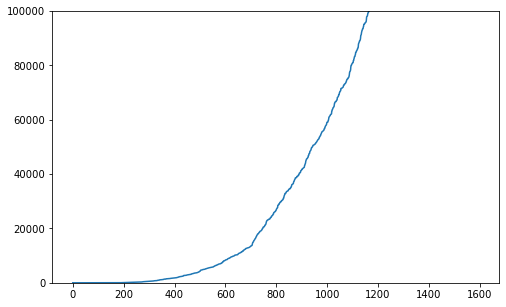

In [259]:
xaxis = np.arange(0, len(predict['YOut']),1).tolist()
yaxis = sorted(predict['YOut'])

plt.figure(figsize=(8,5))
# plt.scatter(xaxis, yaxis)
plt.plot(xaxis, yaxis)
plt.ylim((0,100000))
plt.show()

In [244]:
insertRow 

,regression,RandomForest,nearon
0,"[1.522151890486074, 0.48613447011215516]","[1.1352418912276327, 0.7141683473179159]","[1.516448630327274, 0.4899780002786759]"


In [ ]:
pd.DataFrame([[x,yy,z,a]], columns = ['regression','RandomForest','nearon','svr'])

In [ ]:
predict

# X_train

In [ ]:
# import pydot
# # Pull out one tree from the forest
# Tree = regressor.estimators_[3]
# # Export the image to a dot file
# from sklearn import tree
# plt.figure(figsize=(25,15))
# tree.plot_tree(Tree,filled=True, 
#               rounded=True, 
#               fontsize=14);

In [ ]:
X

In [349]:
compare = pd.DataFrame()
compare['test'] = yTest['G0.5M']
compare['pred'] = pred['3Range']['all']['nn']['G0.5M'].tolist()

compare = compare.sort_values(by='test', ascending=True)
compare

,test,pred
578,557463.0,[570431.25]
598,563015.0,[442455.75]
593,569184.0,[525851.3125]
61,570030.0,[622965.6875]
864,588645.0,[503243.0625]
1110,597342.0,[591305.625]
1150,616928.0,[599687.75]
297,631545.0,[755659.1875]
1405,632270.0,[677579.6875]
1125,664893.0,[592501.8125]


[Text(0.375, 0, '578'),
 Text(1.125, 0, '598'),
 Text(1.875, 0, '593'),
 Text(2.625, 0, '61'),
 Text(3.375, 0, '864'),
 Text(4.125, 0, '1110'),
 Text(4.875, 0, '1150'),
 Text(5.625, 0, '297'),
 Text(6.375, 0, '1405'),
 Text(7.125, 0, '1125'),
 Text(7.875, 0, '1159'),
 Text(8.625, 0, '377'),
 Text(9.375, 0, '806'),
 Text(10.125, 0, '81'),
 Text(10.875, 0, '639'),
 Text(11.625, 0, '1079'),
 Text(12.375, 0, '291'),
 Text(13.125, 0, '889'),
 Text(13.875, 0, '557'),
 Text(14.625, 0, '1171'),
 Text(15.375, 0, '1095'),
 Text(16.125, 0, '47'),
 Text(16.875, 0, '34'),
 Text(17.625, 0, '300'),
 Text(18.375, 0, '1355'),
 Text(19.125, 0, '845'),
 Text(19.875, 0, '96'),
 Text(20.625, 0, '566'),
 Text(21.375, 0, '1375'),
 Text(22.125, 0, '1098'),
 Text(22.875, 0, '894'),
 Text(23.625, 0, '44'),
 Text(24.375, 0, '1374')]

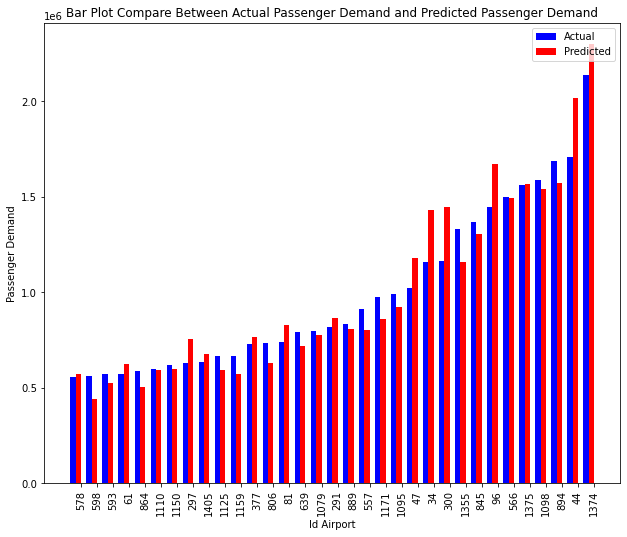

In [351]:
i = 1

# choose = ['ERROR','Method','optimizer','node']
# chooseCol = [errorMd,method,optimizer,NumNode]

DataPlot = compare

barWidth = 0.25
numRegions = compare.shape[0]
numYears = 2
groupWidth = barWidth*(numYears+1)



x = np.arange(0,numRegions*groupWidth,groupWidth)
y1 = compare['test']
y2 = compare['pred']



x_tick = x + groupWidth / 2
x_label = compare.index

fig = plt.figure(figsize=(10, 8))

ax = fig.add_axes([0.1,0.1,0.8,0.8])
ax.bar(x + 0*barWidth, y1, label = 'Actual', color = 'b', width = 0.25)
ax.bar(x + 1*barWidth, y2, label = 'Predicted', color = 'r', width = 0.25)
# ax.bar(x + 2*barWidth, y3, label = 'D', color = 'r', width = 0.25)
# ax.bar(x + 3*barWidth, y4, label = 'J', color = 'c', width = 0.25)


ax.set_xlabel('Id Airport')
ax.set_ylabel('Passenger Demand')
ax.set_title('Bar Plot Compare Between Actual Passenger Demand and Predicted Passenger Demand')

# ax.set_ylim([,30000000])
ax.legend(loc='upper right')

ax.set_xticks(x_tick)
ax.set_xticklabels(x_label, rotation=90)



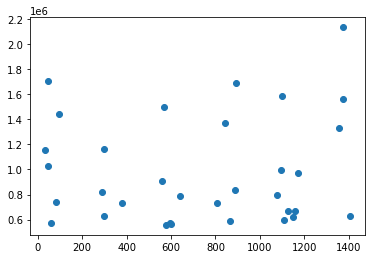

In [342]:
# plt.scatter(xaxis, yaxis)
plt.scatter(compare.index, compare['test'])
# plt.ylim((130000,2000000))
plt.show()

In [ ]:
def Checknearon(X_train, y_train,div,method,opt,Typeerror,node):
    
    print(Typeerror.lower())
    
    if opt == "":
        opt = 'adam'
        
    if method == "":
        method = 'linear'
    

    early_stopping_monitor = EarlyStopping(
        monitor='loss',
        patience=10, 
    #     mode='max'
    )
    
    tmp = Typeerror.lower()
    if (len(tmp) == 4):
        tmp = 'mse'
    
    

    model = Sequential()

    model.add(Dense(node,input_dim = 12, activation=method))
#     model.add(Dense(units = 11 , activation=method))

    model.add(Dense(node/2, activation=method))
    model.add(Dense(node/4, activation=method))

    model.add(Dense(1 ,activation=method))

    model.compile(loss=tmp, optimizer=opt, metrics=['accuracy'])

    history = model.fit(X_train, y_train,
                        batch_size=32,epochs=1000,
#                         validation_split=0.3,
                        callbacks=[early_stopping_monitor]
        
                       )
    
        
    y_pred = model.predict(X_test)
    
        
    if Typeerror == 'RMSE':
        return ([np.sqrt(metrics.mean_squared_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)],y_pred)
        
    elif Typeerror == 'MSE':
        return ([metrics.mean_squared_error(y_test,y_pred)/div,metrics.r2_score(y_test,y_pred)],y_pred)
        
    elif Typeerror == 'MAE':
        return ([(metrics.mean_absolute_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)],y_pred)
        
        
    

In [ ]:
def CheckBest(Rsquare,ValError,idx):
    
    calBestR = pd.DataFrame(Rsquare , index =idx )
    calBestE = pd.DataFrame(ValError, index =idx )
    
    
    
    calBestR['mean'] =  calBestR.mean(axis=1) 
#     calBestR['RankA'] = calBestR['A'].rank(ascending = 1) 
#     calBestR['RankB'] = calBestR['B'].rank(ascending = 1) 
#     calBestR['RankC'] = calBestR['D'].rank(ascending = 1) 
#     calBestR['RankJ'] = calBestR['J'].rank(ascending = 1) 
    
    calBestE['mean'] =  calBestE.mean(axis=1) 
#     calBestE['RankA'] = calBestE['A'].rank(ascending = 1) 
#     calBestE['RankB'] = calBestE['B'].rank(ascending = 1) 
#     calBestE['RankC'] = calBestE['D'].rank(ascending = 1) 
#     calBestE['RankJ'] = calBestE['J'].rank(ascending = 1) 
    
    
    maxR = calBestR.idxmax()['mean']
    maxE = calBestE.idxmin()['mean']
    
    
    if maxR == maxE:
        return maxR

    else:
        return maxE

#     return maxR, maxE
    
    
    

In [ ]:
def CheckBestRank(Rsquare,ValError,idx):
    
    calBestR = pd.DataFrame(Rsquare , index =idx )
    calBestE = pd.DataFrame(ValError, index =idx )
    
    
    
    calBestR['mean'] =  calBestR.mean(axis=1) 
    calBestR['RankA'] = calBestR['A'].rank(ascending = 1) 
    calBestR['RankB'] = calBestR['B'].rank(ascending = 1) 
    calBestR['RankC'] = calBestR['C'].rank(ascending = 1) 
    calBestR['RankF'] = calBestR['F'].rank(ascending = 1) 
    
    calBestE['mean'] =  calBestE.mean(axis=1) 
    calBestE['RankA'] = calBestE['A'].rank(ascending = 1) 
    calBestE['RankB'] = calBestE['B'].rank(ascending = 1) 
    calBestE['RankC'] = calBestE['C'].rank(ascending = 1) 
    calBestE['RankF'] = calBestE['F'].rank(ascending = 1) 
    
    
#     maxR = calBestR.idxmax()['mean']
#     maxE = calBestE.idxmin()['mean']
    
    
#     if maxR == maxE:
#         return maxR

#     else:
#         return maxE

    return calBestR , calBestE

In [ ]:
# CheckBest(Rsquare['Method'],Rsquare['Method'],method)

In [ ]:
featureX

In [ ]:
method = ['linear','sigmoid','tanh','relu','softmax','swish']
optimizer = ['Adagrad','Adadelta','RMSprop','Adam' ]
errorMd = ['MAE','RMSE','MSE']
NumNode = [512,256,128,64]
# summary = pd.DataFrame(columns = ['regression','RandomForest','nearon'])

Rsquare = nested_dict(3, int)
ValError = nested_dict(3, int)
                      
val = 0

for label in labels:
#     X = table[label][featureX]
#     y = table[label]['Y']
    X = predict[featureX]
    y = predict['YOut']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
    lisR = []
    lisE = []
    div = y_test.mean()
        
    for err in errorMd:
        lisR.append(Checknearon(X_train, y_train,div,"","",err,256)[0][1])
        lisE.append(Checknearon(X_train, y_train,div,"","",err,256)[0][0])
#         lisR.append(Checknearon(X_train, y_train,div,"","",err)[0])

    print()
        
    
    Rsquare['ERROR'][label] = lisR
    ValError['ERROR'][label] = lisE
    
    
soluError = CheckBest(Rsquare['ERROR'],ValError['ERROR'],errorMd)
    
for label in value['y2019']:
    X = table[label][featureX]
    y = table[label]['YOut']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
    lisR = []
    lisE = []
    div = y_test.mean()
        
    for md in method:
        lisR.append(Checknearon(X_train, y_train,div,md,"",soluError,256)[0][1])
        lisE.append(Checknearon(X_train, y_train,div,md,"",soluError,256)[0][0])
        
        
    Rsquare['Method'][label] = lisR
    ValError['Method'][label] = lisE
    
soluErrorMD = CheckBest(Rsquare['Method'],ValError['Method'],method)
    
    
for label in value['y2019']:
    X = table[label][featureX]
    y = table[label]['YOut']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
    lisR = []
    lisE = []
    div = y_test.mean()
        
    for opt in optimizer:
        lisR.append(Checknearon(X_train, y_train,div,soluErrorMD,opt,soluError,256)[0][1])
        lisE.append(Checknearon(X_train, y_train,div,soluErrorMD,opt,soluError,256)[0][0])
        
        
    Rsquare['optimizer'][label] = lisR
    ValError['optimizer'][label] = lisE
    
soluErrorOp = CheckBest(Rsquare['optimizer'],ValError['optimizer'],optimizer)
    
for label in value['y2019']:
    X = table[label][featureX]
    y = table[label]['YOut']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
    lisR = []
    lisE = []
    div = y_test.mean()
        
    for nd in NumNode:
        lisR.append(Checknearon(X_train, y_train,div,soluErrorMD,soluErrorOp,soluError,nd)[0][1])
        lisE.append(Checknearon(X_train, y_train,div,soluErrorMD,soluErrorOp,soluError,nd)[0][0])
        
        
    Rsquare['node'][label] = lisR
    ValError['node'][label] = lisE
    
soluErrorNode = CheckBest(Rsquare['node'],ValError['node'],NumNode)
    
    

    
    
    

In [ ]:
rank = pd.DataFrame([Rsquare['Method']['A'],Rsquare['Method']['B'],Rsquare['Method']['C'],Rsquare['Method']['F']], columns = method, index = ['A','B','D','J'])

In [ ]:
CheckBestRank(Rsquare['optimizer'],ValError['optimizer'],optimizer)[0]

In [ ]:
i = 1

choose = ['ERROR','Method','optimizer','node']
chooseCol = [errorMd,method,optimizer,NumNode]

CheckBest(Rsquare[choose[i]],ValError[choose[i]],chooseCol[i])[0]

In [ ]:
CheckBest(Rsquare[choose[i]],ValError[choose[i]],chooseCol[i])[1]

In [ ]:
[soluError,soluErrorMD,soluErrorOp,soluErrorNode]

In [ ]:
i = 1

choose = ['ERROR','Method','optimizer','node']
chooseCol = [errorMd,method,optimizer,NumNode]

DataPlot = pd.DataFrame([Rsquare[choose[i]]['A'],Rsquare[choose[i]]['B'],Rsquare[choose[i]]['D'],Rsquare[choose[i]]['J']], columns = chooseCol[i], index = ['A','B','D','J'])

barWidth = 0.25
numRegions = len(chooseCol[i])
numYears = 4
groupWidth = barWidth*(numYears+1)



x = np.arange(0,numRegions*groupWidth,groupWidth)
y1 = Rsquare['Method']['A']
y2 = Rsquare['Method']['B']
y3 = Rsquare['Method']['D']
y4 = Rsquare['Method']['J']


x_tick = x + groupWidth / 2
x_label = chooseCol[i]

fig = plt.figure()

ax = fig.add_axes([0.1,0.1,0.8,0.8])
ax.bar(x + 0*barWidth, y1, label = 'A', color = 'b', width = 0.25)
ax.bar(x + 1*barWidth, y2, label = 'B', color = 'g', width = 0.25)
ax.bar(x + 2*barWidth, y3, label = 'D', color = 'r', width = 0.25)
ax.bar(x + 3*barWidth, y4, label = 'J', color = 'c', width = 0.25)


ax.set_xlabel('Region')
ax.set_ylabel('Population')
ax.set_title('Method neuron')

# ax.set_ylim([,30000000])
ax.legend(loc='upper right')

ax.set_xticks(x_tick)
ax.set_xticklabels(x_label, rotation=45)

# fig.savefig('thailand_pop_multiBars.jpg')

In [ ]:
i = 1

choose = ['ERROR','Method','optimizer','node']
chooseCol = [errorMd,method,optimizer,NumNode]
barWidth = 0.35
numRegions = len(chooseCol[i])
numYears = 4
groupWidth = barWidth*(numYears+1)



x = np.arange(0,numRegions*groupWidth,groupWidth)
# y1 = Rsquare['Method']['A']
# y2 = Rsquare['Method']['B']
# y3 = Rsquare['Method']['D']
# y4 = Rsquare['Method']['J']
y1 = ValError[choose[i]]['A']
y2 = ValError[choose[i]]['B']
y3 = ValError[choose[i]]['D']
y4 = ValError[choose[i]]['J']


x_tick = x + groupWidth / 2
x_label = chooseCol[i]

fig = plt.figure()

ax = fig.add_axes([0.1,0.1,0.8,0.8])
ax.bar(x + 0*barWidth, y1, label = 'A', color = 'b', width = 0.25)
ax.bar(x + 1*barWidth, y2, label = 'B', color = 'g', width = 0.25)
ax.bar(x + 2*barWidth, y3, label = 'D', color = 'r', width = 0.25)
ax.bar(x + 3*barWidth, y4, label = 'J', color = 'c', width = 0.25)


ax.set_xlabel('Region')
ax.set_ylabel('Population')
ax.set_title('Method neuron')

# ax.set_ylim([,30000000])
ax.legend(loc='upper right')

ax.set_xticks(x_tick)
ax.set_xticklabels(x_label, rotation=45)

# fig.savefig('thailand_pop_multiBars.jpg')

In [ ]:
Rsquare['ERROR'].to_dict()

In [ ]:
ValError['ERROR'].to_dict()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
def CheckRamdomNum(X_train, y_train,div,Numtree):
    regressor = RandomForestRegressor(n_estimators = Numtree)
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    return ([(metrics.mean_absolute_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)]),y_pred

def CheckRamdomMinLeaf(X_train, y_train,div,MinLeaf):
#     print('in min')
    regressor = RandomForestRegressor(n_estimators = 7 ,min_samples_leaf = MinLeaf )
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    return ([(metrics.mean_absolute_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)]),y_pred

def CheckRamdomFeature(X_train, y_train,div,feature):
#     print("in")
    regressor = RandomForestRegressor(n_estimators = 7 ,max_features = feature )
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    return ([(metrics.mean_absolute_error(y_test,y_pred))/div,metrics.r2_score(y_test,y_pred)]),y_pred

In [ ]:
count = 0
for label in value['y2019']:
    X = table[label][featureX]
    y = table[label]['Y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=99)
    lisR = []
    lisE = []
    div = y_test.mean()
        
    for num in range(2,100):
        lisR.append(CheckRamdomNum(X_train, y_train,div,num)[0][1])
        lisE.append(CheckRamdomNum(X_train, y_train,div,num)[0][0])

    Rsquare['Numtree'][label] = lisR
    ValError['Numtree'][label] = lisE
    

    lisR = []
    lisE = [] 
    
    for num in range(2,100):
        lisR.append(CheckRamdomMinLeaf(X_train, y_train,div,num)[0][1])
        lisE.append(CheckRamdomMinLeaf(X_train, y_train,div,num)[0][0])

    Rsquare['MinLeaf'][label] = lisR
    ValError['MinLeaf'][label] = lisE
    
    lisR = []
    lisE = [] 
    
    for num in np.arange(1,8,1):

        lisR.append(CheckRamdomFeature(X_train, y_train,div,num)[0][1])
        lisE.append(CheckRamdomFeature(X_train, y_train,div,num)[0][0])

    Rsquare['Feature'][label] = lisR
    ValError['Feature'][label] = lisE
    
    
    
    
    

In [ ]:
yaxis = sorted(ValError['Numtree']['J'])
xaxis = np.arange(0, len(ValError['Numtree']['J']),1).tolist()
plt.scatter(xaxis, yaxis)
plt.show()

In [ ]:
yaxis = sorted(Rsquare['Numtree']['J'])
xaxis = np.arange(0, len(Rsquare['Numtree']['J']),1).tolist()
plt.scatter(xaxis, yaxis)
plt.show()

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_axes([0.1,0.1,0.8,0.8])
xaxis = np.arange(2,100).tolist()

line1, = ax.plot(xaxis, Rsquare['Numtree']['A'], label='A')
line1.set_color('b')  
line1.set_marker('o') 
line1.set_linestyle('--') 
line1.set_linewidth(1)  

line2, = ax.plot(xaxis, Rsquare['Numtree']['B'], label='B')
line2.set_color('g')  
line2.set_marker('o')  
line2.set_linestyle('--')  
line2.set_linewidth(1)  

line3, = ax.plot(xaxis, Rsquare['Numtree']['D'], label='D')
line3.set_color('r')  
line3.set_marker('o')  
line3.set_linestyle('--') 
line3.set_dashes([2, 2, 10, 2]) 
line3.set_linewidth(1)  

line3, = ax.plot(xaxis, Rsquare['Numtree']['J'], label='J')
line3.set_color('k')  
line3.set_marker('o') 
line3.set_linestyle('--') 
line3.set_dashes([2, 2, 10, 2]) 
line3.set_linewidth(1)  

ax.set_xlabel('Year')
ax.set_ylabel('Thailand Population')
ax.set_title('Thailand Population between 2550-2560')

# ax.set_ylim(0,25000000)

ax.set_xticks(xaxis)
ax.set_xticklabels(xaxis, rotation=45)

ax.legend()

In [ ]:
test = pd.DataFrame(ValError['Method'], index =method  )
test['mean'] = test.mean(axis=1) 
test['RankA'] = test['A'].rank(ascending = 1) 
test['RankB'] = test['B'].rank(ascending = 1) 
test['RankC'] = test['D'].rank(ascending = 1) 
test['RankJ'] = test['J'].rank(ascending = 1) 


test


In [ ]:
print(test.idxmin()['mean'])

In [ ]:
test = pd.DataFrame(Rsquare['Method'], index =method   )
test['mean'] = test.mean(axis=1) 
test['RankA'] = test['A'].rank(ascending = 1) 
test['RankB'] = test['B'].rank(ascending = 1) 
test['RankC'] = test['D'].rank(ascending = 1) 
test['RankJ'] = test['J'].rank(ascending = 1) 

test

In [ ]:
print(test.idxmax()['mean'])

In [ ]:
test.idxmax()['mean']

In [ ]:
xaxis = np.arange(0, len(predict['Y']),1).tolist()
yaxis = sorted(predict['Y'])

In [ ]:
sns.boxplot(x=predict['Y'])

In [ ]:
predict['Y'].describe()

In [ ]:
xaxis = np.arange(0, len(predict['Yout']),1).tolist()
yaxis = sorted(predict['Yout'])


# plt.scatter(xaxis, yaxis)
plt.plot(xaxis, yaxis)
# plt.ylim((130000,2000000))
plt.show()

In [ ]:
predict['Y'].describe()

In [ ]:
predict[(predict['Y'] <= 35000)  & (predict['Y'] >= 0)  ].shape

In [ ]:





# y_pred = regressor.predict(X_test)
# [np.sqrt(metrics.mean_squared_error(y_test,y_pred)),metrics.r2_score(y_test,y_pred)]


In [ ]:
# X = table[label][featureX]
# y = table[label]['Y']
# print(history.history.keys())
# # "Loss"
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'validation'], loc='upper left')
# plt.show()

In [ ]:
import seaborn as sns
plt.figure(figsize=(5, 7))


ax = sns.distplot(y, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred, hist=False, color="b", label="Fitted Values" , ax=ax)


plt.title('Actual vs Fitted Values for Price')


plt.show()
plt.close()

In [ ]:
len(featureX )

In [1]:
hel = ['ADD',
 'AKL',
 'ALA',
 'AMD',
 'AMM',
 'AMS',
 'ARN',
 'ASB',
 'ATH',
 'ATQ',
 'AUH',
 'AYT',
 'BAH',
 'BBI',
 'BFV',
 'BHY',
 'BKI',
 'BLR',
 'BNE',
 'BOM',
 'BQS',
 'BRU',
 'BUD',
 'BWN',
 'CAI',
 'CAN',
 'CCU',
 'CDG',
 'CEB',
 'CEI',
 'CEK',
 'CGK',
 'CGN',
 'CGO',
 'CGP',
 'CGQ',
 'CJJ',
 'CJU',
 'CKG',
 'CMB',
 'CNX',
 'CPH',
 'CRK',
 'CSX',
 'CTS',
 'CTU',
 'CXR',
 'CZX',
 'DAC',
 'DAD',
 'DAT',
 'DEL',
 'DLC',
 'DLI',
 'DME',
 'DMK',
 'DOH',
 'DPS',
 'DSN',
 'DUS',
 'DXB',
 'DYG',
 'DYU',
 'FCO',
 'FNJ',
 'FOC',
 'FRA',
 'FUK',
 'GAU',
 'GAY',
 'GOJ',
 'GYD',
 'HAK',
 'HAN',
 'HDY',
 'HEL',
 'HFE',
 'HGH',
 'HGN',
 'HHQ',
 'HIJ',
 'HKG',
 'HKT',
 'HND',
 'HPH',
 'HRB',
 'HRI',
 'HYD',
 'ICN',
 'IKA',
 'IKT',
 'INC',
 'ISB',
 'IST',
 'IXB',
 'IXC',
 'JAI',
 'JED',
 'JFK',
 'JHB',
 'JHG',
 'JJN',
 'JNB',
 'KBP',
 'KBV',
 'KDT',
 'KEJ',
 'KGS',
 'KHH',
 'KHI',
 'KHN',
 'KHV',
 'KIX',
 'KJA',
 'KKC',
 'KMG',
 'KOP',
 'KOS',
 'KTM',
 'KUF',
 'KUL',
 'KWE',
 'KWI',
 'KWL',
 'KZN',
 'LAX',
 'LED',
 'LGK',
 'LGW',
 'LHE',
 'LHR',
 'LHW',
 'LJG',
 'LKO',
 'LOE',
 'LPG',
 'LPQ',
 'LPT',
 'LYA',
 'LYG',
 'LYI',
 'MAA',
 'MAD',
 'MAN',
 'MAQ',
 'MCT',
 'MDL',
 'MED',
 'MEL',
 'MES',
 'MFM',
 'MHD',
 'MLE',
 'MNL',
 'MUC',
 'MWX',
 'MXP',
 'NAG',
 'NAW',
 'NBK',
 'NBO',
 'NGB',
 'NGO',
 'NKG',
 'NNG',
 'NNT',
 'NRT',
 'NST',
 'NUE',
 'NYT',
 'NYU',
 'OKA',
 'OSL',
 'OVB',
 'PAE',
 'PBH',
 'PEE',
 'PEK',
 'PEN',
 'PER',
 'PGM',
 'PHS',
 'PHY',
 'PKX',
 'PKZ',
 'PLM',
 'PNH',
 'PNQ',
 'PQC',
 'PRH',
 'PUS',
 'PVG',
 'REP',
 'RGN',
 'RHO',
 'RKT',
 'RMQ',
 'ROI',
 'RUN',
 'SDJ',
 'SEZ',
 'SGN',
 'SHE',
 'SHJ',
 'SIN',
 'SJW',
 'SKD',
 'SNO',
 'SUB',
 'SVO',
 'SVX',
 'SWA',
 'SYD',
 'SYX',
 'SYZ',
 'SZX',
 'TAE',
 'TAO',
 'TAS',
 'TDX',
 'THD',
 'THR',
 'THS',
 'TLV',
 'TNA',
 'TNR',
 'TPE',
 'TSE',
 'TSN',
 'TST',
 'TSV',
 'TXL',
 'TYN',
 'UBP',
 'UFA',
 'ULN',
 'UNN',
 'URC',
 'URT',
 'USM',
 'UTH',
 'VIE',
 'VII',
 'VKO',
 'VNS',
 'VTE',
 'VVO',
 'WEF',
 'WNZ',
 'WUH',
 'WUS',
 'WUT',
 'WUX',
 'XIY',
 'XMN',
 'XNN',
 'XUZ',
 'YCU',
 'YIW',
 'YNT',
 'YTY',
 'ZGC',
 'ZHA',
 'ZRH',
 'ZVK',
 'ZYI']

In [12]:
pp = pd.DataFrame(index = hel).join(region)
pp

,Global Region,Country Name
ADD,Africa,Ethiopia
AKL,Australasia,New Zealand
ALA,Asia,Kazakhstan
AMD,Asia,India
AMM,Middle East,Jordan
...,...,...
ZGC,Europe,Croatia
ZHA,Asia,China
ZRH,Europe,Switzerland
ZVK,Asia,Laos


In [15]:
pp['Global Region'].value_counts()

Asia                  184
Europe                 29
Russian Federation     18
Middle East            16
Africa                  7
Australasia             6
North America           4
South America           1
Name: Global Region, dtype: int64

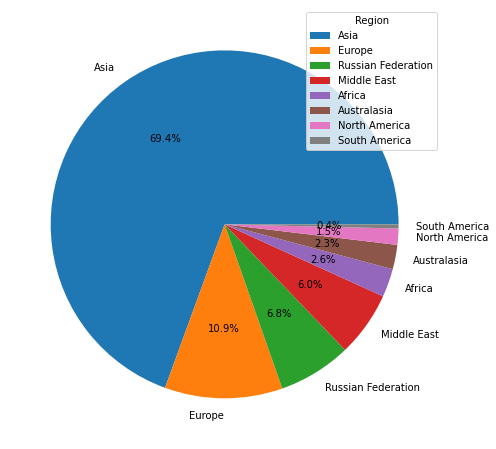

In [28]:
import matplotlib.pyplot as plt
import numpy as np

y = np.array([184, 29, 18, 16,7,6,4,1])
mylabels = ["Asia", "Europe", "Russian Federation", "Middle East",'Africa','Australasia','North America','South America']

plt.figure(figsize=(15,8))
plt.pie(y, labels = mylabels, autopct='%1.1f%%')
plt.legend(title = "Region")
plt.show() 